# Data and Molecular Fingerprint Driven Machine Learning Approaches to Halogen Bonding
## Authors: Daniel P. Devore and Kevin L. Shuford
### Code provided by: Daniel P. Devore

This notebook is used to supplement the article titled "Data and Molecular Fingerprint Driven Machine Learning Approaches to Halogen Bonding" in the PLACE JOURNAL TITLE HERE  Journal (DOI: doi.org/...). The machine learning analysis techniques utilized to determine the most effective substituent in halogen bond donors and the location to where the substituent placed on a benzene ring is walked through in detail below. 

## Python Libraries Implemented
The pandas library was utilized for the data manipulation, while the machine learning algorithms were implemented through the sci-kit Learn Python library. All plots and charts were generated through the use of the matplotlib and seaborn libraries. The rdkit library was used to convert the SMILES language into a computer readable format and to determine the molecular fingerprints of each halogen bond donor.

In [2]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit import DataStructs
from rdkit.Chem import AllChem
from matplotlib import rcParams
import matplotlib.pyplot as plt

In [3]:
rcParams['figure.figsize'] = 20,20

## Import The Halogen Bonding Data

In [4]:
# Benzene Data
BCl_df = pd.read_csv('Data/BCl_all_substituent.csv', index_col = "Donor")
BBr_df = pd.read_csv('Data/BBr_all_substituent.csv', index_col = "Donor")
BI_df = pd.read_csv('Data/BI_all_substituent.csv', index_col = "Donor")
BAt_df = pd.read_csv('Data/BAt_all_substituent.csv', index_col = "Donor")
BX_df = pd.read_csv('Data/BX_all_substituent.csv', index_col = "Donor")

# Ethynyl Benzene Data
BACl_df = pd.read_csv('Data/BACl_all_substituent.csv', index_col = "Donor")
BABr_df = pd.read_csv('Data/BABr_all_substituent.csv', index_col = "Donor")
BAI_df = pd.read_csv('Data/BAI_all_substituent.csv', index_col = "Donor")
BAAt_df = pd.read_csv('Data/BAAt_all_substituent.csv', index_col = "Donor")
BAX_df = pd.read_csv('Data/BAX_all_substituent.csv', index_col = "Donor")

# All XB Data
All_XB = pd.read_csv('Data/All_XB_all_substituent.csv', index_col = "Donor")

In [5]:
# Benzene Columns
BCl_col = BCl_df.columns
BBr_col = BBr_df.columns
BI_col = BI_df.columns
BAt_col = BAt_df.columns
BX_col = BX_df.columns

# Ethynyl Benzene Columns
BACl_col = BACl_df.columns
BABr_col = BABr_df.columns
BAI_col = BAI_df.columns
BAAt_col = BAAt_df.columns
BAX_col = BAX_df.columns

# All XB
XB_col = All_XB.columns

## Feature Selection

Due to the number of large number of features for each XB donor/complex, the number of features that would be useful for the machine learning algorithms must be narrowed down. Therefore, the Recursive Feature Elimination (RFE) method from the sklearn library package was implemented to remove the unnecessary features and keep the most usefull features in the algorithms.

In order to run the feature selection method, the non-numerical objects such as the principal halogen atom, must be turned into an integer using the label encoder function in sklearn. The features that also do not contain anythin also have to be removed. In addition, the target features (what we want to predict) need to be defined. For each individual halogen atoms, V$_{S,max}$, E$_{bind}$, and k$^{a}_{X\cdots N}$ are what we want to predict, and are therefore the targeted features. The principal halogen atom will be the targeted feature for the total halo-(ethynyl)benzene dataset.

### Feature Columns

In [6]:
# View the columns of the data sets and the indices
for a,b in enumerate(BCl_col):
    print(a,b)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 Complex Symmetry
11 R$^{complex}_{C-X}$
12 $\Delta$R$_{C-X}$
13 k$^{a}$$^{complex}$$_{C-X}$
14 $\Delta$k$^{a}_{C-X}$
15 $\mu^{complex}_{C-X}$
16 R$^{complex}_{C\equiv C}$
17 R$_{X\cdots N}$
18 k$^{a}_{X\cdots N}$
19 $\mu_{X\cdots N}$
20 $\rho^{BCP}$
21 G(r)$^{BCP}$
22 K(r)$^{BCP}$
23 V(r)$^{BCP}$
24 $\nabla^{2} \rho^{BCP}$
25 H(r)$^{BCP}$
26 RDG
27 sign$\lambda_{2}* \rho$
28 E$_{int}$
29 E$_{bind}$
30 E$^{CP}_{int}$
31 E$^{CP}_{bind}$
32 E$^{donor}_{def}$
33 E$^{NH_3}_{def}$
34 E(2)
35 $\Delta \rho$


In [7]:
for a,b in enumerate(BBr_col):
    print(a,b)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 Complex Symmetry
11 R$^{complex}_{C-X}$
12 $\Delta$R$_{C-X}$
13 k$^{a}$$^{complex}$$_{C-X}$
14 $\Delta$k$^{a}_{C-X}$
15 $\mu^{complex}_{C-X}$
16 R$_{X\cdots N}$
17 k$^{a}_{X\cdots N}$
18 $\mu_{X\cdots N}$
19 $\rho^{BCP}$
20 G(r)$^{BCP}$
21 K(r)$^{BCP}$
22 V(r)$^{BCP}$
23 $\nabla^{2} \rho^{BCP}$
24 H(r)$^{BCP}$
25 RDG
26 sign$\lambda_{2}* \rho$
27 E$_{int}$
28 E$_{bind}$
29 E$^{CP}_{int}$
30 E$^{CP}_{bind}$
31 E$^{donor}_{def}$
32 E$^{NH_3}_{def}$
33 E(2)
34 $\Delta \rho$


In [8]:
for a,b in enumerate(BI_col):
    print(a,b)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 Complex Symmetry
11 R$^{complex}_{C-X}$
12 $\Delta$R$_{C-X}$
13 k$^{a}$$^{complex}$$_{C-X}$
14 $\Delta$k$^{a}_{C-X}$
15 $\mu^{complex}_{C-X}$
16 R$_{X\cdots N}$
17 k$^{a}_{X\cdots N}$
18 $\mu_{X\cdots N}$
19 $\rho^{BCP}$
20 G(r)$^{BCP}$
21 K(r)$^{BCP}$
22 V(r)$^{BCP}$
23 $\nabla^{2} \rho^{BCP}$
24 H(r)$^{BCP}$
25 RDG
26 sign$\lambda_{2}* \rho$
27 E$_{int}$
28 E$_{bind}$
29 E$^{CP}_{int}$
30 E$^{CP}_{bind}$
31 E$^{donor}_{def}$
32 E$^{NH_3}_{def}$
33 E(2)
34 $\Delta \rho$


In [9]:
for a,b in enumerate(BAt_col):
    print(a,b)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 Complex Symmetry
11 R$^{complex}_{C-X}$
12 $\Delta$R$_{C-X}$
13 k$^{a}$$^{complex}$$_{C-X}$
14 $\Delta$k$^{a}_{C-X}$
15 $\mu^{complex}_{C-X}$
16 R$_{X\cdots N}$
17 k$^{a}_{X\cdots N}$
18 $\mu_{X\cdots N}$
19 $\rho^{BCP}$
20 G(r)$^{BCP}$
21 K(r)$^{BCP}$
22 V(r)$^{BCP}$
23 $\nabla^{2} \rho^{BCP}$
24 H(r)$^{BCP}$
25 RDG
26 sign$\lambda_{2}* \rho$
27 E$_{int}$
28 E$_{bind}$
29 E$^{CP}_{int}$
30 E$^{CP}_{bind}$
31 E$^{donor}_{def}$
32 E$^{NH_3}_{def}$
33 E(2)
34 $\Delta \rho$


In [10]:
for a,b in enumerate(BX_col):
    print(a,b)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 Complex Symmetry
11 R$^{complex}_{C-X}$
12 $\Delta$R$_{C-X}$
13 k$^{a}$$^{complex}$$_{C-X}$
14 $\Delta$k$^{a}_{C-X}$
15 $\mu^{complex}_{C-X}$
16 R$^{complex}_{C\equiv C}$
17 R$_{X\cdots N}$
18 k$^{a}_{X\cdots N}$
19 $\mu_{X\cdots N}$
20 $\rho^{BCP}$
21 G(r)$^{BCP}$
22 K(r)$^{BCP}$
23 V(r)$^{BCP}$
24 $\nabla^{2} \rho^{BCP}$
25 H(r)$^{BCP}$
26 RDG
27 sign$\lambda_{2}* \rho$
28 E$_{int}$
29 E$_{bind}$
30 E$^{CP}_{int}$
31 E$^{CP}_{bind}$
32 E$^{donor}_{def}$
33 E$^{NH_3}_{def}$
34 E(2)
35 $\Delta \rho$


In [11]:
for c,d in enumerate(BACl_col):
    print(c,d)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 R$^{donor}_{C\equiv C}$
11 k$^{a}$$^{donor}$$_{C\equiv C}$
12 $\mu^{donor}_{C\equiv C}$
13 Complex Symmetry
14 R$^{complex}_{C-X}$
15 $\Delta$R$_{C-X}$
16 k$^{a}$$^{complex}$$_{C-X}$
17 $\Delta$k$^{a}_{C-X}$
18 $\mu^{complex}_{C-X}$
19 R$^{complex}_{C\equiv C}$
20 $\Delta$R$_{C\equiv C}$
21 k$^{a}$$^{complex}$$_{C\equiv C}$
22 $\Delta$k$^{a}_{C\equiv C}$
23 $\mu^{complex}_{C\equiv C}$
24 R$_{X\cdots N}$
25 k$^{a}_{X\cdots N}$
26 $\mu_{X\cdots N}$
27 $\rho^{BCP}$
28 G(r)$^{BCP}$
29 K(r)$^{BCP}$
30 V(r)$^{BCP}$
31 $\nabla^{2} \rho^{BCP}$
32 H(r)$^{BCP}$
33 RDG
34 sign$\lambda_{2}* \rho$
35 E$_{int}$
36 E$_{bind}$
37 E$^{CP}_{int}$
38 E$^{CP}_{bind}$
39 E$^{donor}_{def}$
40 E$^{NH_3}_{def}$
41 E(2)
42 $\Delta \rho$


In [12]:
for c,d in enumerate(BABr_col):
    print(c,d)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 R$^{donor}_{C\equiv C}$
11 k$^{a}$$^{donor}$$_{C\equiv C}$
12 $\mu^{donor}_{C\equiv C}$
13 Complex Symmetry
14 R$^{complex}_{C-X}$
15 $\Delta$R$_{C-X}$
16 k$^{a}$$^{complex}$$_{C-X}$
17 $\Delta$k$^{a}_{C-X}$
18 $\mu^{complex}_{C-X}$
19 R$^{complex}_{C\equiv C}$
20 $\Delta$R$_{C\equiv C}$
21 k$^{a}$$^{complex}$$_{C\equiv C}$
22 $\Delta$k$^{a}_{C\equiv C}$
23 $\mu^{complex}_{C\equiv C}$
24 R$_{X\cdots N}$
25 k$^{a}_{X\cdots N}$
26 $\mu_{X\cdots N}$
27 $\rho^{BCP}$
28 G(r)$^{BCP}$
29 K(r)$^{BCP}$
30 V(r)$^{BCP}$
31 $\nabla^{2} \rho^{BCP}$
32 H(r)$^{BCP}$
33 RDG
34 sign$\lambda_{2}* \rho$
35 E$_{int}$
36 E$_{bind}$
37 E$^{CP}_{int}$
38 E$^{CP}_{bind}$
39 E$^{donor}_{def}$
40 E$^{NH_3}_{def}$
41 E(2)
42 $\Delta \rho$


In [13]:
for c,d in enumerate(BAI_col):
    print(c,d)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 R$^{donor}_{C\equiv C}$
11 k$^{a}$$^{donor}$$_{C\equiv C}$
12 $\mu^{donor}_{C\equiv C}$
13 Complex Symmetry
14 R$^{complex}_{C-X}$
15 $\Delta$R$_{C-X}$
16 k$^{a}$$^{complex}$$_{C-X}$
17 $\Delta$k$^{a}_{C-X}$
18 $\mu^{complex}_{C-X}$
19 R$^{complex}_{C\equiv C}$
20 $\Delta$R$_{C\equiv C}$
21 k$^{a}$$^{complex}$$_{C\equiv C}$
22 $\Delta$k$^{a}_{C\equiv C}$
23 $\mu^{complex}_{C\equiv C}$
24 R$_{X\cdots N}$
25 k$^{a}_{X\cdots N}$
26 $\mu_{X\cdots N}$
27 $\rho^{BCP}$
28 G(r)$^{BCP}$
29 K(r)$^{BCP}$
30 V(r)$^{BCP}$
31 $\nabla^{2} \rho^{BCP}$
32 H(r)$^{BCP}$
33 RDG
34 sign$\lambda_{2}* \rho$
35 E$_{int}$
36 E$_{bind}$
37 E$^{CP}_{int}$
38 E$^{CP}_{bind}$
39 E$^{donor}_{def}$
40 E$^{NH_3}_{def}$
41 E(2)
42 $\Delta \rho$


In [14]:
for c,d in enumerate(BAAt_col):
    print(c,d)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 R$^{donor}_{C\equiv C}$
11 k$^{a}$$^{donor}$$_{C\equiv C}$
12 $\mu^{donor}_{C\equiv C}$
13 Complex Symmetry
14 R$^{complex}_{C-X}$
15 $\Delta$R$_{C-X}$
16 k$^{a}$$^{complex}$$_{C-X}$
17 $\Delta$k$^{a}_{C-X}$
18 $\mu^{complex}_{C-X}$
19 R$^{complex}_{C\equiv C}$
20 $\Delta$R$_{C\equiv C}$
21 k$^{a}$$^{complex}$$_{C\equiv C}$
22 $\Delta$k$^{a}_{C\equiv C}$
23 $\mu^{complex}_{C\equiv C}$
24 R$_{X\cdots N}$
25 k$^{a}_{X\cdots N}$
26 $\mu_{X\cdots N}$
27 $\rho^{BCP}$
28 G(r)$^{BCP}$
29 K(r)$^{BCP}$
30 V(r)$^{BCP}$
31 $\nabla^{2} \rho^{BCP}$
32 H(r)$^{BCP}$
33 RDG
34 sign$\lambda_{2}* \rho$
35 E$_{int}$
36 E$_{bind}$
37 E$^{CP}_{int}$
38 E$^{CP}_{bind}$
39 E$^{donor}_{def}$
40 E$^{NH_3}_{def}$
41 E(2)
42 $\Delta \rho$


In [15]:
for c,d in enumerate(BAX_col):
    print(c,d)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 R$^{donor}_{C\equiv C}$
11 k$^{a}$$^{donor}$$_{C\equiv C}$
12 $\mu^{donor}_{C\equiv C}$
13 Complex Symmetry
14 R$^{complex}_{C-X}$
15 $\Delta$R$_{C-X}$
16 k$^{a}$$^{complex}$$_{C-X}$
17 $\Delta$k$^{a}_{C-X}$
18 $\mu^{complex}_{C-X}$
19 R$^{complex}_{C\equiv C}$
20 $\Delta$R$_{C\equiv C}$
21 k$^{a}$$^{complex}$$_{C\equiv C}$
22 $\Delta$k$^{a}_{C\equiv C}$
23 $\mu^{complex}_{C\equiv C}$
24 R$_{X\cdots N}$
25 k$^{a}_{X\cdots N}$
26 $\mu_{X\cdots N}$
27 $\rho^{BCP}$
28 G(r)$^{BCP}$
29 K(r)$^{BCP}$
30 V(r)$^{BCP}$
31 $\nabla^{2} \rho^{BCP}$
32 H(r)$^{BCP}$
33 RDG
34 sign$\lambda_{2}* \rho$
35 E$_{int}$
36 E$_{bind}$
37 E$^{CP}_{int}$
38 E$^{CP}_{bind}$
39 E$^{donor}_{def}$
40 E$^{NH_3}_{def}$
41 E(2)
42 $\Delta \rho$


In [16]:
for e,f in enumerate(XB_col):
    print(e,f)

0 molecule
1 interacting halogen
2 ortho
3 meta
4 para
5 V$_{S}$$_{max}$
6 V$_{max}$(r)
7 R$^{donor}_{C-X}$
8 k$^{a}$$^{donor}$$_{C-X}$
9 $\mu^{donor}_{C-X}$
10 Complex Symmetry
11 R$^{complex}_{C-X}$
12 $\Delta$R$_{C-X}$
13 k$^{a}$$^{complex}$$_{C-X}$
14 $\Delta$k$^{a}_{C-X}$
15 $\mu^{complex}_{C-X}$
16 R$^{complex}_{C\equiv C}$
17 R$_{X\cdots N}$
18 k$^{a}_{X\cdots N}$
19 $\mu_{X\cdots N}$
20 $\rho^{BCP}$
21 G(r)$^{BCP}$
22 K(r)$^{BCP}$
23 V(r)$^{BCP}$
24 $\nabla^{2} \rho^{BCP}$
25 H(r)$^{BCP}$
26 RDG
27 sign$\lambda_{2}* \rho$
28 E$_{int}$
29 E$_{bind}$
30 E$^{CP}_{int}$
31 E$^{CP}_{bind}$
32 E$^{donor}_{def}$
33 E$^{NH_3}_{def}$
34 E(2)
35 $\Delta \rho$
36 R$^{donor}_{C\equiv C}$
37 k$^{a}$$^{donor}$$_{C\equiv C}$
38 $\mu^{donor}_{C\equiv C}$
39 $\Delta$R$_{C\equiv C}$
40 k$^{a}$$^{complex}$$_{C\equiv C}$
41 $\Delta$k$^{a}_{C\equiv C}$
42 $\mu^{complex}_{C\equiv C}$


### Data Pre-proccessing

In [17]:
from sklearn.preprocessing import LabelEncoder

#### Separating Data

In [18]:
# Split dataframes into features and targets
# Remove object features and target features from feature data
# Vmax, Ebind, kXN are target features for each halogen
# Principal halogen atom is target feature for total data

# Benzene

# Features

# Chlorine
BCl_Vmax_feat = BCl_df.drop(BCl_col[0:6], axis = 1).drop(BCl_col[10], axis = 1)\
.dropna(axis = 1, how = 'any')

BCl_Ebind_feat = BCl_df.drop(BCl_col[0:5], axis = 1).drop(BCl_col[10], axis = 1)\
.drop(BCl_col[28:32], axis = 1).dropna(axis = 1, how = 'any')

BCl_kXN_feat = BCl_df.drop(BCl_col[0:5], axis = 1).drop(BCl_col[10], axis = 1)\
.drop(BCl_col[18], axis = 1).dropna(axis = 1, how = 'any')

# Bromine
BBr_Vmax_feat = BBr_df.drop(BBr_col[0:6], axis = 1).drop(BBr_col[10], axis = 1)\
.dropna(axis = 1, how = 'any')

BBr_Ebind_feat = BBr_df.drop(BBr_col[0:5], axis = 1).drop(BBr_col[10], axis = 1)\
.drop(BBr_col[27:31], axis = 1).dropna(axis = 1, how = 'any')

BBr_kXN_feat = BBr_df.drop(BBr_col[0:5], axis = 1).drop(BBr_col[10], axis = 1)\
.drop(BBr_col[17], axis = 1).dropna(axis = 1, how = 'any')

# Iodine
BI_Vmax_feat = BI_df.drop(BI_col[0:6], axis = 1).drop(BI_col[10], axis = 1)\
.dropna(axis = 1, how = 'any')

BI_Ebind_feat = BI_df.drop(BI_col[0:5], axis = 1).drop(BI_col[10], axis = 1)\
.drop(BI_col[27:31], axis = 1).dropna(axis = 1, how = 'any')

BI_kXN_feat = BI_df.drop(BI_col[0:5], axis = 1).drop(BI_col[10], axis = 1)\
.drop(BI_col[17], axis = 1).dropna(axis = 1, how = 'any')

# Astatine
BAt_Vmax_feat = BAt_df.drop(BAt_col[0:6], axis = 1).drop(BAt_col[10], axis = 1)\
.dropna(axis = 1, how = 'any')

BAt_Ebind_feat = BAt_df.drop(BAt_col[0:5], axis = 1).drop(BAt_col[10], axis = 1)\
.drop(BAt_col[27:31], axis = 1).dropna(axis = 1, how = 'any')

BAt_kXN_feat = BAt_df.drop(BAt_col[0:5], axis = 1).drop(BAt_col[10], axis = 1)\
.drop(BAt_col[17], axis = 1).dropna(axis = 1, how = 'any')

# All halogens
BX_feat = BX_df.drop(BX_col[0:5], axis = 1).drop(BX_col[10], axis = 1)\
.drop(BX_col[28], axis = 1).drop(BX_col[30:32], axis = 1).dropna(axis = 1, how = 'any')

BX_Vmax_feat = BX_df.drop(BX_col[0:6], axis = 1).drop(BX_col[10], axis = 1)\
.dropna(axis = 1, how = 'any')

BX_Ebind_feat = BX_df.drop(BX_col[0:5], axis = 1).drop(BX_col[10], axis = 1)\
.drop(BX_col[28:32], axis = 1).dropna(axis = 1, how = 'any')

BX_kXN_feat = BX_df.drop(BX_col[0:5], axis = 1).drop(BX_col[10], axis = 1)\
.drop(BX_col[18], axis = 1).dropna(axis = 1, how = 'any')

# Targets

# Chlorine
BCl_Vmax_targ = BCl_df.drop(BCl_col[0:5], axis = 1).drop(BCl_col[6:], axis = 1)
BCl_Ebind_targ = BCl_df.drop(BCl_col[0:29], axis = 1).drop(BCl_col[30:], axis = 1)
BCl_kXN_targ = BCl_df.drop(BCl_col[0:18], axis = 1).drop(BCl_col[19:], axis = 1)

# Bromine
BBr_Vmax_targ = BBr_df.drop(BBr_col[0:5], axis = 1).drop(BBr_col[6:], axis = 1)
BBr_Ebind_targ = BBr_df.drop(BBr_col[0:28], axis = 1).drop(BBr_col[29:], axis = 1)
BBr_kXN_targ = BBr_df.drop(BBr_col[0:17], axis = 1).drop(BBr_col[18:], axis = 1)

# Iodine
BI_Vmax_targ = BI_df.drop(BI_col[0:5], axis = 1).drop(BI_col[6:], axis = 1)
BI_Ebind_targ = BI_df.drop(BI_col[0:28], axis = 1).drop(BI_col[29:], axis = 1)
BI_kXN_targ = BI_df.drop(BI_col[0:17], axis = 1).drop(BI_col[18:], axis = 1)

# Astatine
BAt_Vmax_targ = BAt_df.drop(BAt_col[0:5], axis = 1).drop(BAt_col[6:], axis = 1)
BAt_Ebind_targ = BAt_df.drop(BAt_col[0:28], axis = 1).drop(BAt_col[29:], axis = 1)
BAt_kXN_targ = BAt_df.drop(BAt_col[0:17], axis = 1).drop(BAt_col[18:], axis = 1)

# All Halogens
BX_hal_targ = BX_df.drop(BX_col[0], axis = 1).drop(BX_col[2:], axis = 1)
BX_Vmax_targ = BX_df.drop(BX_col[0:5], axis = 1).drop(BX_col[6:], axis = 1)
BX_Ebind_targ = BX_df.drop(BX_col[0:29], axis = 1).drop(BX_col[30:], axis = 1)
BX_kXN_targ = BX_df.drop(BX_col[0:18], axis = 1).drop(BX_col[19:], axis = 1)

In [19]:
# Split dataframes into features and targets
# Remove object features and target features from feature data
# Vmax, Ebind, kXN are target features for each halogen
# Principal halogen atom is target feature for total data

# Ethynyl Benzene

# Features

# Chlorine
BACl_Vmax_feat = BACl_df.drop(BACl_col[0:6], axis = 1).drop(BACl_col[13], axis = 1)\
.dropna(axis = 1, how = 'any')

BACl_Ebind_feat = BACl_df.drop(BACl_col[0:5], axis = 1).drop(BACl_col[13], axis = 1)\
.drop(BACl_col[35:39], axis = 1).dropna(axis = 1, how = 'any')

BACl_kXN_feat = BACl_df.drop(BACl_col[0:5], axis = 1).drop(BACl_col[13], axis = 1)\
.drop(BACl_col[25], axis = 1).dropna(axis = 1, how = 'any')

# Bromine
BABr_Vmax_feat = BABr_df.drop(BABr_col[0:6], axis = 1).drop(BABr_col[13], axis = 1)\
.dropna(axis = 1, how = 'any')

BABr_Ebind_feat = BABr_df.drop(BABr_col[0:5], axis = 1).drop(BABr_col[13], axis = 1)\
.drop(BABr_col[35:39], axis = 1).dropna(axis = 1, how = 'any')

BABr_kXN_feat = BABr_df.drop(BABr_col[0:5], axis = 1).drop(BABr_col[13], axis = 1)\
.drop(BABr_col[25], axis = 1).dropna(axis = 1, how = 'any')

# Iodine
BAI_Vmax_feat = BAI_df.drop(BAI_col[0:6], axis = 1).drop(BAI_col[13], axis = 1)\
.dropna(axis = 1, how = 'any')

BAI_Ebind_feat = BAI_df.drop(BAI_col[0:5], axis = 1).drop(BAI_col[13], axis = 1)\
.drop(BAI_col[35:39], axis = 1).dropna(axis = 1, how = 'any')

BAI_kXN_feat = BAI_df.drop(BAI_col[0:5], axis = 1).drop(BAI_col[13], axis = 1)\
.drop(BAI_col[25], axis = 1).dropna(axis = 1, how = 'any')

# Astatine
BAAt_Vmax_feat = BAAt_df.drop(BAAt_col[0:6], axis = 1).drop(BAAt_col[13], axis = 1)\
.dropna(axis = 1, how = 'any')

BAAt_Ebind_feat = BAAt_df.drop(BAAt_col[0:5], axis = 1).drop(BAAt_col[13], axis = 1)\
.drop(BAAt_col[35:39], axis = 1).dropna(axis = 1, how = 'any')

BAAt_kXN_feat = BAAt_df.drop(BAAt_col[0:5], axis = 1).drop(BAAt_col[13], axis = 1)\
.drop(BAAt_col[25], axis = 1).dropna(axis = 1, how = 'any')

# All halogens
BAX_feat = BAX_df.drop(BAX_col[0:5], axis = 1).drop(BAX_col[13], axis = 1)\
.drop(BAX_col[35], axis = 1).drop(BAX_col[37:39], axis = 1).dropna(axis = 1, how = 'any')

BAX_Vmax_feat = BAX_df.drop(BAX_col[0:6], axis = 1).drop(BAX_col[13], axis = 1)\
.dropna(axis = 1, how = 'any')

BAX_Ebind_feat = BAX_df.drop(BAX_col[0:5], axis = 1).drop(BAX_col[13], axis = 1)\
.drop(BAX_col[35:39], axis = 1).dropna(axis = 1, how = 'any')

BAX_kXN_feat = BAX_df.drop(BAX_col[0:5], axis = 1).drop(BAX_col[13], axis = 1)\
.drop(BAX_col[25], axis = 1).dropna(axis = 1, how = 'any')

# Targets

# Chlorine
BACl_Vmax_targ = BACl_df.drop(BACl_col[0:5], axis = 1).drop(BACl_col[6:], axis = 1)
BACl_Ebind_targ = BACl_df.drop(BACl_col[0:36], axis = 1).drop(BACl_col[37:], axis = 1)
BACl_kXN_targ = BACl_df.drop(BACl_col[0:25], axis = 1).drop(BACl_col[26:], axis = 1)

# Bromine
BABr_Vmax_targ = BABr_df.drop(BABr_col[0:5], axis = 1).drop(BABr_col[6:], axis = 1)
BABr_Ebind_targ = BABr_df.drop(BABr_col[0:36], axis = 1).drop(BABr_col[37:], axis = 1)
BABr_kXN_targ = BABr_df.drop(BABr_col[0:25], axis = 1).drop(BABr_col[26:], axis = 1)

# Iodine
BAI_Vmax_targ = BAI_df.drop(BAI_col[0:5], axis = 1).drop(BAI_col[6:], axis = 1)
BAI_Ebind_targ = BAI_df.drop(BAI_col[0:36], axis = 1).drop(BAI_col[37:], axis = 1)
BAI_kXN_targ = BAI_df.drop(BAI_col[0:25], axis = 1).drop(BAI_col[26:], axis = 1)

# Astatine
BAAt_Vmax_targ = BAAt_df.drop(BAAt_col[0:5], axis = 1).drop(BAAt_col[6:], axis = 1)
BAAt_Ebind_targ = BAAt_df.drop(BAAt_col[0:36], axis = 1).drop(BAAt_col[37:], axis = 1)
BAAt_kXN_targ = BAAt_df.drop(BAAt_col[0:25], axis = 1).drop(BAAt_col[26:], axis = 1)

# All Halogens
BAX_hal_targ = BAX_df.drop(BAX_col[0], axis = 1).drop(BAX_col[2:], axis = 1)
BAX_Vmax_targ = BAX_df.drop(BAX_col[0:5], axis = 1).drop(BAX_col[6:], axis = 1)
BAX_Ebind_targ = BAX_df.drop(BAX_col[0:36], axis = 1).drop(BAX_col[37:], axis = 1)
BAX_kXN_targ = BAX_df.drop(BAX_col[0:25], axis = 1).drop(BAX_col[26:], axis = 1)

In [20]:
# All XB data
XB_Vmax_targ = All_XB.drop(XB_col[0:5], axis = 1).drop(XB_col[6:], axis = 1)
XB_Ebind_targ = All_XB.drop(XB_col[0:29], axis = 1).drop(XB_col[30:], axis = 1)
XB_kXN_targ = All_XB.drop(XB_col[0:18], axis = 1).drop(XB_col[19:], axis = 1)

#### Encoding Labels

##### Initiating Encoders

In [21]:
# Benzene
# Encode Principal Halogen Atom

# All Halogen
BX_le_hal = LabelEncoder()

# Ethynyl Benzene

# All Halogen
BAX_le_hal = LabelEncoder()

##### Adding Labels and Removing definitions

In [22]:
# Adding Labels
# Add labels for Principal Halogen Atom

# Benzene

# All Halogens
BX_hal_targ['halogen_label'] = BX_le_hal.fit_transform(BX_hal_targ['interacting halogen'])

# Ethynyl Benzene

# All Halogens
BAX_hal_targ['halogen_label'] = BAX_le_hal.fit_transform(BAX_hal_targ['interacting halogen'])

In [23]:
# Creating Dictionaries

# Benzene

# All Halogen
BX_hal_dict = BX_hal_targ.set_index('halogen_label').T.to_dict('list')

# Ethynyl Benzene

# All Halogen
BAX_hal_dict = BAX_hal_targ.set_index('halogen_label').T.to_dict('list')

/var/folders/yv/7dy8h8zx77sfhs898pcqqglnvcxqs2/T/ipykernel_91830/2677221005.py:6: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  BX_hal_dict = BX_hal_targ.set_index('halogen_label').T.to_dict('list')
/var/folders/yv/7dy8h8zx77sfhs898pcqqglnvcxqs2/T/ipykernel_91830/2677221005.py:11: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  BAX_hal_dict = BAX_hal_targ.set_index('halogen_label').T.to_dict('list')


In [24]:
# Creating labels list for later use

# Benzene

# All halogen
BX_hal_label_lst = [itm[1][0] for itm in BX_hal_dict.items()]

# Ethynyl Benzene

# All halogen
BAX_hal_label_lst = [itm[1][0] for itm in BAX_hal_dict.items()]

In [25]:
# Sort labels

# Benzene

# All halogen
BX_hal_label_lst.sort()

# Ethynyl Benzene

# All halogen
BAX_hal_label_lst.sort()

In [26]:
# Removing nonencoded columns

# Benzene

# All Halogen
BX_hal_targ_lab = BX_hal_targ.drop(BX_hal_targ.columns[0], axis = 1)

# Ethynyl Benzene

# All Halogen
BAX_hal_targ_lab = BAX_hal_targ.drop(BAX_hal_targ.columns[0], axis = 1)

### Recursive Feature Elimination

Now that the data sets are separated into features and targets, the features that best predict the targets can be estimated. For this the RFE method will be used with the decision tree classifier being used as the estimator algorithm to determine the best features. Using the RFE method, only the top five features will be used for further analysis.

In [27]:
# Import the RFE method
from sklearn.feature_selection import RFE

# Import Decision Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor

#### Performing RFE

In [28]:
# RFE
# Running RFE for each target variable

# Benzene

# Chlorine
BCl_Vmax_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BCl_Vmax_feat, BCl_Vmax_targ)

BCl_Ebind_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BCl_Ebind_feat, BCl_Ebind_targ)

BCl_kXN_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BCl_kXN_feat, BCl_kXN_targ)

# Bromine
BBr_Vmax_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BBr_Vmax_feat, BBr_Vmax_targ)

BBr_Ebind_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BBr_Ebind_feat, BBr_Ebind_targ)

BBr_kXN_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BBr_kXN_feat, BBr_kXN_targ)

# Iodine
BI_Vmax_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BI_Vmax_feat, BI_Vmax_targ)

BI_Ebind_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BI_Ebind_feat, BI_Ebind_targ)

BI_kXN_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BI_kXN_feat, BI_kXN_targ)

# Astatine
BAt_Vmax_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAt_Vmax_feat, BAt_Vmax_targ)

BAt_Ebind_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAt_Ebind_feat, BAt_Ebind_targ)

BAt_kXN_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAt_kXN_feat, BAt_kXN_targ)

# All Halogen
BX_hal_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BX_feat, BX_hal_targ_lab)

BX_Vmax_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BX_Vmax_feat, BX_Vmax_targ)

BX_Ebind_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BX_Ebind_feat, BX_Ebind_targ)

BX_kXN_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BX_kXN_feat, BX_kXN_targ)

In [29]:
# RFE
# Running RFE for each target variable

# Ethynyl Benzene

# Chlorine
BACl_Vmax_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BACl_Vmax_feat, BACl_Vmax_targ)

BACl_Ebind_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BACl_Ebind_feat, BACl_Ebind_targ)

BACl_kXN_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BACl_kXN_feat, BACl_kXN_targ)

# Bromine
BABr_Vmax_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BABr_Vmax_feat, BABr_Vmax_targ)

BABr_Ebind_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BABr_Ebind_feat, BABr_Ebind_targ)

BABr_kXN_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BABr_kXN_feat, BABr_kXN_targ)

# Iodine
BAI_Vmax_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAI_Vmax_feat, BAI_Vmax_targ)

BAI_Ebind_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAI_Ebind_feat, BAI_Ebind_targ)

BAI_kXN_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAI_kXN_feat, BAI_kXN_targ)

# Astatine
BAAt_Vmax_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAAt_Vmax_feat, BAAt_Vmax_targ)

BAAt_Ebind_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAAt_Ebind_feat, BAAt_Ebind_targ)

BAAt_kXN_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAAt_kXN_feat, BAAt_kXN_targ)

# All Halogen
BAX_hal_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAX_feat, BAX_hal_targ_lab)

BAX_Vmax_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAX_Vmax_feat, BAX_Vmax_targ)

BAX_Ebind_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAX_Ebind_feat, BAX_Ebind_targ)

BAX_kXN_rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=5)\
.fit(BAX_kXN_feat, BAX_kXN_targ)

#### Developing Dictionary and Gathering Dropped Columns

After the RFE has been completed, we want to remove the unnecessary features from the data, and save the rankings of each feature. Therefore, we utilize list and dictionary comprehension techniques to gather the features that should be removed from the dataframes and save the rankings of each feature.

In [30]:
# Gather Drop Columns in List and Rankings in Dictionary

# Benzene

# Chlorine

# Vmax
BCl_Vmax_drop_col = [col for num, col in enumerate(BCl_Vmax_feat.columns) 
                      if BCl_Vmax_rfe.support_[num] == False]
BCl_Vmax_rank_dict = {col:[BCl_Vmax_rfe.support_[num],BCl_Vmax_rfe.ranking_[num]] 
                       for num, col in enumerate(BCl_Vmax_feat.columns)}

# Ebind
BCl_Ebind_drop_col = [col for num, col in enumerate(BCl_Ebind_feat.columns) 
                      if BCl_Ebind_rfe.support_[num] == False]
BCl_Ebind_rank_dict = {col:[BCl_Ebind_rfe.support_[num],BCl_Ebind_rfe.ranking_[num]] 
                       for num, col in enumerate(BCl_Ebind_feat.columns)}

# kXN
BCl_kXN_drop_col = [col for num, col in enumerate(BCl_kXN_feat.columns) 
                      if BCl_kXN_rfe.support_[num] == False]
BCl_kXN_rank_dict = {col:[BCl_kXN_rfe.support_[num],BCl_kXN_rfe.ranking_[num]] 
                       for num, col in enumerate(BCl_kXN_feat.columns)}

# Bromine

# Vmax
BBr_Vmax_drop_col = [col for num, col in enumerate(BBr_Vmax_feat.columns) 
                      if BBr_Vmax_rfe.support_[num] == False]
BBr_Vmax_rank_dict = {col:[BBr_Vmax_rfe.support_[num],BBr_Vmax_rfe.ranking_[num]] 
                       for num, col in enumerate(BBr_Vmax_feat.columns)}

# Ebind
BBr_Ebind_drop_col = [col for num, col in enumerate(BBr_Ebind_feat.columns) 
                      if BBr_Ebind_rfe.support_[num] == False]
BBr_Ebind_rank_dict = {col:[BBr_Ebind_rfe.support_[num],BBr_Ebind_rfe.ranking_[num]] 
                       for num, col in enumerate(BBr_Ebind_feat.columns)}

# kXN
BBr_kXN_drop_col = [col for num, col in enumerate(BBr_kXN_feat.columns) 
                      if BBr_kXN_rfe.support_[num] == False]
BBr_kXN_rank_dict = {col:[BBr_kXN_rfe.support_[num],BBr_kXN_rfe.ranking_[num]] 
                       for num, col in enumerate(BBr_kXN_feat.columns)}

# Iodine

# Vmax
BI_Vmax_drop_col = [col for num, col in enumerate(BI_Vmax_feat.columns) 
                      if BI_Vmax_rfe.support_[num] == False]
BI_Vmax_rank_dict = {col:[BI_Vmax_rfe.support_[num],BI_Vmax_rfe.ranking_[num]] 
                       for num, col in enumerate(BI_Vmax_feat.columns)}

# Ebind
BI_Ebind_drop_col = [col for num, col in enumerate(BI_Ebind_feat.columns) 
                      if BI_Ebind_rfe.support_[num] == False]
BI_Ebind_rank_dict = {col:[BI_Ebind_rfe.support_[num],BI_Ebind_rfe.ranking_[num]] 
                       for num, col in enumerate(BI_Ebind_feat.columns)}

# kXN
BI_kXN_drop_col = [col for num, col in enumerate(BI_kXN_feat.columns) 
                      if BI_kXN_rfe.support_[num] == False]
BI_kXN_rank_dict = {col:[BI_kXN_rfe.support_[num],BI_kXN_rfe.ranking_[num]] 
                       for num, col in enumerate(BI_kXN_feat.columns)}

# Astatine

# Vmax
BAt_Vmax_drop_col = [col for num, col in enumerate(BAt_Vmax_feat.columns) 
                      if BAt_Vmax_rfe.support_[num] == False]
BAt_Vmax_rank_dict = {col:[BAt_Vmax_rfe.support_[num],BAt_Vmax_rfe.ranking_[num]] 
                       for num, col in enumerate(BAt_Vmax_feat.columns)}

# Ebind
BAt_Ebind_drop_col = [col for num, col in enumerate(BAt_Ebind_feat.columns) 
                      if BAt_Ebind_rfe.support_[num] == False]
BAt_Ebind_rank_dict = {col:[BAt_Ebind_rfe.support_[num],BAt_Ebind_rfe.ranking_[num]] 
                       for num, col in enumerate(BAt_Ebind_feat.columns)}

# kXN
BAt_kXN_drop_col = [col for num, col in enumerate(BAt_kXN_feat.columns) 
                      if BAt_kXN_rfe.support_[num] == False]
BAt_kXN_rank_dict = {col:[BAt_kXN_rfe.support_[num],BAt_kXN_rfe.ranking_[num]] 
                       for num, col in enumerate(BAt_kXN_feat.columns)}

# All Halogen

# Halogen
BX_hal_drop_col = [col for num, col in enumerate(BX_feat.columns) 
                   if BX_hal_rfe.support_[num] == False]
BX_hal_rank_dict = {col:[BX_hal_rfe.support_[num],BX_hal_rfe.ranking_[num]] 
                    for num, col in enumerate(BX_feat.columns)}

# Vmax
BX_Vmax_drop_col = [col for num, col in enumerate(BX_Vmax_feat.columns) 
                      if BX_Vmax_rfe.support_[num] == False]
BX_Vmax_rank_dict = {col:[BX_Vmax_rfe.support_[num],BX_Vmax_rfe.ranking_[num]] 
                       for num, col in enumerate(BX_Vmax_feat.columns)}

# Ebind
BX_Ebind_drop_col = [col for num, col in enumerate(BX_Ebind_feat.columns) 
                      if BX_Ebind_rfe.support_[num] == False]
BX_Ebind_rank_dict = {col:[BX_Ebind_rfe.support_[num],BX_Ebind_rfe.ranking_[num]] 
                       for num, col in enumerate(BX_Ebind_feat.columns)}

# kXN
BX_kXN_drop_col = [col for num, col in enumerate(BX_kXN_feat.columns) 
                      if BX_kXN_rfe.support_[num] == False]
BX_kXN_rank_dict = {col:[BX_kXN_rfe.support_[num],BX_kXN_rfe.ranking_[num]] 
                       for num, col in enumerate(BX_kXN_feat.columns)}

In [31]:
# Gather Drop Columns in List and Rankings in Dictionary

# Ethynyl Benzene

# Chlorine

# Vmax
BACl_Vmax_drop_col = [col for num, col in enumerate(BACl_Vmax_feat.columns) 
                      if BACl_Vmax_rfe.support_[num] == False]
BACl_Vmax_rank_dict = {col:[BACl_Vmax_rfe.support_[num],BACl_Vmax_rfe.ranking_[num]] 
                       for num, col in enumerate(BACl_Vmax_feat.columns)}

# Ebind
BACl_Ebind_drop_col = [col for num, col in enumerate(BACl_Ebind_feat.columns) 
                      if BACl_Ebind_rfe.support_[num] == False]
BACl_Ebind_rank_dict = {col:[BACl_Ebind_rfe.support_[num],BACl_Ebind_rfe.ranking_[num]] 
                       for num, col in enumerate(BACl_Ebind_feat.columns)}

# kXN
BACl_kXN_drop_col = [col for num, col in enumerate(BACl_kXN_feat.columns) 
                      if BACl_kXN_rfe.support_[num] == False]
BACl_kXN_rank_dict = {col:[BACl_kXN_rfe.support_[num],BACl_kXN_rfe.ranking_[num]] 
                       for num, col in enumerate(BACl_kXN_feat.columns)}

# Bromine

# Vmax
BABr_Vmax_drop_col = [col for num, col in enumerate(BABr_Vmax_feat.columns) 
                      if BABr_Vmax_rfe.support_[num] == False]
BABr_Vmax_rank_dict = {col:[BABr_Vmax_rfe.support_[num],BABr_Vmax_rfe.ranking_[num]] 
                       for num, col in enumerate(BABr_Vmax_feat.columns)}

# Ebind
BABr_Ebind_drop_col = [col for num, col in enumerate(BABr_Ebind_feat.columns) 
                      if BABr_Ebind_rfe.support_[num] == False]
BABr_Ebind_rank_dict = {col:[BABr_Ebind_rfe.support_[num],BABr_Ebind_rfe.ranking_[num]] 
                       for num, col in enumerate(BABr_Ebind_feat.columns)}

# kXN
BABr_kXN_drop_col = [col for num, col in enumerate(BABr_kXN_feat.columns) 
                      if BABr_kXN_rfe.support_[num] == False]
BABr_kXN_rank_dict = {col:[BABr_kXN_rfe.support_[num],BABr_kXN_rfe.ranking_[num]] 
                       for num, col in enumerate(BABr_kXN_feat.columns)}

# Iodine

# Vmax
BAI_Vmax_drop_col = [col for num, col in enumerate(BAI_Vmax_feat.columns) 
                      if BAI_Vmax_rfe.support_[num] == False]
BAI_Vmax_rank_dict = {col:[BAI_Vmax_rfe.support_[num],BAI_Vmax_rfe.ranking_[num]] 
                       for num, col in enumerate(BAI_Vmax_feat.columns)}

# Ebind
BAI_Ebind_drop_col = [col for num, col in enumerate(BAI_Ebind_feat.columns) 
                      if BAI_Ebind_rfe.support_[num] == False]
BAI_Ebind_rank_dict = {col:[BAI_Ebind_rfe.support_[num],BAI_Ebind_rfe.ranking_[num]] 
                       for num, col in enumerate(BAI_Ebind_feat.columns)}

# kXN
BAI_kXN_drop_col = [col for num, col in enumerate(BAI_kXN_feat.columns) 
                      if BAI_kXN_rfe.support_[num] == False]
BAI_kXN_rank_dict = {col:[BAI_kXN_rfe.support_[num],BAI_kXN_rfe.ranking_[num]] 
                       for num, col in enumerate(BAI_kXN_feat.columns)}

# Astatine

# Vmax
BAAt_Vmax_drop_col = [col for num, col in enumerate(BAAt_Vmax_feat.columns) 
                      if BAAt_Vmax_rfe.support_[num] == False]
BAAt_Vmax_rank_dict = {col:[BAAt_Vmax_rfe.support_[num],BAAt_Vmax_rfe.ranking_[num]] 
                       for num, col in enumerate(BAAt_Vmax_feat.columns)}

# Ebind
BAAt_Ebind_drop_col = [col for num, col in enumerate(BAAt_Ebind_feat.columns) 
                      if BAAt_Ebind_rfe.support_[num] == False]
BAAt_Ebind_rank_dict = {col:[BAAt_Ebind_rfe.support_[num],BAAt_Ebind_rfe.ranking_[num]] 
                       for num, col in enumerate(BAAt_Ebind_feat.columns)}

# kXN
BAAt_kXN_drop_col = [col for num, col in enumerate(BAAt_kXN_feat.columns) 
                      if BAAt_kXN_rfe.support_[num] == False]
BAAt_kXN_rank_dict = {col:[BAAt_kXN_rfe.support_[num],BAAt_kXN_rfe.ranking_[num]] 
                       for num, col in enumerate(BAAt_kXN_feat.columns)}

# All Halogen

# Halogen
BAX_hal_drop_col = [col for num, col in enumerate(BAX_feat.columns) 
                   if BAX_hal_rfe.support_[num] == False]
BAX_hal_rank_dict = {col:[BAX_hal_rfe.support_[num],BAX_hal_rfe.ranking_[num]] 
                    for num, col in enumerate(BAX_feat.columns)}

# Vmax
BAX_Vmax_drop_col = [col for num, col in enumerate(BAX_Vmax_feat.columns) 
                      if BAX_Vmax_rfe.support_[num] == False]
BAX_Vmax_rank_dict = {col:[BAX_Vmax_rfe.support_[num],BAX_Vmax_rfe.ranking_[num]] 
                       for num, col in enumerate(BAX_Vmax_feat.columns)}

# Ebind
BAX_Ebind_drop_col = [col for num, col in enumerate(BAX_Ebind_feat.columns) 
                      if BAX_Ebind_rfe.support_[num] == False]
BAX_Ebind_rank_dict = {col:[BAX_Ebind_rfe.support_[num],BAX_Ebind_rfe.ranking_[num]] 
                       for num, col in enumerate(BAX_Ebind_feat.columns)}

# kXN
BAX_kXN_drop_col = [col for num, col in enumerate(BAX_kXN_feat.columns) 
                      if BAX_kXN_rfe.support_[num] == False]
BAX_kXN_rank_dict = {col:[BAX_kXN_rfe.support_[num],BAX_kXN_rfe.ranking_[num]] 
                       for num, col in enumerate(BAX_kXN_feat.columns)}

#### Drop Features From DataFrame

In [32]:
# Drop Features

# Benzene

# Chlorine
BCl_Vmax_selfeat = BCl_Vmax_feat.drop(columns=BCl_Vmax_drop_col)
BCl_Ebind_selfeat = BCl_Ebind_feat.drop(columns=BCl_Ebind_drop_col)
BCl_kXN_selfeat = BCl_kXN_feat.drop(columns=BCl_kXN_drop_col)

# Bromine
BBr_Vmax_selfeat = BBr_Vmax_feat.drop(columns=BBr_Vmax_drop_col)
BBr_Ebind_selfeat = BBr_Ebind_feat.drop(columns=BBr_Ebind_drop_col)
BBr_kXN_selfeat = BBr_kXN_feat.drop(columns=BBr_kXN_drop_col)

# Iodine
BI_Vmax_selfeat = BI_Vmax_feat.drop(columns=BI_Vmax_drop_col)
BI_Ebind_selfeat = BI_Ebind_feat.drop(columns=BI_Ebind_drop_col)
BI_kXN_selfeat = BI_kXN_feat.drop(columns=BI_kXN_drop_col)

# Astatine
BAt_Vmax_selfeat = BAt_Vmax_feat.drop(columns=BAt_Vmax_drop_col)
BAt_Ebind_selfeat = BAt_Ebind_feat.drop(columns=BAt_Ebind_drop_col)
BAt_kXN_selfeat = BAt_kXN_feat.drop(columns=BAt_kXN_drop_col)

# All Halogen
BX_hal_selfeat = BX_feat.drop(columns=BX_hal_drop_col)
BX_Vmax_selfeat = BX_Vmax_feat.drop(columns=BX_Vmax_drop_col)
BX_Ebind_selfeat = BX_Ebind_feat.drop(columns=BX_Ebind_drop_col)
BX_kXN_selfeat = BX_kXN_feat.drop(columns=BX_kXN_drop_col)

In [33]:
# Drop Features

# Ethynyl Benzene

# Chlorine
BACl_Vmax_selfeat = BACl_Vmax_feat.drop(columns=BACl_Vmax_drop_col)
BACl_Ebind_selfeat = BACl_Ebind_feat.drop(columns=BACl_Ebind_drop_col)
BACl_kXN_selfeat = BACl_kXN_feat.drop(columns=BACl_kXN_drop_col)

# Bromine
BABr_Vmax_selfeat = BABr_Vmax_feat.drop(columns=BABr_Vmax_drop_col)
BABr_Ebind_selfeat = BABr_Ebind_feat.drop(columns=BABr_Ebind_drop_col)
BABr_kXN_selfeat = BABr_kXN_feat.drop(columns=BABr_kXN_drop_col)

# Iodine
BAI_Vmax_selfeat = BAI_Vmax_feat.drop(columns=BAI_Vmax_drop_col)
BAI_Ebind_selfeat = BAI_Ebind_feat.drop(columns=BAI_Ebind_drop_col)
BAI_kXN_selfeat = BAI_kXN_feat.drop(columns=BAI_kXN_drop_col)

# Astatine
BAAt_Vmax_selfeat = BAAt_Vmax_feat.drop(columns=BAAt_Vmax_drop_col)
BAAt_Ebind_selfeat = BAAt_Ebind_feat.drop(columns=BAAt_Ebind_drop_col)
BAAt_kXN_selfeat = BAAt_kXN_feat.drop(columns=BAAt_kXN_drop_col)

# All Halogen
BAX_hal_selfeat = BAX_feat.drop(columns=BAX_hal_drop_col)
BAX_Vmax_selfeat = BAX_Vmax_feat.drop(columns=BAX_Vmax_drop_col)
BAX_Ebind_selfeat = BAX_Ebind_feat.drop(columns=BAX_Ebind_drop_col)
BAX_kXN_selfeat = BAX_kXN_feat.drop(columns=BAX_kXN_drop_col)

In [34]:
# Remaining Feature Columns

# Benzene

## Chlorine

BCl_Vmax_selfeat_col = BCl_Vmax_selfeat.columns
BCl_Ebind_selfeat_col = BCl_Ebind_selfeat.columns
BCl_kXN_selfeat_col = BCl_kXN_selfeat.columns

## Bromine

BBr_Vmax_selfeat_col = BBr_Vmax_selfeat.columns
BBr_Ebind_selfeat_col = BBr_Ebind_selfeat.columns
BBr_kXN_selfeat_col = BBr_kXN_selfeat.columns

## Iodine

BI_Vmax_selfeat_col = BI_Vmax_selfeat.columns
BI_Ebind_selfeat_col = BI_Ebind_selfeat.columns
BI_kXN_selfeat_col = BI_kXN_selfeat.columns

## Astatine

BAt_Vmax_selfeat_col = BAt_Vmax_selfeat.columns
BAt_Ebind_selfeat_col = BAt_Ebind_selfeat.columns
BAt_kXN_selfeat_col = BAt_kXN_selfeat.columns

## All Halogen

BX_hal_selfeat_col = BX_hal_selfeat.columns
BX_Vmax_selfeat_col = BX_Vmax_selfeat.columns
BX_Ebind_selfeat_col = BX_Ebind_selfeat.columns
BX_kXN_selfeat_col = BX_kXN_selfeat.columns

In [35]:
# Remaining Feature Columns

# Ethynyl Benzene

## Chlorine

BACl_Vmax_selfeat_col = BACl_Vmax_selfeat.columns
BACl_Ebind_selfeat_col = BACl_Ebind_selfeat.columns
BACl_kXN_selfeat_col = BACl_kXN_selfeat.columns

## Bromine

BABr_Vmax_selfeat_col = BABr_Vmax_selfeat.columns
BABr_Ebind_selfeat_col = BABr_Ebind_selfeat.columns
BABr_kXN_selfeat_col = BABr_kXN_selfeat.columns

## Iodine

BAI_Vmax_selfeat_col = BAI_Vmax_selfeat.columns
BAI_Ebind_selfeat_col = BAI_Ebind_selfeat.columns
BAI_kXN_selfeat_col = BAI_kXN_selfeat.columns

## Astatine

BAAt_Vmax_selfeat_col = BAAt_Vmax_selfeat.columns
BAAt_Ebind_selfeat_col = BAAt_Ebind_selfeat.columns
BAAt_kXN_selfeat_col = BAAt_kXN_selfeat.columns

## All Halogen

BAX_hal_selfeat_col = BAX_hal_selfeat.columns
BAX_Vmax_selfeat_col = BAX_Vmax_selfeat.columns
BAX_Ebind_selfeat_col = BAX_Ebind_selfeat.columns
BAX_kXN_selfeat_col = BAX_kXN_selfeat.columns

In [36]:
# Selected Feature Column Name DataFrame

# Benzene

## Vmax

BX_Vmax_selfeat_dict = {
    'BCl': list(BCl_Vmax_selfeat_col), 'BBr': list(BBr_Vmax_selfeat_col),
    'BI': list(BI_Vmax_selfeat_col), 'BAt': list(BAt_Vmax_selfeat_col), 'BX': list(BX_Vmax_selfeat_col)
}

BX_Vmax_selfeat_df = pd.DataFrame(data = BX_Vmax_selfeat_dict, 
                                  index = ['col1', 'col2', 'col3', 'col4', 'col5'])

## Ebind

BX_Ebind_selfeat_dict = {
    'BCl': list(BCl_Ebind_selfeat_col), 'BBr': list(BBr_Ebind_selfeat_col),
    'BI': list(BI_Ebind_selfeat_col), 'BAt': list(BAt_Ebind_selfeat_col), 'BX': list(BX_Ebind_selfeat_col)
}

BX_Ebind_selfeat_df = pd.DataFrame(data = BX_Ebind_selfeat_dict, 
                                  index = ['col1', 'col2', 'col3', 'col4', 'col5'])

## kXN

BX_kXN_selfeat_dict = {
    'BCl': list(BCl_kXN_selfeat_col), 'BBr': list(BBr_kXN_selfeat_col),
    'BI': list(BI_kXN_selfeat_col), 'BAt': list(BAt_kXN_selfeat_col), 'BX': list(BX_kXN_selfeat_col)
}

BX_kXN_selfeat_df = pd.DataFrame(data = BX_kXN_selfeat_dict, 
                                  index = ['col1', 'col2', 'col3', 'col4', 'col5'])

### Save df to csv
BX_Vmax_selfeat_df.to_csv("Feature_columns/BX_Vmax_Feature_Columns.csv")
BX_Ebind_selfeat_df.to_csv("Feature_columns/BX_Ebind_Feature_Columns.csv")
BX_kXN_selfeat_df.to_csv("Feature_columns/BX_kXN_Feature_Columns.csv")

In [37]:
# Selected Feature Column Name DataFrame

# Ethynyl Benzene

## Vmax

BAX_Vmax_selfeat_dict = {
    'BACl': list(BACl_Vmax_selfeat_col), 'BABr': list(BABr_Vmax_selfeat_col),
    'BAI': list(BAI_Vmax_selfeat_col), 'BAAt': list(BAAt_Vmax_selfeat_col), 'BAX': list(BAX_Vmax_selfeat_col)
}

BAX_Vmax_selfeat_df = pd.DataFrame(data = BAX_Vmax_selfeat_dict, 
                                  index = ['col1', 'col2', 'col3', 'col4', 'col5'])

## Ebind

BAX_Ebind_selfeat_dict = {
    'BACl': list(BACl_Ebind_selfeat_col), 'BABr': list(BABr_Ebind_selfeat_col),
    'BAI': list(BAI_Ebind_selfeat_col), 'BAAt': list(BAAt_Ebind_selfeat_col), 'BAX': list(BAX_Ebind_selfeat_col)
}

BAX_Ebind_selfeat_df = pd.DataFrame(data = BAX_Ebind_selfeat_dict, 
                                  index = ['col1', 'col2', 'col3', 'col4', 'col5'])

## kXN

BAX_kXN_selfeat_dict = {
    'BACl': list(BACl_kXN_selfeat_col), 'BABr': list(BABr_kXN_selfeat_col),
    'BAI': list(BAI_kXN_selfeat_col), 'BAAt': list(BAAt_kXN_selfeat_col), 'BAX': list(BAX_kXN_selfeat_col)
}

BAX_kXN_selfeat_df = pd.DataFrame(data = BAX_kXN_selfeat_dict, 
                                  index = ['col1', 'col2', 'col3', 'col4', 'col5'])

### Save df to csv
BAX_Vmax_selfeat_df.to_csv("Feature_columns/BAX_Vmax_Feature_Columns.csv")
BAX_Ebind_selfeat_df.to_csv("Feature_columns/BAX_Ebind_Feature_Columns.csv")
BAX_kXN_selfeat_df.to_csv("Feature_columns/BAX_kXN_Feature_Columns.csv")

In [38]:
BX_BAX_hal_selfeat_dict = {
    'BX': list(BX_hal_selfeat_col), 'BAX': list(BAX_hal_selfeat_col)
}

BX_BAX_hal_selfeat_df = pd.DataFrame(data = BX_BAX_hal_selfeat_dict, 
                                    index = ['col1', 'col2', 'col3', 'col4', 'col5'])

BX_BAX_hal_selfeat_df.to_csv("Feature_columns/BX_BAX_hal_Feature_Columns.csv")

## Molecular FingerPrints

### Morgan FingerPrints

The purpose of this project is to predict molecular and complex properties based on the principal halogen atom, substituents on the benzene ring, and other properties. The best way to predict properties based on the functional group substitutions is by using the molecular fingerprints. This way we can see what "Bits" are on and what "Bits" are off. Allowing us to determine what "Bits" affect the properties the most.

The Molecular Fingerprint model that will be utilized is the Morgan Fingerprint from the rdkit package in python.

In [39]:
# Generate Morgan Fingerprints for each molecule
def generate_MFP(struct):
    
    # First Generate mol files from SMILES strings
    mols = [Chem.MolFromSmiles(x) for x in struct if x is not None]
    
    # Generate Morgan Fingerprints and put in a list
    Mrg_FP = [AllChem.GetMorganFingerprintAsBitVect(mol, radius = 2, nBits = 2048) for mol in mols]
    
    # return list as numpy array
    return np.array(Mrg_FP)

In [40]:
# Use Morgan Fingerprint function to get fingerprints 
# for each molecule in DataFrames

# Benzene

BCl_MRG_FP = generate_MFP(BCl_df['molecule'])
BBr_MRG_FP = generate_MFP(BBr_df['molecule'])
BI_MRG_FP = generate_MFP(BI_df['molecule'])
BAt_MRG_FP = generate_MFP(BAt_df['molecule'])
BX_MRG_FP = generate_MFP(BX_df['molecule'])

# Ethynyl Benzene

BACl_MRG_FP = generate_MFP(BACl_df['molecule'])
BABr_MRG_FP = generate_MFP(BABr_df['molecule'])
BAI_MRG_FP = generate_MFP(BAI_df['molecule'])
BAAt_MRG_FP = generate_MFP(BAAt_df['molecule'])
BAX_MRG_FP = generate_MFP(BAX_df['molecule'])

# All XB

XB_MRG_FP = generate_MFP(All_XB['molecule'])

In [41]:
# Generate DataFrames for Morgan FingerPrint Data

# Benzene

BCl_MRG_df = pd.DataFrame(BCl_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                               for i in range(BCl_MRG_FP.shape[1])])

BBr_MRG_df = pd.DataFrame(BBr_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                               for i in range(BBr_MRG_FP.shape[1])])

BI_MRG_df = pd.DataFrame(BI_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                               for i in range(BI_MRG_FP.shape[1])])

BAt_MRG_df = pd.DataFrame(BAt_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                               for i in range(BAt_MRG_FP.shape[1])])

BX_MRG_df = pd.DataFrame(BX_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                               for i in range(BX_MRG_FP.shape[1])])

# Ethynyl Benzene

BACl_MRG_df = pd.DataFrame(BACl_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                               for i in range(BACl_MRG_FP.shape[1])])

BABr_MRG_df = pd.DataFrame(BABr_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                               for i in range(BABr_MRG_FP.shape[1])])

BAI_MRG_df = pd.DataFrame(BAI_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                               for i in range(BAI_MRG_FP.shape[1])])

BAAt_MRG_df = pd.DataFrame(BAAt_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                               for i in range(BAAt_MRG_FP.shape[1])])

BAX_MRG_df = pd.DataFrame(BAX_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                               for i in range(BAX_MRG_FP.shape[1])])

# All XB

XB_MRG_df = pd.DataFrame(XB_MRG_FP, columns=['FP_{}'.format(i + 1) 
                                              for i in range(XB_MRG_FP.shape[1])])

## Training and Testing Data Split

The point of using machine learning algorithms is to be able to predict future unseen data. For this to occur, the algorithm must be trained and then tested on pre-existing data. The training data is where the machine learning algorithm gains its "knowledge" and the testing data is used to see how accurately the algorithm can predict "new" data that it has not seen yet from the training data. Hence, there is the need to split the data into chuncks that can be used for training and testing the algorithms.

In [42]:
from sklearn.model_selection import train_test_split

In [43]:
# Train-Test Split - Split data 80% to training, 20% to testing
## Set random state for reproducibility

# Benzene

# Chlorine

## Vmax
BCl_Vmax_X_train, BCl_Vmax_X_test, BCl_Vmax_Y_train, BCl_Vmax_Y_test = \
train_test_split(BCl_Vmax_selfeat, BCl_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

## Ebind
BCl_Ebind_X_train, BCl_Ebind_X_test, BCl_Ebind_Y_train, BCl_Ebind_Y_test = \
train_test_split(BCl_Ebind_selfeat, BCl_Ebind_targ['E$_{bind}$'], random_state=2)

## kXN
BCl_kXN_X_train, BCl_kXN_X_test, BCl_kXN_Y_train, BCl_kXN_Y_test = \
train_test_split(BCl_kXN_selfeat, BCl_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## FingerPrint

### Vmax
BCl_MFP_Vmax_X_train, BCl_MFP_Vmax_X_test, BCl_MFP_Vmax_Y_train, BCl_MFP_Vmax_Y_test = \
train_test_split(BCl_MRG_df, BCl_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
BCl_MFP_Ebind_X_train, BCl_MFP_Ebind_X_test, BCl_MFP_Ebind_Y_train, BCl_MFP_Ebind_Y_test = \
train_test_split(BCl_MRG_df, BCl_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
BCl_MFP_kXN_X_train, BCl_MFP_kXN_X_test, BCl_MFP_kXN_Y_train, BCl_MFP_kXN_Y_test = \
train_test_split(BCl_MRG_df, BCl_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)


# Bromine

## Vmax
BBr_Vmax_X_train, BBr_Vmax_X_test, BBr_Vmax_Y_train, BBr_Vmax_Y_test = \
train_test_split(BBr_Vmax_selfeat, BBr_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

## Ebind
BBr_Ebind_X_train, BBr_Ebind_X_test, BBr_Ebind_Y_train, BBr_Ebind_Y_test = \
train_test_split(BBr_Ebind_selfeat, BBr_Ebind_targ['E$_{bind}$'], random_state=2)

## kXN
BBr_kXN_X_train, BBr_kXN_X_test, BBr_kXN_Y_train, BBr_kXN_Y_test = \
train_test_split(BBr_kXN_selfeat, BBr_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## FingerPrint

### Vmax
BBr_MFP_Vmax_X_train, BBr_MFP_Vmax_X_test, BBr_MFP_Vmax_Y_train, BBr_MFP_Vmax_Y_test = \
train_test_split(BBr_MRG_df, BBr_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
BBr_MFP_Ebind_X_train, BBr_MFP_Ebind_X_test, BBr_MFP_Ebind_Y_train, BBr_MFP_Ebind_Y_test = \
train_test_split(BBr_MRG_df, BBr_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
BBr_MFP_kXN_X_train, BBr_MFP_kXN_X_test, BBr_MFP_kXN_Y_train, BBr_MFP_kXN_Y_test = \
train_test_split(BBr_MRG_df, BBr_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

# Iodine

## Vmax
BI_Vmax_X_train, BI_Vmax_X_test, BI_Vmax_Y_train, BI_Vmax_Y_test = \
train_test_split(BI_Vmax_selfeat, BI_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

## Ebind
BI_Ebind_X_train, BI_Ebind_X_test, BI_Ebind_Y_train, BI_Ebind_Y_test = \
train_test_split(BI_Ebind_selfeat, BI_Ebind_targ['E$_{bind}$'], random_state=2)

## kXN
BI_kXN_X_train, BI_kXN_X_test, BI_kXN_Y_train, BI_kXN_Y_test = \
train_test_split(BI_kXN_selfeat, BI_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## FingerPrint

### Vmax
BI_MFP_Vmax_X_train, BI_MFP_Vmax_X_test, BI_MFP_Vmax_Y_train, BI_MFP_Vmax_Y_test = \
train_test_split(BI_MRG_df, BI_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
BI_MFP_Ebind_X_train, BI_MFP_Ebind_X_test, BI_MFP_Ebind_Y_train, BI_MFP_Ebind_Y_test = \
train_test_split(BI_MRG_df, BI_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
BI_MFP_kXN_X_train, BI_MFP_kXN_X_test, BI_MFP_kXN_Y_train, BI_MFP_kXN_Y_test = \
train_test_split(BI_MRG_df, BI_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

# Astatine

## Vmax
BAt_Vmax_X_train, BAt_Vmax_X_test, BAt_Vmax_Y_train, BAt_Vmax_Y_test = \
train_test_split(BAt_Vmax_selfeat, BAt_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

## Ebind
BAt_Ebind_X_train, BAt_Ebind_X_test, BAt_Ebind_Y_train, BAt_Ebind_Y_test = \
train_test_split(BAt_Ebind_selfeat, BAt_Ebind_targ['E$_{bind}$'], random_state=2)

## kXN
BAt_kXN_X_train, BAt_kXN_X_test, BAt_kXN_Y_train, BAt_kXN_Y_test = \
train_test_split(BAt_kXN_selfeat, BAt_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## FingerPrint

### Vmax
BAt_MFP_Vmax_X_train, BAt_MFP_Vmax_X_test, BAt_MFP_Vmax_Y_train, BAt_MFP_Vmax_Y_test = \
train_test_split(BAt_MRG_df, BAt_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
BAt_MFP_Ebind_X_train, BAt_MFP_Ebind_X_test, BAt_MFP_Ebind_Y_train, BAt_MFP_Ebind_Y_test = \
train_test_split(BAt_MRG_df, BAt_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
BAt_MFP_kXN_X_train, BAt_MFP_kXN_X_test, BAt_MFP_kXN_Y_train, BAt_MFP_kXN_Y_test = \
train_test_split(BAt_MRG_df, BAt_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

# All Halogen

## Halogen
BX_hal_X_train, BX_hal_X_test, BX_hal_Y_train, BX_hal_Y_test = \
train_test_split(BX_hal_selfeat, BX_hal_targ['interacting halogen'], test_size=0.2, random_state=2)

BX_hal_lbl_X_train, BX_hal_lbl_X_test, BX_hal_lbl_Y_train, BX_hal_lbl_Y_test = \
train_test_split(BX_hal_selfeat, BX_hal_targ_lab['halogen_label'], test_size=0.2, random_state=2)

## Vmax
BX_Vmax_X_train, BX_Vmax_X_test, BX_Vmax_Y_train, BX_Vmax_Y_test = \
train_test_split(BX_Vmax_selfeat, BX_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

## Ebind
BX_Ebind_X_train, BX_Ebind_X_test, BX_Ebind_Y_train, BX_Ebind_Y_test = \
train_test_split(BX_Ebind_selfeat, BX_Ebind_targ['E$_{bind}$'], random_state=2)

## kXN
BX_kXN_X_train, BX_kXN_X_test, BX_kXN_Y_train, BX_kXN_Y_test = \
train_test_split(BX_kXN_selfeat, BX_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## FingerPrint

### Vmax
BX_MFP_Vmax_X_train, BX_MFP_Vmax_X_test, BX_MFP_Vmax_Y_train, BX_MFP_Vmax_Y_test = \
train_test_split(BX_MRG_df, BX_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
BX_MFP_Ebind_X_train, BX_MFP_Ebind_X_test, BX_MFP_Ebind_Y_train, BX_MFP_Ebind_Y_test = \
train_test_split(BX_MRG_df, BX_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
BX_MFP_kXN_X_train, BX_MFP_kXN_X_test, BX_MFP_kXN_Y_train, BX_MFP_kXN_Y_test = \
train_test_split(BX_MRG_df, BX_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

In [44]:
# Train-Test Split - Split data 80% to training, 20% to testing
## Set random state for reproducibility

# Ethynyl Benzene

# Chlorine

## Vmax
BACl_Vmax_X_train, BACl_Vmax_X_test, BACl_Vmax_Y_train, BACl_Vmax_Y_test = \
train_test_split(BACl_Vmax_selfeat, BACl_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

## Ebind
BACl_Ebind_X_train, BACl_Ebind_X_test, BACl_Ebind_Y_train, BACl_Ebind_Y_test = \
train_test_split(BACl_Ebind_selfeat, BACl_Ebind_targ['E$_{bind}$'], random_state=2)

## kXN
BACl_kXN_X_train, BACl_kXN_X_test, BACl_kXN_Y_train, BACl_kXN_Y_test = \
train_test_split(BACl_kXN_selfeat, BACl_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## FingerPrint

### Vmax
BACl_MFP_Vmax_X_train, BACl_MFP_Vmax_X_test, BACl_MFP_Vmax_Y_train, BACl_MFP_Vmax_Y_test = \
train_test_split(BACl_MRG_df, BACl_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
BACl_MFP_Ebind_X_train, BACl_MFP_Ebind_X_test, BACl_MFP_Ebind_Y_train, BACl_MFP_Ebind_Y_test = \
train_test_split(BACl_MRG_df, BACl_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
BACl_MFP_kXN_X_train, BACl_MFP_kXN_X_test, BACl_MFP_kXN_Y_train, BACl_MFP_kXN_Y_test = \
train_test_split(BACl_MRG_df, BACl_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)


# Bromine

## Vmax
BABr_Vmax_X_train, BABr_Vmax_X_test, BABr_Vmax_Y_train, BABr_Vmax_Y_test = \
train_test_split(BABr_Vmax_selfeat, BABr_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

## Ebind
BABr_Ebind_X_train, BABr_Ebind_X_test, BABr_Ebind_Y_train, BABr_Ebind_Y_test = \
train_test_split(BABr_Ebind_selfeat, BABr_Ebind_targ['E$_{bind}$'], random_state=2)

## kXN
BABr_kXN_X_train, BABr_kXN_X_test, BABr_kXN_Y_train, BABr_kXN_Y_test = \
train_test_split(BABr_kXN_selfeat, BABr_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## FingerPrint

### Vmax
BABr_MFP_Vmax_X_train, BABr_MFP_Vmax_X_test, BABr_MFP_Vmax_Y_train, BABr_MFP_Vmax_Y_test = \
train_test_split(BABr_MRG_df, BABr_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
BABr_MFP_Ebind_X_train, BABr_MFP_Ebind_X_test, BABr_MFP_Ebind_Y_train, BABr_MFP_Ebind_Y_test = \
train_test_split(BABr_MRG_df, BABr_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
BABr_MFP_kXN_X_train, BABr_MFP_kXN_X_test, BABr_MFP_kXN_Y_train, BABr_MFP_kXN_Y_test = \
train_test_split(BABr_MRG_df, BABr_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

# Iodine

## Vmax
BAI_Vmax_X_train, BAI_Vmax_X_test, BAI_Vmax_Y_train, BAI_Vmax_Y_test = \
train_test_split(BAI_Vmax_selfeat, BAI_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

## Ebind
BAI_Ebind_X_train, BAI_Ebind_X_test, BAI_Ebind_Y_train, BAI_Ebind_Y_test = \
train_test_split(BAI_Ebind_selfeat, BAI_Ebind_targ['E$_{bind}$'], random_state=2)

## kXN
BAI_kXN_X_train, BAI_kXN_X_test, BAI_kXN_Y_train, BAI_kXN_Y_test = \
train_test_split(BAI_kXN_selfeat, BAI_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## FingerPrint

### Vmax
BAI_MFP_Vmax_X_train, BAI_MFP_Vmax_X_test, BAI_MFP_Vmax_Y_train, BAI_MFP_Vmax_Y_test = \
train_test_split(BAI_MRG_df, BAI_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
BAI_MFP_Ebind_X_train, BAI_MFP_Ebind_X_test, BAI_MFP_Ebind_Y_train, BAI_MFP_Ebind_Y_test = \
train_test_split(BAI_MRG_df, BAI_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
BAI_MFP_kXN_X_train, BAI_MFP_kXN_X_test, BAI_MFP_kXN_Y_train, BAI_MFP_kXN_Y_test = \
train_test_split(BAI_MRG_df, BAI_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

# Astatine

## Vmax
BAAt_Vmax_X_train, BAAt_Vmax_X_test, BAAt_Vmax_Y_train, BAAt_Vmax_Y_test = \
train_test_split(BAAt_Vmax_selfeat, BAAt_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

## Ebind
BAAt_Ebind_X_train, BAAt_Ebind_X_test, BAAt_Ebind_Y_train, BAAt_Ebind_Y_test = \
train_test_split(BAAt_Ebind_selfeat, BAAt_Ebind_targ['E$_{bind}$'], random_state=2)

## kXN
BAAt_kXN_X_train, BAAt_kXN_X_test, BAAt_kXN_Y_train, BAAt_kXN_Y_test = \
train_test_split(BAAt_kXN_selfeat, BAAt_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## FingerPrint

### Vmax
BAAt_MFP_Vmax_X_train, BAAt_MFP_Vmax_X_test, BAAt_MFP_Vmax_Y_train, BAAt_MFP_Vmax_Y_test = \
train_test_split(BAAt_MRG_df, BAAt_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
BAAt_MFP_Ebind_X_train, BAAt_MFP_Ebind_X_test, BAAt_MFP_Ebind_Y_train, BAAt_MFP_Ebind_Y_test = \
train_test_split(BAAt_MRG_df, BAAt_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
BAAt_MFP_kXN_X_train, BAAt_MFP_kXN_X_test, BAAt_MFP_kXN_Y_train, BAAt_MFP_kXN_Y_test = \
train_test_split(BAAt_MRG_df, BAAt_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

# All Halogen

## Halogen
BAX_hal_X_train, BAX_hal_X_test, BAX_hal_Y_train, BAX_hal_Y_test = \
train_test_split(BAX_hal_selfeat, BAX_hal_targ['interacting halogen'], test_size=0.2, random_state=2)

BAX_hal_lbl_X_train, BAX_hal_lbl_X_test, BAX_hal_lbl_Y_train, BAX_hal_lbl_Y_test = \
train_test_split(BAX_hal_selfeat, BAX_hal_targ_lab['halogen_label'], test_size=0.2, random_state=2)

## Vmax
BAX_Vmax_X_train, BAX_Vmax_X_test, BAX_Vmax_Y_train, BAX_Vmax_Y_test = \
train_test_split(BAX_Vmax_selfeat, BAX_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

## Ebind
BAX_Ebind_X_train, BAX_Ebind_X_test, BAX_Ebind_Y_train, BAX_Ebind_Y_test = \
train_test_split(BAX_Ebind_selfeat, BAX_Ebind_targ['E$_{bind}$'], random_state=2)

## kXN
BAX_kXN_X_train, BAX_kXN_X_test, BAX_kXN_Y_train, BAX_kXN_Y_test = \
train_test_split(BAX_kXN_selfeat, BAX_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## FingerPrint

### Vmax
BAX_MFP_Vmax_X_train, BAX_MFP_Vmax_X_test, BAX_MFP_Vmax_Y_train, BAX_MFP_Vmax_Y_test = \
train_test_split(BAX_MRG_df, BAX_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
BAX_MFP_Ebind_X_train, BAX_MFP_Ebind_X_test, BAX_MFP_Ebind_Y_train, BAX_MFP_Ebind_Y_test = \
train_test_split(BAX_MRG_df, BAX_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
BAX_MFP_kXN_X_train, BAX_MFP_kXN_X_test, BAX_MFP_kXN_Y_train, BAX_MFP_kXN_Y_test = \
train_test_split(BAX_MRG_df, BAX_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

In [45]:
# All XB

## FingerPrint

### Vmax
All_XB_MFP_Vmax_X_train, All_XB_MFP_Vmax_X_test, All_XB_MFP_Vmax_Y_train, All_XB_MFP_Vmax_Y_test = \
train_test_split(XB_MRG_df, XB_Vmax_targ['V$_{S}$$_{max}$'], test_size=0.2, random_state=2)

### Ebind
All_XB_MFP_Ebind_X_train, All_XB_MFP_Ebind_X_test, All_XB_MFP_Ebind_Y_train, All_XB_MFP_Ebind_Y_test = \
train_test_split(XB_MRG_df, XB_Ebind_targ['E$_{bind}$'], random_state=2)

### kXN
All_XB_MFP_kXN_X_train, All_XB_MFP_kXN_X_test, All_XB_MFP_kXN_Y_train, All_XB_MFP_kXN_Y_test = \
train_test_split(XB_MRG_df, XB_kXN_targ['k$^{a}_{X\\cdots N}$'], random_state=2)

## Machine Learning Algorithms For Classification and Regression

### Classification Models

The first feature that will be predicted will be the object features, in other words the identity of the principal halogen atom. For this, three different algorithms will be implemented. The Random Forest Classification (RFC), Support Vector Machines (SVM), and the Extreme Boosted Decision Tree Algorithm XGBoost. Each algorithm has their advantages and disadvantages when classifying data. 

The Random Forest and XGBoost algorithms run very similarly. The RFC algorithm spits the data in batches and performs multiple decision trees in parallel and then averages the end result. The XGBoost, which is a boosted decision tree performs in a similar manner, however the decision trees are calculated sequentially and the results are instead weighted.

#### Random Forest Classification

In [46]:
from sklearn.ensemble import RandomForestClassifier

##### Benzene

In [47]:
# Random Forest Classification

# Benzene

# All Halogen
BX_hal_RFC = RandomForestClassifier(random_state=34).fit(BX_hal_X_train, BX_hal_Y_train)

In [48]:
# Predict Class Based on Data

# Benzene

# All Halogen
BX_hal_RF_pred = BX_hal_RFC.predict(BX_hal_X_test)

A few ways to determine the accuracy of the method and determine how well the Random Forest Classification is at predicting the principal halogen atom is through the accuracy score report, the classification report, and the confusion matrix. The accuracy score gives a percentage to the number of correct predictions, the classification report gives a printed report of the classification metrics, and the matrix shows the number of accurate guesses and what the algorithm thought the actual result was.

In [49]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [50]:
# Accuracy score

# Benzene

# All Halogen
BX_hal_RF_acc = accuracy_score(BX_hal_Y_test, BX_hal_RF_pred)

print(f"Accuracy: {round(BX_hal_RF_acc * 100, 2)}%")

Accuracy: 99.17%


In [51]:
# Classification report

# Benzene

# All Halogen
print(classification_report(BX_hal_Y_test, BX_hal_RF_pred))

              precision    recall  f1-score   support

          At       1.00      1.00      1.00        26
          Br       1.00      0.98      0.99        41
          Cl       0.97      1.00      0.98        30
           I       1.00      1.00      1.00        24

    accuracy                           0.99       121
   macro avg       0.99      0.99      0.99       121
weighted avg       0.99      0.99      0.99       121



In [52]:
# Confusion Matrix

# Benzene

# All Halogen
BX_hal_RF_cm = confusion_matrix(BX_hal_Y_test, BX_hal_RF_pred, labels=BX_hal_label_lst)

Another way to validate the predictions is to use $k$-fold cross validation. This way the data is split up in $k$ batches where the model trains on $k - 1$ folds and the last fold is used for testing. Here, we will used $5$-fold cross validation.

In [53]:
from sklearn.model_selection import cross_validate, ShuffleSplit

In [54]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# RF method

BX_hal_rf = RandomForestClassifier(random_state=34)

In [55]:
# Cross validation

# Benzene

# All Halogen
BX_hal_scores_val = cross_validate(BX_hal_rf, BX_hal_selfeat, BX_hal_targ['interacting halogen'], 
                                   scoring = 'accuracy', cv = cv5)

In [56]:
print(f"accuracy : {round(np.mean(BX_hal_scores_val['test_score']), 2)}")

accuracy : 1.0


###### Heat Maps

In [57]:
# Labels for Heat Maps Blocks

# Chlorine

# All Halogen
BX_hal_RF_counts = ["{0:0.0f}".format(value) for value in 
                   BX_hal_RF_cm.flatten()]

BX_hal_RF_perc = ["{0:.2%}".format(value) for value in 
                 BX_hal_RF_cm.flatten()/np.sum(BX_hal_RF_cm)]

BX_hal_RF_block_labels = [f"{v1}\n{v2}" for v1, v2 in zip(BX_hal_RF_counts, BX_hal_RF_perc)]

BX_hal_RF_block_labels = np.asarray(BX_hal_RF_block_labels)\
.reshape(len(BX_hal_label_lst),len(BX_hal_label_lst))

All Halogen Heat Maps

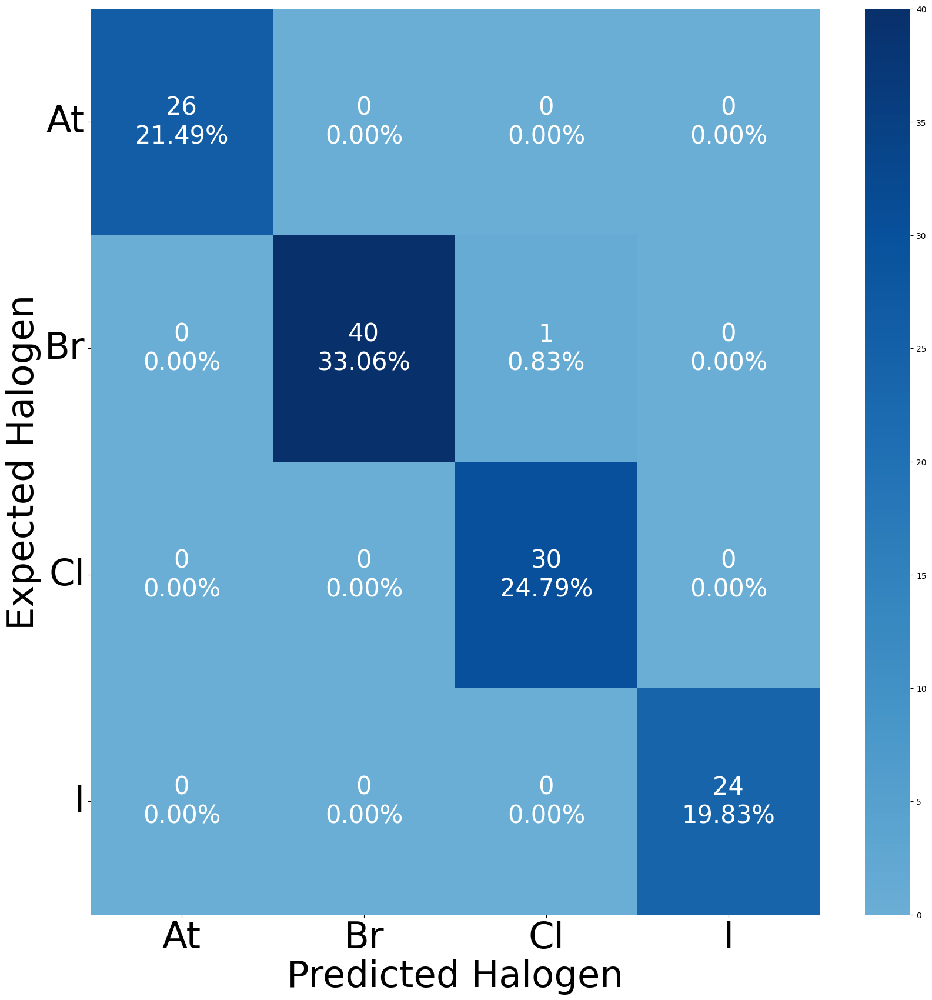

In [58]:
# Halogen RF Confusion Matrix Heat Map

BX_hal_RF_cm_hm = sns.heatmap(BX_hal_RF_cm, 
                             annot = BX_hal_RF_block_labels, 
                             cmap = "Blues", fmt='', 
                             annot_kws = {'size':30}, center = 0,
                             xticklabels=BX_hal_label_lst, yticklabels=BX_hal_label_lst)

BX_hal_RF_cm_hm.set_xticklabels(BX_hal_RF_cm_hm.get_xmajorticklabels(), fontsize = 45)
BX_hal_RF_cm_hm.set_yticklabels(BX_hal_RF_cm_hm.get_ymajorticklabels(), fontsize = 45)

plt.xticks(rotation=0)
plt.yticks(rotation=0)

plt.ylabel('Expected Halogen', fontsize = 45)
plt.xlabel('Predicted Halogen', fontsize = 45)

plt.savefig("Figures/BX_hal_RF_cm_hm.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

##### Ethynyl Benzene

In [59]:
# Random Forest Classification

# Ethynyl Benzene

# All Halogen
BAX_hal_RFC = RandomForestClassifier().fit(BAX_hal_X_train, BAX_hal_Y_train)

In [60]:
# Predict Class Based on Data

# Benzene

# All Halogen
BAX_hal_RF_pred = BAX_hal_RFC.predict(BAX_hal_X_test)

In [61]:
# Accuracy score

# Benzene

# All Halogen
BAX_hal_acc = accuracy_score(BAX_hal_Y_test, BAX_hal_RF_pred)

print(f"Accuracy: {round(BAX_hal_acc * 100, 2)}%")

Accuracy: 100.0%


In [62]:
# Classification report

# Benzene

# All Halogen
print(classification_report(BAX_hal_Y_test, BAX_hal_RF_pred))

              precision    recall  f1-score   support

          At       1.00      1.00      1.00        22
          Br       1.00      1.00      1.00        39
          Cl       1.00      1.00      1.00        33
           I       1.00      1.00      1.00        28

    accuracy                           1.00       122
   macro avg       1.00      1.00      1.00       122
weighted avg       1.00      1.00      1.00       122



In [63]:
# Confusion Matrix

# Ethynyl Benzene

# All Halogen
BAX_hal_RF_cm = confusion_matrix(BAX_hal_Y_test, BAX_hal_RF_pred, labels=BAX_hal_label_lst)

In [64]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# RF method

BAX_hal_rf = RandomForestClassifier(random_state=34)

In [65]:
# Cross validation

# Benzene

# All Halogen
BAX_hal_scores_val = cross_validate(BAX_hal_rf, BAX_hal_selfeat, BAX_hal_targ['interacting halogen'], 
                                   scoring = 'accuracy', cv = cv5)

In [66]:
print(f"accuracy : {round(np.mean(BAX_hal_scores_val['test_score']), 2)}")

accuracy : 1.0


###### Heat Maps

All Halogen Heat Maps

In [67]:
# Labels for Heat Maps Blocks

# Ethynyl Benzene

# All Halogen
BAX_hal_RF_counts = ["{0:0.0f}".format(value) for value in 
                   BAX_hal_RF_cm.flatten()]

BAX_hal_RF_perc = ["{0:.2%}".format(value) for value in 
                 BAX_hal_RF_cm.flatten()/np.sum(BAX_hal_RF_cm)]

BAX_hal_RF_block_labels = [f"{v1}\n{v2}" for v1, v2 in zip(BAX_hal_RF_counts, BAX_hal_RF_perc)]

BAX_hal_RF_block_labels = np.asarray(BAX_hal_RF_block_labels)\
.reshape(len(BAX_hal_label_lst),len(BAX_hal_label_lst))

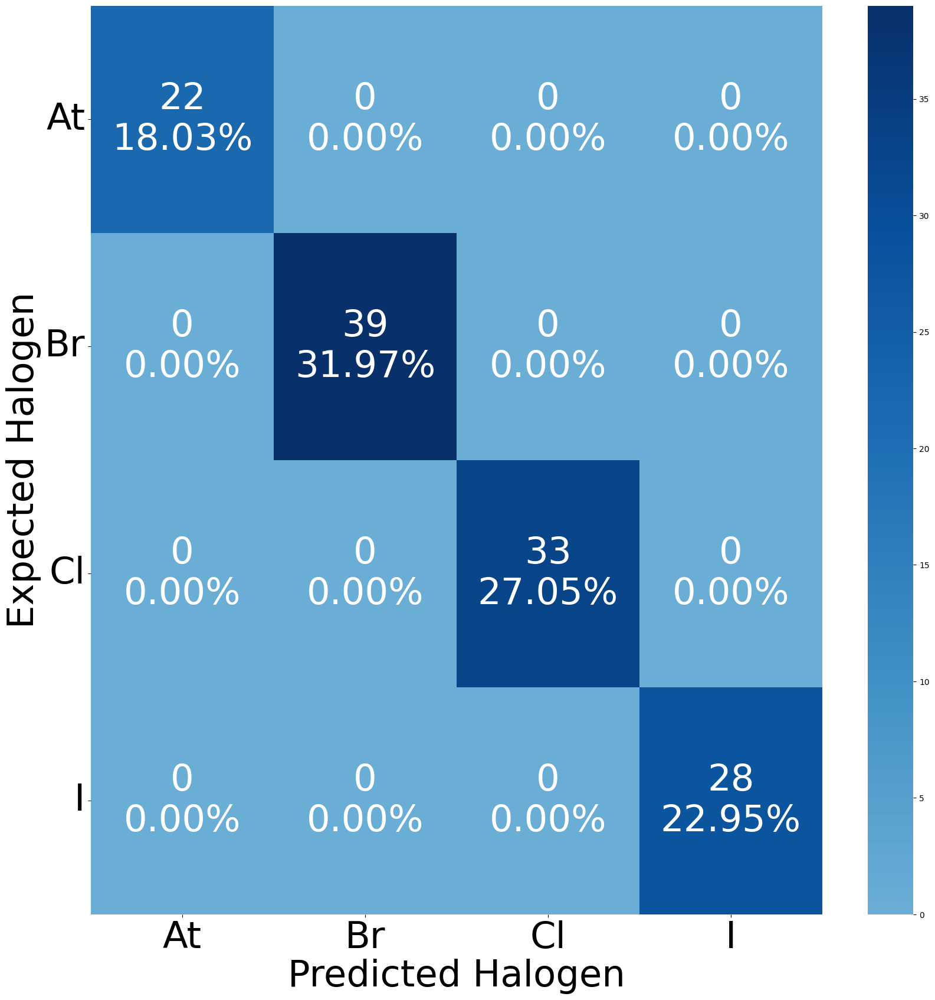

In [68]:
# RF Confusion Matrix Heat Map

BAX_hal_RF_cm_hm = sns.heatmap(BAX_hal_RF_cm, 
                             annot = BAX_hal_RF_block_labels, 
                             cmap = "Blues", fmt='', 
                             annot_kws = {'size':45}, center = 0,
                             xticklabels=BAX_hal_label_lst, yticklabels=BAX_hal_label_lst)

BAX_hal_RF_cm_hm.set_xticklabels(BAX_hal_RF_cm_hm.get_xmajorticklabels(), fontsize = 45)
BAX_hal_RF_cm_hm.set_yticklabels(BAX_hal_RF_cm_hm.get_ymajorticklabels(), fontsize = 45)

plt.xticks(rotation=0)
plt.yticks(rotation=0)

plt.ylabel('Expected Halogen', fontsize = 45)
plt.xlabel('Predicted Halogen', fontsize = 45)

plt.savefig("Figures/BAX_hal_RF_cm_hm.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

#### XGBoost

In [69]:
import xgboost as xgb

##### Benzene

In [70]:
# XGBoost Classification

# Benzene

# All Halogen

BX_hal_xgb = xgb.XGBClassifier().fit(BX_hal_lbl_X_train, BX_hal_lbl_Y_train)

In [71]:
# Predict Class Based on Data

# Benzene

# All Halogen
BX_hal_xgb_pred = BX_hal_xgb.predict(BX_hal_lbl_X_test)

In [72]:
# Accuracy score

# Benzene

# All Halogen
BX_hal_xgb_acc = accuracy_score(BX_hal_lbl_Y_test, BX_hal_xgb_pred)

print(f"Accuracy: {round(BX_hal_xgb_acc * 100, 2)}%")

Accuracy: 100.0%


In [73]:
# Classification report

# Benzene

# All Halogen
print(classification_report(BX_hal_lbl_Y_test, BX_hal_xgb_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        26
           1       1.00      1.00      1.00        41
           2       1.00      1.00      1.00        30
           3       1.00      1.00      1.00        24

    accuracy                           1.00       121
   macro avg       1.00      1.00      1.00       121
weighted avg       1.00      1.00      1.00       121



In [74]:
# Confusion Matrix

# Benzene

# All Halogen
BX_hal_xgb_cm = confusion_matrix(BX_hal_lbl_Y_test, BX_hal_xgb_pred)

In [75]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# RF method

BX_hal_xgb_cv = xgb.XGBClassifier()

In [76]:
# Cross validation

# Benzene

# All Halogen
BX_hal_xgb_scores_val = cross_validate(BX_hal_xgb_cv, BX_hal_selfeat, BX_hal_targ_lab['halogen_label'], 
                                   scoring = 'accuracy', cv = cv5)

In [77]:
print(f"accuracy : {round(np.mean(BX_hal_xgb_scores_val['test_score']), 2)}")

accuracy : 1.0


###### Heat Maps

In [78]:
# Labels for Heat Maps Blocks

# All Halogen
BX_hal_xgb_counts = ["{0:0.0f}".format(value) for value in 
                   BX_hal_xgb_cm.flatten()]

BX_hal_xgb_perc = ["{0:.2%}".format(value) for value in 
                 BX_hal_xgb_cm.flatten()/np.sum(BX_hal_xgb_cm)]

BX_hal_xgb_block_labels = [f"{v1}\n{v2}" for v1, v2 in zip(BX_hal_xgb_counts, BX_hal_xgb_perc)]

BX_hal_xgb_block_labels = np.asarray(BX_hal_xgb_block_labels)\
.reshape(len(BX_hal_label_lst),len(BX_hal_label_lst))

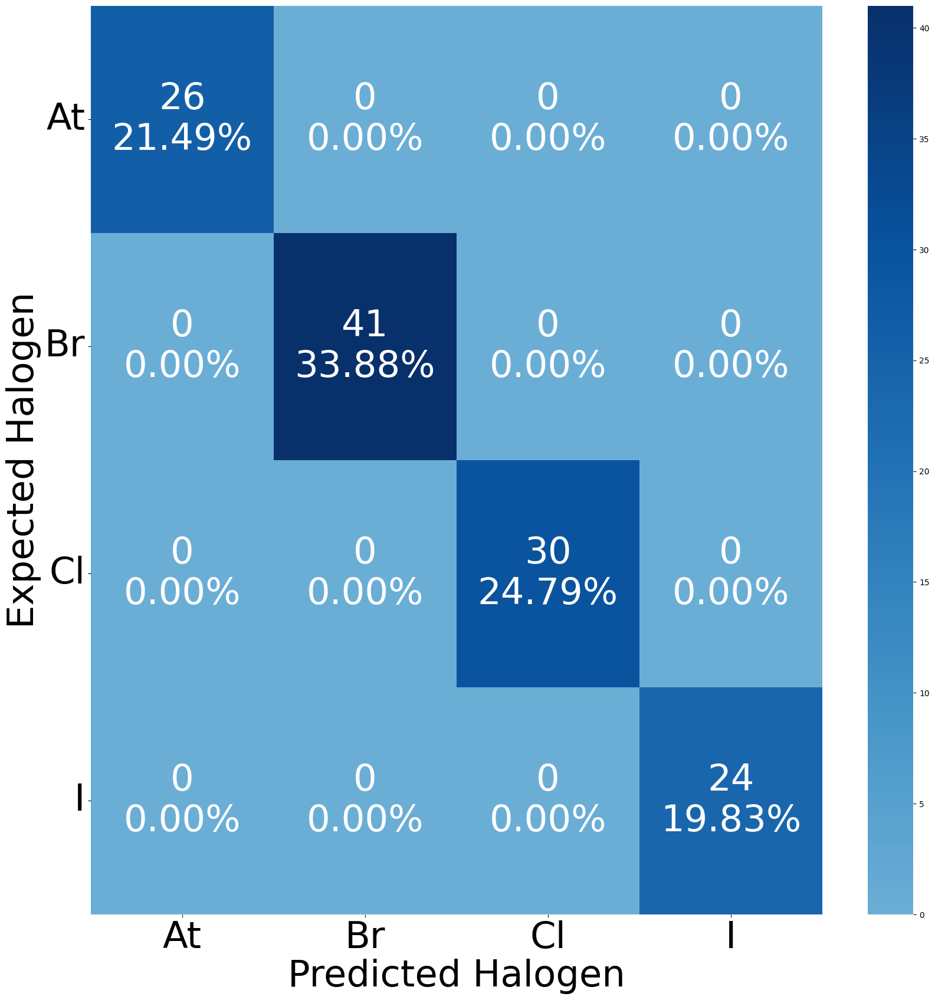

In [79]:
# Halogen XGB Confusion Matrix Heat Map

BX_hal_xgb_cm_hm = sns.heatmap(BX_hal_xgb_cm, 
                             annot = BX_hal_xgb_block_labels, 
                             cmap = "Blues", fmt='', 
                             annot_kws = {'size':45}, center = 0,
                             xticklabels=BX_hal_label_lst, yticklabels=BX_hal_label_lst)

BX_hal_xgb_cm_hm.set_xticklabels(BX_hal_xgb_cm_hm.get_xmajorticklabels(), fontsize = 45)
BX_hal_xgb_cm_hm.set_yticklabels(BX_hal_xgb_cm_hm.get_ymajorticklabels(), fontsize = 45)

plt.xticks(rotation=0)
plt.yticks(rotation=0)

plt.ylabel('Expected Halogen', fontsize = 45)
plt.xlabel('Predicted Halogen', fontsize = 45)

plt.savefig("Figures/BX_hal_xgb_cm_hm.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

##### Ethynyl Benzene

In [80]:
# XGBoost Classification

# Benzene

# All Halogen

BAX_hal_xgb = xgb.XGBClassifier().fit(BAX_hal_lbl_X_train, BAX_hal_lbl_Y_train)

In [81]:
# Predict Class Based on Data

# Benzene

# All Halogen
BAX_hal_xgb_pred = BAX_hal_xgb.predict(BAX_hal_lbl_X_test)

In [82]:
# Accuracy score

# Benzene

# All Halogen
BAX_hal_xgb_acc = accuracy_score(BAX_hal_lbl_Y_test, BAX_hal_xgb_pred)

print(f"Accuracy: {round(BAX_hal_xgb_acc * 100, 2)}%")

Accuracy: 100.0%


In [83]:
# Classification report

# Benzene

# All Halogen
print(classification_report(BAX_hal_lbl_Y_test, BAX_hal_xgb_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        22
           1       1.00      1.00      1.00        39
           2       1.00      1.00      1.00        33
           3       1.00      1.00      1.00        28

    accuracy                           1.00       122
   macro avg       1.00      1.00      1.00       122
weighted avg       1.00      1.00      1.00       122



In [84]:
# Confusion Matrix

# Benzene

# All Halogen
BAX_hal_xgb_cm = confusion_matrix(BAX_hal_lbl_Y_test, BAX_hal_xgb_pred)

In [85]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# RF method

BAX_hal_xgb_cv = xgb.XGBClassifier()

In [86]:
# Cross validation

# Benzene

# All Halogen
BAX_hal_xgb_scores_val = cross_validate(BAX_hal_xgb_cv, BAX_hal_selfeat, BAX_hal_targ_lab['halogen_label'], 
                                   scoring = 'accuracy', cv = cv5)

In [87]:
print(f"accuracy : {round(np.mean(BAX_hal_xgb_scores_val['test_score']), 2)}")

accuracy : 1.0


###### Heat Maps

In [88]:
# Labels for Heat Maps Blocks

# All Halogen
BAX_hal_xgb_counts = ["{0:0.0f}".format(value) for value in 
                   BAX_hal_xgb_cm.flatten()]

BAX_hal_xgb_perc = ["{0:.2%}".format(value) for value in 
                 BAX_hal_xgb_cm.flatten()/np.sum(BAX_hal_xgb_cm)]

BAX_hal_xgb_block_labels = [f"{v1}\n{v2}" for v1, v2 in zip(BAX_hal_xgb_counts, BAX_hal_xgb_perc)]

BAX_hal_xgb_block_labels = np.asarray(BAX_hal_xgb_block_labels)\
.reshape(len(BAX_hal_label_lst),len(BAX_hal_label_lst))

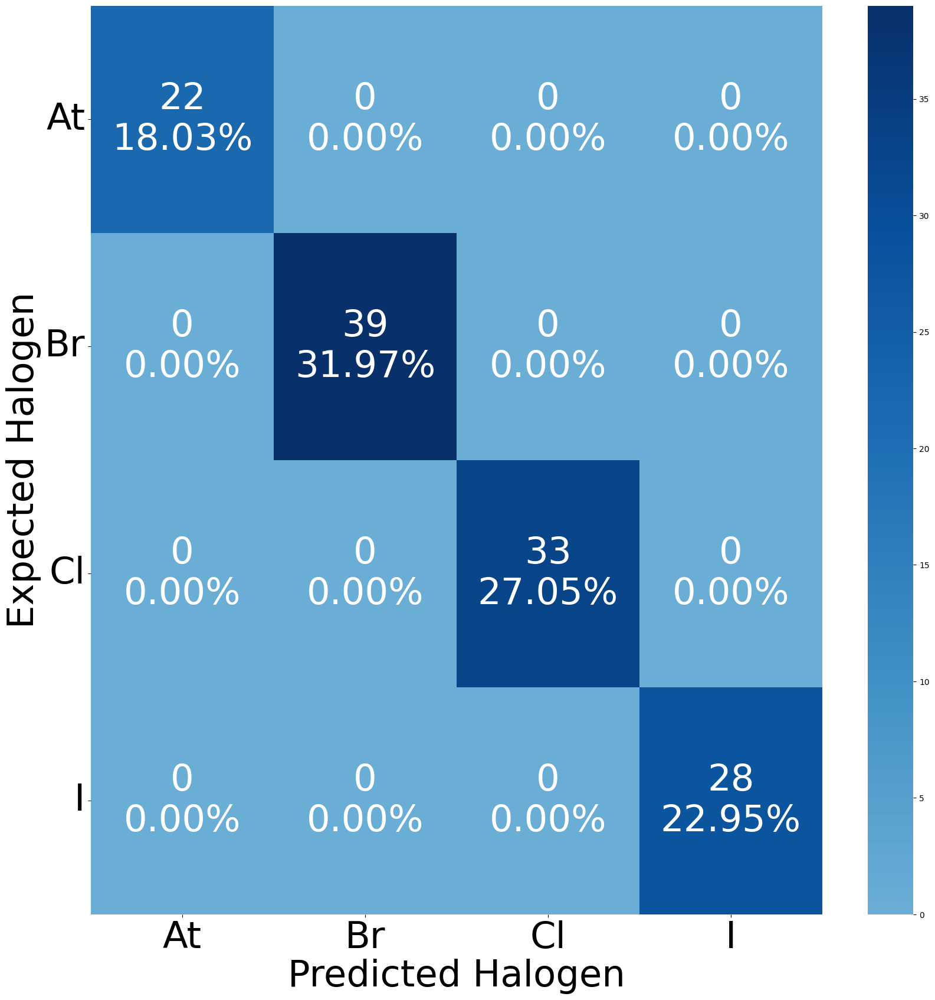

In [89]:
# Halogen RF Confusion Matrix Heat Map

BAX_hal_xgb_cm_hm = sns.heatmap(BAX_hal_xgb_cm, 
                             annot = BAX_hal_xgb_block_labels, 
                             cmap = "Blues", fmt='', 
                             annot_kws = {'size':45}, center = 0,
                             xticklabels=BAX_hal_label_lst, yticklabels=BAX_hal_label_lst)

BAX_hal_xgb_cm_hm.set_xticklabels(BAX_hal_xgb_cm_hm.get_xmajorticklabels(), fontsize = 45)
BAX_hal_xgb_cm_hm.set_yticklabels(BAX_hal_xgb_cm_hm.get_ymajorticklabels(), fontsize = 45)

plt.xticks(rotation=0)
plt.yticks(rotation=0)

plt.ylabel('Expected Halogen', fontsize = 45)
plt.xlabel('Predicted Halogen', fontsize = 45)

plt.savefig("Figures/BAX_hal_xgb_cm_hm.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

#### Support Vector Machines

In [90]:
from sklearn.svm import SVC

##### Benzene

In [91]:
# SVM classification

# Benzene

# All Halogen

BX_hal_svm = SVC(kernel="linear").fit(BX_hal_X_train, BX_hal_Y_train)

In [92]:
# SVC prediction

# Benzene

# All Halogen

BX_hal_svm_pred = BX_hal_svm.predict(BX_hal_X_test)

In [93]:
# Accuracy score

# Benzene

# All Halogen
BX_hal_svm_acc = accuracy_score(BX_hal_Y_test, BX_hal_svm_pred)

print(f"Accuracy: {round(BX_hal_svm_acc * 100, 2)}%")

Accuracy: 96.69%


In [94]:
# Classification report

# Benzene

# All Halogen
print(classification_report(BX_hal_Y_test, BX_hal_svm_pred))

              precision    recall  f1-score   support

          At       0.96      0.88      0.92        26
          Br       1.00      1.00      1.00        41
          Cl       1.00      1.00      1.00        30
           I       0.88      0.96      0.92        24

    accuracy                           0.97       121
   macro avg       0.96      0.96      0.96       121
weighted avg       0.97      0.97      0.97       121



In [95]:
# Confusion Matrix

# Benzene

# All Halogen
BX_hal_svm_cm = confusion_matrix(BX_hal_Y_test, BX_hal_svm_pred, labels=BX_hal_label_lst)

In [96]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# RF method

BX_hal_svm_cv = xgb.XGBClassifier()

In [97]:
# Cross validation

# Benzene

# All Halogen
BX_hal_svm_scores_val = cross_validate(BX_hal_svm_cv, BX_hal_selfeat, BX_hal_targ_lab['halogen_label'], 
                                   scoring = 'accuracy', cv = cv5)

In [98]:
print(f"accuracy : {round(np.mean(BX_hal_svm_scores_val['test_score']), 2)}")

accuracy : 1.0


###### Heat Maps

In [99]:
# Labels for Heat Maps Blocks

# All Halogen
BX_hal_svm_counts = ["{0:0.0f}".format(value) for value in 
                   BX_hal_svm_cm.flatten()]

BX_hal_svm_perc = ["{0:.2%}".format(value) for value in 
                 BX_hal_svm_cm.flatten()/np.sum(BX_hal_svm_cm)]

BX_hal_svm_block_labels = [f"{v1}\n{v2}" for v1, v2 in zip(BX_hal_svm_counts, BX_hal_svm_perc)]

BX_hal_svm_block_labels = np.asarray(BX_hal_svm_block_labels)\
.reshape(len(BX_hal_label_lst),len(BX_hal_label_lst))

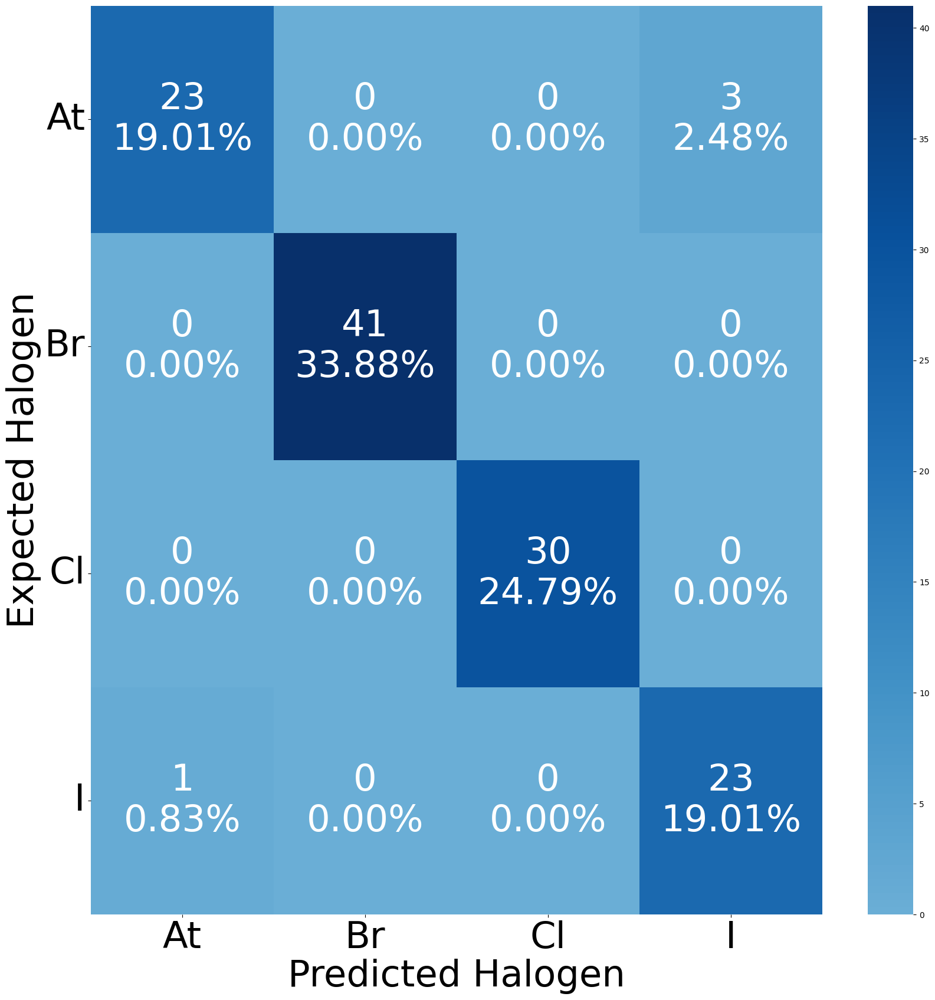

In [100]:
# Halogen SVM Confusion Matrix Heat Map

BX_hal_svm_cm_hm = sns.heatmap(BX_hal_svm_cm, 
                             annot = BX_hal_svm_block_labels, 
                             cmap = "Blues", fmt='', 
                             annot_kws = {'size':45}, center = 0,
                             xticklabels=BX_hal_label_lst, yticklabels=BX_hal_label_lst)

BX_hal_svm_cm_hm.set_xticklabels(BX_hal_svm_cm_hm.get_xmajorticklabels(), fontsize = 45)
BX_hal_svm_cm_hm.set_yticklabels(BX_hal_svm_cm_hm.get_ymajorticklabels(), fontsize = 45)

plt.xticks(rotation=0)
plt.yticks(rotation=0)

plt.ylabel('Expected Halogen', fontsize = 45)
plt.xlabel('Predicted Halogen', fontsize = 45)

plt.savefig("Figures/BX_hal_svm_cm_hm.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

##### Ethynyl Benzene

In [101]:
# SVM classification

# Ethynyl Benzene

# All Halogen

BAX_hal_svm = SVC(kernel="linear").fit(BAX_hal_X_train, BAX_hal_Y_train)

In [102]:
# SVC prediction

# Ethynyl Benzene

# All Halogen

BAX_hal_svm_pred = BAX_hal_svm.predict(BAX_hal_X_test)

In [103]:
# Accuracy score

# Ethynyl Benzene

# All Halogen
BAX_hal_svm_acc = accuracy_score(BAX_hal_Y_test, BAX_hal_svm_pred)

print(f"Accuracy: {round(BAX_hal_svm_acc * 100, 2)}%")

Accuracy: 87.7%


In [104]:
# Classification report

# Ethynyl Benzene

# All Halogen
print(classification_report(BAX_hal_Y_test, BAX_hal_svm_pred))

              precision    recall  f1-score   support

          At       0.88      0.95      0.91        22
          Br       0.87      0.85      0.86        39
          Cl       0.97      0.94      0.95        33
           I       0.79      0.79      0.79        28

    accuracy                           0.88       122
   macro avg       0.87      0.88      0.88       122
weighted avg       0.88      0.88      0.88       122



In [105]:
# Confusion Matrix

# Ethynyl Benzene

# All Halogen
BAX_hal_svm_cm = confusion_matrix(BAX_hal_Y_test, BAX_hal_svm_pred, labels=BAX_hal_label_lst)

In [106]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# RF method

BAX_hal_svm_cv = SVC(kernel="linear")

In [107]:
# Cross validation

# Benzene

# All Halogen
BAX_hal_svm_scores_val = cross_validate(BAX_hal_svm_cv, BAX_hal_selfeat, BAX_hal_targ_lab['halogen_label'], 
                                   scoring = 'accuracy', cv = cv5)

In [108]:
print(f"accuracy : {round(np.mean(BAX_hal_svm_scores_val['test_score']), 2)}")

accuracy : 0.9


###### Heat Maps

In [109]:
# Labels for Heat Maps Blocks

# All Halogen
BAX_hal_svm_counts = ["{0:0.0f}".format(value) for value in 
                   BAX_hal_svm_cm.flatten()]

BAX_hal_svm_perc = ["{0:.2%}".format(value) for value in 
                 BAX_hal_svm_cm.flatten()/np.sum(BAX_hal_svm_cm)]

BAX_hal_svm_block_labels = [f"{v1}\n{v2}" for v1, v2 in zip(BAX_hal_svm_counts, BAX_hal_svm_perc)]

BAX_hal_svm_block_labels = np.asarray(BAX_hal_svm_block_labels)\
.reshape(len(BAX_hal_label_lst),len(BAX_hal_label_lst))

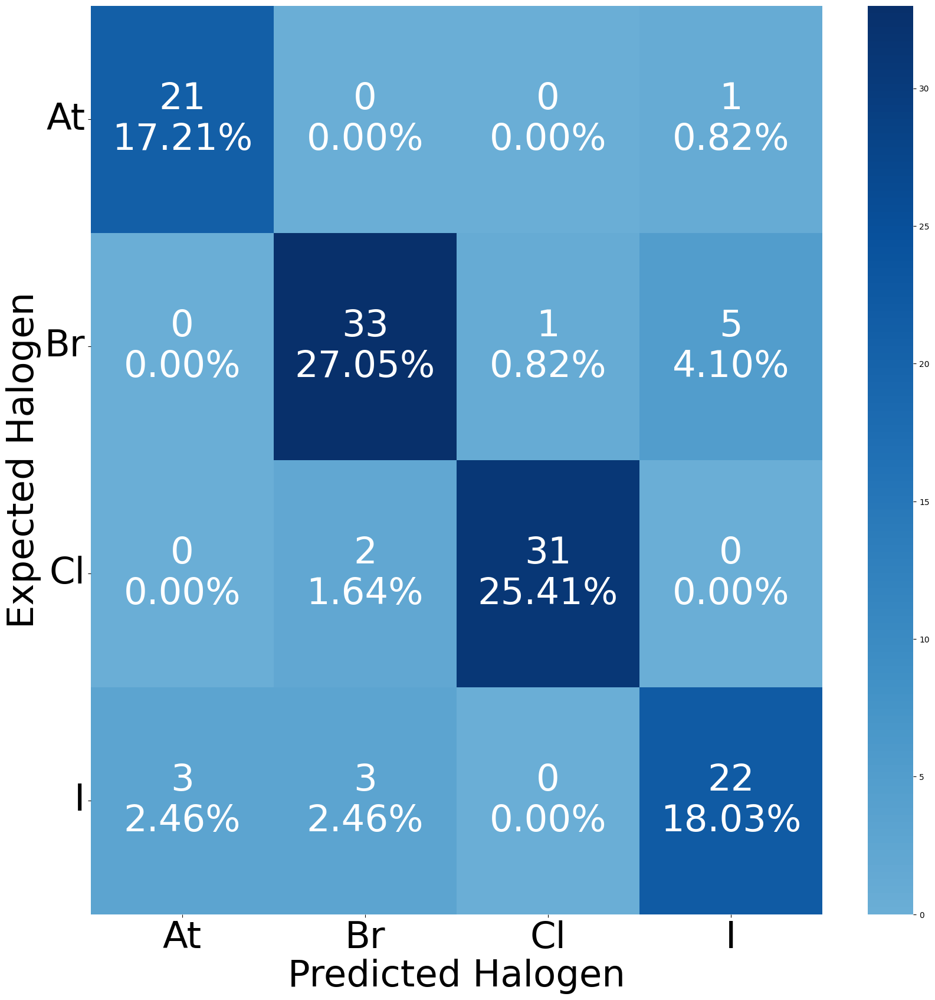

In [110]:
# Halogen SVM Confusion Matrix Heat Map

BAX_hal_svm_cm_hm = sns.heatmap(BAX_hal_svm_cm, 
                             annot = BAX_hal_svm_block_labels, 
                             cmap = "Blues", fmt='', 
                             annot_kws = {'size':45}, center = 0,
                             xticklabels=BAX_hal_label_lst, yticklabels=BAX_hal_label_lst)

BAX_hal_svm_cm_hm.set_xticklabels(BAX_hal_svm_cm_hm.get_xmajorticklabels(), fontsize = 45)
BAX_hal_svm_cm_hm.set_yticklabels(BAX_hal_svm_cm_hm.get_ymajorticklabels(), fontsize = 45)

plt.xticks(rotation=0)
plt.yticks(rotation=0)

plt.ylabel('Expected Halogen', fontsize = 45)
plt.xlabel('Predicted Halogen', fontsize = 45)

plt.savefig("Figures/BAX_hal_svm_cm_hm.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

### Regression Models

The group of features will be predicted using the regression algorithms from the Random Forest, Support Vector Machines, and Extreme Boosted Decision Tree algorithms. Here we will predict the magnitude of the $\sigma$-hole (V$_{S,Max}$), the binding energy of the XB donor ammonia acceptor complexes (E$_{bind}$), and the local force constant the halogen$\cdots$nitrogen (X$\cdots$N) bond between the halogen of the XB donor and the nitrogen in ammonia (k$^a_{X\cdots N}$) based on the Morgan FingerPrints of the XB donor molecules.
The same targeted features will be predicted through a data based approach, using the other features to predict the target features.

#### Random Forest Regression

In [47]:
from sklearn.ensemble import RandomForestRegressor

##### Benzene

###### Morgan FingerPrints

In [48]:
# Random Forest Regression -- Morgan Finger Prints

# Benzene

## Chlorine

### Vmax
BCl_RF_Vmax_MFP = RandomForestRegressor(random_state=42).fit(BCl_MFP_Vmax_X_train, BCl_MFP_Vmax_Y_train)

### Ebind
BCl_RF_Ebind_MFP = RandomForestRegressor(random_state=42).fit(BCl_MFP_Ebind_X_train, BCl_MFP_Ebind_Y_train)

### kXN
BCl_RF_kXN_MFP = RandomForestRegressor(random_state=42).fit(BCl_MFP_kXN_X_train, BCl_MFP_kXN_Y_train)

## Bromine

### Vmax
BBr_RF_Vmax_MFP = RandomForestRegressor(random_state=42).fit(BBr_MFP_Vmax_X_train, BBr_MFP_Vmax_Y_train)

### Ebind
BBr_RF_Ebind_MFP = RandomForestRegressor(random_state=42).fit(BBr_MFP_Ebind_X_train, BBr_MFP_Ebind_Y_train)

### kXN
BBr_RF_kXN_MFP = RandomForestRegressor(random_state=42).fit(BBr_MFP_kXN_X_train, BBr_MFP_kXN_Y_train)

## Iodine

### Vmax
BI_RF_Vmax_MFP = RandomForestRegressor(random_state=42).fit(BI_MFP_Vmax_X_train, BI_MFP_Vmax_Y_train)

### Ebind
BI_RF_Ebind_MFP = RandomForestRegressor(random_state=42).fit(BI_MFP_Ebind_X_train, BI_MFP_Ebind_Y_train)

### kXN
BI_RF_kXN_MFP = RandomForestRegressor(random_state=42).fit(BI_MFP_kXN_X_train, BI_MFP_kXN_Y_train)

## Astatine

### Vmax
BAt_RF_Vmax_MFP = RandomForestRegressor(random_state=42).fit(BAt_MFP_Vmax_X_train, BAt_MFP_Vmax_Y_train)

### Ebind
BAt_RF_Ebind_MFP = RandomForestRegressor(random_state=42).fit(BAt_MFP_Ebind_X_train, BAt_MFP_Ebind_Y_train)

### kXN
BAt_RF_kXN_MFP = RandomForestRegressor(random_state=42).fit(BAt_MFP_kXN_X_train, BAt_MFP_kXN_Y_train)

## All Halogen

### Vmax
BX_RF_Vmax_MFP = RandomForestRegressor(random_state=42).fit(BX_MFP_Vmax_X_train, BX_MFP_Vmax_Y_train)

### Ebind
BX_RF_Ebind_MFP = RandomForestRegressor(random_state=42).fit(BX_MFP_Ebind_X_train, BX_MFP_Ebind_Y_train)

### kXN
BX_RF_kXN_MFP = RandomForestRegressor(random_state=42).fit(BX_MFP_kXN_X_train, BX_MFP_kXN_Y_train)

## All XB

### Vmax
All_XB_RF_Vmax_MFP = RandomForestRegressor(random_state=42)\
.fit(All_XB_MFP_Vmax_X_train, All_XB_MFP_Vmax_Y_train)

### Ebind
All_XB_RF_Ebind_MFP = RandomForestRegressor(random_state=42)\
.fit(All_XB_MFP_Ebind_X_train, All_XB_MFP_Ebind_Y_train)

### kXN
All_XB_RF_kXN_MFP = RandomForestRegressor(random_state=42)\
.fit(All_XB_MFP_kXN_X_train, All_XB_MFP_kXN_Y_train)

In [49]:
# Predictions

# Benzene

## Chlorine

### Vmax
BCl_RF_Vmax_MFP_pred = BCl_RF_Vmax_MFP.predict(BCl_MFP_Vmax_X_test)

### Ebind
BCl_RF_Ebind_MFP_pred = BCl_RF_Ebind_MFP.predict(BCl_MFP_Ebind_X_test)

### kXN
BCl_RF_kXN_MFP_pred = BCl_RF_kXN_MFP.predict(BCl_MFP_kXN_X_test)

## Bromine

### Vmax
BBr_RF_Vmax_MFP_pred = BBr_RF_Vmax_MFP.predict(BBr_MFP_Vmax_X_test)

### Ebind
BBr_RF_Ebind_MFP_pred = BBr_RF_Ebind_MFP.predict(BBr_MFP_Ebind_X_test)

### kXN
BBr_RF_kXN_MFP_pred = BBr_RF_kXN_MFP.predict(BBr_MFP_kXN_X_test)

## Iodine

### Vmax
BI_RF_Vmax_MFP_pred = BI_RF_Vmax_MFP.predict(BI_MFP_Vmax_X_test)

### Ebind
BI_RF_Ebind_MFP_pred = BI_RF_Ebind_MFP.predict(BI_MFP_Ebind_X_test)

### kXN
BI_RF_kXN_MFP_pred = BI_RF_kXN_MFP.predict(BI_MFP_kXN_X_test)

## Astatine

### Vmax
BAt_RF_Vmax_MFP_pred = BAt_RF_Vmax_MFP.predict(BAt_MFP_Vmax_X_test)

### Ebind
BAt_RF_Ebind_MFP_pred = BAt_RF_Ebind_MFP.predict(BAt_MFP_Ebind_X_test)

### kXN
BAt_RF_kXN_MFP_pred = BAt_RF_kXN_MFP.predict(BAt_MFP_kXN_X_test)

## All Halogen

### Vmax
BX_RF_Vmax_MFP_pred = BX_RF_Vmax_MFP.predict(BX_MFP_Vmax_X_test)

### Ebind
BX_RF_Ebind_MFP_pred = BX_RF_Ebind_MFP.predict(BX_MFP_Ebind_X_test)

### kXN
BX_RF_kXN_MFP_pred = BX_RF_kXN_MFP.predict(BX_MFP_kXN_X_test)

## All XB

### Vmax
All_XB_RF_Vmax_MFP_pred = All_XB_RF_Vmax_MFP.predict(All_XB_MFP_Vmax_X_test)

### Ebind
All_XB_RF_Ebind_MFP_pred = All_XB_RF_Ebind_MFP.predict(All_XB_MFP_Ebind_X_test)

### kXN
All_XB_RF_kXN_MFP_pred = All_XB_RF_kXN_MFP.predict(All_XB_MFP_kXN_X_test)

The accuracy of the regression models can be determined by the R$^2$ score, the mean absolute error (MAE), and the root mean squared error (RMSE), which are some of the most widely used accuracy scores.

In [50]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [51]:
# Accuracy measurments

# Benzene

## Chlorine

### Vmax
BCl_RF_MFP_Vmax_r2 = r2_score(BCl_MFP_Vmax_Y_test, BCl_RF_Vmax_MFP_pred)
BCl_RF_MFP_Vmax_mae = mean_absolute_error(BCl_MFP_Vmax_Y_test, BCl_RF_Vmax_MFP_pred)
BCl_RF_MFP_Vmax_rmse = mean_squared_error(BCl_MFP_Vmax_Y_test, BCl_RF_Vmax_MFP_pred, squared=False)

### Ebind
BCl_RF_MFP_Ebind_r2 = r2_score(BCl_MFP_Ebind_Y_test, BCl_RF_Ebind_MFP_pred)
BCl_RF_MFP_Ebind_mae = mean_absolute_error(BCl_MFP_Ebind_Y_test, BCl_RF_Ebind_MFP_pred)
BCl_RF_MFP_Ebind_rmse = mean_squared_error(BCl_MFP_Ebind_Y_test, BCl_RF_Ebind_MFP_pred, squared=False)

### kXN
BCl_RF_MFP_kXN_r2 = r2_score(BCl_MFP_kXN_Y_test, BCl_RF_kXN_MFP_pred)
BCl_RF_MFP_kXN_mae = mean_absolute_error(BCl_MFP_kXN_Y_test, BCl_RF_kXN_MFP_pred)
BCl_RF_MFP_kXN_rmse = mean_squared_error(BCl_MFP_kXN_Y_test, BCl_RF_kXN_MFP_pred, squared=False)

## Bromine

### Vmax
BBr_RF_MFP_Vmax_r2 = r2_score(BBr_MFP_Vmax_Y_test, BBr_RF_Vmax_MFP_pred)
BBr_RF_MFP_Vmax_mae = mean_absolute_error(BBr_MFP_Vmax_Y_test, BBr_RF_Vmax_MFP_pred)
BBr_RF_MFP_Vmax_rmse = mean_squared_error(BBr_MFP_Vmax_Y_test, BBr_RF_Vmax_MFP_pred, squared=False)

### Ebind
BBr_RF_MFP_Ebind_r2 = r2_score(BBr_MFP_Ebind_Y_test, BBr_RF_Ebind_MFP_pred)
BBr_RF_MFP_Ebind_mae = mean_absolute_error(BBr_MFP_Ebind_Y_test, BBr_RF_Ebind_MFP_pred)
BBr_RF_MFP_Ebind_rmse = mean_squared_error(BBr_MFP_Ebind_Y_test, BBr_RF_Ebind_MFP_pred, squared=False)

### kXN
BBr_RF_MFP_kXN_r2 = r2_score(BBr_MFP_kXN_Y_test, BBr_RF_kXN_MFP_pred)
BBr_RF_MFP_kXN_mae = mean_absolute_error(BBr_MFP_kXN_Y_test, BBr_RF_kXN_MFP_pred)
BBr_RF_MFP_kXN_rmse = mean_squared_error(BBr_MFP_kXN_Y_test, BBr_RF_kXN_MFP_pred, squared=False)

## Iodine

### Vmax
BI_RF_MFP_Vmax_r2 = r2_score(BI_MFP_Vmax_Y_test, BI_RF_Vmax_MFP_pred)
BI_RF_MFP_Vmax_mae = mean_absolute_error(BI_MFP_Vmax_Y_test, BI_RF_Vmax_MFP_pred)
BI_RF_MFP_Vmax_rmse = mean_squared_error(BI_MFP_Vmax_Y_test, BI_RF_Vmax_MFP_pred, squared=False)

### Ebind
BI_RF_MFP_Ebind_r2 = r2_score(BI_MFP_Ebind_Y_test, BI_RF_Ebind_MFP_pred)
BI_RF_MFP_Ebind_mae = mean_absolute_error(BI_MFP_Ebind_Y_test, BI_RF_Ebind_MFP_pred)
BI_RF_MFP_Ebind_rmse = mean_squared_error(BI_MFP_Ebind_Y_test, BI_RF_Ebind_MFP_pred, squared=False)

### kXN
BI_RF_MFP_kXN_r2 = r2_score(BI_MFP_kXN_Y_test, BI_RF_kXN_MFP_pred)
BI_RF_MFP_kXN_mae = mean_absolute_error(BI_MFP_kXN_Y_test, BI_RF_kXN_MFP_pred)
BI_RF_MFP_kXN_rmse = mean_squared_error(BI_MFP_kXN_Y_test, BI_RF_kXN_MFP_pred, squared=False)

## Astatine

### Vmax
BAt_RF_MFP_Vmax_r2 = r2_score(BAt_MFP_Vmax_Y_test, BAt_RF_Vmax_MFP_pred)
BAt_RF_MFP_Vmax_mae = mean_absolute_error(BAt_MFP_Vmax_Y_test, BAt_RF_Vmax_MFP_pred)
BAt_RF_MFP_Vmax_rmse = mean_squared_error(BAt_MFP_Vmax_Y_test, BAt_RF_Vmax_MFP_pred, squared=False)

### Ebind
BAt_RF_MFP_Ebind_r2 = r2_score(BAt_MFP_Ebind_Y_test, BAt_RF_Ebind_MFP_pred)
BAt_RF_MFP_Ebind_mae = mean_absolute_error(BAt_MFP_Ebind_Y_test, BAt_RF_Ebind_MFP_pred)
BAt_RF_MFP_Ebind_rmse = mean_squared_error(BAt_MFP_Ebind_Y_test, BAt_RF_Ebind_MFP_pred, squared=False)

### kXN
BAt_RF_MFP_kXN_r2 = r2_score(BAt_MFP_kXN_Y_test, BAt_RF_kXN_MFP_pred)
BAt_RF_MFP_kXN_mae = mean_absolute_error(BAt_MFP_kXN_Y_test, BAt_RF_kXN_MFP_pred)
BAt_RF_MFP_kXN_rmse = mean_squared_error(BAt_MFP_kXN_Y_test, BAt_RF_kXN_MFP_pred, squared=False)

## All Halogen

### Vmax
BX_RF_MFP_Vmax_r2 = r2_score(BX_MFP_Vmax_Y_test, BX_RF_Vmax_MFP_pred)
BX_RF_MFP_Vmax_mae = mean_absolute_error(BX_MFP_Vmax_Y_test, BX_RF_Vmax_MFP_pred)
BX_RF_MFP_Vmax_rmse = mean_squared_error(BX_MFP_Vmax_Y_test, BX_RF_Vmax_MFP_pred, squared=False)

### Ebind
BX_RF_MFP_Ebind_r2 = r2_score(BX_MFP_Ebind_Y_test, BX_RF_Ebind_MFP_pred)
BX_RF_MFP_Ebind_mae = mean_absolute_error(BX_MFP_Ebind_Y_test, BX_RF_Ebind_MFP_pred)
BX_RF_MFP_Ebind_rmse = mean_squared_error(BX_MFP_Ebind_Y_test, BX_RF_Ebind_MFP_pred, squared=False)

### kXN
BX_RF_MFP_kXN_r2 = r2_score(BX_MFP_kXN_Y_test, BX_RF_kXN_MFP_pred)
BX_RF_MFP_kXN_mae = mean_absolute_error(BX_MFP_kXN_Y_test, BX_RF_kXN_MFP_pred)
BX_RF_MFP_kXN_rmse = mean_squared_error(BX_MFP_kXN_Y_test, BX_RF_kXN_MFP_pred, squared=False)

## All XB

### Vmax
All_XB_RF_MFP_Vmax_r2 = r2_score(All_XB_MFP_Vmax_Y_test, All_XB_RF_Vmax_MFP_pred)
All_XB_RF_MFP_Vmax_mae = mean_absolute_error(All_XB_MFP_Vmax_Y_test, All_XB_RF_Vmax_MFP_pred)
All_XB_RF_MFP_Vmax_rmse = mean_squared_error(All_XB_MFP_Vmax_Y_test, All_XB_RF_Vmax_MFP_pred, squared=False)

### Ebind
All_XB_RF_MFP_Ebind_r2 = r2_score(All_XB_MFP_Ebind_Y_test, All_XB_RF_Ebind_MFP_pred)
All_XB_RF_MFP_Ebind_mae = mean_absolute_error(All_XB_MFP_Ebind_Y_test, All_XB_RF_Ebind_MFP_pred)
All_XB_RF_MFP_Ebind_rmse = mean_squared_error(All_XB_MFP_Ebind_Y_test, All_XB_RF_Ebind_MFP_pred, squared=False)

### kXN
All_XB_RF_MFP_kXN_r2 = r2_score(All_XB_MFP_kXN_Y_test, All_XB_RF_kXN_MFP_pred)
All_XB_RF_MFP_kXN_mae = mean_absolute_error(All_XB_MFP_kXN_Y_test, All_XB_RF_kXN_MFP_pred)
All_XB_RF_MFP_kXN_rmse = mean_squared_error(All_XB_MFP_kXN_Y_test, All_XB_RF_kXN_MFP_pred, squared=False)

Cross Validation

In [52]:
from sklearn.model_selection import cross_validate, ShuffleSplit

In [53]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# RF method

# Benzene

## Chlorine

### Vmax

BCl_Vmax_MFP_rf = RandomForestRegressor(random_state=34)

### Ebind

BCl_Ebind_MFP_rf = RandomForestRegressor(random_state=34)

### kXN

BCl_kXN_MFP_rf = RandomForestRegressor(random_state=34)

## Bromine

### Vmax

BBr_Vmax_MFP_rf = RandomForestRegressor(random_state=34)

### Ebind

BBr_Ebind_MFP_rf = RandomForestRegressor(random_state=34)

### kXN

BBr_kXN_MFP_rf = RandomForestRegressor(random_state=34)

## Iodine

### Vmax

BI_Vmax_MFP_rf = RandomForestRegressor(random_state=34)

### Ebind

BI_Ebind_MFP_rf = RandomForestRegressor(random_state=34)

### kXN

BI_kXN_MFP_rf = RandomForestRegressor(random_state=34)

## Astatine

### Vmax

BAt_Vmax_MFP_rf = RandomForestRegressor(random_state=34)

### Ebind

BAt_Ebind_MFP_rf = RandomForestRegressor(random_state=34)

### kXN

BAt_kXN_MFP_rf = RandomForestRegressor(random_state=34)

## All Halogen

### Vmax

BX_Vmax_MFP_rf = RandomForestRegressor(random_state=34)

### Ebind

BX_Ebind_MFP_rf = RandomForestRegressor(random_state=34)

### kXN

BX_kXN_MFP_rf = RandomForestRegressor(random_state=34)

In [54]:
# Cross validation

# Benzene

## Chlorine

### Vmax

BCl_Vmax_MFP_cv = cross_validate(BCl_Vmax_MFP_rf, BCl_MRG_df, BCl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BCl_Ebind_MFP_cv = cross_validate(BCl_Ebind_MFP_rf, BCl_MRG_df, BCl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BCl_kXN_MFP_cv = cross_validate(BCl_kXN_MFP_rf, BCl_MRG_df, BCl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BBr_Vmax_MFP_cv = cross_validate(BBr_Vmax_MFP_rf, BBr_MRG_df, BBr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BBr_Ebind_MFP_cv = cross_validate(BBr_Ebind_MFP_rf, BBr_MRG_df, BBr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BBr_kXN_MFP_cv = cross_validate(BBr_kXN_MFP_rf, BBr_MRG_df, BBr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BI_Vmax_MFP_cv = cross_validate(BI_Vmax_MFP_rf, BI_MRG_df, BI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BI_Ebind_MFP_cv = cross_validate(BI_Ebind_MFP_rf, BI_MRG_df, BI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BI_kXN_MFP_cv = cross_validate(BI_kXN_MFP_rf, BI_MRG_df, BI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAt_Vmax_MFP_cv = cross_validate(BAt_Vmax_MFP_rf, BAt_MRG_df, BAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAt_Ebind_MFP_cv = cross_validate(BAt_Ebind_MFP_rf, BAt_MRG_df, BAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAt_kXN_MFP_cv = cross_validate(BAt_kXN_MFP_rf, BAt_MRG_df, BAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BX_Vmax_MFP_cv = cross_validate(BX_Vmax_MFP_rf, BX_MRG_df, BX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BX_Ebind_MFP_cv = cross_validate(BX_Ebind_MFP_rf, BX_MRG_df, BX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BX_kXN_MFP_cv = cross_validate(BX_kXN_MFP_rf, BX_MRG_df, BX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [55]:
# CV Scores

# Benzene

## Chlorine

### Vmax

BCl_Vmax_MFP_cv_res_lst = [
    round(np.mean(BCl_Vmax_MFP_cv['test_r2']), 2), 
    round(np.mean(-BCl_Vmax_MFP_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Vmax_MFP_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BCl_Ebind_MFP_cv_res_lst = [
    round(np.mean(BCl_Ebind_MFP_cv['test_r2']), 2), 
    round(np.mean(-BCl_Ebind_MFP_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Ebind_MFP_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BCl_kXN_MFP_cv_res_lst = [
    round(np.mean(BCl_kXN_MFP_cv['test_r2']), 2), 
    round(np.mean(-BCl_kXN_MFP_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BCl_kXN_MFP_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BBr_Vmax_MFP_cv_res_lst = [
    round(np.mean(BBr_Vmax_MFP_cv['test_r2']), 2), 
    round(np.mean(-BBr_Vmax_MFP_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Vmax_MFP_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BBr_Ebind_MFP_cv_res_lst = [
    round(np.mean(BBr_Ebind_MFP_cv['test_r2']), 2), 
    round(np.mean(-BBr_Ebind_MFP_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Ebind_MFP_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BBr_kXN_MFP_cv_res_lst = [
    round(np.mean(BBr_kXN_MFP_cv['test_r2']), 2), 
    round(np.mean(-BBr_kXN_MFP_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BBr_kXN_MFP_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BI_Vmax_MFP_cv_res_lst = [
    round(np.mean(BI_Vmax_MFP_cv['test_r2']), 2), 
    round(np.mean(-BI_Vmax_MFP_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Vmax_MFP_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BI_Ebind_MFP_cv_res_lst = [
    round(np.mean(BI_Ebind_MFP_cv['test_r2']), 2), 
    round(np.mean(-BI_Ebind_MFP_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Ebind_MFP_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BI_kXN_MFP_cv_res_lst = [
    round(np.mean(BI_kXN_MFP_cv['test_r2']), 2), 
    round(np.mean(-BI_kXN_MFP_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BI_kXN_MFP_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAt_Vmax_MFP_cv_res_lst = [
    round(np.mean(BAt_Vmax_MFP_cv['test_r2']), 2), 
    round(np.mean(-BAt_Vmax_MFP_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Vmax_MFP_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAt_Ebind_MFP_cv_res_lst = [
    round(np.mean(BAt_Ebind_MFP_cv['test_r2']), 2), 
    round(np.mean(-BAt_Ebind_MFP_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Ebind_MFP_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAt_kXN_MFP_cv_res_lst = [
    round(np.mean(BAt_kXN_MFP_cv['test_r2']), 2), 
    round(np.mean(-BAt_kXN_MFP_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAt_kXN_MFP_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BX_Vmax_MFP_cv_res_lst = [
    round(np.mean(BX_Vmax_MFP_cv['test_r2']), 2), 
    round(np.mean(-BX_Vmax_MFP_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Vmax_MFP_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BX_Ebind_MFP_cv_res_lst = [
    round(np.mean(BX_Ebind_MFP_cv['test_r2']), 2), 
    round(np.mean(-BX_Ebind_MFP_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Ebind_MFP_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BX_kXN_MFP_cv_res_lst = [
    round(np.mean(BX_kXN_MFP_cv['test_r2']), 2), 
    round(np.mean(-BX_kXN_MFP_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BX_kXN_MFP_cv['test_neg_root_mean_squared_error']), 3)
]

In [56]:
# Create CV metrics Dataframe

# RF

# Benzene

# constructing dictionary for data

## Vmax

BX_CV_RF_Vmax_dict = {'BCl': BCl_Vmax_MFP_cv_res_lst, 'BBr': BBr_Vmax_MFP_cv_res_lst, 
                     'BI': BI_Vmax_MFP_cv_res_lst, 'BAt': BAt_Vmax_MFP_cv_res_lst, 
                      'BX': BX_Vmax_MFP_cv_res_lst}

BX_CV_RF_Vmax_df = pd.DataFrame(data = BX_CV_RF_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BX_CV_RF_Ebind_dict = {'BCl': BCl_Ebind_MFP_cv_res_lst, 'BBr': BBr_Ebind_MFP_cv_res_lst, 
                     'BI': BI_Ebind_MFP_cv_res_lst, 'BAt': BAt_Ebind_MFP_cv_res_lst, 
                      'BX': BX_Ebind_MFP_cv_res_lst}

BX_CV_RF_Ebind_df = pd.DataFrame(data = BX_CV_RF_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BX_CV_RF_kXN_dict = {'BCl': BCl_kXN_MFP_cv_res_lst, 'BBr': BBr_kXN_MFP_cv_res_lst, 
                     'BI': BI_kXN_MFP_cv_res_lst, 'BAt': BAt_kXN_MFP_cv_res_lst, 
                      'BX': BX_kXN_MFP_cv_res_lst}

BX_CV_RF_kXN_df = pd.DataFrame(data = BX_CV_RF_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BX_CV_RF_Vmax_df.to_csv('CV_results/BX_RF_cv_Vmax_MFP_metric_results.csv')
BX_CV_RF_Ebind_df.to_csv('CV_results/BX_RF_cv_Ebind_MFP_metric_results.csv')
BX_CV_RF_kXN_df.to_csv('CV_results/BX_RF_cv_kXN_MFP_metric_results.csv')

RegPlots

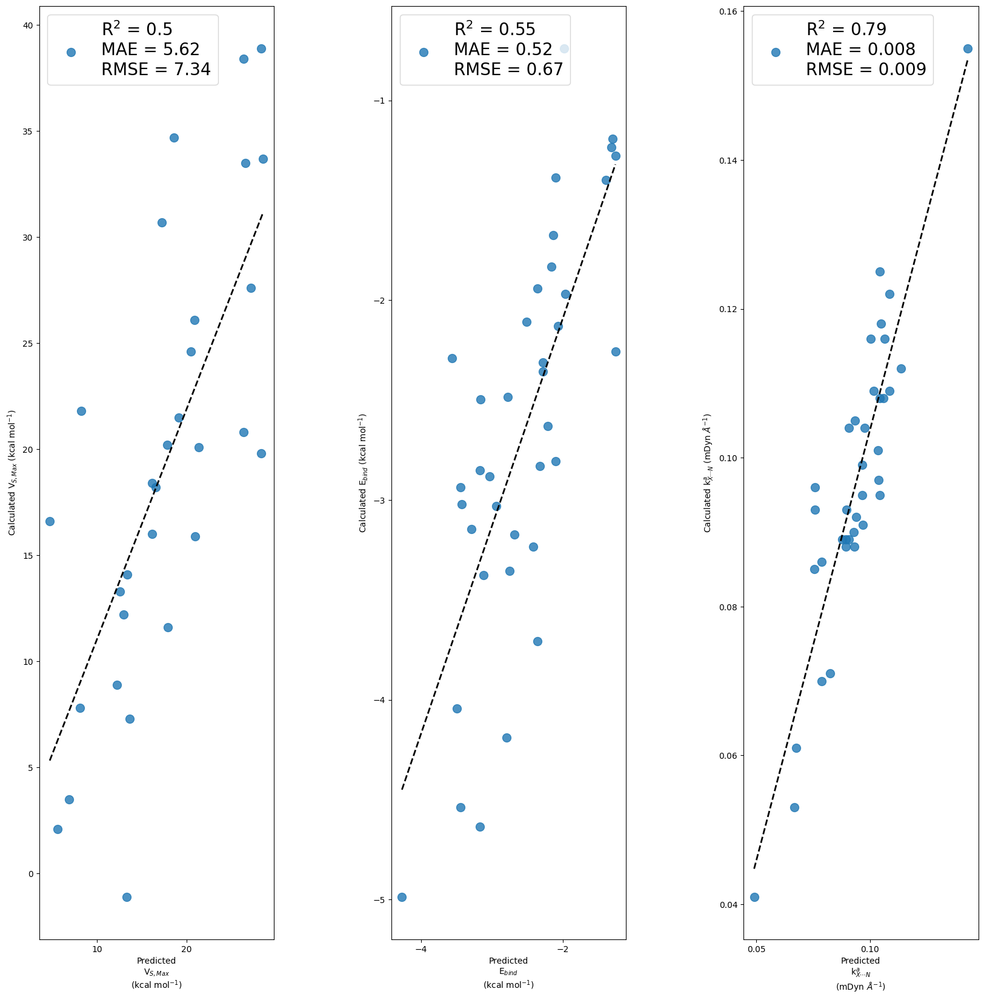

In [57]:
# RegPlot

# Benzene

# Chlorine

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

BCl_Vmax_rgplt = sns.regplot(x = BCl_RF_Vmax_MFP_pred, y = BCl_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BCl_Ebind_rgplt = sns.regplot(x = BCl_RF_Ebind_MFP_pred, y = BCl_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BCl_kXN_rgplt = sns.regplot(x = BCl_RF_kXN_MFP_pred, y = BCl_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BCl_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left')

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BCl_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left')

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BCl_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BCl_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left')

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

# plt.savefig("Figures/BCl_RF_MFP_regplot.pdf",format='pdf',
#             bbox_inches='tight',transparent=True,dpi=600)

plt.show()

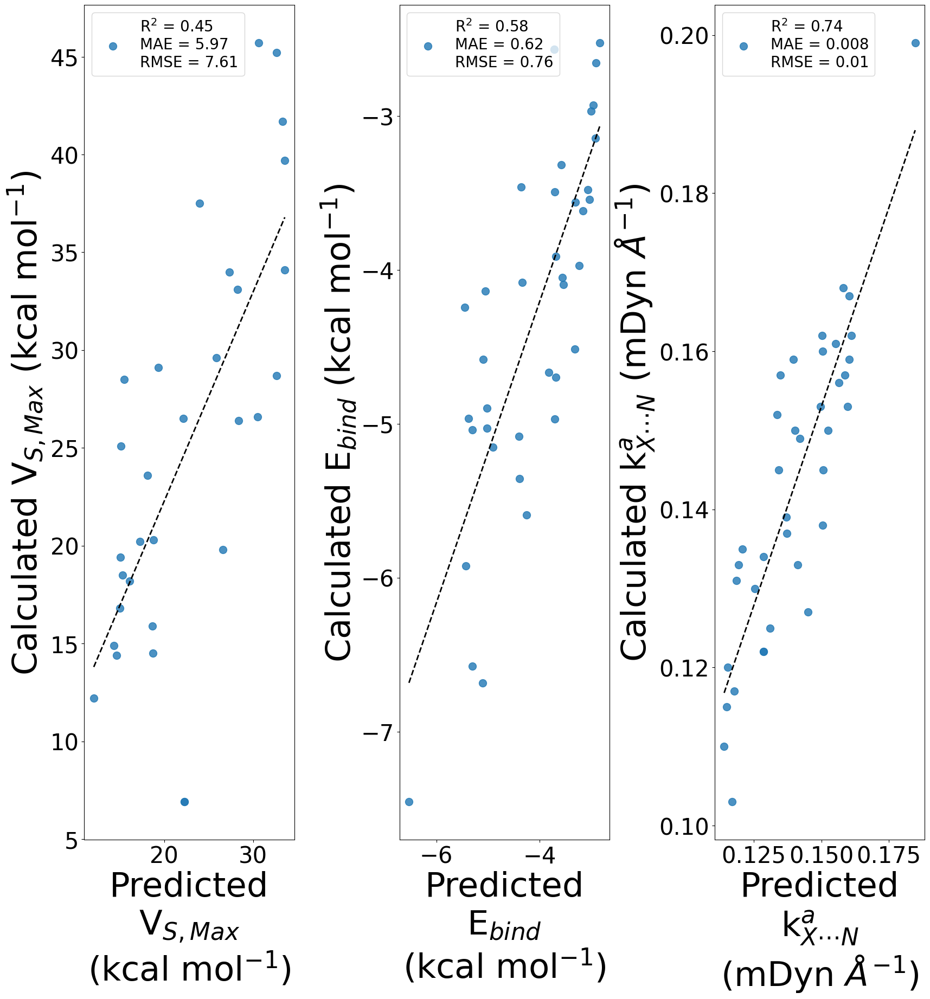

In [134]:
# RegPlot

# Benzene

# Bromine

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

BBr_Vmax_rgplt = sns.regplot(x = BBr_RF_Vmax_MFP_pred, y = BBr_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BBr_Ebind_rgplt = sns.regplot(x = BBr_RF_Ebind_MFP_pred, y = BBr_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BBr_kXN_rgplt = sns.regplot(x = BBr_RF_kXN_MFP_pred, y = BBr_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BBr_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left')

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BBr_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left')

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BBr_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BBr_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left')

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

# plt.savefig("Figures/BBr_RF_MFP_regplot.pdf",format='pdf',
#             bbox_inches='tight',transparent=True,dpi=600)

plt.show()

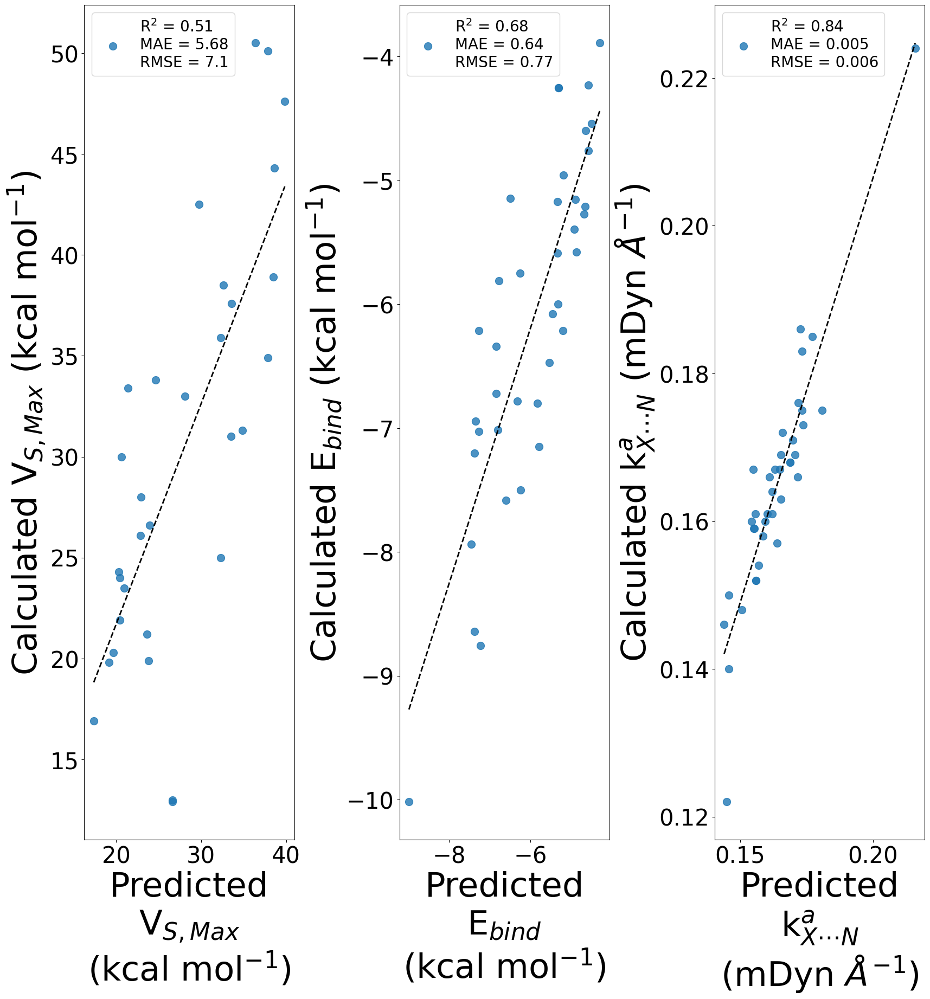

In [136]:
# RegPlot

# Benzene

# Iodine

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

BI_Vmax_rgplt = sns.regplot(x = BI_RF_Vmax_MFP_pred, y = BI_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BI_Ebind_rgplt = sns.regplot(x = BI_RF_Ebind_MFP_pred, y = BI_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BI_kXN_rgplt = sns.regplot(x = BI_RF_kXN_MFP_pred, y = BI_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BI_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BI_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left')

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BI_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BI_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left')

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BI_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BI_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left')

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

# plt.savefig("Figures/BI_RF_MFP_regplot.pdf",format='pdf',
#             bbox_inches='tight',transparent=True,dpi=600)

plt.show()

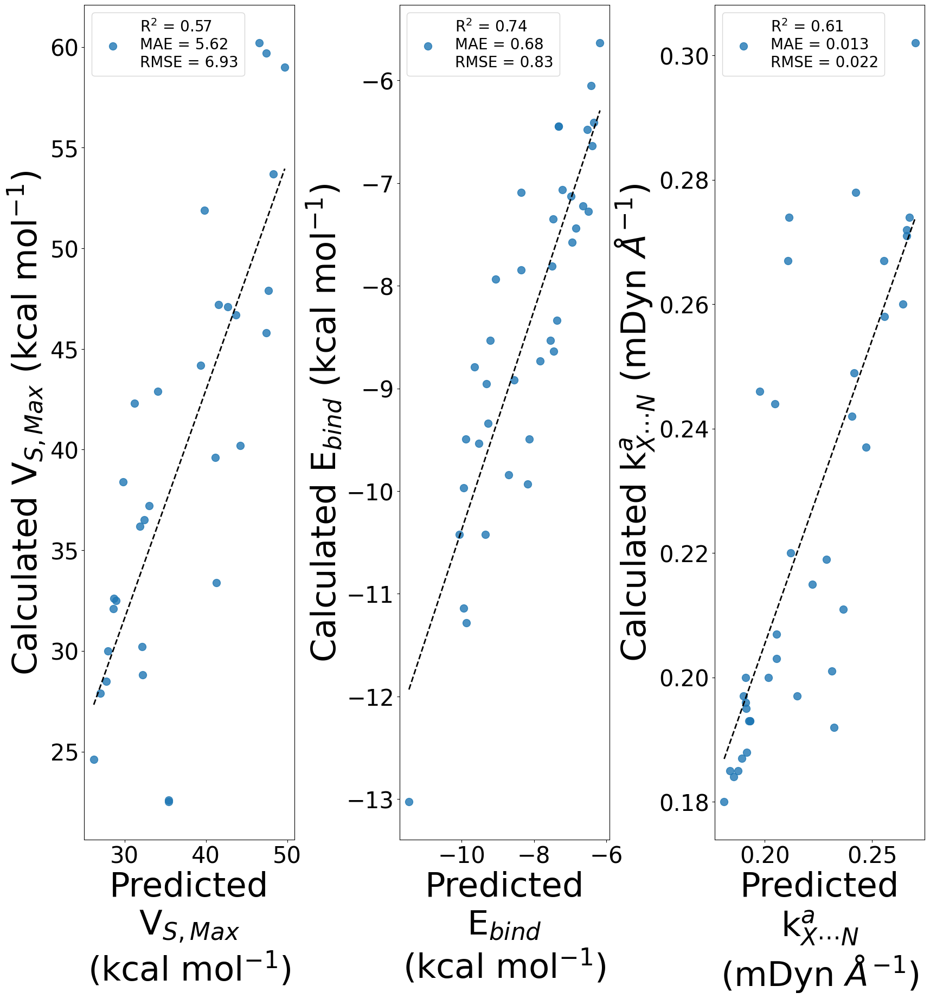

In [137]:
# RegPlot

# Benzene

# Astatine

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

BAt_Vmax_rgplt = sns.regplot(x = BAt_RF_Vmax_MFP_pred, y = BAt_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BAt_Ebind_rgplt = sns.regplot(x = BAt_RF_Ebind_MFP_pred, y = BAt_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BAt_kXN_rgplt = sns.regplot(x = BAt_RF_kXN_MFP_pred, y = BAt_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAt_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left')

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAt_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left')

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAt_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAt_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left')

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

# plt.savefig("Figures/BAt_RF_MFP_regplot.pdf",format='pdf',
#             bbox_inches='tight',transparent=True,dpi=600)

plt.show()

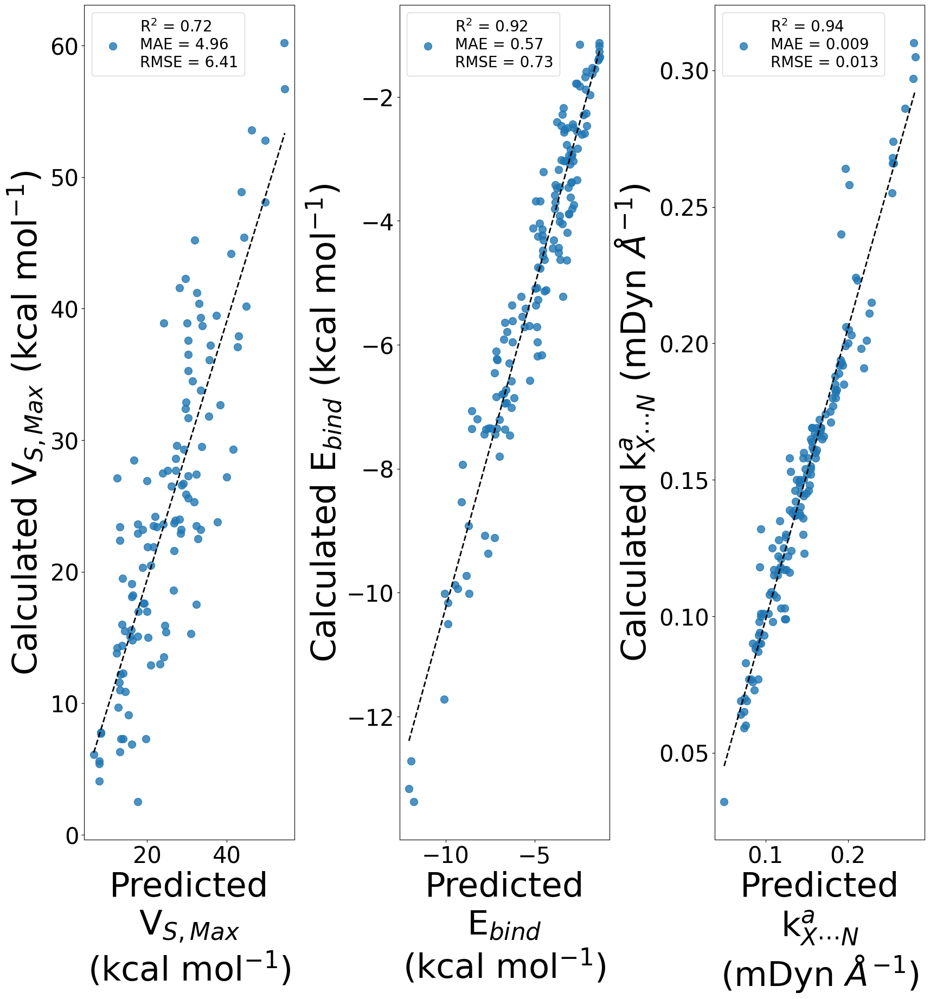

In [138]:
# RegPlot

# Benzene

# All Halogen

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

BX_Vmax_rgplt = sns.regplot(x = BX_RF_Vmax_MFP_pred, y = BX_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BX_Ebind_rgplt = sns.regplot(x = BX_RF_Ebind_MFP_pred, y = BX_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BX_kXN_rgplt = sns.regplot(x = BX_RF_kXN_MFP_pred, y = BX_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BX_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BX_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left')

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BX_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BX_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left')

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BX_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BX_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left')

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

# plt.savefig("Figures/BX_RF_MFP_regplot.pdf",format='pdf',
#             bbox_inches='tight',transparent=True,dpi=600)

plt.show()

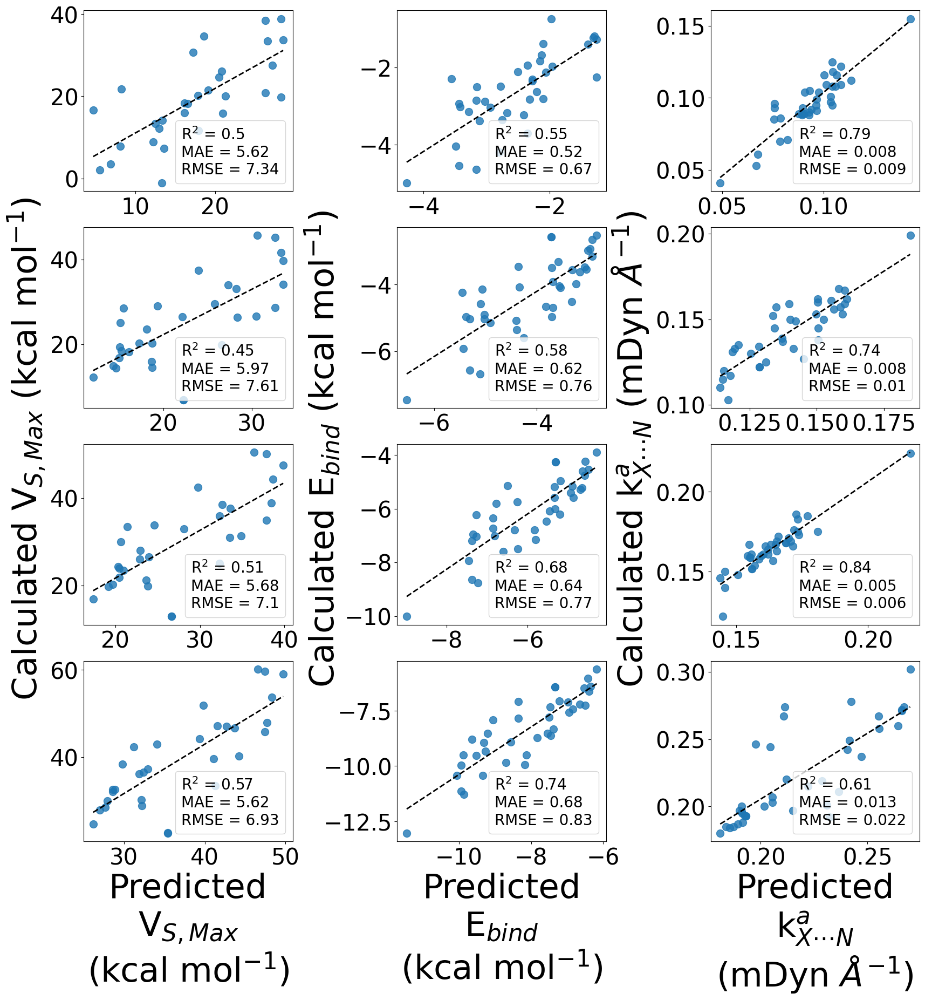

In [139]:
# RegPlot with all BX

fig, ax = plt.subplots(ncols=3,nrows=4)

## BCl == row 0
## BBr == row 1
##  BI == row 2
## BAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BCl_Vmax_rgplt = sns.regplot(x = BCl_RF_Vmax_MFP_pred, y = BCl_MFP_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BCl_Ebind_rgplt = sns.regplot(x = BCl_RF_Ebind_MFP_pred, y = BCl_MFP_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BCl_kXN_rgplt = sns.regplot(x = BCl_RF_kXN_MFP_pred, y = BCl_MFP_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BCl_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BCl_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BCl_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BCl_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BBr_Vmax_rgplt = sns.regplot(x = BBr_RF_Vmax_MFP_pred, y = BBr_MFP_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BBr_Ebind_rgplt = sns.regplot(x = BBr_RF_Ebind_MFP_pred, y = BBr_MFP_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BBr_kXN_rgplt = sns.regplot(x = BBr_RF_kXN_MFP_pred, y = BBr_MFP_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BBr_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BBr_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BBr_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BBr_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BI_Vmax_rgplt = sns.regplot(x = BI_RF_Vmax_MFP_pred, y = BI_MFP_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BI_Ebind_rgplt = sns.regplot(x = BI_RF_Ebind_MFP_pred, y = BI_MFP_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BI_kXN_rgplt = sns.regplot(x = BI_RF_kXN_MFP_pred, y = BI_MFP_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BI_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BI_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BI_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BI_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BI_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BI_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAt_Vmax_rgplt = sns.regplot(x = BAt_RF_Vmax_MFP_pred, y = BAt_MFP_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAt_Ebind_rgplt = sns.regplot(x = BAt_RF_Ebind_MFP_pred, y = BAt_MFP_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAt_kXN_rgplt = sns.regplot(x = BAt_RF_kXN_MFP_pred, y = BAt_MFP_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAt_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAt_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAt_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAt_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BCl_BBr_BI_BAt_RF_MFP_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

###### Data Based Approach

In [140]:
# Random Forest Regression -- Data Based Approach

# Benzene

## Chlorine

### Vmax
BCl_RF_Vmax = RandomForestRegressor().fit(BCl_Vmax_X_train, BCl_Vmax_Y_train)

### Ebind
BCl_RF_Ebind = RandomForestRegressor().fit(BCl_Ebind_X_train, BCl_Ebind_Y_train)

### kXN
BCl_RF_kXN = RandomForestRegressor().fit(BCl_kXN_X_train, BCl_kXN_Y_train)

## Bromine

### Vmax
BBr_RF_Vmax = RandomForestRegressor().fit(BBr_Vmax_X_train, BBr_Vmax_Y_train)

### Ebind
BBr_RF_Ebind = RandomForestRegressor().fit(BBr_Ebind_X_train, BBr_Ebind_Y_train)

### kXN
BBr_RF_kXN = RandomForestRegressor().fit(BBr_kXN_X_train, BBr_kXN_Y_train)

## Iodine

### Vmax
BI_RF_Vmax = RandomForestRegressor().fit(BI_Vmax_X_train, BI_Vmax_Y_train)

### Ebind
BI_RF_Ebind = RandomForestRegressor().fit(BI_Ebind_X_train, BI_Ebind_Y_train)

### kXN
BI_RF_kXN = RandomForestRegressor().fit(BI_kXN_X_train, BI_kXN_Y_train)

## Astatine

### Vmax
BAt_RF_Vmax = RandomForestRegressor().fit(BAt_Vmax_X_train, BAt_Vmax_Y_train)

### Ebind
BAt_RF_Ebind = RandomForestRegressor().fit(BAt_Ebind_X_train, BAt_Ebind_Y_train)

### kXN
BAt_RF_kXN = RandomForestRegressor().fit(BAt_kXN_X_train, BAt_kXN_Y_train)

## All Halogen

### Vmax
BX_RF_Vmax = RandomForestRegressor().fit(BX_Vmax_X_train, BX_Vmax_Y_train)

### Ebind
BX_RF_Ebind = RandomForestRegressor().fit(BX_Ebind_X_train, BX_Ebind_Y_train)

### kXN
BX_RF_kXN = RandomForestRegressor().fit(BX_kXN_X_train, BX_kXN_Y_train)

In [141]:
# Random Forest Predictions

# Benzene

## Chlorine

### Vmax

BCl_RF_Vmax_pred = BCl_RF_Vmax.predict(BCl_Vmax_X_test)

### Ebind

BCl_RF_Ebind_pred = BCl_RF_Ebind.predict(BCl_Ebind_X_test)

### kXN

BCl_RF_kXN_pred = BCl_RF_kXN.predict(BCl_kXN_X_test)

## Bromine

### Vmax

BBr_RF_Vmax_pred = BBr_RF_Vmax.predict(BBr_Vmax_X_test)

### Ebind

BBr_RF_Ebind_pred = BBr_RF_Ebind.predict(BBr_Ebind_X_test)

### kXN

BBr_RF_kXN_pred = BBr_RF_kXN.predict(BBr_kXN_X_test)

## Iodine

### Vmax

BI_RF_Vmax_pred = BI_RF_Vmax.predict(BI_Vmax_X_test)

### Ebind

BI_RF_Ebind_pred = BI_RF_Ebind.predict(BI_Ebind_X_test)

### kXN

BI_RF_kXN_pred = BI_RF_kXN.predict(BI_kXN_X_test)

## Astatine

### Vmax

BAt_RF_Vmax_pred = BAt_RF_Vmax.predict(BAt_Vmax_X_test)

### Ebind

BAt_RF_Ebind_pred = BAt_RF_Ebind.predict(BAt_Ebind_X_test)

### kXN

BAt_RF_kXN_pred = BAt_RF_kXN.predict(BAt_kXN_X_test)

## All Halogen

### Vmax

BX_RF_Vmax_pred = BX_RF_Vmax.predict(BX_Vmax_X_test)

### Ebind

BX_RF_Ebind_pred = BX_RF_Ebind.predict(BX_Ebind_X_test)

### kXN

BX_RF_kXN_pred = BX_RF_kXN.predict(BX_kXN_X_test)

In [142]:
# Accuracy Measurements -- R^2, MAE, RMSE

# Benzene

## Chlorine

### Vmax

BCl_RF_Vmax_r2 = r2_score(BCl_Vmax_Y_test, BCl_RF_Vmax_pred)
BCl_RF_Vmax_mae = mean_absolute_error(BCl_Vmax_Y_test, BCl_RF_Vmax_pred)
BCl_RF_Vmax_rmse = mean_squared_error(BCl_Vmax_Y_test, BCl_RF_Vmax_pred, squared=False)

### Ebind

BCl_RF_Ebind_r2 = r2_score(BCl_Ebind_Y_test, BCl_RF_Ebind_pred)
BCl_RF_Ebind_mae = mean_absolute_error(BCl_Ebind_Y_test, BCl_RF_Ebind_pred)
BCl_RF_Ebind_rmse = mean_squared_error(BCl_Ebind_Y_test, BCl_RF_Ebind_pred, squared=False)

### kXN

BCl_RF_kXN_r2 = r2_score(BCl_kXN_Y_test, BCl_RF_kXN_pred)
BCl_RF_kXN_mae = mean_absolute_error(BCl_kXN_Y_test, BCl_RF_kXN_pred)
BCl_RF_kXN_rmse = mean_squared_error(BCl_kXN_Y_test, BCl_RF_kXN_pred, squared=False)

## Bromine

### Vmax

BBr_RF_Vmax_r2 = r2_score(BBr_Vmax_Y_test, BBr_RF_Vmax_pred)
BBr_RF_Vmax_mae = mean_absolute_error(BBr_Vmax_Y_test, BBr_RF_Vmax_pred)
BBr_RF_Vmax_rmse = mean_squared_error(BBr_Vmax_Y_test, BBr_RF_Vmax_pred, squared=False)

### Ebind

BBr_RF_Ebind_r2 = r2_score(BBr_Ebind_Y_test, BBr_RF_Ebind_pred)
BBr_RF_Ebind_mae = mean_absolute_error(BBr_Ebind_Y_test, BBr_RF_Ebind_pred)
BBr_RF_Ebind_rmse = mean_squared_error(BBr_Ebind_Y_test, BBr_RF_Ebind_pred, squared=False)

### kXN

BBr_RF_kXN_r2 = r2_score(BBr_kXN_Y_test, BBr_RF_kXN_pred)
BBr_RF_kXN_mae = mean_absolute_error(BBr_kXN_Y_test, BBr_RF_kXN_pred)
BBr_RF_kXN_rmse = mean_squared_error(BBr_kXN_Y_test, BBr_RF_kXN_pred, squared=False)

## Iodine

### Vmax

BI_RF_Vmax_r2 = r2_score(BI_Vmax_Y_test, BI_RF_Vmax_pred)
BI_RF_Vmax_mae = mean_absolute_error(BI_Vmax_Y_test, BI_RF_Vmax_pred)
BI_RF_Vmax_rmse = mean_squared_error(BI_Vmax_Y_test, BI_RF_Vmax_pred, squared=False)

### Ebind

BI_RF_Ebind_r2 = r2_score(BI_Ebind_Y_test, BI_RF_Ebind_pred)
BI_RF_Ebind_mae = mean_absolute_error(BI_Ebind_Y_test, BI_RF_Ebind_pred)
BI_RF_Ebind_rmse = mean_squared_error(BI_Ebind_Y_test, BI_RF_Ebind_pred, squared=False)

### kXN

BI_RF_kXN_r2 = r2_score(BI_kXN_Y_test, BI_RF_kXN_pred)
BI_RF_kXN_mae = mean_absolute_error(BI_kXN_Y_test, BI_RF_kXN_pred)
BI_RF_kXN_rmse = mean_squared_error(BI_kXN_Y_test, BI_RF_kXN_pred, squared=False)

## Astatine

### Vmax

BAt_RF_Vmax_r2 = r2_score(BAt_Vmax_Y_test, BAt_RF_Vmax_pred)
BAt_RF_Vmax_mae = mean_absolute_error(BAt_Vmax_Y_test, BAt_RF_Vmax_pred)
BAt_RF_Vmax_rmse = mean_squared_error(BAt_Vmax_Y_test, BAt_RF_Vmax_pred, squared=False)

### Ebind

BAt_RF_Ebind_r2 = r2_score(BAt_Ebind_Y_test, BAt_RF_Ebind_pred)
BAt_RF_Ebind_mae = mean_absolute_error(BAt_Ebind_Y_test, BAt_RF_Ebind_pred)
BAt_RF_Ebind_rmse = mean_squared_error(BAt_Ebind_Y_test, BAt_RF_Ebind_pred, squared=False)

### kXN

BAt_RF_kXN_r2 = r2_score(BAt_kXN_Y_test, BAt_RF_kXN_pred)
BAt_RF_kXN_mae = mean_absolute_error(BAt_kXN_Y_test, BAt_RF_kXN_pred)
BAt_RF_kXN_rmse = mean_squared_error(BAt_kXN_Y_test, BAt_RF_kXN_pred, squared=False)

## All Halogen

### Vmax

BX_RF_Vmax_r2 = r2_score(BX_Vmax_Y_test, BX_RF_Vmax_pred)
BX_RF_Vmax_mae = mean_absolute_error(BX_Vmax_Y_test, BX_RF_Vmax_pred)
BX_RF_Vmax_rmse = mean_squared_error(BX_Vmax_Y_test, BX_RF_Vmax_pred, squared=False)

### Ebind

BX_RF_Ebind_r2 = r2_score(BX_Ebind_Y_test, BX_RF_Ebind_pred)
BX_RF_Ebind_mae = mean_absolute_error(BX_Ebind_Y_test, BX_RF_Ebind_pred)
BX_RF_Ebind_rmse = mean_squared_error(BX_Ebind_Y_test, BX_RF_Ebind_pred, squared=False)

### kXN

BX_RF_kXN_r2 = r2_score(BX_kXN_Y_test, BX_RF_kXN_pred)
BX_RF_kXN_mae = mean_absolute_error(BX_kXN_Y_test, BX_RF_kXN_pred)
BX_RF_kXN_rmse = mean_squared_error(BX_kXN_Y_test, BX_RF_kXN_pred, squared=False)

Cross Validation

In [143]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# RF method

# Benzene

## Chlorine

### Vmax

BCl_Vmax_cv_rf = RandomForestRegressor(random_state=34)

### Ebind

BCl_Ebind_cv_rf = RandomForestRegressor(random_state=34)

### kXN

BCl_kXN_cv_rf = RandomForestRegressor(random_state=34)

## Bromine

### Vmax

BBr_Vmax_cv_rf = RandomForestRegressor(random_state=34)

### Ebind

BBr_Ebind_cv_rf = RandomForestRegressor(random_state=34)

### kXN

BBr_kXN_cv_rf = RandomForestRegressor(random_state=34)

## Iodine

### Vmax

BI_Vmax_cv_rf = RandomForestRegressor(random_state=34)

### Ebind

BI_Ebind_cv_rf = RandomForestRegressor(random_state=34)

### kXN

BI_kXN_cv_rf = RandomForestRegressor(random_state=34)

## Astatine

### Vmax

BAt_Vmax_cv_rf = RandomForestRegressor(random_state=34)

### Ebind

BAt_Ebind_cv_rf = RandomForestRegressor(random_state=34)

### kXN

BAt_kXN_cv_rf = RandomForestRegressor(random_state=34)

## All Halogen

### Vmax

BX_Vmax_cv_rf = RandomForestRegressor(random_state=34)

### Ebind

BX_Ebind_cv_rf = RandomForestRegressor(random_state=34)

### kXN

BX_kXN_cv_rf = RandomForestRegressor(random_state=34)

In [144]:
# CV -- 5 fold cross validation

# Benzene

## Chlorine

### Vmax

BCl_Vmax_rf_cv = cross_validate(BCl_Vmax_cv_rf, BCl_Vmax_selfeat, BCl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BCl_Ebind_rf_cv = cross_validate(BCl_Ebind_cv_rf, BCl_Ebind_selfeat, BCl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BCl_kXN_rf_cv = cross_validate(BCl_kXN_cv_rf, BCl_kXN_selfeat, BCl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BBr_Vmax_rf_cv = cross_validate(BBr_Vmax_cv_rf, BBr_Vmax_selfeat, BBr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BBr_Ebind_rf_cv = cross_validate(BBr_Ebind_cv_rf, BBr_Ebind_selfeat, BBr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BBr_kXN_rf_cv = cross_validate(BBr_kXN_cv_rf, BBr_kXN_selfeat, BBr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BI_Vmax_rf_cv = cross_validate(BI_Vmax_cv_rf, BI_Vmax_selfeat, BI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BI_Ebind_rf_cv = cross_validate(BI_Ebind_cv_rf, BI_Ebind_selfeat, BI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BI_kXN_rf_cv = cross_validate(BI_kXN_cv_rf, BI_kXN_selfeat, BI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAt_Vmax_rf_cv = cross_validate(BAt_Vmax_cv_rf, BAt_Vmax_selfeat, BAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAt_Ebind_rf_cv = cross_validate(BAt_Ebind_cv_rf, BAt_Ebind_selfeat, BAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAt_kXN_rf_cv = cross_validate(BAt_kXN_cv_rf, BAt_kXN_selfeat, BAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BX_Vmax_rf_cv = cross_validate(BX_Vmax_cv_rf, BX_Vmax_selfeat, BX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BX_Ebind_rf_cv = cross_validate(BX_Ebind_cv_rf, BX_Ebind_selfeat, BX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BX_kXN_rf_cv = cross_validate(BX_kXN_cv_rf, BX_kXN_selfeat, BX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [145]:
# CV Scores

# Benzene

## Chlorine

### Vmax

BCl_Vmax_rf_cv_res_lst = [
    round(np.mean(BCl_Vmax_rf_cv['test_r2']), 2), 
    round(np.mean(-BCl_Vmax_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Vmax_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BCl_Ebind_rf_cv_res_lst = [
    round(np.mean(BCl_Ebind_rf_cv['test_r2']), 2), 
    round(np.mean(-BCl_Ebind_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Ebind_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BCl_kXN_rf_cv_res_lst = [
    round(np.mean(BCl_kXN_rf_cv['test_r2']), 2), 
    round(np.mean(-BCl_kXN_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BCl_kXN_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BBr_Vmax_rf_cv_res_lst = [
    round(np.mean(BBr_Vmax_rf_cv['test_r2']), 2), 
    round(np.mean(-BBr_Vmax_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Vmax_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BBr_Ebind_rf_cv_res_lst = [
    round(np.mean(BBr_Ebind_rf_cv['test_r2']), 2), 
    round(np.mean(-BBr_Ebind_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Ebind_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BBr_kXN_rf_cv_res_lst = [
    round(np.mean(BBr_kXN_rf_cv['test_r2']), 2), 
    round(np.mean(-BBr_kXN_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BBr_kXN_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BI_Vmax_rf_cv_res_lst = [
    round(np.mean(BI_Vmax_rf_cv['test_r2']), 2), 
    round(np.mean(-BI_Vmax_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Vmax_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BI_Ebind_rf_cv_res_lst = [
    round(np.mean(BI_Ebind_rf_cv['test_r2']), 2), 
    round(np.mean(-BI_Ebind_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Ebind_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BI_kXN_rf_cv_res_lst = [
    round(np.mean(BI_kXN_rf_cv['test_r2']), 2), 
    round(np.mean(-BI_kXN_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BI_kXN_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAt_Vmax_rf_cv_res_lst = [
    round(np.mean(BAt_Vmax_rf_cv['test_r2']), 2), 
    round(np.mean(-BAt_Vmax_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Vmax_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAt_Ebind_rf_cv_res_lst = [
    round(np.mean(BAt_Ebind_rf_cv['test_r2']), 2), 
    round(np.mean(-BAt_Ebind_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Ebind_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAt_kXN_rf_cv_res_lst = [
    round(np.mean(BAt_kXN_rf_cv['test_r2']), 2), 
    round(np.mean(-BAt_kXN_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAt_kXN_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BX_Vmax_rf_cv_res_lst = [
    round(np.mean(BX_Vmax_rf_cv['test_r2']), 2), 
    round(np.mean(-BX_Vmax_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Vmax_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BX_Ebind_rf_cv_res_lst = [
    round(np.mean(BX_Ebind_rf_cv['test_r2']), 2), 
    round(np.mean(-BX_Ebind_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Ebind_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BX_kXN_rf_cv_res_lst = [
    round(np.mean(BX_kXN_rf_cv['test_r2']), 2), 
    round(np.mean(-BX_kXN_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BX_kXN_rf_cv['test_neg_root_mean_squared_error']), 3)
]

In [146]:
# Create CV metrics Dataframe

# RF

# Benzene

# constructing dictionary for data

## Vmax

BX_CV_RF_Vmax_dict = {'BCl': BCl_Vmax_rf_cv_res_lst, 'BBr': BBr_Vmax_rf_cv_res_lst, 
                     'BI': BI_Vmax_rf_cv_res_lst, 'BAt': BAt_Vmax_rf_cv_res_lst, 
                      'BX': BX_Vmax_rf_cv_res_lst}

BX_CV_RF_Vmax_df = pd.DataFrame(data = BX_CV_RF_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BX_CV_RF_Ebind_dict = {'BCl': BCl_Ebind_rf_cv_res_lst, 'BBr': BBr_Ebind_rf_cv_res_lst, 
                     'BI': BI_Ebind_rf_cv_res_lst, 'BAt': BAt_Ebind_rf_cv_res_lst, 
                      'BX': BX_Ebind_rf_cv_res_lst}

BX_CV_RF_Ebind_df = pd.DataFrame(data = BX_CV_RF_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BX_CV_RF_kXN_dict = {'BCl': BCl_kXN_rf_cv_res_lst, 'BBr': BBr_kXN_rf_cv_res_lst, 
                     'BI': BI_kXN_rf_cv_res_lst, 'BAt': BAt_kXN_rf_cv_res_lst, 
                      'BX': BX_kXN_rf_cv_res_lst}

BX_CV_RF_kXN_df = pd.DataFrame(data = BX_CV_RF_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BX_CV_RF_Vmax_df.to_csv('CV_results/BX_RF_cv_Vmax_metric_results.csv')
BX_CV_RF_Ebind_df.to_csv('CV_results/BX_RF_cv_Ebind_metric_results.csv')
BX_CV_RF_kXN_df.to_csv('CV_results/BX_RF_cv_kXN_metric_results.csv')

RegPlots

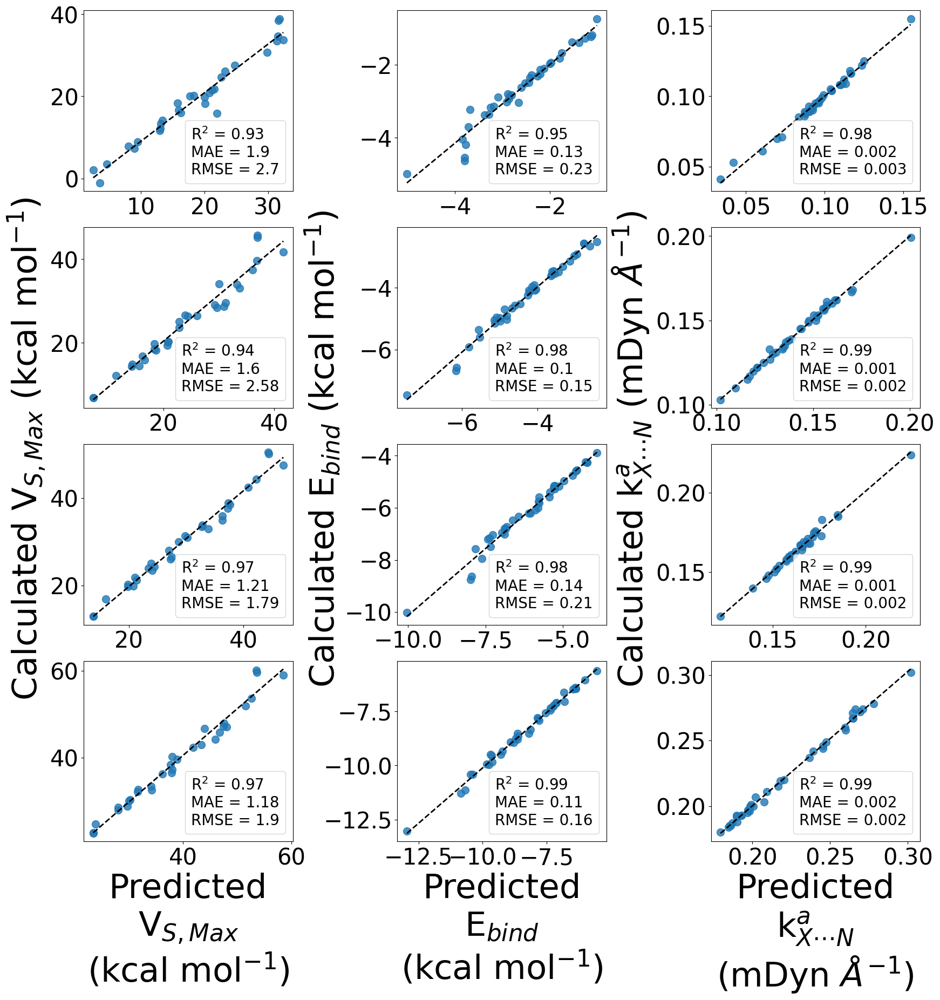

In [147]:
# RegPlot with all BX

fig, ax = plt.subplots(ncols=3,nrows=4)

## BCl == row 0
## BBr == row 1
##  BI == row 2
## BAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BCl_Vmax_rgplt = sns.regplot(x = BCl_RF_Vmax_pred, y = BCl_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BCl_Ebind_rgplt = sns.regplot(x = BCl_RF_Ebind_pred, y = BCl_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BCl_kXN_rgplt = sns.regplot(x = BCl_RF_kXN_pred, y = BCl_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_RF_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BCl_RF_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_RF_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_RF_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BCl_RF_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_RF_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_RF_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BCl_RF_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BCl_RF_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BBr_Vmax_rgplt = sns.regplot(x = BBr_RF_Vmax_pred, y = BBr_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BBr_Ebind_rgplt = sns.regplot(x = BBr_RF_Ebind_pred, y = BBr_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BBr_kXN_rgplt = sns.regplot(x = BBr_RF_kXN_pred, y = BBr_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_RF_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BBr_RF_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_RF_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_RF_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BBr_RF_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_RF_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_RF_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BBr_RF_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BBr_RF_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BI_Vmax_rgplt = sns.regplot(x = BI_RF_Vmax_pred, y = BI_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BI_Ebind_rgplt = sns.regplot(x = BI_RF_Ebind_pred, y = BI_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BI_kXN_rgplt = sns.regplot(x = BI_RF_kXN_pred, y = BI_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_RF_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BI_RF_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BI_RF_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_RF_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BI_RF_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BI_RF_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_RF_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BI_RF_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BI_RF_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAt_Vmax_rgplt = sns.regplot(x = BAt_RF_Vmax_pred, y = BAt_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAt_Ebind_rgplt = sns.regplot(x = BAt_RF_Ebind_pred, y = BAt_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAt_kXN_rgplt = sns.regplot(x = BAt_RF_kXN_pred, y = BAt_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_RF_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAt_RF_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_RF_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_RF_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAt_RF_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_RF_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_RF_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAt_RF_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAt_RF_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BCl_BBr_BI_BAt_RF_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

##### Ethynyl Benzene

###### Morgan Fingerprints

In [148]:
# Random Forest Regression -- Morgan Finger Prints

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_RF_Vmax_MFP = RandomForestRegressor(random_state=42).fit(BACl_MFP_Vmax_X_train, BACl_MFP_Vmax_Y_train)

### Ebind
BACl_RF_Ebind_MFP = RandomForestRegressor(random_state=42).fit(BACl_MFP_Ebind_X_train, BACl_MFP_Ebind_Y_train)

### kXN
BACl_RF_kXN_MFP = RandomForestRegressor(random_state=42).fit(BACl_MFP_kXN_X_train, BACl_MFP_kXN_Y_train)

## Bromine

### Vmax
BABr_RF_Vmax_MFP = RandomForestRegressor(random_state=42).fit(BABr_MFP_Vmax_X_train, BABr_MFP_Vmax_Y_train)

### Ebind
BABr_RF_Ebind_MFP = RandomForestRegressor(random_state=42).fit(BABr_MFP_Ebind_X_train, BABr_MFP_Ebind_Y_train)

### kXN
BABr_RF_kXN_MFP = RandomForestRegressor(random_state=42).fit(BABr_MFP_kXN_X_train, BABr_MFP_kXN_Y_train)

## Iodine

### Vmax
BAI_RF_Vmax_MFP = RandomForestRegressor(random_state=42).fit(BAI_MFP_Vmax_X_train, BAI_MFP_Vmax_Y_train)

### Ebind
BAI_RF_Ebind_MFP = RandomForestRegressor(random_state=42).fit(BAI_MFP_Ebind_X_train, BAI_MFP_Ebind_Y_train)

### kXN
BAI_RF_kXN_MFP = RandomForestRegressor(random_state=42).fit(BAI_MFP_kXN_X_train, BAI_MFP_kXN_Y_train)

## Astatine

### Vmax
BAAt_RF_Vmax_MFP = RandomForestRegressor(random_state=42).fit(BAAt_MFP_Vmax_X_train, BAAt_MFP_Vmax_Y_train)

### Ebind
BAAt_RF_Ebind_MFP = RandomForestRegressor(random_state=42).fit(BAAt_MFP_Ebind_X_train, BAAt_MFP_Ebind_Y_train)

### kXN
BAAt_RF_kXN_MFP = RandomForestRegressor(random_state=42).fit(BAAt_MFP_kXN_X_train, BAAt_MFP_kXN_Y_train)

## All Halogen

### Vmax
BAX_RF_Vmax_MFP = RandomForestRegressor(random_state=42).fit(BAX_MFP_Vmax_X_train, BAX_MFP_Vmax_Y_train)

### Ebind
BAX_RF_Ebind_MFP = RandomForestRegressor(random_state=42).fit(BAX_MFP_Ebind_X_train, BAX_MFP_Ebind_Y_train)

### kXN
BAX_RF_kXN_MFP = RandomForestRegressor(random_state=42).fit(BAX_MFP_kXN_X_train, BAX_MFP_kXN_Y_train)

In [149]:
# Predictions

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_RF_Vmax_MFP_pred = BACl_RF_Vmax_MFP.predict(BACl_MFP_Vmax_X_test)

### Ebind
BACl_RF_Ebind_MFP_pred = BACl_RF_Ebind_MFP.predict(BACl_MFP_Ebind_X_test)

### kXN
BACl_RF_kXN_MFP_pred = BACl_RF_kXN_MFP.predict(BACl_MFP_kXN_X_test)

## Bromine

### Vmax
BABr_RF_Vmax_MFP_pred = BABr_RF_Vmax_MFP.predict(BABr_MFP_Vmax_X_test)

### Ebind
BABr_RF_Ebind_MFP_pred = BABr_RF_Ebind_MFP.predict(BABr_MFP_Ebind_X_test)

### kXN
BABr_RF_kXN_MFP_pred = BABr_RF_kXN_MFP.predict(BABr_MFP_kXN_X_test)

## Iodine

### Vmax
BAI_RF_Vmax_MFP_pred = BAI_RF_Vmax_MFP.predict(BAI_MFP_Vmax_X_test)

### Ebind
BAI_RF_Ebind_MFP_pred = BAI_RF_Ebind_MFP.predict(BAI_MFP_Ebind_X_test)

### kXN
BAI_RF_kXN_MFP_pred = BAI_RF_kXN_MFP.predict(BAI_MFP_kXN_X_test)

## Astatine

### Vmax
BAAt_RF_Vmax_MFP_pred = BAAt_RF_Vmax_MFP.predict(BAAt_MFP_Vmax_X_test)

### Ebind
BAAt_RF_Ebind_MFP_pred = BAAt_RF_Ebind_MFP.predict(BAAt_MFP_Ebind_X_test)

### kXN
BAAt_RF_kXN_MFP_pred = BAAt_RF_kXN_MFP.predict(BAAt_MFP_kXN_X_test)

## All Halogen

### Vmax
BAX_RF_Vmax_MFP_pred = BAX_RF_Vmax_MFP.predict(BAX_MFP_Vmax_X_test)

### Ebind
BAX_RF_Ebind_MFP_pred = BAX_RF_Ebind_MFP.predict(BAX_MFP_Ebind_X_test)

### kXN
BAX_RF_kXN_MFP_pred = BAX_RF_kXN_MFP.predict(BAX_MFP_kXN_X_test)

In [150]:
# Accuracy measurments

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_RF_MFP_Vmax_r2 = r2_score(BACl_MFP_Vmax_Y_test, BACl_RF_Vmax_MFP_pred)
BACl_RF_MFP_Vmax_mae = mean_absolute_error(BACl_MFP_Vmax_Y_test, BACl_RF_Vmax_MFP_pred)
BACl_RF_MFP_Vmax_rmse = mean_squared_error(BACl_MFP_Vmax_Y_test, BACl_RF_Vmax_MFP_pred, squared=False)

### Ebind
BACl_RF_MFP_Ebind_r2 = r2_score(BACl_MFP_Ebind_Y_test, BACl_RF_Ebind_MFP_pred)
BACl_RF_MFP_Ebind_mae = mean_absolute_error(BACl_MFP_Ebind_Y_test, BACl_RF_Ebind_MFP_pred)
BACl_RF_MFP_Ebind_rmse = mean_squared_error(BACl_MFP_Ebind_Y_test, BACl_RF_Ebind_MFP_pred, squared=False)

### kXN
BACl_RF_MFP_kXN_r2 = r2_score(BACl_MFP_kXN_Y_test, BACl_RF_kXN_MFP_pred)
BACl_RF_MFP_kXN_mae = mean_absolute_error(BACl_MFP_kXN_Y_test, BACl_RF_kXN_MFP_pred)
BACl_RF_MFP_kXN_rmse = mean_squared_error(BACl_MFP_kXN_Y_test, BACl_RF_kXN_MFP_pred, squared=False)

## Bromine

### Vmax
BABr_RF_MFP_Vmax_r2 = r2_score(BABr_MFP_Vmax_Y_test, BABr_RF_Vmax_MFP_pred)
BABr_RF_MFP_Vmax_mae = mean_absolute_error(BABr_MFP_Vmax_Y_test, BABr_RF_Vmax_MFP_pred)
BABr_RF_MFP_Vmax_rmse = mean_squared_error(BABr_MFP_Vmax_Y_test, BABr_RF_Vmax_MFP_pred, squared=False)

### Ebind
BABr_RF_MFP_Ebind_r2 = r2_score(BABr_MFP_Ebind_Y_test, BABr_RF_Ebind_MFP_pred)
BABr_RF_MFP_Ebind_mae = mean_absolute_error(BABr_MFP_Ebind_Y_test, BABr_RF_Ebind_MFP_pred)
BABr_RF_MFP_Ebind_rmse = mean_squared_error(BABr_MFP_Ebind_Y_test, BABr_RF_Ebind_MFP_pred, squared=False)

### kXN
BABr_RF_MFP_kXN_r2 = r2_score(BABr_MFP_kXN_Y_test, BABr_RF_kXN_MFP_pred)
BABr_RF_MFP_kXN_mae = mean_absolute_error(BABr_MFP_kXN_Y_test, BABr_RF_kXN_MFP_pred)
BABr_RF_MFP_kXN_rmse = mean_squared_error(BABr_MFP_kXN_Y_test, BABr_RF_kXN_MFP_pred, squared=False)

## Iodine

### Vmax
BAI_RF_MFP_Vmax_r2 = r2_score(BAI_MFP_Vmax_Y_test, BAI_RF_Vmax_MFP_pred)
BAI_RF_MFP_Vmax_mae = mean_absolute_error(BAI_MFP_Vmax_Y_test, BAI_RF_Vmax_MFP_pred)
BAI_RF_MFP_Vmax_rmse = mean_squared_error(BAI_MFP_Vmax_Y_test, BAI_RF_Vmax_MFP_pred, squared=False)

### Ebind
BAI_RF_MFP_Ebind_r2 = r2_score(BAI_MFP_Ebind_Y_test, BAI_RF_Ebind_MFP_pred)
BAI_RF_MFP_Ebind_mae = mean_absolute_error(BAI_MFP_Ebind_Y_test, BAI_RF_Ebind_MFP_pred)
BAI_RF_MFP_Ebind_rmse = mean_squared_error(BAI_MFP_Ebind_Y_test, BAI_RF_Ebind_MFP_pred, squared=False)

### kXN
BAI_RF_MFP_kXN_r2 = r2_score(BAI_MFP_kXN_Y_test, BAI_RF_kXN_MFP_pred)
BAI_RF_MFP_kXN_mae = mean_absolute_error(BAI_MFP_kXN_Y_test, BAI_RF_kXN_MFP_pred)
BAI_RF_MFP_kXN_rmse = mean_squared_error(BAI_MFP_kXN_Y_test, BAI_RF_kXN_MFP_pred, squared=False)

## Astatine

### Vmax
BAAt_RF_MFP_Vmax_r2 = r2_score(BAAt_MFP_Vmax_Y_test, BAAt_RF_Vmax_MFP_pred)
BAAt_RF_MFP_Vmax_mae = mean_absolute_error(BAAt_MFP_Vmax_Y_test, BAAt_RF_Vmax_MFP_pred)
BAAt_RF_MFP_Vmax_rmse = mean_squared_error(BAAt_MFP_Vmax_Y_test, BAAt_RF_Vmax_MFP_pred, squared=False)

### Ebind
BAAt_RF_MFP_Ebind_r2 = r2_score(BAAt_MFP_Ebind_Y_test, BAAt_RF_Ebind_MFP_pred)
BAAt_RF_MFP_Ebind_mae = mean_absolute_error(BAAt_MFP_Ebind_Y_test, BAAt_RF_Ebind_MFP_pred)
BAAt_RF_MFP_Ebind_rmse = mean_squared_error(BAAt_MFP_Ebind_Y_test, BAAt_RF_Ebind_MFP_pred, squared=False)

### kXN
BAAt_RF_MFP_kXN_r2 = r2_score(BAAt_MFP_kXN_Y_test, BAAt_RF_kXN_MFP_pred)
BAAt_RF_MFP_kXN_mae = mean_absolute_error(BAAt_MFP_kXN_Y_test, BAAt_RF_kXN_MFP_pred)
BAAt_RF_MFP_kXN_rmse = mean_squared_error(BAAt_MFP_kXN_Y_test, BAAt_RF_kXN_MFP_pred, squared=False)

## All Halogen

### Vmax
BAX_RF_MFP_Vmax_r2 = r2_score(BAX_MFP_Vmax_Y_test, BAX_RF_Vmax_MFP_pred)
BAX_RF_MFP_Vmax_mae = mean_absolute_error(BAX_MFP_Vmax_Y_test, BAX_RF_Vmax_MFP_pred)
BAX_RF_MFP_Vmax_rmse = mean_squared_error(BAX_MFP_Vmax_Y_test, BAX_RF_Vmax_MFP_pred, squared=False)

### Ebind
BAX_RF_MFP_Ebind_r2 = r2_score(BAX_MFP_Ebind_Y_test, BAX_RF_Ebind_MFP_pred)
BAX_RF_MFP_Ebind_mae = mean_absolute_error(BAX_MFP_Ebind_Y_test, BAX_RF_Ebind_MFP_pred)
BAX_RF_MFP_Ebind_rmse = mean_squared_error(BAX_MFP_Ebind_Y_test, BAX_RF_Ebind_MFP_pred, squared=False)

### kXN
BAX_RF_MFP_kXN_r2 = r2_score(BAX_MFP_kXN_Y_test, BAX_RF_kXN_MFP_pred)
BAX_RF_MFP_kXN_mae = mean_absolute_error(BAX_MFP_kXN_Y_test, BAX_RF_kXN_MFP_pred)
BAX_RF_MFP_kXN_rmse = mean_squared_error(BAX_MFP_kXN_Y_test, BAX_RF_kXN_MFP_pred, squared=False)

Cross Validation

In [151]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# RF method

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_MFP_rf = RandomForestRegressor(random_state=34)

### Ebind

BACl_Ebind_MFP_rf = RandomForestRegressor(random_state=34)

### kXN

BACl_kXN_MFP_rf = RandomForestRegressor(random_state=34)

## Bromine

### Vmax

BABr_Vmax_MFP_rf = RandomForestRegressor(random_state=34)

### Ebind

BABr_Ebind_MFP_rf = RandomForestRegressor(random_state=34)

### kXN

BABr_kXN_MFP_rf = RandomForestRegressor(random_state=34)

## Iodine

### Vmax

BAI_Vmax_MFP_rf = RandomForestRegressor(random_state=34)

### Ebind

BAI_Ebind_MFP_rf = RandomForestRegressor(random_state=34)

### kXN

BAI_kXN_MFP_rf = RandomForestRegressor(random_state=34)

## Astatine

### Vmax

BAAt_Vmax_MFP_rf = RandomForestRegressor(random_state=34)

### Ebind

BAAt_Ebind_MFP_rf = RandomForestRegressor(random_state=34)

### kXN

BAAt_kXN_MFP_rf = RandomForestRegressor(random_state=34)

## All Halogen

### Vmax

BAX_Vmax_MFP_rf = RandomForestRegressor(random_state=34)

### Ebind

BAX_Ebind_MFP_rf = RandomForestRegressor(random_state=34)

### kXN

BAX_kXN_MFP_rf = RandomForestRegressor(random_state=34)

In [152]:
# Cross validation

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_MFP_rf_cv = cross_validate(BACl_Vmax_MFP_rf, BACl_MRG_df, BACl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BACl_Ebind_MFP_rf_cv = cross_validate(BACl_Ebind_MFP_rf, BACl_MRG_df, BACl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BACl_kXN_MFP_rf_cv = cross_validate(BACl_kXN_MFP_rf, BACl_MRG_df, BACl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BABr_Vmax_MFP_rf_cv = cross_validate(BABr_Vmax_MFP_rf, BABr_MRG_df, BABr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BABr_Ebind_MFP_rf_cv = cross_validate(BABr_Ebind_MFP_rf, BABr_MRG_df, BABr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BABr_kXN_MFP_rf_cv = cross_validate(BABr_kXN_MFP_rf, BABr_MRG_df, BABr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BAI_Vmax_MFP_rf_cv = cross_validate(BAI_Vmax_MFP_rf, BAI_MRG_df, BAI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAI_Ebind_MFP_rf_cv = cross_validate(BAI_Ebind_MFP_rf, BAI_MRG_df, BAI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAI_kXN_MFP_rf_cv = cross_validate(BAI_kXN_MFP_rf, BAI_MRG_df, BAI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAAt_Vmax_MFP_rf_cv = cross_validate(BAAt_Vmax_MFP_rf, BAAt_MRG_df, BAAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAAt_Ebind_MFP_rf_cv = cross_validate(BAAt_Ebind_MFP_rf, BAAt_MRG_df, BAAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAAt_kXN_MFP_rf_cv = cross_validate(BAAt_kXN_MFP_rf, BAAt_MRG_df, BAAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BAX_Vmax_MFP_rf_cv = cross_validate(BAX_Vmax_MFP_rf, BAX_MRG_df, BAX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAX_Ebind_MFP_rf_cv = cross_validate(BAX_Ebind_MFP_rf, BAX_MRG_df, BAX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAX_kXN_MFP_rf_cv = cross_validate(BAX_kXN_MFP_rf, BAX_MRG_df, BAX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [153]:
# CV Scores

# Benzene

## Chlorine

### Vmax

BACl_Vmax_MFP_rf_cv_res_lst = [
    round(np.mean(BACl_Vmax_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BACl_Vmax_MFP_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Vmax_MFP_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BACl_Ebind_MFP_rf_cv_res_lst = [
    round(np.mean(BACl_Ebind_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BACl_Ebind_MFP_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Ebind_MFP_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BACl_kXN_MFP_rf_cv_res_lst = [
    round(np.mean(BACl_kXN_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BACl_kXN_MFP_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BACl_kXN_MFP_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BABr_Vmax_MFP_rf_cv_res_lst = [
    round(np.mean(BABr_Vmax_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BABr_Vmax_MFP_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Vmax_MFP_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BABr_Ebind_MFP_rf_cv_res_lst = [
    round(np.mean(BABr_Ebind_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BABr_Ebind_MFP_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Ebind_MFP_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BABr_kXN_MFP_rf_cv_res_lst = [
    round(np.mean(BABr_kXN_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BABr_kXN_MFP_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BABr_kXN_MFP_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BAI_Vmax_MFP_rf_cv_res_lst = [
    round(np.mean(BAI_Vmax_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BAI_Vmax_MFP_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Vmax_MFP_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAI_Ebind_MFP_rf_cv_res_lst = [
    round(np.mean(BAI_Ebind_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BAI_Ebind_MFP_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Ebind_MFP_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAI_kXN_MFP_rf_cv_res_lst = [
    round(np.mean(BAI_kXN_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BAI_kXN_MFP_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAI_kXN_MFP_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAAt_Vmax_MFP_rf_cv_res_lst = [
    round(np.mean(BAAt_Vmax_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Vmax_MFP_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Vmax_MFP_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAAt_Ebind_MFP_rf_cv_res_lst = [
    round(np.mean(BAAt_Ebind_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Ebind_MFP_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Ebind_MFP_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAAt_kXN_MFP_rf_cv_res_lst = [
    round(np.mean(BAAt_kXN_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BAAt_kXN_MFP_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAAt_kXN_MFP_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BAX_Vmax_MFP_rf_cv_res_lst = [
    round(np.mean(BAX_Vmax_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BAX_Vmax_MFP_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Vmax_MFP_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAX_Ebind_MFP_rf_cv_res_lst = [
    round(np.mean(BAX_Ebind_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BAX_Ebind_MFP_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Ebind_MFP_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAX_kXN_MFP_rf_cv_res_lst = [
    round(np.mean(BAX_kXN_MFP_rf_cv['test_r2']), 2), 
    round(np.mean(-BAX_kXN_MFP_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAX_kXN_MFP_rf_cv['test_neg_root_mean_squared_error']), 3)
]

In [154]:
# Create CV metrics Dataframe

# RF

# Benzene

# constructing dictionary for data

## Vmax

BAX_CV_RF_Vmax_dict = {'BACl': BACl_Vmax_MFP_rf_cv_res_lst, 'BABr': BABr_Vmax_MFP_rf_cv_res_lst, 
                     'BAI': BAI_Vmax_MFP_rf_cv_res_lst, 'BAAt': BAAt_Vmax_MFP_rf_cv_res_lst, 
                      'BAX': BAX_Vmax_MFP_rf_cv_res_lst}

BAX_CV_RF_Vmax_df = pd.DataFrame(data = BAX_CV_RF_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BAX_CV_RF_Ebind_dict = {'BACl': BACl_Ebind_MFP_rf_cv_res_lst, 'BABr': BABr_Ebind_MFP_rf_cv_res_lst, 
                     'BAI': BAI_Ebind_MFP_rf_cv_res_lst, 'BAAt': BAAt_Ebind_MFP_rf_cv_res_lst, 
                      'BAX': BAX_Ebind_MFP_rf_cv_res_lst}

BAX_CV_RF_Ebind_df = pd.DataFrame(data = BAX_CV_RF_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BAX_CV_RF_kXN_dict = {'BACl': BACl_kXN_MFP_rf_cv_res_lst, 'BABr': BABr_kXN_MFP_rf_cv_res_lst, 
                     'BAI': BAI_kXN_MFP_rf_cv_res_lst, 'BAAt': BAAt_kXN_MFP_rf_cv_res_lst, 
                      'BAX': BAX_kXN_MFP_rf_cv_res_lst}

BAX_CV_RF_kXN_df = pd.DataFrame(data = BAX_CV_RF_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BAX_CV_RF_Vmax_df.to_csv('CV_results/BAX_RF_cv_Vmax_MFP_metric_results.csv')
BAX_CV_RF_Ebind_df.to_csv('CV_results/BAX_RF_cv_Ebind_MFP_metric_results.csv')
BAX_CV_RF_kXN_df.to_csv('CV_results/BAX_RF_cv_kXN_MFP_metric_results.csv')

RegPlots

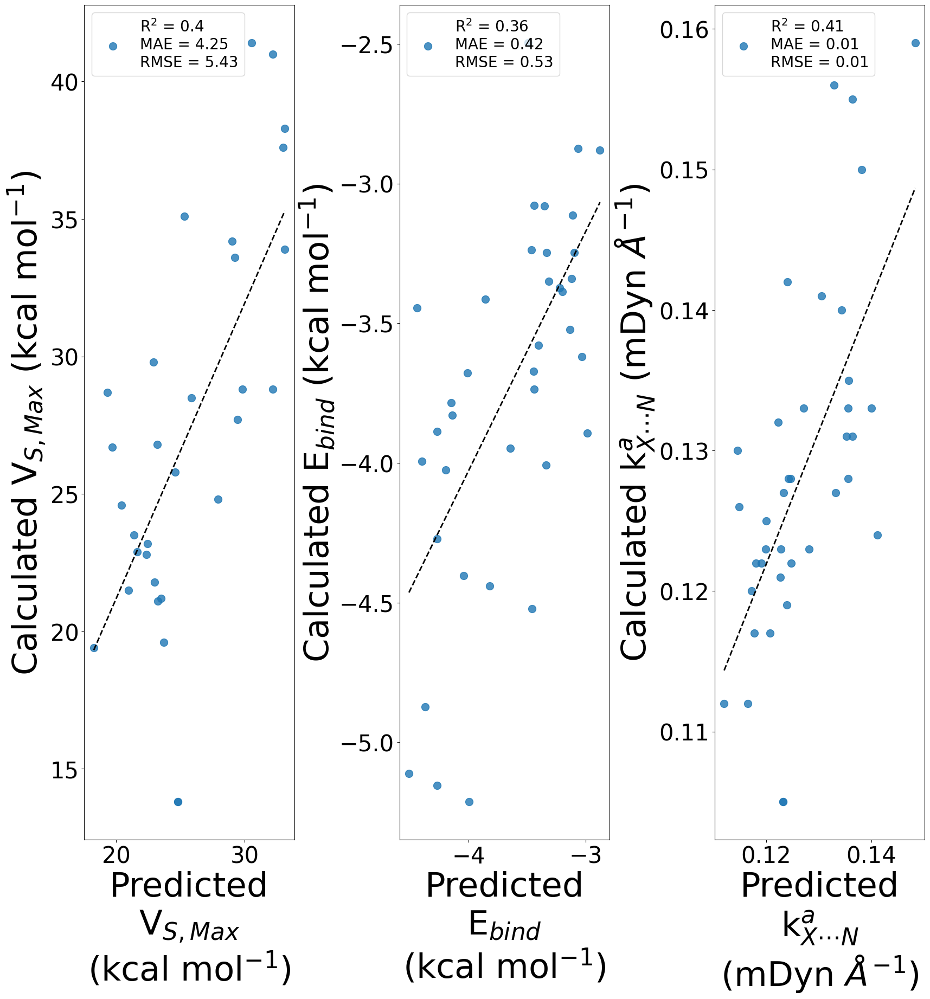

In [155]:
# RegPlot

# Ethynyl Benzene

# Chlorine

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

BACl_Vmax_rgplt = sns.regplot(x = BACl_RF_Vmax_MFP_pred, y = BACl_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BACl_Ebind_rgplt = sns.regplot(x = BACl_RF_Ebind_MFP_pred, y = BACl_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BACl_kXN_rgplt = sns.regplot(x = BACl_RF_kXN_MFP_pred, y = BACl_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BACl_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left')

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BACl_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left')

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BACl_RF_MFP_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_RF_MFP_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left')

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

# plt.savefig("Figures/BACl_RF_MFP_regplot.pdf",format='pdf',
#             bbox_inches='tight',transparent=True,dpi=600)

plt.show()

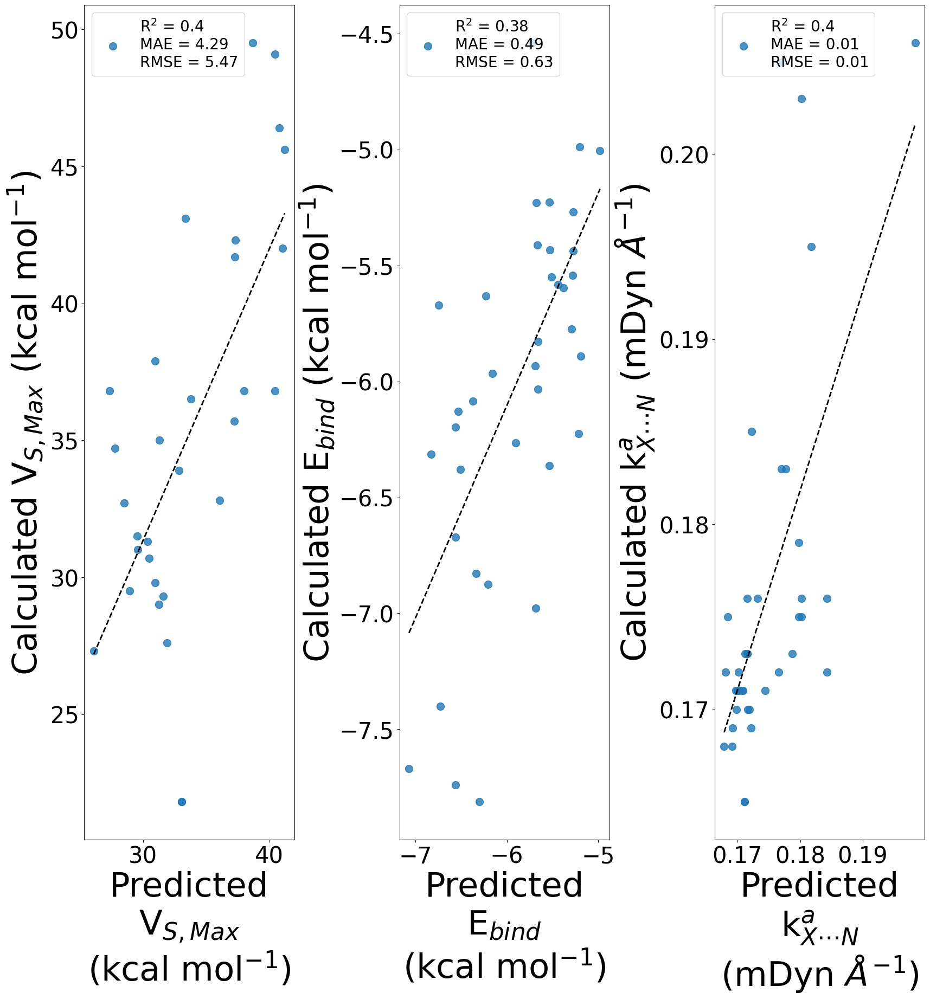

In [156]:
# RegPlot

# Ethynyl Benzene

# Bromine

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

BABr_Vmax_rgplt = sns.regplot(x = BABr_RF_Vmax_MFP_pred, y = BABr_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BABr_Ebind_rgplt = sns.regplot(x = BABr_RF_Ebind_MFP_pred, y = BABr_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BABr_kXN_rgplt = sns.regplot(x = BABr_RF_kXN_MFP_pred, y = BABr_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BABr_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left')

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BABr_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left')

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BABr_RF_MFP_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_RF_MFP_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left')

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

# plt.savefig("Figures/BABr_RF_MFP_regplot.pdf",format='pdf',
#             bbox_inches='tight',transparent=True,dpi=600)

plt.show()

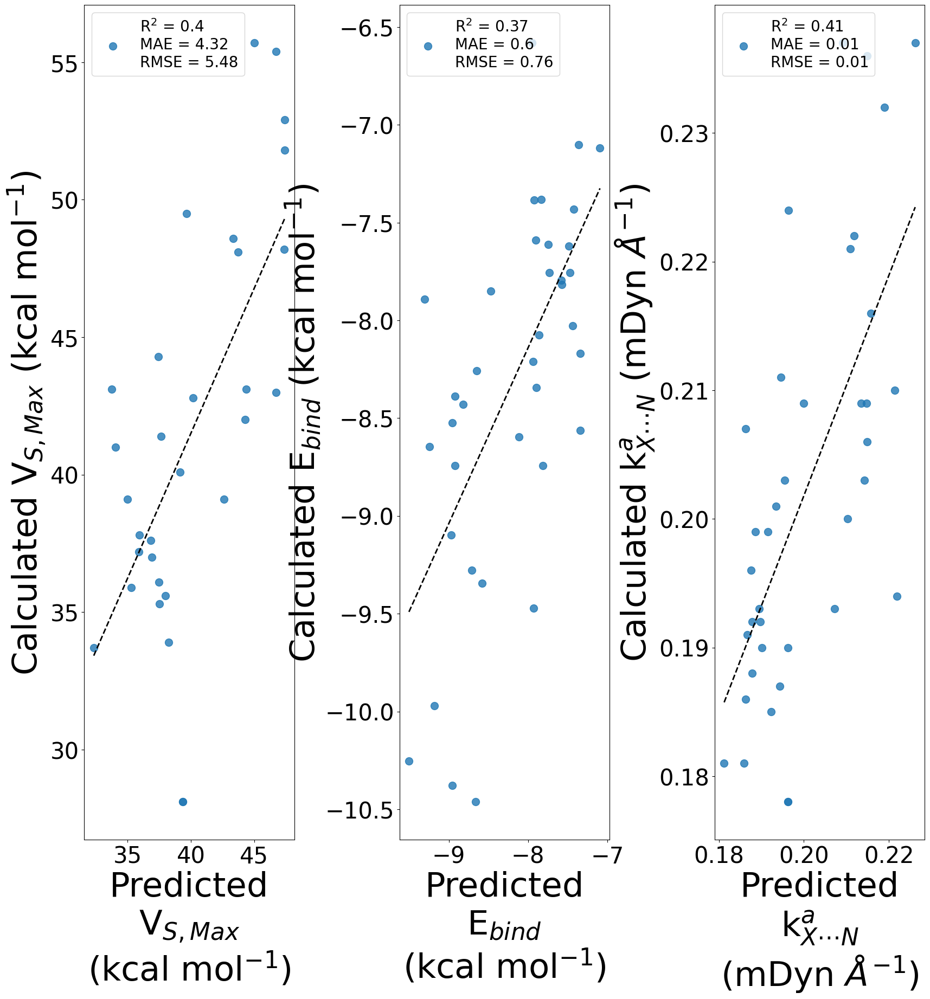

In [157]:
# RegPlot

# Ethynyl Benzene

# Iodine

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

BAI_Vmax_rgplt = sns.regplot(x = BAI_RF_Vmax_MFP_pred, y = BAI_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BAI_Ebind_rgplt = sns.regplot(x = BAI_RF_Ebind_MFP_pred, y = BAI_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BAI_kXN_rgplt = sns.regplot(x = BAI_RF_kXN_MFP_pred, y = BAI_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAI_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left')

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAI_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left')

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAI_RF_MFP_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_RF_MFP_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left')

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

# plt.savefig("Figures/BAI_RF_MFP_regplot.pdf",format='pdf',
#             bbox_inches='tight',transparent=True,dpi=600)

plt.show()

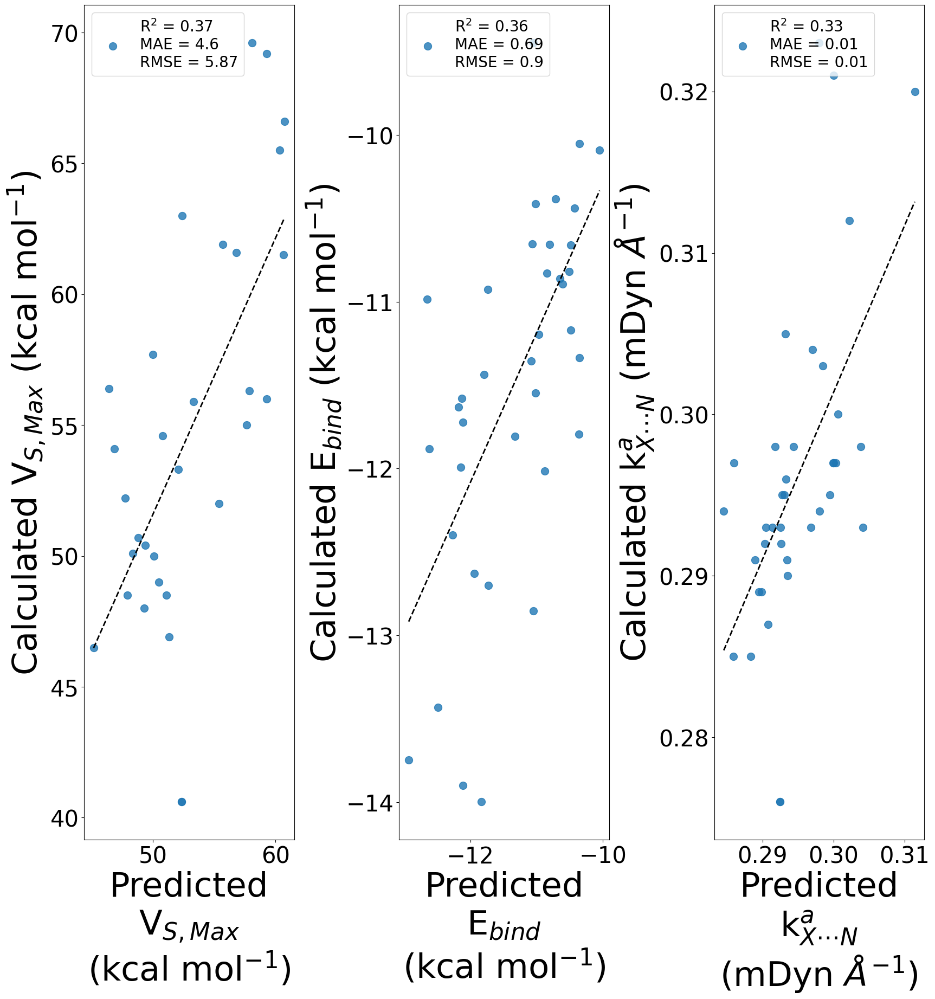

In [158]:
# RegPlot

# Ethynyl Benzene

# Astatine

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

BAAt_Vmax_rgplt = sns.regplot(x = BAAt_RF_Vmax_MFP_pred, y = BAAt_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BAAt_Ebind_rgplt = sns.regplot(x = BAAt_RF_Ebind_MFP_pred, y = BAAt_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BAAt_kXN_rgplt = sns.regplot(x = BAAt_RF_kXN_MFP_pred, y = BAAt_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left')

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left')

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_RF_MFP_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_RF_MFP_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left')

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

plt.savefig("Figures/BAAt_RF_MFP_regplot.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

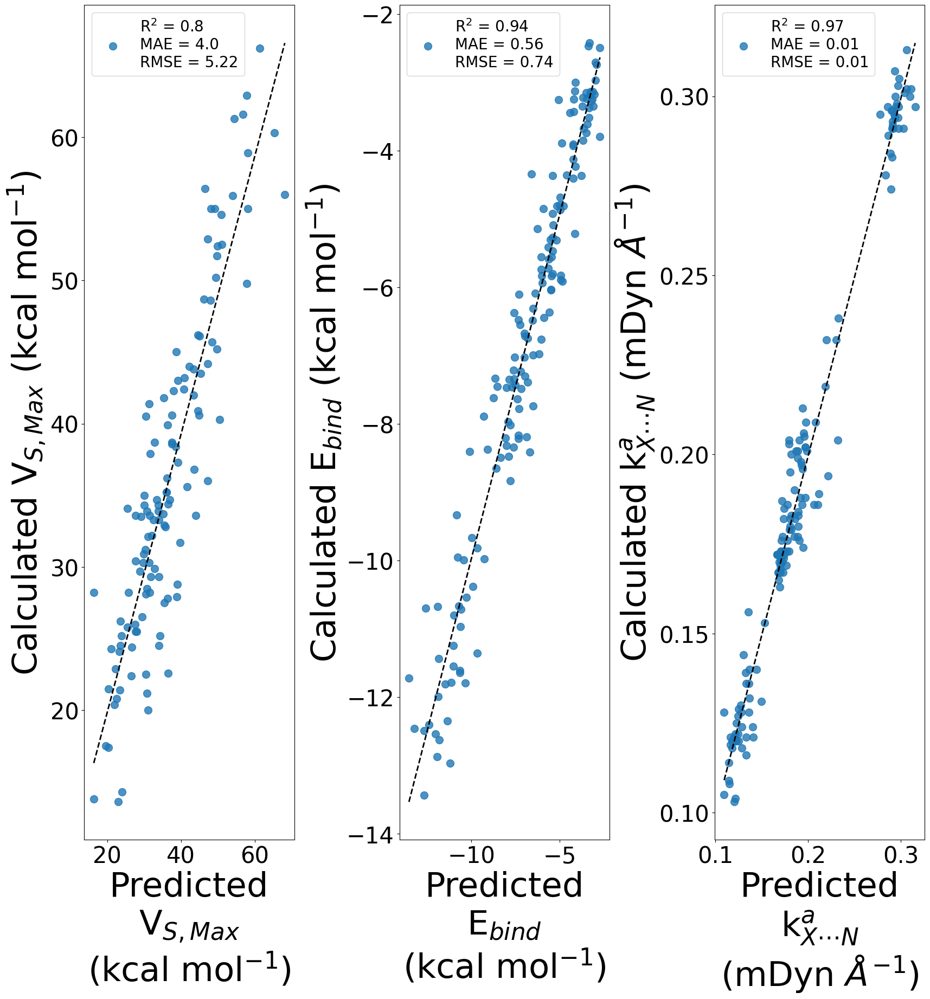

In [159]:
# RegPlot

# Ethynyl Benzene

# All Halogen

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

BAX_Vmax_rgplt = sns.regplot(x = BAX_RF_Vmax_MFP_pred, y = BAX_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BAX_Ebind_rgplt = sns.regplot(x = BAX_RF_Ebind_MFP_pred, y = BAX_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BAX_kXN_rgplt = sns.regplot(x = BAX_RF_kXN_MFP_pred, y = BAX_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAX_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left')

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAX_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left')

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAX_RF_MFP_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_RF_MFP_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left')

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

plt.savefig("Figures/BAX_RF_MFP_regplot.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

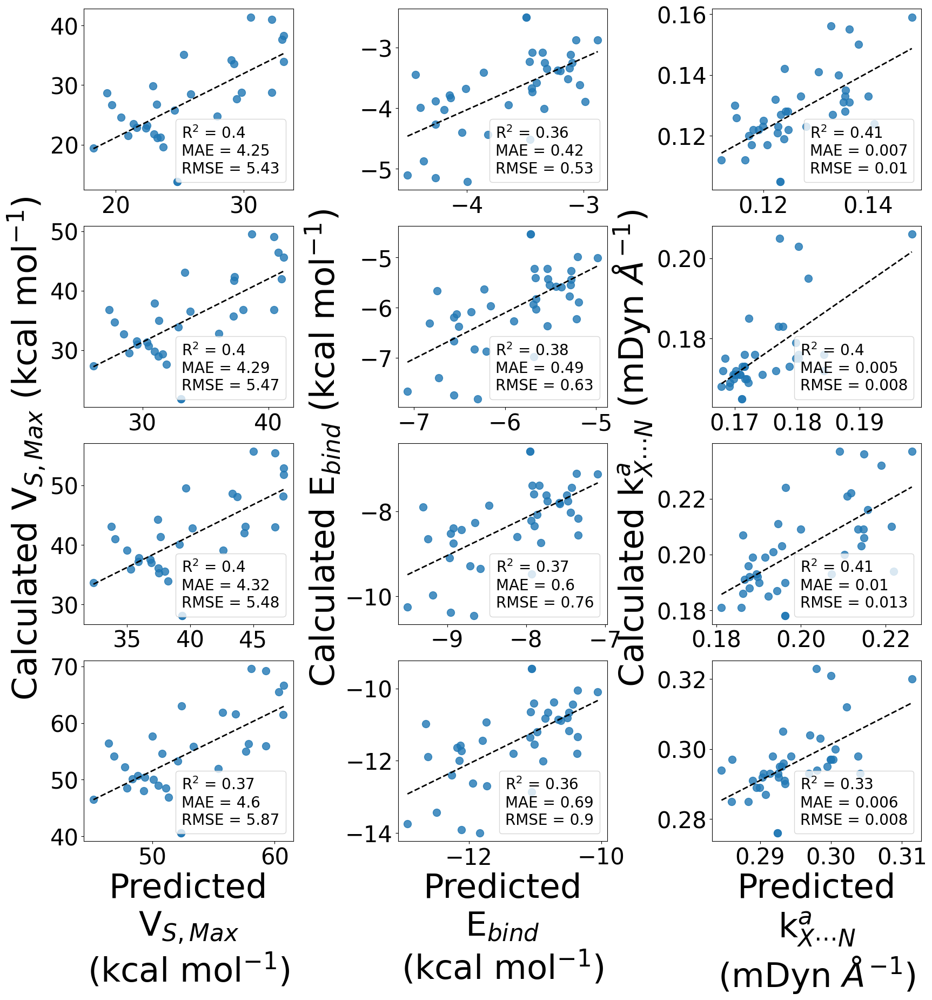

In [160]:
# RegPlot with all BX

fig, ax = plt.subplots(ncols=3,nrows=4)

## BACl == row 0
## BABr == row 1
##  BAI == row 2
## BAAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BACl_Vmax_rgplt = sns.regplot(x = BACl_RF_Vmax_MFP_pred, y = BACl_MFP_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BACl_Ebind_rgplt = sns.regplot(x = BACl_RF_Ebind_MFP_pred, y = BACl_MFP_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BACl_kXN_rgplt = sns.regplot(x = BACl_RF_kXN_MFP_pred, y = BACl_MFP_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BACl_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BACl_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BACl_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BACl_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BABr_Vmax_rgplt = sns.regplot(x = BABr_RF_Vmax_MFP_pred, y = BABr_MFP_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BABr_Ebind_rgplt = sns.regplot(x = BABr_RF_Ebind_MFP_pred, y = BABr_MFP_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BABr_kXN_rgplt = sns.regplot(x = BABr_RF_kXN_MFP_pred, y = BABr_MFP_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BABr_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BABr_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BABr_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BABr_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BAI_Vmax_rgplt = sns.regplot(x = BAI_RF_Vmax_MFP_pred, y = BAI_MFP_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAI_Ebind_rgplt = sns.regplot(x = BAI_RF_Ebind_MFP_pred, y = BAI_MFP_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAI_kXN_rgplt = sns.regplot(x = BAI_RF_kXN_MFP_pred, y = BAI_MFP_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAI_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAI_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAI_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAI_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAAt_Vmax_rgplt = sns.regplot(x = BAAt_RF_Vmax_MFP_pred, y = BAAt_MFP_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAAt_Ebind_rgplt = sns.regplot(x = BAAt_RF_Ebind_MFP_pred, y = BAAt_MFP_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAAt_kXN_rgplt = sns.regplot(x = BAAt_RF_kXN_MFP_pred, y = BAAt_MFP_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAAt_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BACl_BABr_BAI_BAAt_RF_MFP_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

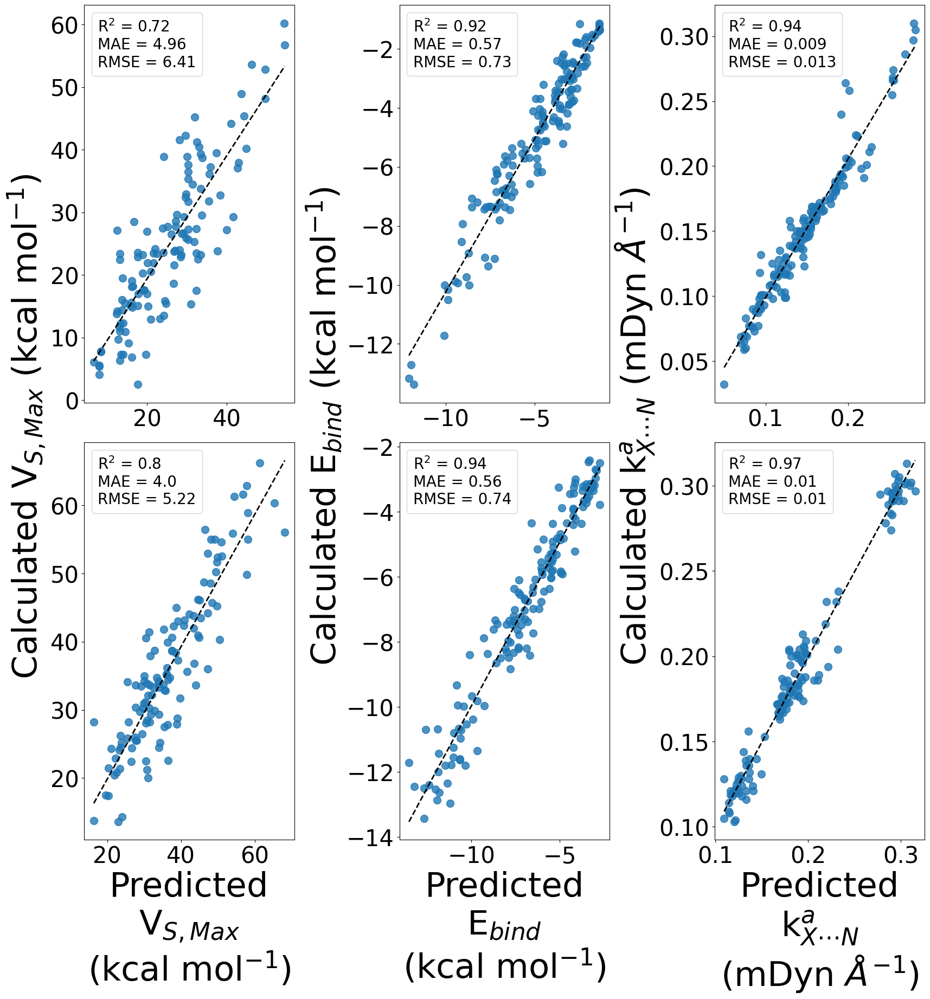

In [161]:
# RegPlot

# Benzene and Ethynyl Benzene

# All Halogen

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=2)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})


## Benzene

### Vmax plot

BX_Vmax_rgplt = sns.regplot(x = BX_RF_Vmax_MFP_pred, y = BX_MFP_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BX_Ebind_rgplt = sns.regplot(x = BX_RF_Ebind_MFP_pred, y = BX_MFP_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BX_kXN_rgplt = sns.regplot(x = BX_RF_kXN_MFP_pred, y = BX_MFP_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_xlabel('')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BX_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BX_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BX_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BX_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BX_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BX_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)


## Ethynyl Benzene

## Vmax plot

BAX_Vmax_rgplt = sns.regplot(x = BAX_RF_Vmax_MFP_pred, y = BAX_MFP_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BAX_Ebind_rgplt = sns.regplot(x = BAX_RF_Ebind_MFP_pred, y = BAX_MFP_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BAX_kXN_rgplt = sns.regplot(x = BAX_RF_kXN_MFP_pred, y = BAX_MFP_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('\t\t\t\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('\t\t\t\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('\t\t\t\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAX_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAX_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAX_RF_MFP_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_RF_MFP_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### provide spacing

#### width space

fig.subplots_adjust(wspace=0.5)

#### height space

fig.subplots_adjust(hspace=0.1)

### save figure

plt.savefig("Figures/BX_BAX_RF_MFP_regplot.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

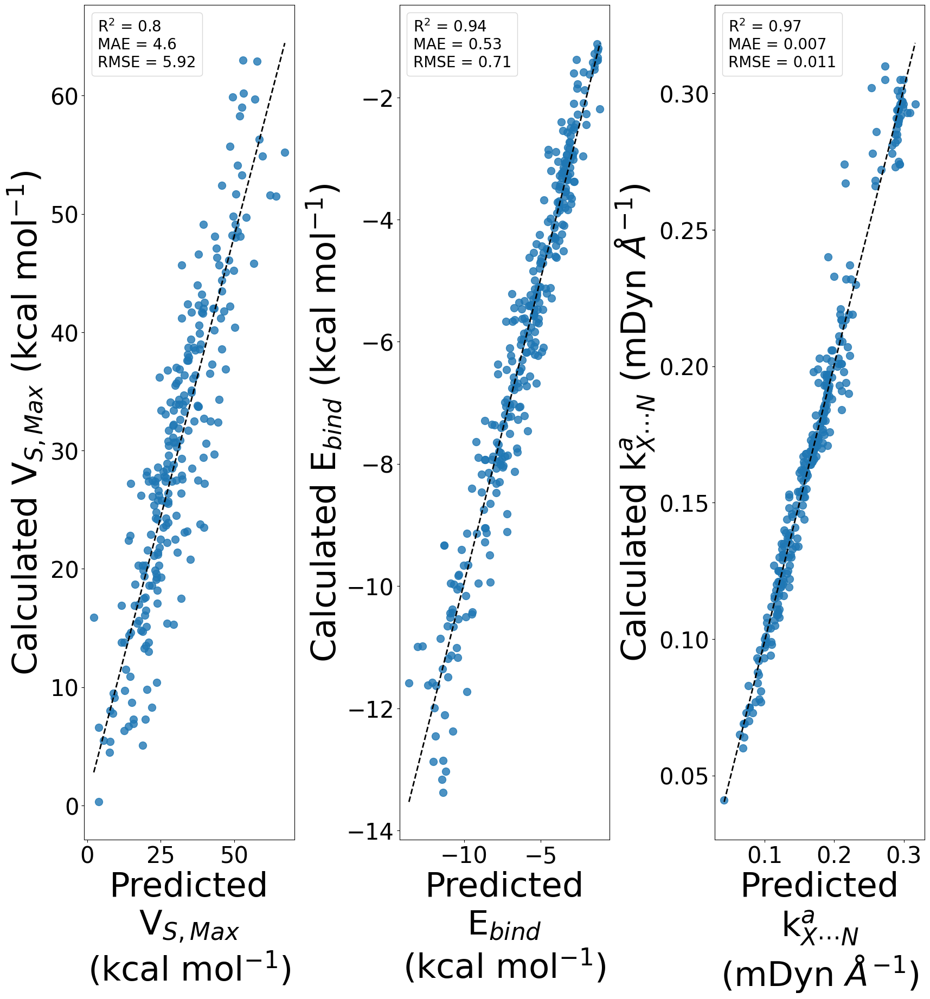

In [162]:
# RegPlot

# Benzene and Ethynyl Benzene

# All Halogen bond donors

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=1)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

## Vmax plot

All_XB_Vmax_rgplt = sns.regplot(x = All_XB_RF_Vmax_MFP_pred, y = All_XB_MFP_Vmax_Y_test, ax = ax[0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

All_XB_Ebind_rgplt = sns.regplot(x = All_XB_RF_Ebind_MFP_pred, y = All_XB_MFP_Ebind_Y_test, ax = ax[1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

All_XB_kXN_rgplt = sns.regplot(x = All_XB_RF_kXN_MFP_pred, y = All_XB_MFP_kXN_Y_test, ax = ax[2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(All_XB_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Ebind

ax[1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(All_XB_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## kXN

ax[2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(All_XB_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### provide spacing

fig.subplots_adjust(wspace=0.5)

### save figure

# plt.savefig("Figures/All_XB_RF_MFP_regplot.pdf",format='pdf',
#             bbox_inches='tight',transparent=True,dpi=600)

plt.show()

###### Data Based Approach

In [163]:
# Random Forest Regression -- Data Based Approach

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_RF_Vmax = RandomForestRegressor().fit(BACl_Vmax_X_train, BACl_Vmax_Y_train)

### Ebind
BACl_RF_Ebind = RandomForestRegressor().fit(BACl_Ebind_X_train, BACl_Ebind_Y_train)

### kXN
BACl_RF_kXN = RandomForestRegressor().fit(BACl_kXN_X_train, BACl_kXN_Y_train)

## Bromine

### Vmax
BABr_RF_Vmax = RandomForestRegressor().fit(BABr_Vmax_X_train, BABr_Vmax_Y_train)

### Ebind
BABr_RF_Ebind = RandomForestRegressor().fit(BABr_Ebind_X_train, BABr_Ebind_Y_train)

### kXN
BABr_RF_kXN = RandomForestRegressor().fit(BABr_kXN_X_train, BABr_kXN_Y_train)

## Iodine

### Vmax
BAI_RF_Vmax = RandomForestRegressor().fit(BAI_Vmax_X_train, BAI_Vmax_Y_train)

### Ebind
BAI_RF_Ebind = RandomForestRegressor().fit(BAI_Ebind_X_train, BAI_Ebind_Y_train)

### kXN
BAI_RF_kXN = RandomForestRegressor().fit(BAI_kXN_X_train, BAI_kXN_Y_train)

## Astatine

### Vmax
BAAt_RF_Vmax = RandomForestRegressor().fit(BAAt_Vmax_X_train, BAAt_Vmax_Y_train)

### Ebind
BAAt_RF_Ebind = RandomForestRegressor().fit(BAAt_Ebind_X_train, BAAt_Ebind_Y_train)

### kXN
BAAt_RF_kXN = RandomForestRegressor().fit(BAAt_kXN_X_train, BAAt_kXN_Y_train)

## All Halogen

### Vmax
BAX_RF_Vmax = RandomForestRegressor().fit(BAX_Vmax_X_train, BAX_Vmax_Y_train)

### Ebind
BAX_RF_Ebind = RandomForestRegressor().fit(BAX_Ebind_X_train, BAX_Ebind_Y_train)

### kXN
BAX_RF_kXN = RandomForestRegressor().fit(BAX_kXN_X_train, BAX_kXN_Y_train)

In [164]:
# Random Forest Predictions

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_RF_Vmax_pred = BACl_RF_Vmax.predict(BACl_Vmax_X_test)

### Ebind

BACl_RF_Ebind_pred = BACl_RF_Ebind.predict(BACl_Ebind_X_test)

### kXN

BACl_RF_kXN_pred = BACl_RF_kXN.predict(BACl_kXN_X_test)

## Bromine

### Vmax

BABr_RF_Vmax_pred = BABr_RF_Vmax.predict(BABr_Vmax_X_test)

### Ebind

BABr_RF_Ebind_pred = BABr_RF_Ebind.predict(BABr_Ebind_X_test)

### kXN

BABr_RF_kXN_pred = BABr_RF_kXN.predict(BABr_kXN_X_test)

## Iodine

### Vmax

BAI_RF_Vmax_pred = BAI_RF_Vmax.predict(BAI_Vmax_X_test)

### Ebind

BAI_RF_Ebind_pred = BAI_RF_Ebind.predict(BAI_Ebind_X_test)

### kXN

BAI_RF_kXN_pred = BAI_RF_kXN.predict(BAI_kXN_X_test)

## Astatine

### Vmax

BAAt_RF_Vmax_pred = BAAt_RF_Vmax.predict(BAAt_Vmax_X_test)

### Ebind

BAAt_RF_Ebind_pred = BAAt_RF_Ebind.predict(BAAt_Ebind_X_test)

### kXN

BAAt_RF_kXN_pred = BAAt_RF_kXN.predict(BAAt_kXN_X_test)

## All Halogen

### Vmax

BAX_RF_Vmax_pred = BAX_RF_Vmax.predict(BAX_Vmax_X_test)

### Ebind

BAX_RF_Ebind_pred = BAX_RF_Ebind.predict(BAX_Ebind_X_test)

### kXN

BAX_RF_kXN_pred = BAX_RF_kXN.predict(BAX_kXN_X_test)

In [165]:
# Accuracy Measurements -- R^2, MAE, RMSE

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_RF_Vmax_r2 = r2_score(BACl_Vmax_Y_test, BACl_RF_Vmax_pred)
BACl_RF_Vmax_mae = mean_absolute_error(BACl_Vmax_Y_test, BACl_RF_Vmax_pred)
BACl_RF_Vmax_rmse = mean_squared_error(BACl_Vmax_Y_test, BACl_RF_Vmax_pred, squared=False)

### Ebind

BACl_RF_Ebind_r2 = r2_score(BACl_Ebind_Y_test, BACl_RF_Ebind_pred)
BACl_RF_Ebind_mae = mean_absolute_error(BACl_Ebind_Y_test, BACl_RF_Ebind_pred)
BACl_RF_Ebind_rmse = mean_squared_error(BACl_Ebind_Y_test, BACl_RF_Ebind_pred, squared=False)

### kXN

BACl_RF_kXN_r2 = r2_score(BACl_kXN_Y_test, BACl_RF_kXN_pred)
BACl_RF_kXN_mae = mean_absolute_error(BACl_kXN_Y_test, BACl_RF_kXN_pred)
BACl_RF_kXN_rmse = mean_squared_error(BACl_kXN_Y_test, BACl_RF_kXN_pred, squared=False)

## Bromine

### Vmax

BABr_RF_Vmax_r2 = r2_score(BABr_Vmax_Y_test, BABr_RF_Vmax_pred)
BABr_RF_Vmax_mae = mean_absolute_error(BABr_Vmax_Y_test, BABr_RF_Vmax_pred)
BABr_RF_Vmax_rmse = mean_squared_error(BABr_Vmax_Y_test, BABr_RF_Vmax_pred, squared=False)

### Ebind

BABr_RF_Ebind_r2 = r2_score(BABr_Ebind_Y_test, BABr_RF_Ebind_pred)
BABr_RF_Ebind_mae = mean_absolute_error(BABr_Ebind_Y_test, BABr_RF_Ebind_pred)
BABr_RF_Ebind_rmse = mean_squared_error(BABr_Ebind_Y_test, BABr_RF_Ebind_pred, squared=False)

### kXN

BABr_RF_kXN_r2 = r2_score(BABr_kXN_Y_test, BABr_RF_kXN_pred)
BABr_RF_kXN_mae = mean_absolute_error(BABr_kXN_Y_test, BABr_RF_kXN_pred)
BABr_RF_kXN_rmse = mean_squared_error(BABr_kXN_Y_test, BABr_RF_kXN_pred, squared=False)

## Iodine

### Vmax

BAI_RF_Vmax_r2 = r2_score(BAI_Vmax_Y_test, BAI_RF_Vmax_pred)
BAI_RF_Vmax_mae = mean_absolute_error(BAI_Vmax_Y_test, BAI_RF_Vmax_pred)
BAI_RF_Vmax_rmse = mean_squared_error(BAI_Vmax_Y_test, BAI_RF_Vmax_pred, squared=False)

### Ebind

BAI_RF_Ebind_r2 = r2_score(BAI_Ebind_Y_test, BAI_RF_Ebind_pred)
BAI_RF_Ebind_mae = mean_absolute_error(BAI_Ebind_Y_test, BAI_RF_Ebind_pred)
BAI_RF_Ebind_rmse = mean_squared_error(BAI_Ebind_Y_test, BAI_RF_Ebind_pred, squared=False)

### kXN

BAI_RF_kXN_r2 = r2_score(BAI_kXN_Y_test, BAI_RF_kXN_pred)
BAI_RF_kXN_mae = mean_absolute_error(BAI_kXN_Y_test, BAI_RF_kXN_pred)
BAI_RF_kXN_rmse = mean_squared_error(BAI_kXN_Y_test, BAI_RF_kXN_pred, squared=False)

## Astatine

### Vmax

BAAt_RF_Vmax_r2 = r2_score(BAAt_Vmax_Y_test, BAAt_RF_Vmax_pred)
BAAt_RF_Vmax_mae = mean_absolute_error(BAAt_Vmax_Y_test, BAAt_RF_Vmax_pred)
BAAt_RF_Vmax_rmse = mean_squared_error(BAAt_Vmax_Y_test, BAAt_RF_Vmax_pred, squared=False)

### Ebind

BAAt_RF_Ebind_r2 = r2_score(BAAt_Ebind_Y_test, BAAt_RF_Ebind_pred)
BAAt_RF_Ebind_mae = mean_absolute_error(BAAt_Ebind_Y_test, BAAt_RF_Ebind_pred)
BAAt_RF_Ebind_rmse = mean_squared_error(BAAt_Ebind_Y_test, BAAt_RF_Ebind_pred, squared=False)

### kXN

BAAt_RF_kXN_r2 = r2_score(BAAt_kXN_Y_test, BAAt_RF_kXN_pred)
BAAt_RF_kXN_mae = mean_absolute_error(BAAt_kXN_Y_test, BAAt_RF_kXN_pred)
BAAt_RF_kXN_rmse = mean_squared_error(BAAt_kXN_Y_test, BAAt_RF_kXN_pred, squared=False)

## All Halogen

### Vmax

BAX_RF_Vmax_r2 = r2_score(BAX_Vmax_Y_test, BAX_RF_Vmax_pred)
BAX_RF_Vmax_mae = mean_absolute_error(BAX_Vmax_Y_test, BAX_RF_Vmax_pred)
BAX_RF_Vmax_rmse = mean_squared_error(BAX_Vmax_Y_test, BAX_RF_Vmax_pred, squared=False)

### Ebind

BAX_RF_Ebind_r2 = r2_score(BAX_Ebind_Y_test, BAX_RF_Ebind_pred)
BAX_RF_Ebind_mae = mean_absolute_error(BAX_Ebind_Y_test, BAX_RF_Ebind_pred)
BAX_RF_Ebind_rmse = mean_squared_error(BAX_Ebind_Y_test, BAX_RF_Ebind_pred, squared=False)

### kXN

BAX_RF_kXN_r2 = r2_score(BAX_kXN_Y_test, BAX_RF_kXN_pred)
BAX_RF_kXN_mae = mean_absolute_error(BAX_kXN_Y_test, BAX_RF_kXN_pred)
BAX_RF_kXN_rmse = mean_squared_error(BAX_kXN_Y_test, BAX_RF_kXN_pred, squared=False)

Cross Validation

In [166]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# RF method

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_cv_rf = RandomForestRegressor(random_state=34)

### Ebind

BACl_Ebind_cv_rf = RandomForestRegressor(random_state=34)

### kXN

BACl_kXN_cv_rf = RandomForestRegressor(random_state=34)

## Bromine

### Vmax

BABr_Vmax_cv_rf = RandomForestRegressor(random_state=34)

### Ebind

BABr_Ebind_cv_rf = RandomForestRegressor(random_state=34)

### kXN

BABr_kXN_cv_rf = RandomForestRegressor(random_state=34)

## Iodine

### Vmax

BAI_Vmax_cv_rf = RandomForestRegressor(random_state=34)

### Ebind

BAI_Ebind_cv_rf = RandomForestRegressor(random_state=34)

### kXN

BAI_kXN_cv_rf = RandomForestRegressor(random_state=34)

## Astatine

### Vmax

BAAt_Vmax_cv_rf = RandomForestRegressor(random_state=34)

### Ebind

BAAt_Ebind_cv_rf = RandomForestRegressor(random_state=34)

### kXN

BAAt_kXN_cv_rf = RandomForestRegressor(random_state=34)

## All Halogen

### Vmax

BAX_Vmax_cv_rf = RandomForestRegressor(random_state=34)

### Ebind

BAX_Ebind_cv_rf = RandomForestRegressor(random_state=34)

### kXN

BAX_kXN_cv_rf = RandomForestRegressor(random_state=34)

In [167]:
# CV -- 5 fold cross validation

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_rf_cv = cross_validate(BACl_Vmax_cv_rf, BACl_Vmax_selfeat, BACl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BACl_Ebind_rf_cv = cross_validate(BACl_Ebind_cv_rf, BACl_Ebind_selfeat, BACl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BACl_kXN_rf_cv = cross_validate(BACl_kXN_cv_rf, BACl_kXN_selfeat, BACl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BABr_Vmax_rf_cv = cross_validate(BABr_Vmax_cv_rf, BABr_Vmax_selfeat, BABr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BABr_Ebind_rf_cv = cross_validate(BABr_Ebind_cv_rf, BABr_Ebind_selfeat, BABr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BABr_kXN_rf_cv = cross_validate(BABr_kXN_cv_rf, BABr_kXN_selfeat, BABr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BAI_Vmax_rf_cv = cross_validate(BAI_Vmax_cv_rf, BAI_Vmax_selfeat, BAI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAI_Ebind_rf_cv = cross_validate(BAI_Ebind_cv_rf, BAI_Ebind_selfeat, BAI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAI_kXN_rf_cv = cross_validate(BAI_kXN_cv_rf, BAI_kXN_selfeat, BAI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAAt_Vmax_rf_cv = cross_validate(BAAt_Vmax_cv_rf, BAAt_Vmax_selfeat, BAAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAAt_Ebind_rf_cv = cross_validate(BAAt_Ebind_cv_rf, BAAt_Ebind_selfeat, BAAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAAt_kXN_rf_cv = cross_validate(BAAt_kXN_cv_rf, BAAt_kXN_selfeat, BAAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BAX_Vmax_rf_cv = cross_validate(BAX_Vmax_cv_rf, BAX_Vmax_selfeat, BAX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAX_Ebind_rf_cv = cross_validate(BAX_Ebind_cv_rf, BAX_Ebind_selfeat, BAX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAX_kXN_rf_cv = cross_validate(BAX_kXN_cv_rf, BAX_kXN_selfeat, BAX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [168]:
# CV Scores

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_rf_cv_res_lst = [
    round(np.mean(BACl_Vmax_rf_cv['test_r2']), 2), 
    round(np.mean(-BACl_Vmax_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Vmax_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BACl_Ebind_rf_cv_res_lst = [
    round(np.mean(BACl_Ebind_rf_cv['test_r2']), 2), 
    round(np.mean(-BACl_Ebind_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Ebind_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BACl_kXN_rf_cv_res_lst = [
    round(np.mean(BACl_kXN_rf_cv['test_r2']), 2), 
    round(np.mean(-BACl_kXN_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BACl_kXN_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BABr_Vmax_rf_cv_res_lst = [
    round(np.mean(BABr_Vmax_rf_cv['test_r2']), 2), 
    round(np.mean(-BABr_Vmax_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Vmax_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BABr_Ebind_rf_cv_res_lst = [
    round(np.mean(BABr_Ebind_rf_cv['test_r2']), 2), 
    round(np.mean(-BABr_Ebind_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Ebind_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BABr_kXN_rf_cv_res_lst = [
    round(np.mean(BABr_kXN_rf_cv['test_r2']), 2), 
    round(np.mean(-BABr_kXN_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BABr_kXN_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BAI_Vmax_rf_cv_res_lst = [
    round(np.mean(BAI_Vmax_rf_cv['test_r2']), 2), 
    round(np.mean(-BAI_Vmax_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Vmax_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAI_Ebind_rf_cv_res_lst = [
    round(np.mean(BAI_Ebind_rf_cv['test_r2']), 2), 
    round(np.mean(-BAI_Ebind_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Ebind_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAI_kXN_rf_cv_res_lst = [
    round(np.mean(BAI_kXN_rf_cv['test_r2']), 2), 
    round(np.mean(-BAI_kXN_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAI_kXN_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAAt_Vmax_rf_cv_res_lst = [
    round(np.mean(BAAt_Vmax_rf_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Vmax_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Vmax_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAAt_Ebind_rf_cv_res_lst = [
    round(np.mean(BAAt_Ebind_rf_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Ebind_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Ebind_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAAt_kXN_rf_cv_res_lst = [
    round(np.mean(BAAt_kXN_rf_cv['test_r2']), 2), 
    round(np.mean(-BAAt_kXN_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAAt_kXN_rf_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BAX_Vmax_rf_cv_res_lst = [
    round(np.mean(BAX_Vmax_rf_cv['test_r2']), 2), 
    round(np.mean(-BAX_Vmax_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Vmax_rf_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAX_Ebind_rf_cv_res_lst = [
    round(np.mean(BAX_Ebind_rf_cv['test_r2']), 2), 
    round(np.mean(-BAX_Ebind_rf_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Ebind_rf_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAX_kXN_rf_cv_res_lst = [
    round(np.mean(BAX_kXN_rf_cv['test_r2']), 2), 
    round(np.mean(-BAX_kXN_rf_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAX_kXN_rf_cv['test_neg_root_mean_squared_error']), 3)
]

In [169]:
# Create CV metrics Dataframe

# RF

# Ethynyl Benzene

# constructing dictionary for data

## Vmax

BAX_CV_RF_Vmax_dict = {'BACl': BACl_Vmax_rf_cv_res_lst, 'BABr': BABr_Vmax_rf_cv_res_lst, 
                     'BAI': BAI_Vmax_rf_cv_res_lst, 'BAAt': BAAt_Vmax_rf_cv_res_lst, 
                      'BAX': BAX_Vmax_rf_cv_res_lst}

BAX_CV_RF_Vmax_df = pd.DataFrame(data = BAX_CV_RF_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BAX_CV_RF_Ebind_dict = {'BACl': BACl_Ebind_rf_cv_res_lst, 'BABr': BABr_Ebind_rf_cv_res_lst, 
                     'BAI': BAI_Ebind_rf_cv_res_lst, 'BAAt': BAAt_Ebind_rf_cv_res_lst, 
                      'BAX': BAX_Ebind_rf_cv_res_lst}

BAX_CV_RF_Ebind_df = pd.DataFrame(data = BAX_CV_RF_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BAX_CV_RF_kXN_dict = {'BACl': BACl_kXN_rf_cv_res_lst, 'BABr': BABr_kXN_rf_cv_res_lst, 
                     'BAI': BAI_kXN_rf_cv_res_lst, 'BAAt': BAAt_kXN_rf_cv_res_lst, 
                      'BAX': BAX_kXN_rf_cv_res_lst}

BAX_CV_RF_kXN_df = pd.DataFrame(data = BAX_CV_RF_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BAX_CV_RF_Vmax_df.to_csv('CV_results/BAX_RF_cv_Vmax_metric_results.csv')
BAX_CV_RF_Ebind_df.to_csv('CV_results/BAX_RF_cv_Ebind_metric_results.csv')
BAX_CV_RF_kXN_df.to_csv('CV_results/BAX_RF_cv_kXN_metric_results.csv')

RegPlot

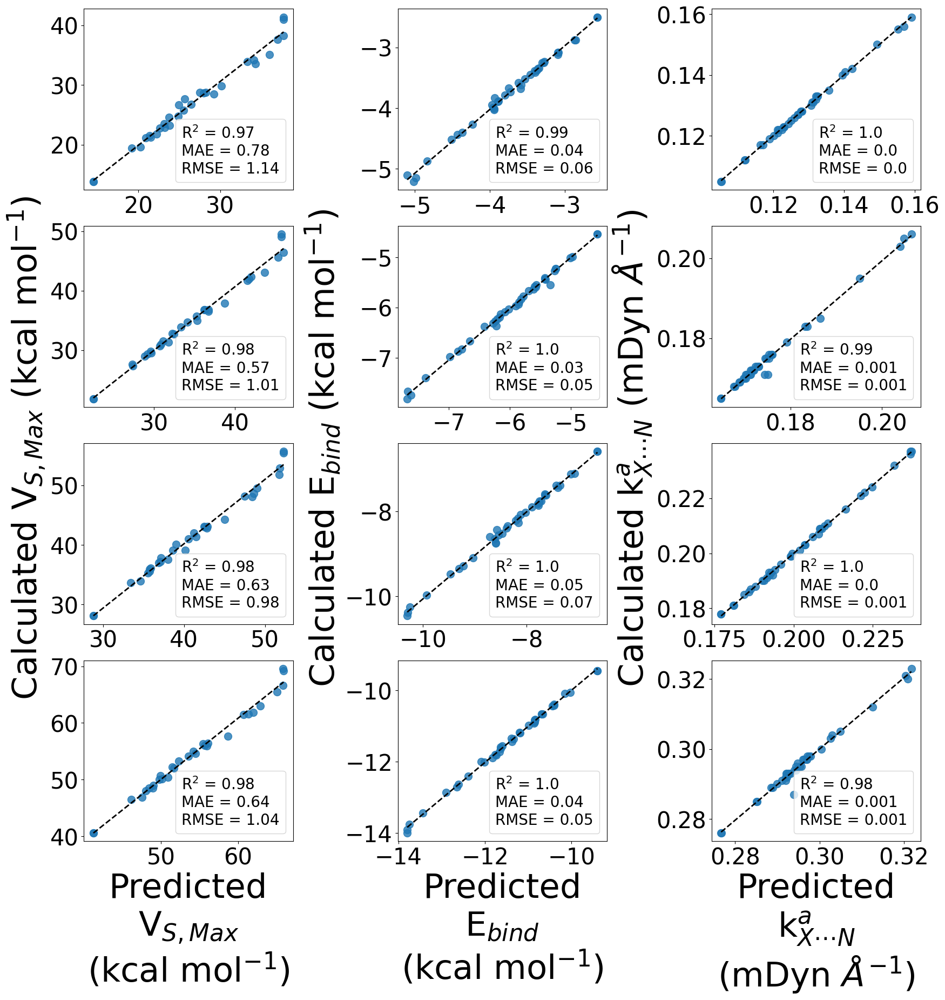

In [170]:
# RegPlot with all data based BAX

fig, ax = plt.subplots(ncols=3,nrows=4)

## BACl == row 0
## BABr == row 1
##  BAI == row 2
## BAAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BACl_Vmax_rgplt = sns.regplot(x = BACl_RF_Vmax_pred, y = BACl_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BACl_Ebind_rgplt = sns.regplot(x = BACl_RF_Ebind_pred, y = BACl_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BACl_kXN_rgplt = sns.regplot(x = BACl_RF_kXN_pred, y = BACl_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_RF_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BACl_RF_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_RF_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_RF_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BACl_RF_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_RF_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_RF_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BACl_RF_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BACl_RF_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BABr_Vmax_rgplt = sns.regplot(x = BABr_RF_Vmax_pred, y = BABr_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BABr_Ebind_rgplt = sns.regplot(x = BABr_RF_Ebind_pred, y = BABr_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BABr_kXN_rgplt = sns.regplot(x = BABr_RF_kXN_pred, y = BABr_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_RF_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BABr_RF_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_RF_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_RF_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BABr_RF_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_RF_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_RF_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BABr_RF_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BABr_RF_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BAI_Vmax_rgplt = sns.regplot(x = BAI_RF_Vmax_pred, y = BAI_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAI_Ebind_rgplt = sns.regplot(x = BAI_RF_Ebind_pred, y = BAI_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAI_kXN_rgplt = sns.regplot(x = BAI_RF_kXN_pred, y = BAI_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_RF_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAI_RF_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_RF_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_RF_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAI_RF_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_RF_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_RF_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAI_RF_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAI_RF_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAAt_Vmax_rgplt = sns.regplot(x = BAAt_RF_Vmax_pred, y = BAAt_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAAt_Ebind_rgplt = sns.regplot(x = BAAt_RF_Ebind_pred, y = BAAt_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAAt_kXN_rgplt = sns.regplot(x = BAAt_RF_kXN_pred, y = BAAt_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_RF_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_RF_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_RF_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_RF_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_RF_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_RF_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_RF_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_RF_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAAt_RF_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BACl_BABr_BAI_BAAt_RF_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

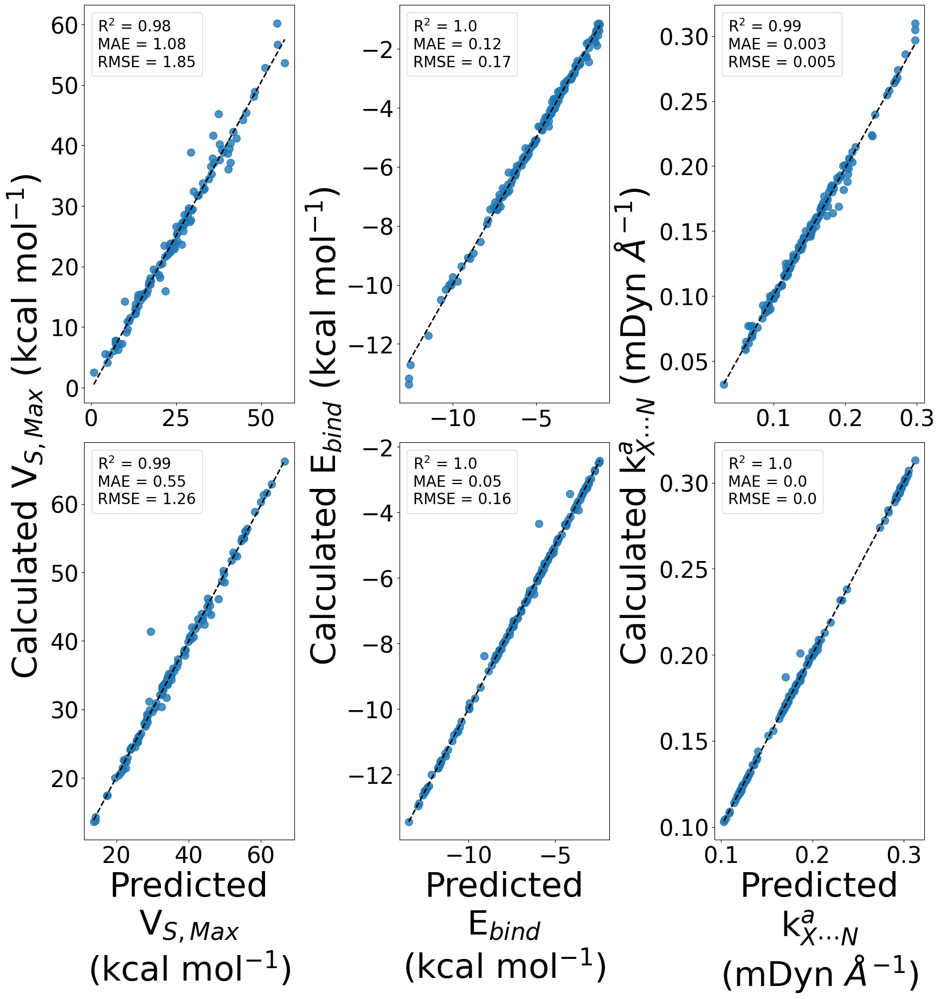

In [171]:
# RegPlot

# Benzene and Ethynyl Benzene

# All Halogen

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=2)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})


## Benzene

### Vmax plot

BX_Vmax_rgplt = sns.regplot(x = BX_RF_Vmax_pred, y = BX_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BX_Ebind_rgplt = sns.regplot(x = BX_RF_Ebind_pred, y = BX_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BX_kXN_rgplt = sns.regplot(x = BX_RF_kXN_pred, y = BX_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_xlabel('')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_RF_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BX_RF_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BX_RF_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_RF_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BX_RF_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BX_RF_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_RF_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BX_RF_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BX_RF_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)


## Ethynyl Benzene

## Vmax plot

BAX_Vmax_rgplt = sns.regplot(x = BAX_RF_Vmax_pred, y = BAX_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BAX_Ebind_rgplt = sns.regplot(x = BAX_RF_Ebind_pred, y = BAX_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BAX_kXN_rgplt = sns.regplot(x = BAX_RF_kXN_pred, y = BAX_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('\t\t\t\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('\t\t\t\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('\t\t\t\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_RF_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAX_RF_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_RF_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_RF_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAX_RF_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_RF_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_RF_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAX_RF_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_RF_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### provide spacing

#### width space

fig.subplots_adjust(wspace=0.5)

#### height space

fig.subplots_adjust(hspace=0.1)

### save figure

plt.savefig("Figures/BX_BAX_RF_regplot.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

#### XGBoost

In [46]:
import xgboost as xgb

##### Benzene

###### Morgan Fingerprint

In [58]:
# XGBoost -- Morgan Finger Prints

# Benzene

## Chlorine

### Vmax
BCl_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42).fit(BCl_MFP_Vmax_X_train, BCl_MFP_Vmax_Y_train)

### Ebind
BCl_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42).fit(BCl_MFP_Ebind_X_train, BCl_MFP_Ebind_Y_train)

### kXN
BCl_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42).fit(BCl_MFP_kXN_X_train, BCl_MFP_kXN_Y_train)

## Bromine

### Vmax
BBr_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42).fit(BBr_MFP_Vmax_X_train, BBr_MFP_Vmax_Y_train)

### Ebind
BBr_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42).fit(BBr_MFP_Ebind_X_train, BBr_MFP_Ebind_Y_train)

### kXN
BBr_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42).fit(BBr_MFP_kXN_X_train, BBr_MFP_kXN_Y_train)

## Iodine

### Vmax
BI_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42).fit(BI_MFP_Vmax_X_train, BI_MFP_Vmax_Y_train)

### Ebind
BI_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42).fit(BI_MFP_Ebind_X_train, BI_MFP_Ebind_Y_train)

### kXN
BI_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42).fit(BI_MFP_kXN_X_train, BI_MFP_kXN_Y_train)

## Astatine

### Vmax
BAt_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42).fit(BAt_MFP_Vmax_X_train, BAt_MFP_Vmax_Y_train)

### Ebind
BAt_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42).fit(BAt_MFP_Ebind_X_train, BAt_MFP_Ebind_Y_train)

### kXN
BAt_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42).fit(BAt_MFP_kXN_X_train, BAt_MFP_kXN_Y_train)

## All Halogen

### Vmax
BX_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42).fit(BX_MFP_Vmax_X_train, BX_MFP_Vmax_Y_train)

### Ebind
BX_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42).fit(BX_MFP_Ebind_X_train, BX_MFP_Ebind_Y_train)

### kXN
BX_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42).fit(BX_MFP_kXN_X_train, BX_MFP_kXN_Y_train)

## All XB

### Vmax
All_XB_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42)\
.fit(All_XB_MFP_Vmax_X_train, All_XB_MFP_Vmax_Y_train)

### Ebind
All_XB_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42)\
.fit(All_XB_MFP_Ebind_X_train, All_XB_MFP_Ebind_Y_train)

### kXN
All_XB_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42)\
.fit(All_XB_MFP_kXN_X_train, All_XB_MFP_kXN_Y_train)

In [59]:
# Predictions

# Benzene

## Chlorine

### Vmax
BCl_xgb_Vmax_MFP_pred = BCl_xgb_Vmax_MFP.predict(BCl_MFP_Vmax_X_test)

### Ebind
BCl_xgb_Ebind_MFP_pred = BCl_xgb_Ebind_MFP.predict(BCl_MFP_Ebind_X_test)

### kXN
BCl_xgb_kXN_MFP_pred = BCl_xgb_kXN_MFP.predict(BCl_MFP_kXN_X_test)

## Bromine

### Vmax
BBr_xgb_Vmax_MFP_pred = BBr_xgb_Vmax_MFP.predict(BBr_MFP_Vmax_X_test)

### Ebind
BBr_xgb_Ebind_MFP_pred = BBr_xgb_Ebind_MFP.predict(BBr_MFP_Ebind_X_test)

### kXN
BBr_xgb_kXN_MFP_pred = BBr_xgb_kXN_MFP.predict(BBr_MFP_kXN_X_test)

## Iodine

### Vmax
BI_xgb_Vmax_MFP_pred = BI_xgb_Vmax_MFP.predict(BI_MFP_Vmax_X_test)

### Ebind
BI_xgb_Ebind_MFP_pred = BI_xgb_Ebind_MFP.predict(BI_MFP_Ebind_X_test)

### kXN
BI_xgb_kXN_MFP_pred = BI_xgb_kXN_MFP.predict(BI_MFP_kXN_X_test)

## Astatine

### Vmax
BAt_xgb_Vmax_MFP_pred = BAt_xgb_Vmax_MFP.predict(BAt_MFP_Vmax_X_test)

### Ebind
BAt_xgb_Ebind_MFP_pred = BAt_xgb_Ebind_MFP.predict(BAt_MFP_Ebind_X_test)

### kXN
BAt_xgb_kXN_MFP_pred = BAt_xgb_kXN_MFP.predict(BAt_MFP_kXN_X_test)

## All Halogen

### Vmax
BX_xgb_Vmax_MFP_pred = BX_xgb_Vmax_MFP.predict(BX_MFP_Vmax_X_test)

### Ebind
BX_xgb_Ebind_MFP_pred = BX_xgb_Ebind_MFP.predict(BX_MFP_Ebind_X_test)

### kXN
BX_xgb_kXN_MFP_pred = BX_xgb_kXN_MFP.predict(BX_MFP_kXN_X_test)

## All XB

### Vmax
All_XB_xgb_Vmax_MFP_pred = All_XB_xgb_Vmax_MFP.predict(All_XB_MFP_Vmax_X_test)

### Ebind
All_XB_xgb_Ebind_MFP_pred = All_XB_xgb_Ebind_MFP.predict(All_XB_MFP_Ebind_X_test)

### kXN
All_XB_xgb_kXN_MFP_pred = All_XB_xgb_kXN_MFP.predict(All_XB_MFP_kXN_X_test)

In [60]:
# Accuracy measurments

# Benzene

## Chlorine

### Vmax
BCl_xgb_MFP_Vmax_r2 = r2_score(BCl_MFP_Vmax_Y_test, BCl_xgb_Vmax_MFP_pred)
BCl_xgb_MFP_Vmax_mae = mean_absolute_error(BCl_MFP_Vmax_Y_test, BCl_xgb_Vmax_MFP_pred)
BCl_xgb_MFP_Vmax_rmse = mean_squared_error(BCl_MFP_Vmax_Y_test, BCl_xgb_Vmax_MFP_pred, squared=False)

### Ebind
BCl_xgb_MFP_Ebind_r2 = r2_score(BCl_MFP_Ebind_Y_test, BCl_xgb_Ebind_MFP_pred)
BCl_xgb_MFP_Ebind_mae = mean_absolute_error(BCl_MFP_Ebind_Y_test, BCl_xgb_Ebind_MFP_pred)
BCl_xgb_MFP_Ebind_rmse = mean_squared_error(BCl_MFP_Ebind_Y_test, BCl_xgb_Ebind_MFP_pred, squared=False)

### kXN
BCl_xgb_MFP_kXN_r2 = r2_score(BCl_MFP_kXN_Y_test, BCl_xgb_kXN_MFP_pred)
BCl_xgb_MFP_kXN_mae = mean_absolute_error(BCl_MFP_kXN_Y_test, BCl_xgb_kXN_MFP_pred)
BCl_xgb_MFP_kXN_rmse = mean_squared_error(BCl_MFP_kXN_Y_test, BCl_xgb_kXN_MFP_pred, squared=False)

## Bromine

### Vmax
BBr_xgb_MFP_Vmax_r2 = r2_score(BBr_MFP_Vmax_Y_test, BBr_xgb_Vmax_MFP_pred)
BBr_xgb_MFP_Vmax_mae = mean_absolute_error(BBr_MFP_Vmax_Y_test, BBr_xgb_Vmax_MFP_pred)
BBr_xgb_MFP_Vmax_rmse = mean_squared_error(BBr_MFP_Vmax_Y_test, BBr_xgb_Vmax_MFP_pred, squared=False)

### Ebind
BBr_xgb_MFP_Ebind_r2 = r2_score(BBr_MFP_Ebind_Y_test, BBr_xgb_Ebind_MFP_pred)
BBr_xgb_MFP_Ebind_mae = mean_absolute_error(BBr_MFP_Ebind_Y_test, BBr_xgb_Ebind_MFP_pred)
BBr_xgb_MFP_Ebind_rmse = mean_squared_error(BBr_MFP_Ebind_Y_test, BBr_xgb_Ebind_MFP_pred, squared=False)

### kXN
BBr_xgb_MFP_kXN_r2 = r2_score(BBr_MFP_kXN_Y_test, BBr_xgb_kXN_MFP_pred)
BBr_xgb_MFP_kXN_mae = mean_absolute_error(BBr_MFP_kXN_Y_test, BBr_xgb_kXN_MFP_pred)
BBr_xgb_MFP_kXN_rmse = mean_squared_error(BBr_MFP_kXN_Y_test, BBr_xgb_kXN_MFP_pred, squared=False)

## Iodine

### Vmax
BI_xgb_MFP_Vmax_r2 = r2_score(BI_MFP_Vmax_Y_test, BI_xgb_Vmax_MFP_pred)
BI_xgb_MFP_Vmax_mae = mean_absolute_error(BI_MFP_Vmax_Y_test, BI_xgb_Vmax_MFP_pred)
BI_xgb_MFP_Vmax_rmse = mean_squared_error(BI_MFP_Vmax_Y_test, BI_xgb_Vmax_MFP_pred, squared=False)

### Ebind
BI_xgb_MFP_Ebind_r2 = r2_score(BI_MFP_Ebind_Y_test, BI_xgb_Ebind_MFP_pred)
BI_xgb_MFP_Ebind_mae = mean_absolute_error(BI_MFP_Ebind_Y_test, BI_xgb_Ebind_MFP_pred)
BI_xgb_MFP_Ebind_rmse = mean_squared_error(BI_MFP_Ebind_Y_test, BI_xgb_Ebind_MFP_pred, squared=False)

### kXN
BI_xgb_MFP_kXN_r2 = r2_score(BI_MFP_kXN_Y_test, BI_xgb_kXN_MFP_pred)
BI_xgb_MFP_kXN_mae = mean_absolute_error(BI_MFP_kXN_Y_test, BI_xgb_kXN_MFP_pred)
BI_xgb_MFP_kXN_rmse = mean_squared_error(BI_MFP_kXN_Y_test, BI_xgb_kXN_MFP_pred, squared=False)

## Astatine

### Vmax
BAt_xgb_MFP_Vmax_r2 = r2_score(BAt_MFP_Vmax_Y_test, BAt_xgb_Vmax_MFP_pred)
BAt_xgb_MFP_Vmax_mae = mean_absolute_error(BAt_MFP_Vmax_Y_test, BAt_xgb_Vmax_MFP_pred)
BAt_xgb_MFP_Vmax_rmse = mean_squared_error(BAt_MFP_Vmax_Y_test, BAt_xgb_Vmax_MFP_pred, squared=False)

### Ebind
BAt_xgb_MFP_Ebind_r2 = r2_score(BAt_MFP_Ebind_Y_test, BAt_xgb_Ebind_MFP_pred)
BAt_xgb_MFP_Ebind_mae = mean_absolute_error(BAt_MFP_Ebind_Y_test, BAt_xgb_Ebind_MFP_pred)
BAt_xgb_MFP_Ebind_rmse = mean_squared_error(BAt_MFP_Ebind_Y_test, BAt_xgb_Ebind_MFP_pred, squared=False)

### kXN
BAt_xgb_MFP_kXN_r2 = r2_score(BAt_MFP_kXN_Y_test, BAt_xgb_kXN_MFP_pred)
BAt_xgb_MFP_kXN_mae = mean_absolute_error(BAt_MFP_kXN_Y_test, BAt_xgb_kXN_MFP_pred)
BAt_xgb_MFP_kXN_rmse = mean_squared_error(BAt_MFP_kXN_Y_test, BAt_xgb_kXN_MFP_pred, squared=False)

## All Halogen

### Vmax
BX_xgb_MFP_Vmax_r2 = r2_score(BX_MFP_Vmax_Y_test, BX_xgb_Vmax_MFP_pred)
BX_xgb_MFP_Vmax_mae = mean_absolute_error(BX_MFP_Vmax_Y_test, BX_xgb_Vmax_MFP_pred)
BX_xgb_MFP_Vmax_rmse = mean_squared_error(BX_MFP_Vmax_Y_test, BX_xgb_Vmax_MFP_pred, squared=False)

### Ebind
BX_xgb_MFP_Ebind_r2 = r2_score(BX_MFP_Ebind_Y_test, BX_xgb_Ebind_MFP_pred)
BX_xgb_MFP_Ebind_mae = mean_absolute_error(BX_MFP_Ebind_Y_test, BX_xgb_Ebind_MFP_pred)
BX_xgb_MFP_Ebind_rmse = mean_squared_error(BX_MFP_Ebind_Y_test, BX_xgb_Ebind_MFP_pred, squared=False)

### kXN
BX_xgb_MFP_kXN_r2 = r2_score(BX_MFP_kXN_Y_test, BX_xgb_kXN_MFP_pred)
BX_xgb_MFP_kXN_mae = mean_absolute_error(BX_MFP_kXN_Y_test, BX_xgb_kXN_MFP_pred)
BX_xgb_MFP_kXN_rmse = mean_squared_error(BX_MFP_kXN_Y_test, BX_xgb_kXN_MFP_pred, squared=False)

## All XB

### Vmax
All_XB_xgb_MFP_Vmax_r2 = r2_score(All_XB_MFP_Vmax_Y_test, All_XB_xgb_Vmax_MFP_pred)
All_XB_xgb_MFP_Vmax_mae = mean_absolute_error(All_XB_MFP_Vmax_Y_test, All_XB_xgb_Vmax_MFP_pred)
All_XB_xgb_MFP_Vmax_rmse = mean_squared_error(All_XB_MFP_Vmax_Y_test, All_XB_xgb_Vmax_MFP_pred, squared=False)

### Ebind
All_XB_xgb_MFP_Ebind_r2 = r2_score(All_XB_MFP_Ebind_Y_test, All_XB_xgb_Ebind_MFP_pred)
All_XB_xgb_MFP_Ebind_mae = mean_absolute_error(All_XB_MFP_Ebind_Y_test, All_XB_xgb_Ebind_MFP_pred)
All_XB_xgb_MFP_Ebind_rmse = mean_squared_error(All_XB_MFP_Ebind_Y_test, All_XB_xgb_Ebind_MFP_pred, squared=False)

### kXN
All_XB_xgb_MFP_kXN_r2 = r2_score(All_XB_MFP_kXN_Y_test, All_XB_xgb_kXN_MFP_pred)
All_XB_xgb_MFP_kXN_mae = mean_absolute_error(All_XB_MFP_kXN_Y_test, All_XB_xgb_kXN_MFP_pred)
All_XB_xgb_MFP_kXN_rmse = mean_squared_error(All_XB_MFP_kXN_Y_test, All_XB_xgb_kXN_MFP_pred, squared=False)

Cross Validation

In [61]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# XGB method

# Benzene

## Chlorine

### Vmax

BCl_Vmax_MFP_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BCl_Ebind_MFP_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BCl_kXN_MFP_xgb = xgb.XGBRegressor(random_state=34)

## Bromine

### Vmax

BBr_Vmax_MFP_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BBr_Ebind_MFP_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BBr_kXN_MFP_xgb = xgb.XGBRegressor(random_state=34)

## Iodine

### Vmax

BI_Vmax_MFP_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BI_Ebind_MFP_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BI_kXN_MFP_xgb = xgb.XGBRegressor(random_state=34)

## Astatine

### Vmax

BAt_Vmax_MFP_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BAt_Ebind_MFP_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BAt_kXN_MFP_xgb = xgb.XGBRegressor(random_state=34)

## All Halogen

### Vmax

BX_Vmax_MFP_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BX_Ebind_MFP_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BX_kXN_MFP_xgb = xgb.XGBRegressor(random_state=34)

In [62]:
# Cross validation

# Benzene

## Chlorine

### Vmax

BCl_Vmax_MFP_xgb_cv = cross_validate(BCl_Vmax_MFP_xgb, BCl_MRG_df, BCl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BCl_Ebind_MFP_xgb_cv = cross_validate(BCl_Ebind_MFP_xgb, BCl_MRG_df, BCl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BCl_kXN_MFP_xgb_cv = cross_validate(BCl_kXN_MFP_xgb, BCl_MRG_df, BCl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BBr_Vmax_MFP_xgb_cv = cross_validate(BBr_Vmax_MFP_xgb, BBr_MRG_df, BBr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BBr_Ebind_MFP_xgb_cv = cross_validate(BBr_Ebind_MFP_xgb, BBr_MRG_df, BBr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BBr_kXN_MFP_xgb_cv = cross_validate(BBr_kXN_MFP_xgb, BBr_MRG_df, BBr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BI_Vmax_MFP_xgb_cv = cross_validate(BI_Vmax_MFP_xgb, BI_MRG_df, BI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BI_Ebind_MFP_xgb_cv = cross_validate(BI_Ebind_MFP_xgb, BI_MRG_df, BI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BI_kXN_MFP_xgb_cv = cross_validate(BI_kXN_MFP_xgb, BI_MRG_df, BI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAt_Vmax_MFP_xgb_cv = cross_validate(BAt_Vmax_MFP_xgb, BAt_MRG_df, BAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAt_Ebind_MFP_xgb_cv = cross_validate(BAt_Ebind_MFP_xgb, BAt_MRG_df, BAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAt_kXN_MFP_xgb_cv = cross_validate(BAt_kXN_MFP_xgb, BAt_MRG_df, BAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BX_Vmax_MFP_xgb_cv = cross_validate(BX_Vmax_MFP_xgb, BX_MRG_df, BX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BX_Ebind_MFP_xgb_cv = cross_validate(BX_Ebind_MFP_xgb, BX_MRG_df, BX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BX_kXN_MFP_xgb_cv = cross_validate(BX_kXN_MFP_xgb, BX_MRG_df, BX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [63]:
# CV Scores

# Benzene

## Chlorine

### Vmax

BCl_Vmax_MFP_xgb_cv_res_lst = [
    round(np.mean(BCl_Vmax_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BCl_Vmax_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Vmax_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BCl_Ebind_MFP_xgb_cv_res_lst = [
    round(np.mean(BCl_Ebind_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BCl_Ebind_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Ebind_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BCl_kXN_MFP_xgb_cv_res_lst = [
    round(np.mean(BCl_kXN_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BCl_kXN_MFP_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BCl_kXN_MFP_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BBr_Vmax_MFP_xgb_cv_res_lst = [
    round(np.mean(BBr_Vmax_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BBr_Vmax_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Vmax_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BBr_Ebind_MFP_xgb_cv_res_lst = [
    round(np.mean(BBr_Ebind_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BBr_Ebind_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Ebind_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BBr_kXN_MFP_xgb_cv_res_lst = [
    round(np.mean(BBr_kXN_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BBr_kXN_MFP_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BBr_kXN_MFP_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BI_Vmax_MFP_xgb_cv_res_lst = [
    round(np.mean(BI_Vmax_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BI_Vmax_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Vmax_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BI_Ebind_MFP_xgb_cv_res_lst = [
    round(np.mean(BI_Ebind_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BI_Ebind_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Ebind_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BI_kXN_MFP_xgb_cv_res_lst = [
    round(np.mean(BI_kXN_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BI_kXN_MFP_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BI_kXN_MFP_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAt_Vmax_MFP_xgb_cv_res_lst = [
    round(np.mean(BAt_Vmax_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAt_Vmax_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Vmax_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAt_Ebind_MFP_xgb_cv_res_lst = [
    round(np.mean(BAt_Ebind_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAt_Ebind_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Ebind_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAt_kXN_MFP_xgb_cv_res_lst = [
    round(np.mean(BAt_kXN_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAt_kXN_MFP_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAt_kXN_MFP_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BX_Vmax_MFP_xgb_cv_res_lst = [
    round(np.mean(BX_Vmax_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BX_Vmax_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Vmax_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BX_Ebind_MFP_xgb_cv_res_lst = [
    round(np.mean(BX_Ebind_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BX_Ebind_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Ebind_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BX_kXN_MFP_xgb_cv_res_lst = [
    round(np.mean(BX_kXN_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BX_kXN_MFP_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BX_kXN_MFP_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

In [71]:
# Create CV metrics Dataframe

# XGBoost

# Benzene

# constructing dictionary for data

## Vmax

BX_CV_xgb_MFP_Vmax_dict = {'BCl': BCl_Vmax_MFP_xgb_cv_res_lst, 'BBr': BBr_Vmax_MFP_xgb_cv_res_lst, 
                     'BI': BI_Vmax_MFP_xgb_cv_res_lst, 'BAt': BAt_Vmax_MFP_xgb_cv_res_lst, 
                      'BX': BX_Vmax_MFP_xgb_cv_res_lst}

BX_CV_xgb_MFP_Vmax_df = pd.DataFrame(data = BX_CV_xgb_MFP_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BX_CV_xgb_MFP_Ebind_dict = {'BCl': BCl_Ebind_MFP_xgb_cv_res_lst, 'BBr': BBr_Ebind_MFP_xgb_cv_res_lst, 
                     'BI': BI_Ebind_MFP_xgb_cv_res_lst, 'BAt': BAt_Ebind_MFP_xgb_cv_res_lst, 
                      'BX': BX_Ebind_MFP_xgb_cv_res_lst}

BX_CV_xgb_MFP_Ebind_df = pd.DataFrame(data = BX_CV_xgb_MFP_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BX_CV_xgb_MFP_kXN_dict = {'BCl': BCl_kXN_MFP_xgb_cv_res_lst, 'BBr': BBr_kXN_MFP_xgb_cv_res_lst, 
                     'BI': BI_kXN_MFP_xgb_cv_res_lst, 'BAt': BAt_kXN_MFP_xgb_cv_res_lst, 
                      'BX': BX_kXN_MFP_xgb_cv_res_lst}

BX_CV_xgb_MFP_kXN_df = pd.DataFrame(data = BX_CV_xgb_MFP_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BX_CV_xgb_MFP_Vmax_df.to_csv('CV_results/BX_xgb_cv_Vmax_MFP_metric_results.csv')
BX_CV_xgb_MFP_Ebind_df.to_csv('CV_results/BX_xgb_cv_Ebind_MFP_metric_results.csv')
BX_CV_xgb_MFP_kXN_df.to_csv('CV_results/BX_xgb_cv_kXN_MFP_metric_results.csv')

RegPlots

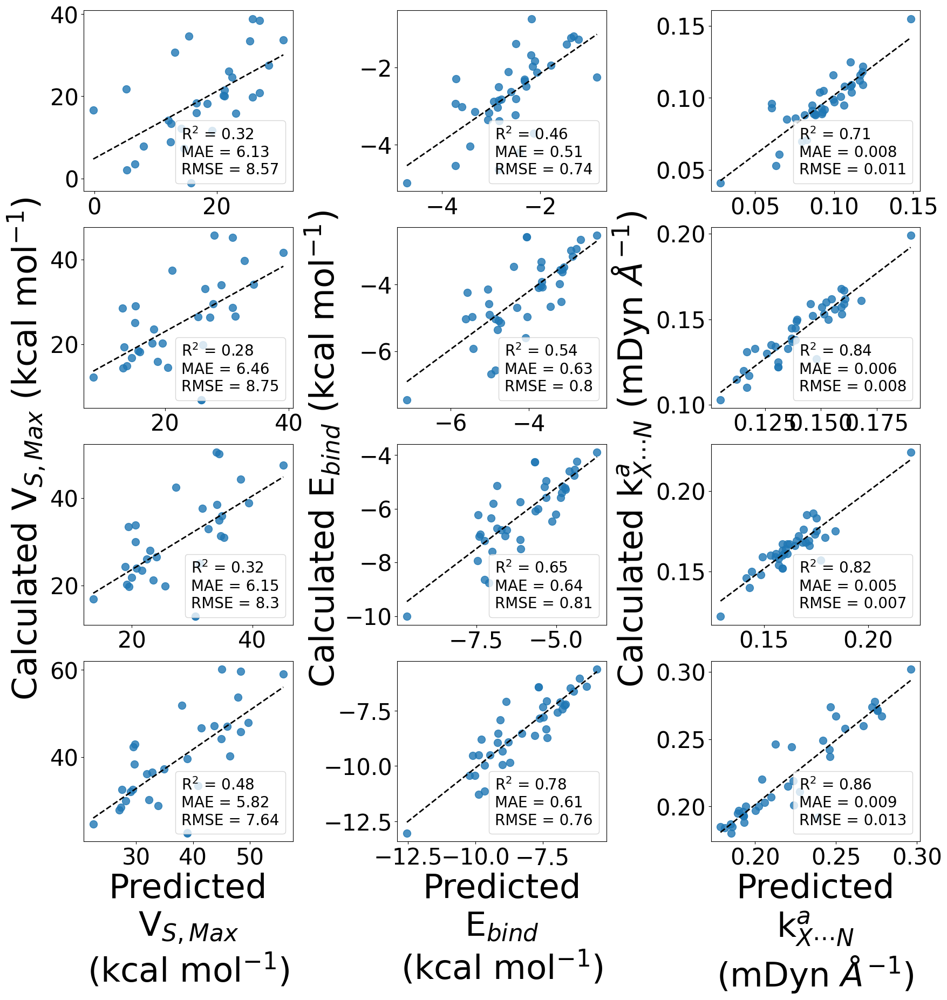

In [180]:
# RegPlot with all BX -- XGBoost

fig, ax = plt.subplots(ncols=3,nrows=4)

## BCl == row 0
## BBr == row 1
##  BI == row 2
## BAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BCl_Vmax_rgplt = sns.regplot(x = BCl_xgb_Vmax_MFP_pred, y = BCl_MFP_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BCl_Ebind_rgplt = sns.regplot(x = BCl_xgb_Ebind_MFP_pred, y = BCl_MFP_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BCl_kXN_rgplt = sns.regplot(x = BCl_xgb_kXN_MFP_pred, y = BCl_MFP_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BCl_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BCl_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BCl_xgb_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BCl_xgb_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BBr_Vmax_rgplt = sns.regplot(x = BBr_xgb_Vmax_MFP_pred, y = BBr_MFP_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BBr_Ebind_rgplt = sns.regplot(x = BBr_xgb_Ebind_MFP_pred, y = BBr_MFP_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BBr_kXN_rgplt = sns.regplot(x = BBr_xgb_kXN_MFP_pred, y = BBr_MFP_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BBr_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BBr_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BBr_xgb_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BBr_xgb_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BI_Vmax_rgplt = sns.regplot(x = BI_xgb_Vmax_MFP_pred, y = BI_MFP_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BI_Ebind_rgplt = sns.regplot(x = BI_xgb_Ebind_MFP_pred, y = BI_MFP_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BI_kXN_rgplt = sns.regplot(x = BI_xgb_kXN_MFP_pred, y = BI_MFP_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BI_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BI_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BI_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BI_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BI_xgb_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BI_xgb_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAt_Vmax_rgplt = sns.regplot(x = BAt_xgb_Vmax_MFP_pred, y = BAt_MFP_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAt_Ebind_rgplt = sns.regplot(x = BAt_xgb_Ebind_MFP_pred, y = BAt_MFP_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAt_kXN_rgplt = sns.regplot(x = BAt_xgb_kXN_MFP_pred, y = BAt_MFP_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAt_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAt_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAt_xgb_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAt_xgb_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BCl_BBr_BI_BAt_xgb_MFP_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

###### Data Based Approach

In [72]:
# XGBoost Regression -- Data Based Approach

# Benzene

## Chlorine

### Vmax
BCl_xgb_Vmax = xgb.XGBRegressor().fit(BCl_Vmax_X_train, BCl_Vmax_Y_train)

### Ebind
BCl_xgb_Ebind = xgb.XGBRegressor().fit(BCl_Ebind_X_train, BCl_Ebind_Y_train)

### kXN
BCl_xgb_kXN = xgb.XGBRegressor().fit(BCl_kXN_X_train, BCl_kXN_Y_train)

## Bromine

### Vmax
BBr_xgb_Vmax = xgb.XGBRegressor().fit(BBr_Vmax_X_train, BBr_Vmax_Y_train)

### Ebind
BBr_xgb_Ebind = xgb.XGBRegressor().fit(BBr_Ebind_X_train, BBr_Ebind_Y_train)

### kXN
BBr_xgb_kXN = xgb.XGBRegressor().fit(BBr_kXN_X_train, BBr_kXN_Y_train)

## Iodine

### Vmax
BI_xgb_Vmax = xgb.XGBRegressor().fit(BI_Vmax_X_train, BI_Vmax_Y_train)

### Ebind
BI_xgb_Ebind = xgb.XGBRegressor().fit(BI_Ebind_X_train, BI_Ebind_Y_train)

### kXN
BI_xgb_kXN = xgb.XGBRegressor().fit(BI_kXN_X_train, BI_kXN_Y_train)

## Astatine

### Vmax
BAt_xgb_Vmax = xgb.XGBRegressor().fit(BAt_Vmax_X_train, BAt_Vmax_Y_train)

### Ebind
BAt_xgb_Ebind = xgb.XGBRegressor().fit(BAt_Ebind_X_train, BAt_Ebind_Y_train)

### kXN
BAt_xgb_kXN = xgb.XGBRegressor().fit(BAt_kXN_X_train, BAt_kXN_Y_train)

## All Halogen

### Vmax
BX_xgb_Vmax = xgb.XGBRegressor().fit(BX_Vmax_X_train, BX_Vmax_Y_train)

### Ebind
BX_xgb_Ebind = xgb.XGBRegressor().fit(BX_Ebind_X_train, BX_Ebind_Y_train)

### kXN
BX_xgb_kXN = xgb.XGBRegressor().fit(BX_kXN_X_train, BX_kXN_Y_train)

In [73]:
# XGBoost Predictions

# Benzene

## Chlorine

### Vmax

BCl_xgb_Vmax_pred = BCl_xgb_Vmax.predict(BCl_Vmax_X_test)

### Ebind

BCl_xgb_Ebind_pred = BCl_xgb_Ebind.predict(BCl_Ebind_X_test)

### kXN

BCl_xgb_kXN_pred = BCl_xgb_kXN.predict(BCl_kXN_X_test)

## Bromine

### Vmax

BBr_xgb_Vmax_pred = BBr_xgb_Vmax.predict(BBr_Vmax_X_test)

### Ebind

BBr_xgb_Ebind_pred = BBr_xgb_Ebind.predict(BBr_Ebind_X_test)

### kXN

BBr_xgb_kXN_pred = BBr_xgb_kXN.predict(BBr_kXN_X_test)

## Iodine

### Vmax

BI_xgb_Vmax_pred = BI_xgb_Vmax.predict(BI_Vmax_X_test)

### Ebind

BI_xgb_Ebind_pred = BI_xgb_Ebind.predict(BI_Ebind_X_test)

### kXN

BI_xgb_kXN_pred = BI_xgb_kXN.predict(BI_kXN_X_test)

## Astatine

### Vmax

BAt_xgb_Vmax_pred = BAt_xgb_Vmax.predict(BAt_Vmax_X_test)

### Ebind

BAt_xgb_Ebind_pred = BAt_xgb_Ebind.predict(BAt_Ebind_X_test)

### kXN

BAt_xgb_kXN_pred = BAt_xgb_kXN.predict(BAt_kXN_X_test)

## All Halogen

### Vmax

BX_xgb_Vmax_pred = BX_xgb_Vmax.predict(BX_Vmax_X_test)

### Ebind

BX_xgb_Ebind_pred = BX_xgb_Ebind.predict(BX_Ebind_X_test)

### kXN

BX_xgb_kXN_pred = BX_xgb_kXN.predict(BX_kXN_X_test)

In [74]:
# Accuracy Measurements -- R^2, MAE, RMSE

# Benzene

## Chlorine

### Vmax

BCl_xgb_Vmax_r2 = r2_score(BCl_Vmax_Y_test, BCl_xgb_Vmax_pred)
BCl_xgb_Vmax_mae = mean_absolute_error(BCl_Vmax_Y_test, BCl_xgb_Vmax_pred)
BCl_xgb_Vmax_rmse = mean_squared_error(BCl_Vmax_Y_test, BCl_xgb_Vmax_pred, squared=False)

### Ebind

BCl_xgb_Ebind_r2 = r2_score(BCl_Ebind_Y_test, BCl_xgb_Ebind_pred)
BCl_xgb_Ebind_mae = mean_absolute_error(BCl_Ebind_Y_test, BCl_xgb_Ebind_pred)
BCl_xgb_Ebind_rmse = mean_squared_error(BCl_Ebind_Y_test, BCl_xgb_Ebind_pred, squared=False)

### kXN

BCl_xgb_kXN_r2 = r2_score(BCl_kXN_Y_test, BCl_xgb_kXN_pred)
BCl_xgb_kXN_mae = mean_absolute_error(BCl_kXN_Y_test, BCl_xgb_kXN_pred)
BCl_xgb_kXN_rmse = mean_squared_error(BCl_kXN_Y_test, BCl_xgb_kXN_pred, squared=False)

## Bromine

### Vmax

BBr_xgb_Vmax_r2 = r2_score(BBr_Vmax_Y_test, BBr_xgb_Vmax_pred)
BBr_xgb_Vmax_mae = mean_absolute_error(BBr_Vmax_Y_test, BBr_xgb_Vmax_pred)
BBr_xgb_Vmax_rmse = mean_squared_error(BBr_Vmax_Y_test, BBr_xgb_Vmax_pred, squared=False)

### Ebind

BBr_xgb_Ebind_r2 = r2_score(BBr_Ebind_Y_test, BBr_xgb_Ebind_pred)
BBr_xgb_Ebind_mae = mean_absolute_error(BBr_Ebind_Y_test, BBr_xgb_Ebind_pred)
BBr_xgb_Ebind_rmse = mean_squared_error(BBr_Ebind_Y_test, BBr_xgb_Ebind_pred, squared=False)

### kXN

BBr_xgb_kXN_r2 = r2_score(BBr_kXN_Y_test, BBr_xgb_kXN_pred)
BBr_xgb_kXN_mae = mean_absolute_error(BBr_kXN_Y_test, BBr_xgb_kXN_pred)
BBr_xgb_kXN_rmse = mean_squared_error(BBr_kXN_Y_test, BBr_xgb_kXN_pred, squared=False)

## Iodine

### Vmax

BI_xgb_Vmax_r2 = r2_score(BI_Vmax_Y_test, BI_xgb_Vmax_pred)
BI_xgb_Vmax_mae = mean_absolute_error(BI_Vmax_Y_test, BI_xgb_Vmax_pred)
BI_xgb_Vmax_rmse = mean_squared_error(BI_Vmax_Y_test, BI_xgb_Vmax_pred, squared=False)

### Ebind

BI_xgb_Ebind_r2 = r2_score(BI_Ebind_Y_test, BI_xgb_Ebind_pred)
BI_xgb_Ebind_mae = mean_absolute_error(BI_Ebind_Y_test, BI_xgb_Ebind_pred)
BI_xgb_Ebind_rmse = mean_squared_error(BI_Ebind_Y_test, BI_xgb_Ebind_pred, squared=False)

### kXN

BI_xgb_kXN_r2 = r2_score(BI_kXN_Y_test, BI_xgb_kXN_pred)
BI_xgb_kXN_mae = mean_absolute_error(BI_kXN_Y_test, BI_xgb_kXN_pred)
BI_xgb_kXN_rmse = mean_squared_error(BI_kXN_Y_test, BI_xgb_kXN_pred, squared=False)

## Astatine

### Vmax

BAt_xgb_Vmax_r2 = r2_score(BAt_Vmax_Y_test, BAt_xgb_Vmax_pred)
BAt_xgb_Vmax_mae = mean_absolute_error(BAt_Vmax_Y_test, BAt_xgb_Vmax_pred)
BAt_xgb_Vmax_rmse = mean_squared_error(BAt_Vmax_Y_test, BAt_xgb_Vmax_pred, squared=False)

### Ebind

BAt_xgb_Ebind_r2 = r2_score(BAt_Ebind_Y_test, BAt_xgb_Ebind_pred)
BAt_xgb_Ebind_mae = mean_absolute_error(BAt_Ebind_Y_test, BAt_xgb_Ebind_pred)
BAt_xgb_Ebind_rmse = mean_squared_error(BAt_Ebind_Y_test, BAt_xgb_Ebind_pred, squared=False)

### kXN

BAt_xgb_kXN_r2 = r2_score(BAt_kXN_Y_test, BAt_xgb_kXN_pred)
BAt_xgb_kXN_mae = mean_absolute_error(BAt_kXN_Y_test, BAt_xgb_kXN_pred)
BAt_xgb_kXN_rmse = mean_squared_error(BAt_kXN_Y_test, BAt_xgb_kXN_pred, squared=False)

## All Halogen

### Vmax

BX_xgb_Vmax_r2 = r2_score(BX_Vmax_Y_test, BX_xgb_Vmax_pred)
BX_xgb_Vmax_mae = mean_absolute_error(BX_Vmax_Y_test, BX_xgb_Vmax_pred)
BX_xgb_Vmax_rmse = mean_squared_error(BX_Vmax_Y_test, BX_xgb_Vmax_pred, squared=False)

### Ebind

BX_xgb_Ebind_r2 = r2_score(BX_Ebind_Y_test, BX_xgb_Ebind_pred)
BX_xgb_Ebind_mae = mean_absolute_error(BX_Ebind_Y_test, BX_xgb_Ebind_pred)
BX_xgb_Ebind_rmse = mean_squared_error(BX_Ebind_Y_test, BX_xgb_Ebind_pred, squared=False)

### kXN

BX_xgb_kXN_r2 = r2_score(BX_kXN_Y_test, BX_xgb_kXN_pred)
BX_xgb_kXN_mae = mean_absolute_error(BX_kXN_Y_test, BX_xgb_kXN_pred)
BX_xgb_kXN_rmse = mean_squared_error(BX_kXN_Y_test, BX_xgb_kXN_pred, squared=False)

Cross Validation

In [75]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# XGBoost method

# Benzene

## Chlorine

### Vmax

BCl_Vmax_cv_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BCl_Ebind_cv_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BCl_kXN_cv_xgb = xgb.XGBRegressor(random_state=34)

## Bromine

### Vmax

BBr_Vmax_cv_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BBr_Ebind_cv_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BBr_kXN_cv_xgb = xgb.XGBRegressor(random_state=34)

## Iodine

### Vmax

BI_Vmax_cv_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BI_Ebind_cv_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BI_kXN_cv_xgb = xgb.XGBRegressor(random_state=34)

## Astatine

### Vmax

BAt_Vmax_cv_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BAt_Ebind_cv_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BAt_kXN_cv_xgb = xgb.XGBRegressor(random_state=34)

## All Halogen

### Vmax

BX_Vmax_cv_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BX_Ebind_cv_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BX_kXN_cv_xgb = xgb.XGBRegressor(random_state=34)

In [76]:
# CV -- 5 fold cross validation

# Benzene

## Chlorine

### Vmax

BCl_Vmax_xgb_cv = cross_validate(BCl_Vmax_cv_xgb, BCl_Vmax_selfeat, BCl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BCl_Ebind_xgb_cv = cross_validate(BCl_Ebind_cv_xgb, BCl_Ebind_selfeat, BCl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BCl_kXN_xgb_cv = cross_validate(BCl_kXN_cv_xgb, BCl_kXN_selfeat, BCl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BBr_Vmax_xgb_cv = cross_validate(BBr_Vmax_cv_xgb, BBr_Vmax_selfeat, BBr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BBr_Ebind_xgb_cv = cross_validate(BBr_Ebind_cv_xgb, BBr_Ebind_selfeat, BBr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BBr_kXN_xgb_cv = cross_validate(BBr_kXN_cv_xgb, BBr_kXN_selfeat, BBr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BI_Vmax_xgb_cv = cross_validate(BI_Vmax_cv_xgb, BI_Vmax_selfeat, BI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BI_Ebind_xgb_cv = cross_validate(BI_Ebind_cv_xgb, BI_Ebind_selfeat, BI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BI_kXN_xgb_cv = cross_validate(BI_kXN_cv_xgb, BI_kXN_selfeat, BI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAt_Vmax_xgb_cv = cross_validate(BAt_Vmax_cv_xgb, BAt_Vmax_selfeat, BAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAt_Ebind_xgb_cv = cross_validate(BAt_Ebind_cv_xgb, BAt_Ebind_selfeat, BAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAt_kXN_xgb_cv = cross_validate(BAt_kXN_cv_xgb, BAt_kXN_selfeat, BAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BX_Vmax_xgb_cv = cross_validate(BX_Vmax_cv_xgb, BX_Vmax_selfeat, BX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BX_Ebind_xgb_cv = cross_validate(BX_Ebind_cv_xgb, BX_Ebind_selfeat, BX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BX_kXN_xgb_cv = cross_validate(BX_kXN_cv_xgb, BX_kXN_selfeat, BX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [77]:
# CV Scores

# Benzene

## Chlorine

### Vmax

BCl_Vmax_xgb_cv_res_lst = [
    round(np.mean(BCl_Vmax_xgb_cv['test_r2']), 2), 
    round(np.mean(-BCl_Vmax_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Vmax_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BCl_Ebind_xgb_cv_res_lst = [
    round(np.mean(BCl_Ebind_xgb_cv['test_r2']), 2), 
    round(np.mean(-BCl_Ebind_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Ebind_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BCl_kXN_xgb_cv_res_lst = [
    round(np.mean(BCl_kXN_xgb_cv['test_r2']), 2), 
    round(np.mean(-BCl_kXN_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BCl_kXN_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BBr_Vmax_xgb_cv_res_lst = [
    round(np.mean(BBr_Vmax_xgb_cv['test_r2']), 2), 
    round(np.mean(-BBr_Vmax_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Vmax_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BBr_Ebind_xgb_cv_res_lst = [
    round(np.mean(BBr_Ebind_xgb_cv['test_r2']), 2), 
    round(np.mean(-BBr_Ebind_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Ebind_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BBr_kXN_xgb_cv_res_lst = [
    round(np.mean(BBr_kXN_xgb_cv['test_r2']), 2), 
    round(np.mean(-BBr_kXN_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BBr_kXN_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BI_Vmax_xgb_cv_res_lst = [
    round(np.mean(BI_Vmax_xgb_cv['test_r2']), 2), 
    round(np.mean(-BI_Vmax_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Vmax_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BI_Ebind_xgb_cv_res_lst = [
    round(np.mean(BI_Ebind_xgb_cv['test_r2']), 2), 
    round(np.mean(-BI_Ebind_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Ebind_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BI_kXN_xgb_cv_res_lst = [
    round(np.mean(BI_kXN_xgb_cv['test_r2']), 2), 
    round(np.mean(-BI_kXN_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BI_kXN_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAt_Vmax_xgb_cv_res_lst = [
    round(np.mean(BAt_Vmax_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAt_Vmax_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Vmax_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAt_Ebind_xgb_cv_res_lst = [
    round(np.mean(BAt_Ebind_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAt_Ebind_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Ebind_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAt_kXN_xgb_cv_res_lst = [
    round(np.mean(BAt_kXN_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAt_kXN_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAt_kXN_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BX_Vmax_xgb_cv_res_lst = [
    round(np.mean(BX_Vmax_xgb_cv['test_r2']), 2), 
    round(np.mean(-BX_Vmax_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Vmax_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BX_Ebind_xgb_cv_res_lst = [
    round(np.mean(BX_Ebind_xgb_cv['test_r2']), 2), 
    round(np.mean(-BX_Ebind_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Ebind_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BX_kXN_xgb_cv_res_lst = [
    round(np.mean(BX_kXN_xgb_cv['test_r2']), 2), 
    round(np.mean(-BX_kXN_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BX_kXN_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

In [78]:
# Create CV metrics Dataframe

# XGBoost

# Benzene

# constructing dictionary for data

## Vmax

BX_CV_xgb_Vmax_dict = {'BCl': BCl_Vmax_xgb_cv_res_lst, 'BBr': BBr_Vmax_xgb_cv_res_lst, 
                     'BI': BI_Vmax_xgb_cv_res_lst, 'BAt': BAt_Vmax_xgb_cv_res_lst, 
                      'BX': BX_Vmax_xgb_cv_res_lst}

BX_CV_xgb_Vmax_df = pd.DataFrame(data = BX_CV_xgb_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BX_CV_xgb_Ebind_dict = {'BCl': BCl_Ebind_xgb_cv_res_lst, 'BBr': BBr_Ebind_xgb_cv_res_lst, 
                     'BI': BI_Ebind_xgb_cv_res_lst, 'BAt': BAt_Ebind_xgb_cv_res_lst, 
                      'BX': BX_Ebind_xgb_cv_res_lst}

BX_CV_xgb_Ebind_df = pd.DataFrame(data = BX_CV_xgb_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BX_CV_xgb_kXN_dict = {'BCl': BCl_kXN_xgb_cv_res_lst, 'BBr': BBr_kXN_xgb_cv_res_lst, 
                     'BI': BI_kXN_xgb_cv_res_lst, 'BAt': BAt_kXN_xgb_cv_res_lst, 
                      'BX': BX_kXN_xgb_cv_res_lst}

BX_CV_xgb_kXN_df = pd.DataFrame(data = BX_CV_xgb_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BX_CV_xgb_Vmax_df.to_csv('CV_results/BX_xgb_cv_Vmax_metric_results.csv')
BX_CV_xgb_Ebind_df.to_csv('CV_results/BX_xgb_cv_Ebind_metric_results.csv')
BX_CV_xgb_kXN_df.to_csv('CV_results/BX_xgb_cv_kXN_metric_results.csv')

Regplot

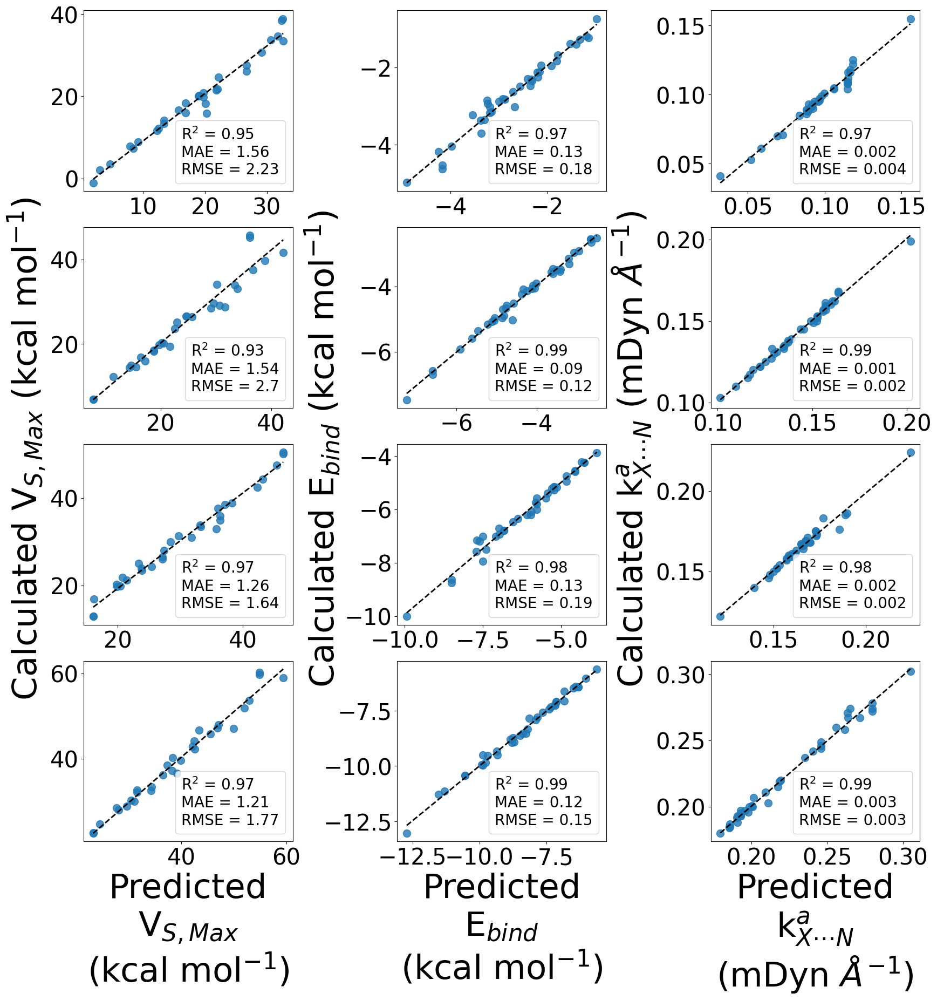

In [188]:
# RegPlot with all BX

fig, ax = plt.subplots(ncols=3,nrows=4)

## BCl == row 0
## BBr == row 1
##  BI == row 2
## BAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BCl_Vmax_rgplt = sns.regplot(x = BCl_xgb_Vmax_pred, y = BCl_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BCl_Ebind_rgplt = sns.regplot(x = BCl_xgb_Ebind_pred, y = BCl_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BCl_kXN_rgplt = sns.regplot(x = BCl_xgb_kXN_pred, y = BCl_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_xgb_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BCl_xgb_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_xgb_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_xgb_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BCl_xgb_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_xgb_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_xgb_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BCl_xgb_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BCl_xgb_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BBr_Vmax_rgplt = sns.regplot(x = BBr_xgb_Vmax_pred, y = BBr_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BBr_Ebind_rgplt = sns.regplot(x = BBr_xgb_Ebind_pred, y = BBr_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BBr_kXN_rgplt = sns.regplot(x = BBr_xgb_kXN_pred, y = BBr_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_xgb_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BBr_xgb_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_xgb_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_xgb_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BBr_xgb_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_xgb_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_xgb_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BBr_xgb_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BBr_xgb_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BI_Vmax_rgplt = sns.regplot(x = BI_xgb_Vmax_pred, y = BI_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BI_Ebind_rgplt = sns.regplot(x = BI_xgb_Ebind_pred, y = BI_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BI_kXN_rgplt = sns.regplot(x = BI_xgb_kXN_pred, y = BI_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_xgb_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BI_xgb_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BI_xgb_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_xgb_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BI_xgb_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BI_xgb_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_xgb_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BI_xgb_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BI_xgb_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAt_Vmax_rgplt = sns.regplot(x = BAt_xgb_Vmax_pred, y = BAt_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAt_Ebind_rgplt = sns.regplot(x = BAt_xgb_Ebind_pred, y = BAt_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAt_kXN_rgplt = sns.regplot(x = BAt_xgb_kXN_pred, y = BAt_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_xgb_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAt_xgb_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_xgb_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_xgb_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAt_xgb_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_xgb_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_xgb_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAt_xgb_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAt_xgb_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BCl_BBr_BI_BAt_xgb_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

##### Ethynyl Benzene

###### Morgan Fingerprints

In [79]:
# XGBoost -- Morgan Finger Prints

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42).fit(BACl_MFP_Vmax_X_train, BACl_MFP_Vmax_Y_train)

### Ebind
BACl_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42).fit(BACl_MFP_Ebind_X_train, BACl_MFP_Ebind_Y_train)

### kXN
BACl_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42).fit(BACl_MFP_kXN_X_train, BACl_MFP_kXN_Y_train)

## Bromine

### Vmax
BABr_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42).fit(BABr_MFP_Vmax_X_train, BABr_MFP_Vmax_Y_train)

### Ebind
BABr_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42).fit(BABr_MFP_Ebind_X_train, BABr_MFP_Ebind_Y_train)

### kXN
BABr_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42).fit(BABr_MFP_kXN_X_train, BABr_MFP_kXN_Y_train)

## Iodine

### Vmax
BAI_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42).fit(BAI_MFP_Vmax_X_train, BAI_MFP_Vmax_Y_train)

### Ebind
BAI_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42).fit(BAI_MFP_Ebind_X_train, BAI_MFP_Ebind_Y_train)

### kXN
BAI_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42).fit(BAI_MFP_kXN_X_train, BAI_MFP_kXN_Y_train)

## Astatine

### Vmax
BAAt_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42).fit(BAAt_MFP_Vmax_X_train, BAAt_MFP_Vmax_Y_train)

### Ebind
BAAt_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42).fit(BAAt_MFP_Ebind_X_train, BAAt_MFP_Ebind_Y_train)

### kXN
BAAt_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42).fit(BAAt_MFP_kXN_X_train, BAAt_MFP_kXN_Y_train)

## All Halogen

### Vmax
BAX_xgb_Vmax_MFP = xgb.XGBRegressor(random_state=42).fit(BAX_MFP_Vmax_X_train, BAX_MFP_Vmax_Y_train)

### Ebind
BAX_xgb_Ebind_MFP = xgb.XGBRegressor(random_state=42).fit(BAX_MFP_Ebind_X_train, BAX_MFP_Ebind_Y_train)

### kXN
BAX_xgb_kXN_MFP = xgb.XGBRegressor(random_state=42).fit(BAX_MFP_kXN_X_train, BAX_MFP_kXN_Y_train)

In [80]:
# Predictions

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_xgb_Vmax_MFP_pred = BACl_xgb_Vmax_MFP.predict(BACl_MFP_Vmax_X_test)

### Ebind
BACl_xgb_Ebind_MFP_pred = BACl_xgb_Ebind_MFP.predict(BACl_MFP_Ebind_X_test)

### kXN
BACl_xgb_kXN_MFP_pred = BACl_xgb_kXN_MFP.predict(BACl_MFP_kXN_X_test)

## Bromine

### Vmax
BABr_xgb_Vmax_MFP_pred = BABr_xgb_Vmax_MFP.predict(BABr_MFP_Vmax_X_test)

### Ebind
BABr_xgb_Ebind_MFP_pred = BABr_xgb_Ebind_MFP.predict(BABr_MFP_Ebind_X_test)

### kXN
BABr_xgb_kXN_MFP_pred = BABr_xgb_kXN_MFP.predict(BABr_MFP_kXN_X_test)

## Iodine

### Vmax
BAI_xgb_Vmax_MFP_pred = BAI_xgb_Vmax_MFP.predict(BAI_MFP_Vmax_X_test)

### Ebind
BAI_xgb_Ebind_MFP_pred = BAI_xgb_Ebind_MFP.predict(BAI_MFP_Ebind_X_test)

### kXN
BAI_xgb_kXN_MFP_pred = BAI_xgb_kXN_MFP.predict(BAI_MFP_kXN_X_test)

## Astatine

### Vmax
BAAt_xgb_Vmax_MFP_pred = BAAt_xgb_Vmax_MFP.predict(BAAt_MFP_Vmax_X_test)

### Ebind
BAAt_xgb_Ebind_MFP_pred = BAAt_xgb_Ebind_MFP.predict(BAAt_MFP_Ebind_X_test)

### kXN
BAAt_xgb_kXN_MFP_pred = BAAt_xgb_kXN_MFP.predict(BAAt_MFP_kXN_X_test)

## All Halogen

### Vmax
BAX_xgb_Vmax_MFP_pred = BAX_xgb_Vmax_MFP.predict(BAX_MFP_Vmax_X_test)

### Ebind
BAX_xgb_Ebind_MFP_pred = BAX_xgb_Ebind_MFP.predict(BAX_MFP_Ebind_X_test)

### kXN
BAX_xgb_kXN_MFP_pred = BAX_xgb_kXN_MFP.predict(BAX_MFP_kXN_X_test)

In [81]:
# Accuracy measurments

# Benzene

## Chlorine

### Vmax
BACl_xgb_MFP_Vmax_r2 = r2_score(BACl_MFP_Vmax_Y_test, BACl_xgb_Vmax_MFP_pred)
BACl_xgb_MFP_Vmax_mae = mean_absolute_error(BACl_MFP_Vmax_Y_test, BACl_xgb_Vmax_MFP_pred)
BACl_xgb_MFP_Vmax_rmse = mean_squared_error(BACl_MFP_Vmax_Y_test, BACl_xgb_Vmax_MFP_pred, squared=False)

### Ebind
BACl_xgb_MFP_Ebind_r2 = r2_score(BACl_MFP_Ebind_Y_test, BACl_xgb_Ebind_MFP_pred)
BACl_xgb_MFP_Ebind_mae = mean_absolute_error(BACl_MFP_Ebind_Y_test, BACl_xgb_Ebind_MFP_pred)
BACl_xgb_MFP_Ebind_rmse = mean_squared_error(BACl_MFP_Ebind_Y_test, BACl_xgb_Ebind_MFP_pred, squared=False)

### kXN
BACl_xgb_MFP_kXN_r2 = r2_score(BACl_MFP_kXN_Y_test, BACl_xgb_kXN_MFP_pred)
BACl_xgb_MFP_kXN_mae = mean_absolute_error(BACl_MFP_kXN_Y_test, BACl_xgb_kXN_MFP_pred)
BACl_xgb_MFP_kXN_rmse = mean_squared_error(BACl_MFP_kXN_Y_test, BACl_xgb_kXN_MFP_pred, squared=False)

## Bromine

### Vmax
BABr_xgb_MFP_Vmax_r2 = r2_score(BABr_MFP_Vmax_Y_test, BABr_xgb_Vmax_MFP_pred)
BABr_xgb_MFP_Vmax_mae = mean_absolute_error(BABr_MFP_Vmax_Y_test, BABr_xgb_Vmax_MFP_pred)
BABr_xgb_MFP_Vmax_rmse = mean_squared_error(BABr_MFP_Vmax_Y_test, BABr_xgb_Vmax_MFP_pred, squared=False)

### Ebind
BABr_xgb_MFP_Ebind_r2 = r2_score(BABr_MFP_Ebind_Y_test, BABr_xgb_Ebind_MFP_pred)
BABr_xgb_MFP_Ebind_mae = mean_absolute_error(BABr_MFP_Ebind_Y_test, BABr_xgb_Ebind_MFP_pred)
BABr_xgb_MFP_Ebind_rmse = mean_squared_error(BABr_MFP_Ebind_Y_test, BABr_xgb_Ebind_MFP_pred, squared=False)

### kXN
BABr_xgb_MFP_kXN_r2 = r2_score(BABr_MFP_kXN_Y_test, BABr_xgb_kXN_MFP_pred)
BABr_xgb_MFP_kXN_mae = mean_absolute_error(BABr_MFP_kXN_Y_test, BABr_xgb_kXN_MFP_pred)
BABr_xgb_MFP_kXN_rmse = mean_squared_error(BABr_MFP_kXN_Y_test, BABr_xgb_kXN_MFP_pred, squared=False)

## Iodine

### Vmax
BAI_xgb_MFP_Vmax_r2 = r2_score(BAI_MFP_Vmax_Y_test, BAI_xgb_Vmax_MFP_pred)
BAI_xgb_MFP_Vmax_mae = mean_absolute_error(BAI_MFP_Vmax_Y_test, BAI_xgb_Vmax_MFP_pred)
BAI_xgb_MFP_Vmax_rmse = mean_squared_error(BAI_MFP_Vmax_Y_test, BAI_xgb_Vmax_MFP_pred, squared=False)

### Ebind
BAI_xgb_MFP_Ebind_r2 = r2_score(BAI_MFP_Ebind_Y_test, BAI_xgb_Ebind_MFP_pred)
BAI_xgb_MFP_Ebind_mae = mean_absolute_error(BAI_MFP_Ebind_Y_test, BAI_xgb_Ebind_MFP_pred)
BAI_xgb_MFP_Ebind_rmse = mean_squared_error(BAI_MFP_Ebind_Y_test, BAI_xgb_Ebind_MFP_pred, squared=False)

### kXN
BAI_xgb_MFP_kXN_r2 = r2_score(BAI_MFP_kXN_Y_test, BAI_xgb_kXN_MFP_pred)
BAI_xgb_MFP_kXN_mae = mean_absolute_error(BAI_MFP_kXN_Y_test, BAI_xgb_kXN_MFP_pred)
BAI_xgb_MFP_kXN_rmse = mean_squared_error(BAI_MFP_kXN_Y_test, BAI_xgb_kXN_MFP_pred, squared=False)

## Astatine

### Vmax
BAAt_xgb_MFP_Vmax_r2 = r2_score(BAAt_MFP_Vmax_Y_test, BAAt_xgb_Vmax_MFP_pred)
BAAt_xgb_MFP_Vmax_mae = mean_absolute_error(BAAt_MFP_Vmax_Y_test, BAAt_xgb_Vmax_MFP_pred)
BAAt_xgb_MFP_Vmax_rmse = mean_squared_error(BAAt_MFP_Vmax_Y_test, BAAt_xgb_Vmax_MFP_pred, squared=False)

### Ebind
BAAt_xgb_MFP_Ebind_r2 = r2_score(BAAt_MFP_Ebind_Y_test, BAAt_xgb_Ebind_MFP_pred)
BAAt_xgb_MFP_Ebind_mae = mean_absolute_error(BAAt_MFP_Ebind_Y_test, BAAt_xgb_Ebind_MFP_pred)
BAAt_xgb_MFP_Ebind_rmse = mean_squared_error(BAAt_MFP_Ebind_Y_test, BAAt_xgb_Ebind_MFP_pred, squared=False)

### kXN
BAAt_xgb_MFP_kXN_r2 = r2_score(BAAt_MFP_kXN_Y_test, BAAt_xgb_kXN_MFP_pred)
BAAt_xgb_MFP_kXN_mae = mean_absolute_error(BAAt_MFP_kXN_Y_test, BAAt_xgb_kXN_MFP_pred)
BAAt_xgb_MFP_kXN_rmse = mean_squared_error(BAAt_MFP_kXN_Y_test, BAAt_xgb_kXN_MFP_pred, squared=False)

## All Halogen

### Vmax
BAX_xgb_MFP_Vmax_r2 = r2_score(BAX_MFP_Vmax_Y_test, BAX_xgb_Vmax_MFP_pred)
BAX_xgb_MFP_Vmax_mae = mean_absolute_error(BAX_MFP_Vmax_Y_test, BAX_xgb_Vmax_MFP_pred)
BAX_xgb_MFP_Vmax_rmse = mean_squared_error(BAX_MFP_Vmax_Y_test, BAX_xgb_Vmax_MFP_pred, squared=False)

### Ebind
BAX_xgb_MFP_Ebind_r2 = r2_score(BAX_MFP_Ebind_Y_test, BAX_xgb_Ebind_MFP_pred)
BAX_xgb_MFP_Ebind_mae = mean_absolute_error(BAX_MFP_Ebind_Y_test, BAX_xgb_Ebind_MFP_pred)
BAX_xgb_MFP_Ebind_rmse = mean_squared_error(BAX_MFP_Ebind_Y_test, BAX_xgb_Ebind_MFP_pred, squared=False)

### kXN
BAX_xgb_MFP_kXN_r2 = r2_score(BAX_MFP_kXN_Y_test, BAX_xgb_kXN_MFP_pred)
BAX_xgb_MFP_kXN_mae = mean_absolute_error(BAX_MFP_kXN_Y_test, BAX_xgb_kXN_MFP_pred)
BAX_xgb_MFP_kXN_rmse = mean_squared_error(BAX_MFP_kXN_Y_test, BAX_xgb_kXN_MFP_pred, squared=False)

Cross Validation

In [82]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# XGB method

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_MFP_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BACl_Ebind_MFP_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BACl_kXN_MFP_xgb = xgb.XGBRegressor(random_state=34)

## Bromine

### Vmax

BABr_Vmax_MFP_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BABr_Ebind_MFP_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BABr_kXN_MFP_xgb = xgb.XGBRegressor(random_state=34)

## Iodine

### Vmax

BAI_Vmax_MFP_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BAI_Ebind_MFP_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BAI_kXN_MFP_xgb = xgb.XGBRegressor(random_state=34)

## Astatine

### Vmax

BAAt_Vmax_MFP_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BAAt_Ebind_MFP_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BAAt_kXN_MFP_xgb = xgb.XGBRegressor(random_state=34)

## All Halogen

### Vmax

BAX_Vmax_MFP_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BAX_Ebind_MFP_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BAX_kXN_MFP_xgb = xgb.XGBRegressor(random_state=34)

In [83]:
# Cross validation

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_MFP_xgb_cv = cross_validate(BACl_Vmax_MFP_xgb, BACl_MRG_df, BACl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BACl_Ebind_MFP_xgb_cv = cross_validate(BACl_Ebind_MFP_xgb, BACl_MRG_df, BACl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BACl_kXN_MFP_xgb_cv = cross_validate(BACl_kXN_MFP_xgb, BACl_MRG_df, BACl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BABr_Vmax_MFP_xgb_cv = cross_validate(BABr_Vmax_MFP_xgb, BABr_MRG_df, BABr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BABr_Ebind_MFP_xgb_cv = cross_validate(BABr_Ebind_MFP_xgb, BABr_MRG_df, BABr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BABr_kXN_MFP_xgb_cv = cross_validate(BABr_kXN_MFP_xgb, BABr_MRG_df, BABr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BAI_Vmax_MFP_xgb_cv = cross_validate(BAI_Vmax_MFP_xgb, BAI_MRG_df, BAI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAI_Ebind_MFP_xgb_cv = cross_validate(BAI_Ebind_MFP_xgb, BAI_MRG_df, BAI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAI_kXN_MFP_xgb_cv = cross_validate(BAI_kXN_MFP_xgb, BAI_MRG_df, BAI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAAt_Vmax_MFP_xgb_cv = cross_validate(BAAt_Vmax_MFP_xgb, BAAt_MRG_df, BAAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAAt_Ebind_MFP_xgb_cv = cross_validate(BAAt_Ebind_MFP_xgb, BAAt_MRG_df, BAAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAAt_kXN_MFP_xgb_cv = cross_validate(BAAt_kXN_MFP_xgb, BAAt_MRG_df, BAAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BAX_Vmax_MFP_xgb_cv = cross_validate(BAX_Vmax_MFP_xgb, BAX_MRG_df, BAX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAX_Ebind_MFP_xgb_cv = cross_validate(BAX_Ebind_MFP_xgb, BAX_MRG_df, BAX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAX_kXN_MFP_xgb_cv = cross_validate(BAX_kXN_MFP_xgb, BAX_MRG_df, BAX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [84]:
# CV Scores

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_MFP_xgb_cv_res_lst = [
    round(np.mean(BACl_Vmax_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BACl_Vmax_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Vmax_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BACl_Ebind_MFP_xgb_cv_res_lst = [
    round(np.mean(BACl_Ebind_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BACl_Ebind_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Ebind_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BACl_kXN_MFP_xgb_cv_res_lst = [
    round(np.mean(BACl_kXN_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BACl_kXN_MFP_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BACl_kXN_MFP_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BABr_Vmax_MFP_xgb_cv_res_lst = [
    round(np.mean(BABr_Vmax_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BABr_Vmax_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Vmax_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BABr_Ebind_MFP_xgb_cv_res_lst = [
    round(np.mean(BABr_Ebind_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BABr_Ebind_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Ebind_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BABr_kXN_MFP_xgb_cv_res_lst = [
    round(np.mean(BABr_kXN_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BABr_kXN_MFP_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BABr_kXN_MFP_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BAI_Vmax_MFP_xgb_cv_res_lst = [
    round(np.mean(BAI_Vmax_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAI_Vmax_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Vmax_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAI_Ebind_MFP_xgb_cv_res_lst = [
    round(np.mean(BAI_Ebind_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAI_Ebind_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Ebind_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAI_kXN_MFP_xgb_cv_res_lst = [
    round(np.mean(BAI_kXN_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAI_kXN_MFP_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAI_kXN_MFP_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAAt_Vmax_MFP_xgb_cv_res_lst = [
    round(np.mean(BAAt_Vmax_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Vmax_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Vmax_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAAt_Ebind_MFP_xgb_cv_res_lst = [
    round(np.mean(BAAt_Ebind_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Ebind_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Ebind_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAAt_kXN_MFP_xgb_cv_res_lst = [
    round(np.mean(BAAt_kXN_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAAt_kXN_MFP_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAAt_kXN_MFP_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BAX_Vmax_MFP_xgb_cv_res_lst = [
    round(np.mean(BAX_Vmax_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAX_Vmax_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Vmax_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAX_Ebind_MFP_xgb_cv_res_lst = [
    round(np.mean(BAX_Ebind_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAX_Ebind_MFP_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Ebind_MFP_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAX_kXN_MFP_xgb_cv_res_lst = [
    round(np.mean(BAX_kXN_MFP_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAX_kXN_MFP_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAX_kXN_MFP_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

In [85]:
# Create CV metrics Dataframe

# XGBoost

# Ethynyl Benzene

# constructing dictionary for data

## Vmax

BAX_CV_xgb_MFP_Vmax_dict = {'BACl': BACl_Vmax_MFP_xgb_cv_res_lst, 'BABr': BABr_Vmax_MFP_xgb_cv_res_lst, 
                     'BAI': BAI_Vmax_MFP_xgb_cv_res_lst, 'BAAt': BAAt_Vmax_MFP_xgb_cv_res_lst, 
                      'BAX': BAX_Vmax_MFP_xgb_cv_res_lst}

BAX_CV_xgb_MFP_Vmax_df = pd.DataFrame(data = BAX_CV_xgb_MFP_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BAX_CV_xgb_MFP_Ebind_dict = {'BACl': BACl_Ebind_MFP_xgb_cv_res_lst, 'BABr': BABr_Ebind_MFP_xgb_cv_res_lst, 
                     'BAI': BAI_Ebind_MFP_xgb_cv_res_lst, 'BAAt': BAAt_Ebind_MFP_xgb_cv_res_lst, 
                      'BAX': BAX_Ebind_MFP_xgb_cv_res_lst}

BAX_CV_xgb_MFP_Ebind_df = pd.DataFrame(data = BAX_CV_xgb_MFP_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BAX_CV_xgb_MFP_kXN_dict = {'BACl': BACl_kXN_MFP_xgb_cv_res_lst, 'BABr': BABr_kXN_MFP_xgb_cv_res_lst, 
                     'BAI': BAI_kXN_MFP_xgb_cv_res_lst, 'BAAt': BAAt_kXN_MFP_xgb_cv_res_lst, 
                      'BAX': BAX_kXN_MFP_xgb_cv_res_lst}

BAX_CV_xgb_MFP_kXN_df = pd.DataFrame(data = BAX_CV_xgb_MFP_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BAX_CV_xgb_MFP_Vmax_df.to_csv('CV_results/BAX_xgb_cv_Vmax_MFP_metric_results.csv')
BAX_CV_xgb_MFP_Ebind_df.to_csv('CV_results/BAX_xgb_cv_Ebind_MFP_metric_results.csv')
BAX_CV_xgb_MFP_kXN_df.to_csv('CV_results/BAX_xgb_cv_kXN_MFP_metric_results.csv')

Regplot

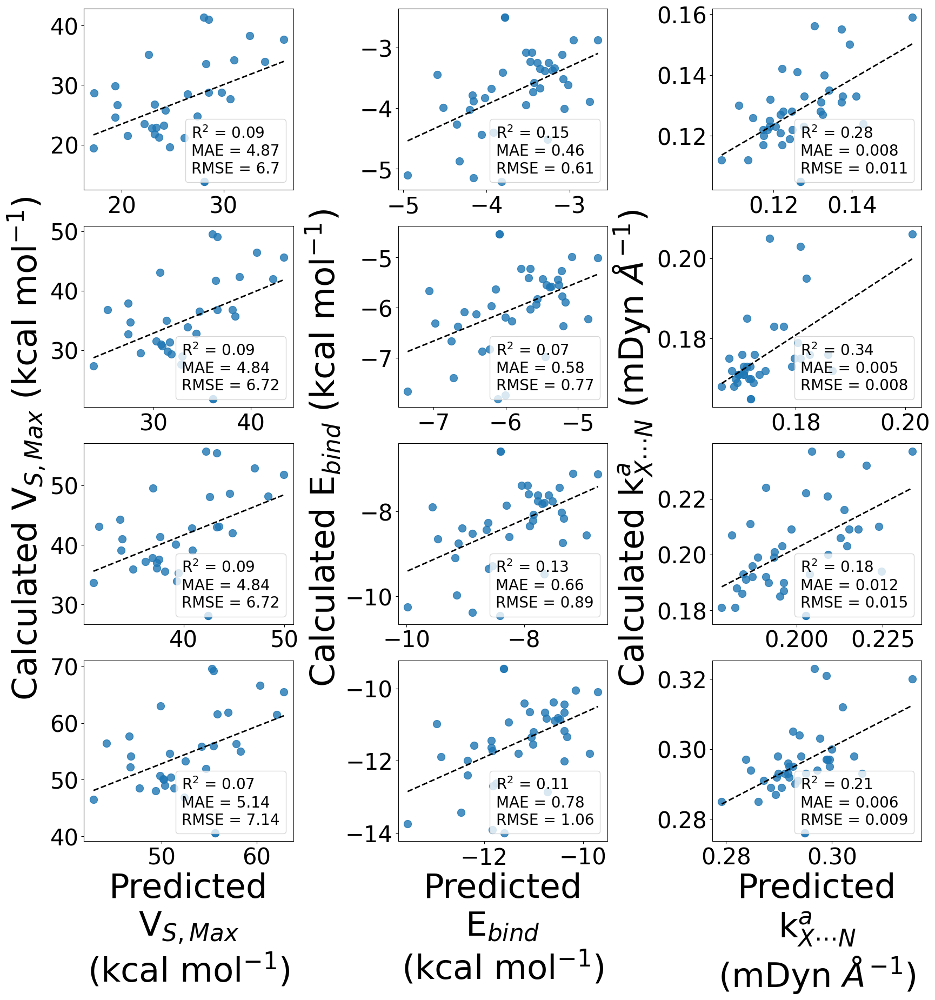

In [196]:
# RegPlot with all BAX -- XGBoost

fig, ax = plt.subplots(ncols=3,nrows=4)

## BACl == row 0
## BABr == row 1
##  BAI == row 2
## BAAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BACl_Vmax_rgplt = sns.regplot(x = BACl_xgb_Vmax_MFP_pred, y = BACl_MFP_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BACl_Ebind_rgplt = sns.regplot(x = BACl_xgb_Ebind_MFP_pred, y = BACl_MFP_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BACl_kXN_rgplt = sns.regplot(x = BACl_xgb_kXN_MFP_pred, y = BACl_MFP_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BACl_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BACl_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BACl_xgb_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BACl_xgb_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BABr_Vmax_rgplt = sns.regplot(x = BABr_xgb_Vmax_MFP_pred, y = BABr_MFP_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BABr_Ebind_rgplt = sns.regplot(x = BABr_xgb_Ebind_MFP_pred, y = BABr_MFP_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BABr_kXN_rgplt = sns.regplot(x = BABr_xgb_kXN_MFP_pred, y = BABr_MFP_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BABr_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BABr_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BABr_xgb_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BABr_xgb_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BAI_Vmax_rgplt = sns.regplot(x = BAI_xgb_Vmax_MFP_pred, y = BAI_MFP_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAI_Ebind_rgplt = sns.regplot(x = BAI_xgb_Ebind_MFP_pred, y = BAI_MFP_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAI_kXN_rgplt = sns.regplot(x = BAI_xgb_kXN_MFP_pred, y = BAI_MFP_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAI_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAI_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAI_xgb_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAI_xgb_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAAt_Vmax_rgplt = sns.regplot(x = BAAt_xgb_Vmax_MFP_pred, y = BAAt_MFP_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAAt_Ebind_rgplt = sns.regplot(x = BAAt_xgb_Ebind_MFP_pred, y = BAAt_MFP_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAAt_kXN_rgplt = sns.regplot(x = BAAt_xgb_kXN_MFP_pred, y = BAAt_MFP_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_xgb_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAAt_xgb_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BACl_BABr_BAI_BAAt_xgb_MFP_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

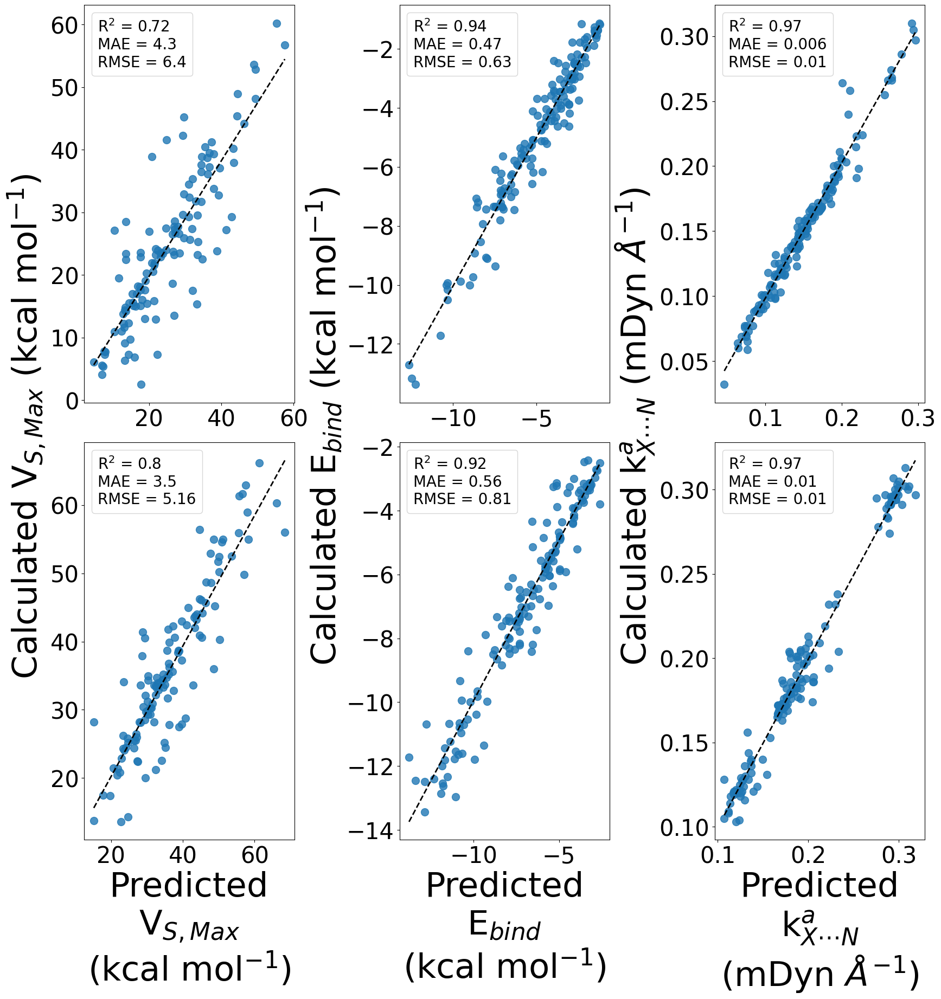

In [197]:
# RegPlot

# Benzene and Ethynyl Benzene

# All Halogen

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=2)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})


## Benzene

### Vmax plot

BX_Vmax_rgplt = sns.regplot(x = BX_xgb_Vmax_MFP_pred, y = BX_MFP_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BX_Ebind_rgplt = sns.regplot(x = BX_xgb_Ebind_MFP_pred, y = BX_MFP_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BX_kXN_rgplt = sns.regplot(x = BX_xgb_kXN_MFP_pred, y = BX_MFP_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_xlabel('')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BX_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BX_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BX_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BX_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BX_xgb_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BX_xgb_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)


## Ethynyl Benzene

## Vmax plot

BAX_Vmax_rgplt = sns.regplot(x = BAX_xgb_Vmax_MFP_pred, y = BAX_MFP_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BAX_Ebind_rgplt = sns.regplot(x = BAX_xgb_Ebind_MFP_pred, y = BAX_MFP_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BAX_kXN_rgplt = sns.regplot(x = BAX_xgb_kXN_MFP_pred, y = BAX_MFP_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('\t\t\t\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('\t\t\t\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('\t\t\t\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAX_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAX_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAX_xgb_MFP_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_xgb_MFP_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### provide spacing

#### width space

fig.subplots_adjust(wspace=0.5)

#### height space

fig.subplots_adjust(hspace=0.1)

### save figure

plt.savefig("Figures/BX_BAX_xgb_MFP_regplot.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

###### Data Based Approach

In [86]:
# XGBoost Regression -- Data Based Approach

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_xgb_Vmax = xgb.XGBRegressor().fit(BACl_Vmax_X_train, BACl_Vmax_Y_train)

### Ebind
BACl_xgb_Ebind = xgb.XGBRegressor().fit(BACl_Ebind_X_train, BACl_Ebind_Y_train)

### kXN
BACl_xgb_kXN = xgb.XGBRegressor().fit(BACl_kXN_X_train, BACl_kXN_Y_train)

## Bromine

### Vmax
BABr_xgb_Vmax = xgb.XGBRegressor().fit(BABr_Vmax_X_train, BABr_Vmax_Y_train)

### Ebind
BABr_xgb_Ebind = xgb.XGBRegressor().fit(BABr_Ebind_X_train, BABr_Ebind_Y_train)

### kXN
BABr_xgb_kXN = xgb.XGBRegressor().fit(BABr_kXN_X_train, BABr_kXN_Y_train)

## Iodine

### Vmax
BAI_xgb_Vmax = xgb.XGBRegressor().fit(BAI_Vmax_X_train, BAI_Vmax_Y_train)

### Ebind
BAI_xgb_Ebind = xgb.XGBRegressor().fit(BAI_Ebind_X_train, BAI_Ebind_Y_train)

### kXN
BAI_xgb_kXN = xgb.XGBRegressor().fit(BAI_kXN_X_train, BAI_kXN_Y_train)

## Astatine

### Vmax
BAAt_xgb_Vmax = xgb.XGBRegressor().fit(BAAt_Vmax_X_train, BAAt_Vmax_Y_train)

### Ebind
BAAt_xgb_Ebind = xgb.XGBRegressor().fit(BAAt_Ebind_X_train, BAAt_Ebind_Y_train)

### kXN
BAAt_xgb_kXN = xgb.XGBRegressor().fit(BAAt_kXN_X_train, BAAt_kXN_Y_train)

## All Halogen

### Vmax
BAX_xgb_Vmax = xgb.XGBRegressor().fit(BAX_Vmax_X_train, BAX_Vmax_Y_train)

### Ebind
BAX_xgb_Ebind = xgb.XGBRegressor().fit(BAX_Ebind_X_train, BAX_Ebind_Y_train)

### kXN
BAX_xgb_kXN = xgb.XGBRegressor().fit(BAX_kXN_X_train, BAX_kXN_Y_train)

In [87]:
# XGBoost Predictions

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_xgb_Vmax_pred = BACl_xgb_Vmax.predict(BACl_Vmax_X_test)

### Ebind

BACl_xgb_Ebind_pred = BACl_xgb_Ebind.predict(BACl_Ebind_X_test)

### kXN

BACl_xgb_kXN_pred = BACl_xgb_kXN.predict(BACl_kXN_X_test)

## Bromine

### Vmax

BABr_xgb_Vmax_pred = BABr_xgb_Vmax.predict(BABr_Vmax_X_test)

### Ebind

BABr_xgb_Ebind_pred = BABr_xgb_Ebind.predict(BABr_Ebind_X_test)

### kXN

BABr_xgb_kXN_pred = BABr_xgb_kXN.predict(BABr_kXN_X_test)

## Iodine

### Vmax

BAI_xgb_Vmax_pred = BAI_xgb_Vmax.predict(BAI_Vmax_X_test)

### Ebind

BAI_xgb_Ebind_pred = BAI_xgb_Ebind.predict(BAI_Ebind_X_test)

### kXN

BAI_xgb_kXN_pred = BAI_xgb_kXN.predict(BAI_kXN_X_test)

## Astatine

### Vmax

BAAt_xgb_Vmax_pred = BAAt_xgb_Vmax.predict(BAAt_Vmax_X_test)

### Ebind

BAAt_xgb_Ebind_pred = BAAt_xgb_Ebind.predict(BAAt_Ebind_X_test)

### kXN

BAAt_xgb_kXN_pred = BAAt_xgb_kXN.predict(BAAt_kXN_X_test)

## All Halogen

### Vmax

BAX_xgb_Vmax_pred = BAX_xgb_Vmax.predict(BAX_Vmax_X_test)

### Ebind

BAX_xgb_Ebind_pred = BAX_xgb_Ebind.predict(BAX_Ebind_X_test)

### kXN

BAX_xgb_kXN_pred = BAX_xgb_kXN.predict(BAX_kXN_X_test)

In [88]:
# Accuracy Measurements -- R^2, MAE, RMSE

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_xgb_Vmax_r2 = r2_score(BACl_Vmax_Y_test, BACl_xgb_Vmax_pred)
BACl_xgb_Vmax_mae = mean_absolute_error(BACl_Vmax_Y_test, BACl_xgb_Vmax_pred)
BACl_xgb_Vmax_rmse = mean_squared_error(BACl_Vmax_Y_test, BACl_xgb_Vmax_pred, squared=False)

### Ebind

BACl_xgb_Ebind_r2 = r2_score(BACl_Ebind_Y_test, BACl_xgb_Ebind_pred)
BACl_xgb_Ebind_mae = mean_absolute_error(BACl_Ebind_Y_test, BACl_xgb_Ebind_pred)
BACl_xgb_Ebind_rmse = mean_squared_error(BACl_Ebind_Y_test, BACl_xgb_Ebind_pred, squared=False)

### kXN

BACl_xgb_kXN_r2 = r2_score(BACl_kXN_Y_test, BACl_xgb_kXN_pred)
BACl_xgb_kXN_mae = mean_absolute_error(BACl_kXN_Y_test, BACl_xgb_kXN_pred)
BACl_xgb_kXN_rmse = mean_squared_error(BACl_kXN_Y_test, BACl_xgb_kXN_pred, squared=False)

## Bromine

### Vmax

BABr_xgb_Vmax_r2 = r2_score(BABr_Vmax_Y_test, BABr_xgb_Vmax_pred)
BABr_xgb_Vmax_mae = mean_absolute_error(BABr_Vmax_Y_test, BABr_xgb_Vmax_pred)
BABr_xgb_Vmax_rmse = mean_squared_error(BABr_Vmax_Y_test, BABr_xgb_Vmax_pred, squared=False)

### Ebind

BABr_xgb_Ebind_r2 = r2_score(BABr_Ebind_Y_test, BABr_xgb_Ebind_pred)
BABr_xgb_Ebind_mae = mean_absolute_error(BABr_Ebind_Y_test, BABr_xgb_Ebind_pred)
BABr_xgb_Ebind_rmse = mean_squared_error(BABr_Ebind_Y_test, BABr_xgb_Ebind_pred, squared=False)

### kXN

BABr_xgb_kXN_r2 = r2_score(BABr_kXN_Y_test, BABr_xgb_kXN_pred)
BABr_xgb_kXN_mae = mean_absolute_error(BABr_kXN_Y_test, BABr_xgb_kXN_pred)
BABr_xgb_kXN_rmse = mean_squared_error(BABr_kXN_Y_test, BABr_xgb_kXN_pred, squared=False)

## Iodine

### Vmax

BAI_xgb_Vmax_r2 = r2_score(BAI_Vmax_Y_test, BAI_xgb_Vmax_pred)
BAI_xgb_Vmax_mae = mean_absolute_error(BAI_Vmax_Y_test, BAI_xgb_Vmax_pred)
BAI_xgb_Vmax_rmse = mean_squared_error(BAI_Vmax_Y_test, BAI_xgb_Vmax_pred, squared=False)

### Ebind

BAI_xgb_Ebind_r2 = r2_score(BAI_Ebind_Y_test, BAI_xgb_Ebind_pred)
BAI_xgb_Ebind_mae = mean_absolute_error(BAI_Ebind_Y_test, BAI_xgb_Ebind_pred)
BAI_xgb_Ebind_rmse = mean_squared_error(BAI_Ebind_Y_test, BAI_xgb_Ebind_pred, squared=False)

### kXN

BAI_xgb_kXN_r2 = r2_score(BAI_kXN_Y_test, BAI_xgb_kXN_pred)
BAI_xgb_kXN_mae = mean_absolute_error(BAI_kXN_Y_test, BAI_xgb_kXN_pred)
BAI_xgb_kXN_rmse = mean_squared_error(BAI_kXN_Y_test, BAI_xgb_kXN_pred, squared=False)

## Astatine

### Vmax

BAAt_xgb_Vmax_r2 = r2_score(BAAt_Vmax_Y_test, BAAt_xgb_Vmax_pred)
BAAt_xgb_Vmax_mae = mean_absolute_error(BAAt_Vmax_Y_test, BAAt_xgb_Vmax_pred)
BAAt_xgb_Vmax_rmse = mean_squared_error(BAAt_Vmax_Y_test, BAAt_xgb_Vmax_pred, squared=False)

### Ebind

BAAt_xgb_Ebind_r2 = r2_score(BAAt_Ebind_Y_test, BAAt_xgb_Ebind_pred)
BAAt_xgb_Ebind_mae = mean_absolute_error(BAAt_Ebind_Y_test, BAAt_xgb_Ebind_pred)
BAAt_xgb_Ebind_rmse = mean_squared_error(BAAt_Ebind_Y_test, BAAt_xgb_Ebind_pred, squared=False)

### kXN

BAAt_xgb_kXN_r2 = r2_score(BAAt_kXN_Y_test, BAAt_xgb_kXN_pred)
BAAt_xgb_kXN_mae = mean_absolute_error(BAAt_kXN_Y_test, BAAt_xgb_kXN_pred)
BAAt_xgb_kXN_rmse = mean_squared_error(BAAt_kXN_Y_test, BAAt_xgb_kXN_pred, squared=False)

## All Halogen

### Vmax

BAX_xgb_Vmax_r2 = r2_score(BAX_Vmax_Y_test, BAX_xgb_Vmax_pred)
BAX_xgb_Vmax_mae = mean_absolute_error(BAX_Vmax_Y_test, BAX_xgb_Vmax_pred)
BAX_xgb_Vmax_rmse = mean_squared_error(BAX_Vmax_Y_test, BAX_xgb_Vmax_pred, squared=False)

### Ebind

BAX_xgb_Ebind_r2 = r2_score(BAX_Ebind_Y_test, BAX_xgb_Ebind_pred)
BAX_xgb_Ebind_mae = mean_absolute_error(BAX_Ebind_Y_test, BAX_xgb_Ebind_pred)
BAX_xgb_Ebind_rmse = mean_squared_error(BAX_Ebind_Y_test, BAX_xgb_Ebind_pred, squared=False)

### kXN

BAX_xgb_kXN_r2 = r2_score(BAX_kXN_Y_test, BAX_xgb_kXN_pred)
BAX_xgb_kXN_mae = mean_absolute_error(BAX_kXN_Y_test, BAX_xgb_kXN_pred)
BAX_xgb_kXN_rmse = mean_squared_error(BAX_kXN_Y_test, BAX_xgb_kXN_pred, squared=False)

Cross Validation

In [89]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# XGBoost method

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_cv_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BACl_Ebind_cv_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BACl_kXN_cv_xgb = xgb.XGBRegressor(random_state=34)

## Bromine

### Vmax

BABr_Vmax_cv_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BABr_Ebind_cv_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BABr_kXN_cv_xgb = xgb.XGBRegressor(random_state=34)

## Iodine

### Vmax

BAI_Vmax_cv_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BAI_Ebind_cv_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BAI_kXN_cv_xgb = xgb.XGBRegressor(random_state=34)

## Astatine

### Vmax

BAAt_Vmax_cv_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BAAt_Ebind_cv_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BAAt_kXN_cv_xgb = xgb.XGBRegressor(random_state=34)

## All Halogen

### Vmax

BAX_Vmax_cv_xgb = xgb.XGBRegressor(random_state=34)

### Ebind

BAX_Ebind_cv_xgb = xgb.XGBRegressor(random_state=34)

### kXN

BAX_kXN_cv_xgb = xgb.XGBRegressor(random_state=34)

In [90]:
# CV -- 5 fold cross validation

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_xgb_cv = cross_validate(BACl_Vmax_cv_xgb, BACl_Vmax_selfeat, BACl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BACl_Ebind_xgb_cv = cross_validate(BACl_Ebind_cv_xgb, BACl_Ebind_selfeat, BACl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BACl_kXN_xgb_cv = cross_validate(BACl_kXN_cv_xgb, BACl_kXN_selfeat, BACl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BABr_Vmax_xgb_cv = cross_validate(BABr_Vmax_cv_xgb, BABr_Vmax_selfeat, BABr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BABr_Ebind_xgb_cv = cross_validate(BABr_Ebind_cv_xgb, BABr_Ebind_selfeat, BABr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BABr_kXN_xgb_cv = cross_validate(BABr_kXN_cv_xgb, BABr_kXN_selfeat, BABr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BAI_Vmax_xgb_cv = cross_validate(BAI_Vmax_cv_xgb, BAI_Vmax_selfeat, BAI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAI_Ebind_xgb_cv = cross_validate(BAI_Ebind_cv_xgb, BAI_Ebind_selfeat, BAI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAI_kXN_xgb_cv = cross_validate(BAI_kXN_cv_xgb, BAI_kXN_selfeat, BAI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAAt_Vmax_xgb_cv = cross_validate(BAAt_Vmax_cv_xgb, BAAt_Vmax_selfeat, BAAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAAt_Ebind_xgb_cv = cross_validate(BAAt_Ebind_cv_xgb, BAAt_Ebind_selfeat, BAAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAAt_kXN_xgb_cv = cross_validate(BAAt_kXN_cv_xgb, BAAt_kXN_selfeat, BAAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BAX_Vmax_xgb_cv = cross_validate(BAX_Vmax_cv_xgb, BAX_Vmax_selfeat, BAX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAX_Ebind_xgb_cv = cross_validate(BAX_Ebind_cv_xgb, BAX_Ebind_selfeat, BAX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAX_kXN_xgb_cv = cross_validate(BAX_kXN_cv_xgb, BAX_kXN_selfeat, BAX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [91]:
# CV Scores

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_xgb_cv_res_lst = [
    round(np.mean(BACl_Vmax_xgb_cv['test_r2']), 2), 
    round(np.mean(-BACl_Vmax_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Vmax_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BACl_Ebind_xgb_cv_res_lst = [
    round(np.mean(BACl_Ebind_xgb_cv['test_r2']), 2), 
    round(np.mean(-BACl_Ebind_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Ebind_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BACl_kXN_xgb_cv_res_lst = [
    round(np.mean(BACl_kXN_xgb_cv['test_r2']), 2), 
    round(np.mean(-BACl_kXN_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BACl_kXN_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BABr_Vmax_xgb_cv_res_lst = [
    round(np.mean(BABr_Vmax_xgb_cv['test_r2']), 2), 
    round(np.mean(-BABr_Vmax_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Vmax_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BABr_Ebind_xgb_cv_res_lst = [
    round(np.mean(BABr_Ebind_xgb_cv['test_r2']), 2), 
    round(np.mean(-BABr_Ebind_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Ebind_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BABr_kXN_xgb_cv_res_lst = [
    round(np.mean(BABr_kXN_xgb_cv['test_r2']), 2), 
    round(np.mean(-BABr_kXN_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BABr_kXN_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BAI_Vmax_xgb_cv_res_lst = [
    round(np.mean(BAI_Vmax_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAI_Vmax_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Vmax_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAI_Ebind_xgb_cv_res_lst = [
    round(np.mean(BAI_Ebind_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAI_Ebind_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Ebind_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAI_kXN_xgb_cv_res_lst = [
    round(np.mean(BAI_kXN_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAI_kXN_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAI_kXN_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAAt_Vmax_xgb_cv_res_lst = [
    round(np.mean(BAAt_Vmax_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Vmax_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Vmax_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAAt_Ebind_xgb_cv_res_lst = [
    round(np.mean(BAAt_Ebind_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Ebind_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Ebind_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAAt_kXN_xgb_cv_res_lst = [
    round(np.mean(BAAt_kXN_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAAt_kXN_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAAt_kXN_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BAX_Vmax_xgb_cv_res_lst = [
    round(np.mean(BAX_Vmax_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAX_Vmax_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Vmax_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAX_Ebind_xgb_cv_res_lst = [
    round(np.mean(BAX_Ebind_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAX_Ebind_xgb_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Ebind_xgb_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAX_kXN_xgb_cv_res_lst = [
    round(np.mean(BAX_kXN_xgb_cv['test_r2']), 2), 
    round(np.mean(-BAX_kXN_xgb_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAX_kXN_xgb_cv['test_neg_root_mean_squared_error']), 3)
]

In [92]:
# Create CV metrics Dataframe

# XGBoost

# Ethynyl Benzene

# constructing dictionary for data

## Vmax

BAX_CV_xgb_Vmax_dict = {'BACl': BACl_Vmax_xgb_cv_res_lst, 'BABr': BABr_Vmax_xgb_cv_res_lst, 
                     'BAI': BAI_Vmax_xgb_cv_res_lst, 'BAAt': BAAt_Vmax_xgb_cv_res_lst, 
                      'BAX': BAX_Vmax_xgb_cv_res_lst}

BAX_CV_xgb_Vmax_df = pd.DataFrame(data = BAX_CV_xgb_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BAX_CV_xgb_Ebind_dict = {'BACl': BACl_Ebind_xgb_cv_res_lst, 'BABr': BABr_Ebind_xgb_cv_res_lst, 
                     'BAI': BAI_Ebind_xgb_cv_res_lst, 'BAAt': BAAt_Ebind_xgb_cv_res_lst, 
                      'BAX': BAX_Ebind_xgb_cv_res_lst}

BAX_CV_xgb_Ebind_df = pd.DataFrame(data = BAX_CV_xgb_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BAX_CV_xgb_kXN_dict = {'BACl': BACl_kXN_xgb_cv_res_lst, 'BABr': BABr_kXN_xgb_cv_res_lst, 
                     'BAI': BAI_kXN_xgb_cv_res_lst, 'BAAt': BAAt_kXN_xgb_cv_res_lst, 
                      'BAX': BAX_kXN_xgb_cv_res_lst}

BAX_CV_xgb_kXN_df = pd.DataFrame(data = BAX_CV_xgb_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BAX_CV_xgb_Vmax_df.to_csv('CV_results/BAX_xgb_cv_Vmax_metric_results.csv')
BAX_CV_xgb_Ebind_df.to_csv('CV_results/BAX_xgb_cv_Ebind_metric_results.csv')
BAX_CV_xgb_kXN_df.to_csv('CV_results/BAX_xgb_cv_kXN_metric_results.csv')

Regplot

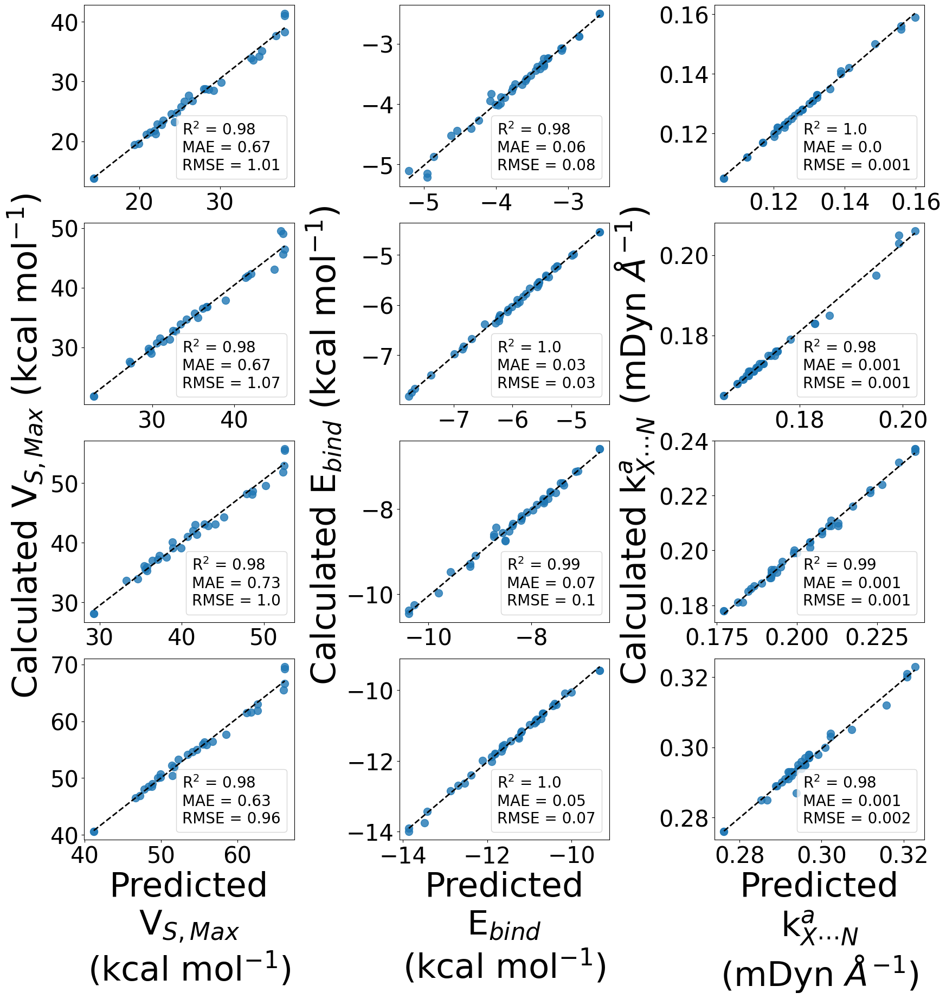

In [205]:
# RegPlot with all BX

fig, ax = plt.subplots(ncols=3,nrows=4)

## BACl == row 0
## BABr == row 1
##  BAI == row 2
## BAAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BACl_Vmax_rgplt = sns.regplot(x = BACl_xgb_Vmax_pred, y = BACl_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BACl_Ebind_rgplt = sns.regplot(x = BACl_xgb_Ebind_pred, y = BACl_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BACl_kXN_rgplt = sns.regplot(x = BACl_xgb_kXN_pred, y = BACl_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_xgb_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BACl_xgb_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_xgb_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_xgb_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BACl_xgb_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_xgb_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_xgb_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BACl_xgb_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BACl_xgb_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BABr_Vmax_rgplt = sns.regplot(x = BABr_xgb_Vmax_pred, y = BABr_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BABr_Ebind_rgplt = sns.regplot(x = BABr_xgb_Ebind_pred, y = BABr_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BABr_kXN_rgplt = sns.regplot(x = BABr_xgb_kXN_pred, y = BABr_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_xgb_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BABr_xgb_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_xgb_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_xgb_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BABr_xgb_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_xgb_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_xgb_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BABr_xgb_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BABr_xgb_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BAI_Vmax_rgplt = sns.regplot(x = BAI_xgb_Vmax_pred, y = BAI_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAI_Ebind_rgplt = sns.regplot(x = BAI_xgb_Ebind_pred, y = BAI_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAI_kXN_rgplt = sns.regplot(x = BAI_xgb_kXN_pred, y = BAI_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_xgb_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAI_xgb_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_xgb_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_xgb_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAI_xgb_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_xgb_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_xgb_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAI_xgb_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAI_xgb_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAAt_Vmax_rgplt = sns.regplot(x = BAAt_xgb_Vmax_pred, y = BAAt_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAAt_Ebind_rgplt = sns.regplot(x = BAAt_xgb_Ebind_pred, y = BAAt_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAAt_kXN_rgplt = sns.regplot(x = BAAt_xgb_kXN_pred, y = BAAt_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_xgb_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_xgb_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_xgb_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_xgb_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_xgb_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_xgb_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_xgb_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_xgb_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAAt_xgb_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BACl_BABr_BAI_BAAt_xgb_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

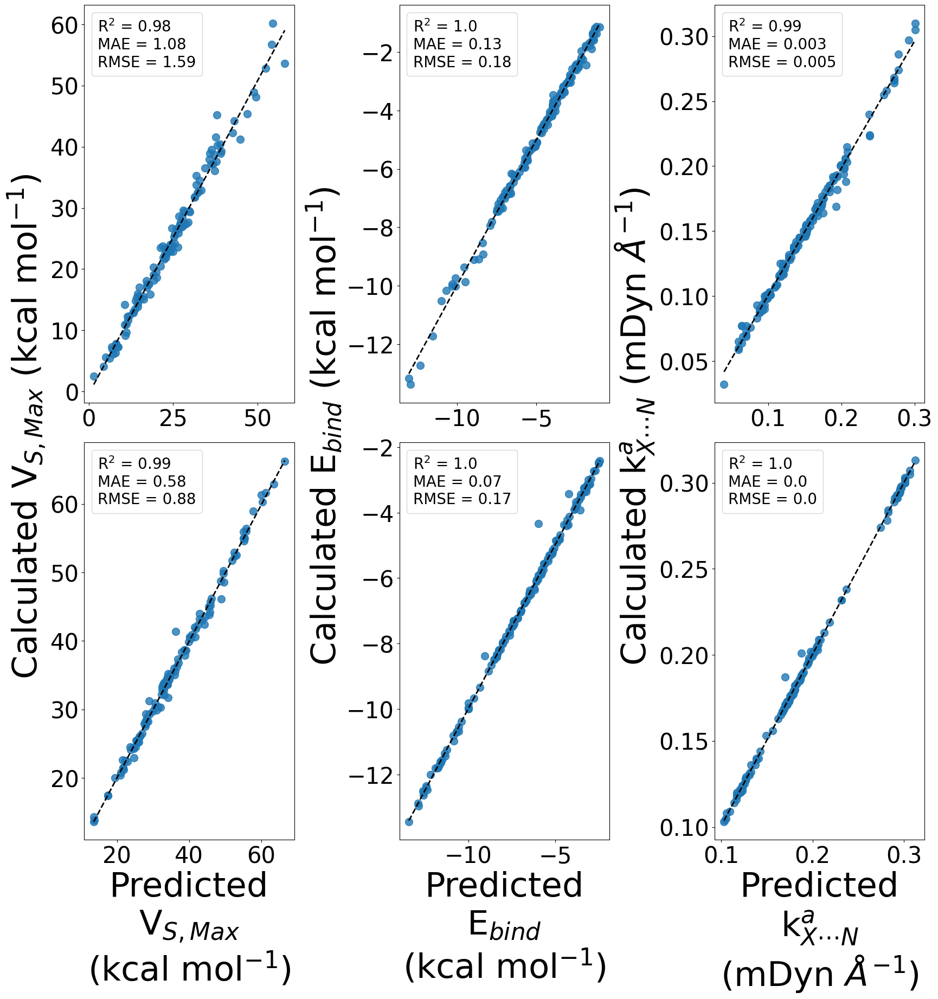

In [207]:
# RegPlot

# Benzene and Ethynyl Benzene

# All Halogen

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=2)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})


## Benzene

### Vmax plot

BX_Vmax_rgplt = sns.regplot(x = BX_xgb_Vmax_pred, y = BX_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BX_Ebind_rgplt = sns.regplot(x = BX_xgb_Ebind_pred, y = BX_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BX_kXN_rgplt = sns.regplot(x = BX_xgb_kXN_pred, y = BX_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_xlabel('')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_xgb_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BX_xgb_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BX_xgb_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_xgb_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BX_xgb_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BX_xgb_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_xgb_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BX_xgb_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BX_xgb_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)


## Ethynyl Benzene

## Vmax plot

BAX_Vmax_rgplt = sns.regplot(x = BAX_xgb_Vmax_pred, y = BAX_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BAX_Ebind_rgplt = sns.regplot(x = BAX_xgb_Ebind_pred, y = BAX_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BAX_kXN_rgplt = sns.regplot(x = BAX_xgb_kXN_pred, y = BAX_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('\t\t\t\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('\t\t\t\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('\t\t\t\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_xgb_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAX_xgb_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_xgb_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_xgb_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAX_xgb_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_xgb_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_xgb_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAX_xgb_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_xgb_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### provide spacing

#### width space

fig.subplots_adjust(wspace=0.5)

#### height space

fig.subplots_adjust(hspace=0.1)

### save figure

plt.savefig("Figures/BX_BAX_xgb_regplot.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

#### Support Vector Machines

In [93]:
from sklearn.svm import NuSVR

##### Benzene

###### Morgan Fingerprints

In [94]:
# Support Vector Machine Regression -- Morgan Finger Prints

# Benzene

## Chlorine

### Vmax
BCl_svm_Vmax_MFP = NuSVR(kernel="linear").fit(BCl_MFP_Vmax_X_train, BCl_MFP_Vmax_Y_train)

### Ebind
BCl_svm_Ebind_MFP = NuSVR(kernel="linear").fit(BCl_MFP_Ebind_X_train, BCl_MFP_Ebind_Y_train)

### kXN
BCl_svm_kXN_MFP = NuSVR(kernel="linear").fit(BCl_MFP_kXN_X_train, BCl_MFP_kXN_Y_train)

## Bromine

### Vmax
BBr_svm_Vmax_MFP = NuSVR(kernel="linear").fit(BBr_MFP_Vmax_X_train, BBr_MFP_Vmax_Y_train)

### Ebind
BBr_svm_Ebind_MFP = NuSVR(kernel="linear").fit(BBr_MFP_Ebind_X_train, BBr_MFP_Ebind_Y_train)

### kXN
BBr_svm_kXN_MFP = NuSVR(kernel="linear").fit(BBr_MFP_kXN_X_train, BBr_MFP_kXN_Y_train)

## Iodine

### Vmax
BI_svm_Vmax_MFP = NuSVR(kernel="linear").fit(BI_MFP_Vmax_X_train, BI_MFP_Vmax_Y_train)

### Ebind
BI_svm_Ebind_MFP = NuSVR(kernel="linear").fit(BI_MFP_Ebind_X_train, BI_MFP_Ebind_Y_train)

### kXN
BI_svm_kXN_MFP = NuSVR(kernel="linear").fit(BI_MFP_kXN_X_train, BI_MFP_kXN_Y_train)

## Astatine

### Vmax
BAt_svm_Vmax_MFP = NuSVR(kernel="linear").fit(BAt_MFP_Vmax_X_train, BAt_MFP_Vmax_Y_train)

### Ebind
BAt_svm_Ebind_MFP = NuSVR(kernel="linear").fit(BAt_MFP_Ebind_X_train, BAt_MFP_Ebind_Y_train)

### kXN
BAt_svm_kXN_MFP = NuSVR(kernel="linear").fit(BAt_MFP_kXN_X_train, BAt_MFP_kXN_Y_train)

## All Halogen

### Vmax
BX_svm_Vmax_MFP = NuSVR(kernel="linear").fit(BX_MFP_Vmax_X_train, BX_MFP_Vmax_Y_train)

### Ebind
BX_svm_Ebind_MFP = NuSVR(kernel="linear").fit(BX_MFP_Ebind_X_train, BX_MFP_Ebind_Y_train)

### kXN
BX_svm_kXN_MFP = NuSVR(kernel="linear").fit(BX_MFP_kXN_X_train, BX_MFP_kXN_Y_train)

## All XB

### Vmax
All_XB_svm_Vmax_MFP = NuSVR(kernel="linear")\
.fit(All_XB_MFP_Vmax_X_train, All_XB_MFP_Vmax_Y_train)

### Ebind
All_XB_svm_Ebind_MFP = NuSVR(kernel="linear")\
.fit(All_XB_MFP_Ebind_X_train, All_XB_MFP_Ebind_Y_train)

### kXN
All_XB_svm_kXN_MFP = NuSVR(kernel="linear")\
.fit(All_XB_MFP_kXN_X_train, All_XB_MFP_kXN_Y_train)

In [95]:
# Predictions

# Benzene

## Chlorine

### Vmax
BCl_svm_Vmax_MFP_pred = BCl_svm_Vmax_MFP.predict(BCl_MFP_Vmax_X_test)

### Ebind
BCl_svm_Ebind_MFP_pred = BCl_svm_Ebind_MFP.predict(BCl_MFP_Ebind_X_test)

### kXN
BCl_svm_kXN_MFP_pred = BCl_svm_kXN_MFP.predict(BCl_MFP_kXN_X_test)

## Bromine

### Vmax
BBr_svm_Vmax_MFP_pred = BBr_svm_Vmax_MFP.predict(BBr_MFP_Vmax_X_test)

### Ebind
BBr_svm_Ebind_MFP_pred = BBr_svm_Ebind_MFP.predict(BBr_MFP_Ebind_X_test)

### kXN
BBr_svm_kXN_MFP_pred = BBr_svm_kXN_MFP.predict(BBr_MFP_kXN_X_test)

## Iodine

### Vmax
BI_svm_Vmax_MFP_pred = BI_svm_Vmax_MFP.predict(BI_MFP_Vmax_X_test)

### Ebind
BI_svm_Ebind_MFP_pred = BI_svm_Ebind_MFP.predict(BI_MFP_Ebind_X_test)

### kXN
BI_svm_kXN_MFP_pred = BI_svm_kXN_MFP.predict(BI_MFP_kXN_X_test)

## Astatine

### Vmax
BAt_svm_Vmax_MFP_pred = BAt_svm_Vmax_MFP.predict(BAt_MFP_Vmax_X_test)

### Ebind
BAt_svm_Ebind_MFP_pred = BAt_svm_Ebind_MFP.predict(BAt_MFP_Ebind_X_test)

### kXN
BAt_svm_kXN_MFP_pred = BAt_svm_kXN_MFP.predict(BAt_MFP_kXN_X_test)

## All Halogen

### Vmax
BX_svm_Vmax_MFP_pred = BX_svm_Vmax_MFP.predict(BX_MFP_Vmax_X_test)

### Ebind
BX_svm_Ebind_MFP_pred = BX_svm_Ebind_MFP.predict(BX_MFP_Ebind_X_test)

### kXN
BX_svm_kXN_MFP_pred = BX_svm_kXN_MFP.predict(BX_MFP_kXN_X_test)

## All XB

### Vmax
All_XB_svm_Vmax_MFP_pred = All_XB_svm_Vmax_MFP.predict(All_XB_MFP_Vmax_X_test)

### Ebind
All_XB_svm_Ebind_MFP_pred = All_XB_svm_Ebind_MFP.predict(All_XB_MFP_Ebind_X_test)

### kXN
All_XB_svm_kXN_MFP_pred = All_XB_svm_kXN_MFP.predict(All_XB_MFP_kXN_X_test)

In [96]:
# Accuracy measurments

# Benzene

## Chlorine

### Vmax
BCl_svm_MFP_Vmax_r2 = r2_score(BCl_MFP_Vmax_Y_test, BCl_svm_Vmax_MFP_pred)
BCl_svm_MFP_Vmax_mae = mean_absolute_error(BCl_MFP_Vmax_Y_test, BCl_svm_Vmax_MFP_pred)
BCl_svm_MFP_Vmax_rmse = mean_squared_error(BCl_MFP_Vmax_Y_test, BCl_svm_Vmax_MFP_pred, squared=False)

### Ebind
BCl_svm_MFP_Ebind_r2 = r2_score(BCl_MFP_Ebind_Y_test, BCl_svm_Ebind_MFP_pred)
BCl_svm_MFP_Ebind_mae = mean_absolute_error(BCl_MFP_Ebind_Y_test, BCl_svm_Ebind_MFP_pred)
BCl_svm_MFP_Ebind_rmse = mean_squared_error(BCl_MFP_Ebind_Y_test, BCl_svm_Ebind_MFP_pred, squared=False)

### kXN
BCl_svm_MFP_kXN_r2 = r2_score(BCl_MFP_kXN_Y_test, BCl_svm_kXN_MFP_pred)
BCl_svm_MFP_kXN_mae = mean_absolute_error(BCl_MFP_kXN_Y_test, BCl_svm_kXN_MFP_pred)
BCl_svm_MFP_kXN_rmse = mean_squared_error(BCl_MFP_kXN_Y_test, BCl_svm_kXN_MFP_pred, squared=False)

## Bromine

### Vmax
BBr_svm_MFP_Vmax_r2 = r2_score(BBr_MFP_Vmax_Y_test, BBr_svm_Vmax_MFP_pred)
BBr_svm_MFP_Vmax_mae = mean_absolute_error(BBr_MFP_Vmax_Y_test, BBr_svm_Vmax_MFP_pred)
BBr_svm_MFP_Vmax_rmse = mean_squared_error(BBr_MFP_Vmax_Y_test, BBr_svm_Vmax_MFP_pred, squared=False)

### Ebind
BBr_svm_MFP_Ebind_r2 = r2_score(BBr_MFP_Ebind_Y_test, BBr_svm_Ebind_MFP_pred)
BBr_svm_MFP_Ebind_mae = mean_absolute_error(BBr_MFP_Ebind_Y_test, BBr_svm_Ebind_MFP_pred)
BBr_svm_MFP_Ebind_rmse = mean_squared_error(BBr_MFP_Ebind_Y_test, BBr_svm_Ebind_MFP_pred, squared=False)

### kXN
BBr_svm_MFP_kXN_r2 = r2_score(BBr_MFP_kXN_Y_test, BBr_svm_kXN_MFP_pred)
BBr_svm_MFP_kXN_mae = mean_absolute_error(BBr_MFP_kXN_Y_test, BBr_svm_kXN_MFP_pred)
BBr_svm_MFP_kXN_rmse = mean_squared_error(BBr_MFP_kXN_Y_test, BBr_svm_kXN_MFP_pred, squared=False)

## Iodine

### Vmax
BI_svm_MFP_Vmax_r2 = r2_score(BI_MFP_Vmax_Y_test, BI_svm_Vmax_MFP_pred)
BI_svm_MFP_Vmax_mae = mean_absolute_error(BI_MFP_Vmax_Y_test, BI_svm_Vmax_MFP_pred)
BI_svm_MFP_Vmax_rmse = mean_squared_error(BI_MFP_Vmax_Y_test, BI_svm_Vmax_MFP_pred, squared=False)

### Ebind
BI_svm_MFP_Ebind_r2 = r2_score(BI_MFP_Ebind_Y_test, BI_svm_Ebind_MFP_pred)
BI_svm_MFP_Ebind_mae = mean_absolute_error(BI_MFP_Ebind_Y_test, BI_svm_Ebind_MFP_pred)
BI_svm_MFP_Ebind_rmse = mean_squared_error(BI_MFP_Ebind_Y_test, BI_svm_Ebind_MFP_pred, squared=False)

### kXN
BI_svm_MFP_kXN_r2 = r2_score(BI_MFP_kXN_Y_test, BI_svm_kXN_MFP_pred)
BI_svm_MFP_kXN_mae = mean_absolute_error(BI_MFP_kXN_Y_test, BI_svm_kXN_MFP_pred)
BI_svm_MFP_kXN_rmse = mean_squared_error(BI_MFP_kXN_Y_test, BI_svm_kXN_MFP_pred, squared=False)

## Astatine

### Vmax
BAt_svm_MFP_Vmax_r2 = r2_score(BAt_MFP_Vmax_Y_test, BAt_svm_Vmax_MFP_pred)
BAt_svm_MFP_Vmax_mae = mean_absolute_error(BAt_MFP_Vmax_Y_test, BAt_svm_Vmax_MFP_pred)
BAt_svm_MFP_Vmax_rmse = mean_squared_error(BAt_MFP_Vmax_Y_test, BAt_svm_Vmax_MFP_pred, squared=False)

### Ebind
BAt_svm_MFP_Ebind_r2 = r2_score(BAt_MFP_Ebind_Y_test, BAt_svm_Ebind_MFP_pred)
BAt_svm_MFP_Ebind_mae = mean_absolute_error(BAt_MFP_Ebind_Y_test, BAt_svm_Ebind_MFP_pred)
BAt_svm_MFP_Ebind_rmse = mean_squared_error(BAt_MFP_Ebind_Y_test, BAt_svm_Ebind_MFP_pred, squared=False)

### kXN
BAt_svm_MFP_kXN_r2 = r2_score(BAt_MFP_kXN_Y_test, BAt_svm_kXN_MFP_pred)
BAt_svm_MFP_kXN_mae = mean_absolute_error(BAt_MFP_kXN_Y_test, BAt_svm_kXN_MFP_pred)
BAt_svm_MFP_kXN_rmse = mean_squared_error(BAt_MFP_kXN_Y_test, BAt_svm_kXN_MFP_pred, squared=False)

## All Halogen

### Vmax
BX_svm_MFP_Vmax_r2 = r2_score(BX_MFP_Vmax_Y_test, BX_svm_Vmax_MFP_pred)
BX_svm_MFP_Vmax_mae = mean_absolute_error(BX_MFP_Vmax_Y_test, BX_svm_Vmax_MFP_pred)
BX_svm_MFP_Vmax_rmse = mean_squared_error(BX_MFP_Vmax_Y_test, BX_svm_Vmax_MFP_pred, squared=False)

### Ebind
BX_svm_MFP_Ebind_r2 = r2_score(BX_MFP_Ebind_Y_test, BX_svm_Ebind_MFP_pred)
BX_svm_MFP_Ebind_mae = mean_absolute_error(BX_MFP_Ebind_Y_test, BX_svm_Ebind_MFP_pred)
BX_svm_MFP_Ebind_rmse = mean_squared_error(BX_MFP_Ebind_Y_test, BX_svm_Ebind_MFP_pred, squared=False)

### kXN
BX_svm_MFP_kXN_r2 = r2_score(BX_MFP_kXN_Y_test, BX_svm_kXN_MFP_pred)
BX_svm_MFP_kXN_mae = mean_absolute_error(BX_MFP_kXN_Y_test, BX_svm_kXN_MFP_pred)
BX_svm_MFP_kXN_rmse = mean_squared_error(BX_MFP_kXN_Y_test, BX_svm_kXN_MFP_pred, squared=False)

## All XB

### Vmax
All_XB_svm_MFP_Vmax_r2 = r2_score(All_XB_MFP_Vmax_Y_test, All_XB_svm_Vmax_MFP_pred)
All_XB_svm_MFP_Vmax_mae = mean_absolute_error(All_XB_MFP_Vmax_Y_test, All_XB_svm_Vmax_MFP_pred)
All_XB_svm_MFP_Vmax_rmse = mean_squared_error(All_XB_MFP_Vmax_Y_test, All_XB_svm_Vmax_MFP_pred, squared=False)

### Ebind
All_XB_svm_MFP_Ebind_r2 = r2_score(All_XB_MFP_Ebind_Y_test, All_XB_svm_Ebind_MFP_pred)
All_XB_svm_MFP_Ebind_mae = mean_absolute_error(All_XB_MFP_Ebind_Y_test, All_XB_svm_Ebind_MFP_pred)
All_XB_svm_MFP_Ebind_rmse = mean_squared_error(All_XB_MFP_Ebind_Y_test, All_XB_svm_Ebind_MFP_pred, squared=False)

### kXN
All_XB_svm_MFP_kXN_r2 = r2_score(All_XB_MFP_kXN_Y_test, All_XB_svm_kXN_MFP_pred)
All_XB_svm_MFP_kXN_mae = mean_absolute_error(All_XB_MFP_kXN_Y_test, All_XB_svm_kXN_MFP_pred)
All_XB_svm_MFP_kXN_rmse = mean_squared_error(All_XB_MFP_kXN_Y_test, All_XB_svm_kXN_MFP_pred, squared=False)

Cross Validation

In [97]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# RF method

# Benzene

## Chlorine

### Vmax

BCl_Vmax_MFP_svm = NuSVR(kernel="linear")

### Ebind

BCl_Ebind_MFP_svm = NuSVR(kernel="linear")

### kXN

BCl_kXN_MFP_svm = NuSVR(kernel="linear")

## Bromine

### Vmax

BBr_Vmax_MFP_svm = NuSVR(kernel="linear")

### Ebind

BBr_Ebind_MFP_svm = NuSVR(kernel="linear")

### kXN

BBr_kXN_MFP_svm = NuSVR(kernel="linear")

## Iodine

### Vmax

BI_Vmax_MFP_svm = NuSVR(kernel="linear")

### Ebind

BI_Ebind_MFP_svm = NuSVR(kernel="linear")

### kXN

BI_kXN_MFP_svm = NuSVR(kernel="linear")

## Astatine

### Vmax

BAt_Vmax_MFP_svm = NuSVR(kernel="linear")

### Ebind

BAt_Ebind_MFP_svm = NuSVR(kernel="linear")

### kXN

BAt_kXN_MFP_svm = NuSVR(kernel="linear")

## All Halogen

### Vmax

BX_Vmax_MFP_svm = NuSVR(kernel="linear")

### Ebind

BX_Ebind_MFP_svm = NuSVR(kernel="linear")

### kXN

BX_kXN_MFP_svm = NuSVR(kernel="linear")

In [98]:
# Cross validation

# Benzene

## Chlorine

### Vmax

BCl_Vmax_MFP_svm_cv = cross_validate(BCl_Vmax_MFP_svm, BCl_MRG_df, BCl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BCl_Ebind_MFP_svm_cv = cross_validate(BCl_Ebind_MFP_svm, BCl_MRG_df, BCl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BCl_kXN_MFP_svm_cv = cross_validate(BCl_kXN_MFP_svm, BCl_MRG_df, BCl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BBr_Vmax_MFP_svm_cv = cross_validate(BBr_Vmax_MFP_svm, BBr_MRG_df, BBr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BBr_Ebind_MFP_svm_cv = cross_validate(BBr_Ebind_MFP_svm, BBr_MRG_df, BBr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BBr_kXN_MFP_svm_cv = cross_validate(BBr_kXN_MFP_svm, BBr_MRG_df, BBr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BI_Vmax_MFP_svm_cv = cross_validate(BI_Vmax_MFP_svm, BI_MRG_df, BI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BI_Ebind_MFP_svm_cv = cross_validate(BI_Ebind_MFP_svm, BI_MRG_df, BI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BI_kXN_MFP_svm_cv = cross_validate(BI_kXN_MFP_svm, BI_MRG_df, BI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAt_Vmax_MFP_svm_cv = cross_validate(BAt_Vmax_MFP_svm, BAt_MRG_df, BAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAt_Ebind_MFP_svm_cv = cross_validate(BAt_Ebind_MFP_svm, BAt_MRG_df, BAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAt_kXN_MFP_svm_cv = cross_validate(BAt_kXN_MFP_svm, BAt_MRG_df, BAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BX_Vmax_MFP_svm_cv = cross_validate(BX_Vmax_MFP_svm, BX_MRG_df, BX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BX_Ebind_MFP_svm_cv = cross_validate(BX_Ebind_MFP_svm, BX_MRG_df, BX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BX_kXN_MFP_svm_cv = cross_validate(BX_kXN_MFP_svm, BX_MRG_df, BX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [99]:
# CV Scores

# Benzene

## Chlorine

### Vmax

BCl_Vmax_MFP_svm_cv_res_lst = [
    round(np.mean(BCl_Vmax_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BCl_Vmax_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Vmax_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BCl_Ebind_MFP_svm_cv_res_lst = [
    round(np.mean(BCl_Ebind_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BCl_Ebind_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Ebind_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BCl_kXN_MFP_svm_cv_res_lst = [
    round(np.mean(BCl_kXN_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BCl_kXN_MFP_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BCl_kXN_MFP_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BBr_Vmax_MFP_svm_cv_res_lst = [
    round(np.mean(BBr_Vmax_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BBr_Vmax_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Vmax_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BBr_Ebind_MFP_svm_cv_res_lst = [
    round(np.mean(BBr_Ebind_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BBr_Ebind_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Ebind_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BBr_kXN_MFP_svm_cv_res_lst = [
    round(np.mean(BBr_kXN_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BBr_kXN_MFP_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BBr_kXN_MFP_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BI_Vmax_MFP_svm_cv_res_lst = [
    round(np.mean(BI_Vmax_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BI_Vmax_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Vmax_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BI_Ebind_MFP_svm_cv_res_lst = [
    round(np.mean(BI_Ebind_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BI_Ebind_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Ebind_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BI_kXN_MFP_svm_cv_res_lst = [
    round(np.mean(BI_kXN_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BI_kXN_MFP_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BI_kXN_MFP_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAt_Vmax_MFP_svm_cv_res_lst = [
    round(np.mean(BAt_Vmax_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAt_Vmax_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Vmax_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAt_Ebind_MFP_svm_cv_res_lst = [
    round(np.mean(BAt_Ebind_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAt_Ebind_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Ebind_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAt_kXN_MFP_svm_cv_res_lst = [
    round(np.mean(BAt_kXN_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAt_kXN_MFP_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAt_kXN_MFP_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BX_Vmax_MFP_svm_cv_res_lst = [
    round(np.mean(BX_Vmax_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BX_Vmax_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Vmax_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BX_Ebind_MFP_svm_cv_res_lst = [
    round(np.mean(BX_Ebind_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BX_Ebind_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Ebind_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BX_kXN_MFP_svm_cv_res_lst = [
    round(np.mean(BX_kXN_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BX_kXN_MFP_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BX_kXN_MFP_svm_cv['test_neg_root_mean_squared_error']), 3)
]

In [100]:
# Create CV metrics Dataframe

# SVM

# Benzene

# constructing dictionary for data

## Vmax

BX_CV_svm_MFP_Vmax_dict = {'BCl': BCl_Vmax_MFP_svm_cv_res_lst, 'BBr': BBr_Vmax_MFP_svm_cv_res_lst, 
                     'BI': BI_Vmax_MFP_svm_cv_res_lst, 'BAt': BAt_Vmax_MFP_svm_cv_res_lst, 
                      'BX': BX_Vmax_MFP_svm_cv_res_lst}

BX_CV_svm_MFP_Vmax_df = pd.DataFrame(data = BX_CV_svm_MFP_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BX_CV_svm_MFP_Ebind_dict = {'BCl': BCl_Ebind_MFP_svm_cv_res_lst, 'BBr': BBr_Ebind_MFP_svm_cv_res_lst, 
                     'BI': BI_Ebind_MFP_svm_cv_res_lst, 'BAt': BAt_Ebind_MFP_svm_cv_res_lst, 
                      'BX': BX_Ebind_MFP_svm_cv_res_lst}

BX_CV_svm_MFP_Ebind_df = pd.DataFrame(data = BX_CV_svm_MFP_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BX_CV_svm_MFP_kXN_dict = {'BCl': BCl_kXN_MFP_svm_cv_res_lst, 'BBr': BBr_kXN_MFP_svm_cv_res_lst, 
                     'BI': BI_kXN_MFP_svm_cv_res_lst, 'BAt': BAt_kXN_MFP_svm_cv_res_lst, 
                      'BX': BX_kXN_MFP_svm_cv_res_lst}

BX_CV_svm_MFP_kXN_df = pd.DataFrame(data = BX_CV_svm_MFP_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BX_CV_svm_MFP_Vmax_df.to_csv('CV_results/BX_svm_cv_Vmax_MFP_metric_results.csv')
BX_CV_svm_MFP_Ebind_df.to_csv('CV_results/BX_svm_cv_Ebind_MFP_metric_results.csv')
BX_CV_svm_MFP_kXN_df.to_csv('CV_results/BX_svm_cv_kXN_MFP_metric_results.csv')

Regplot

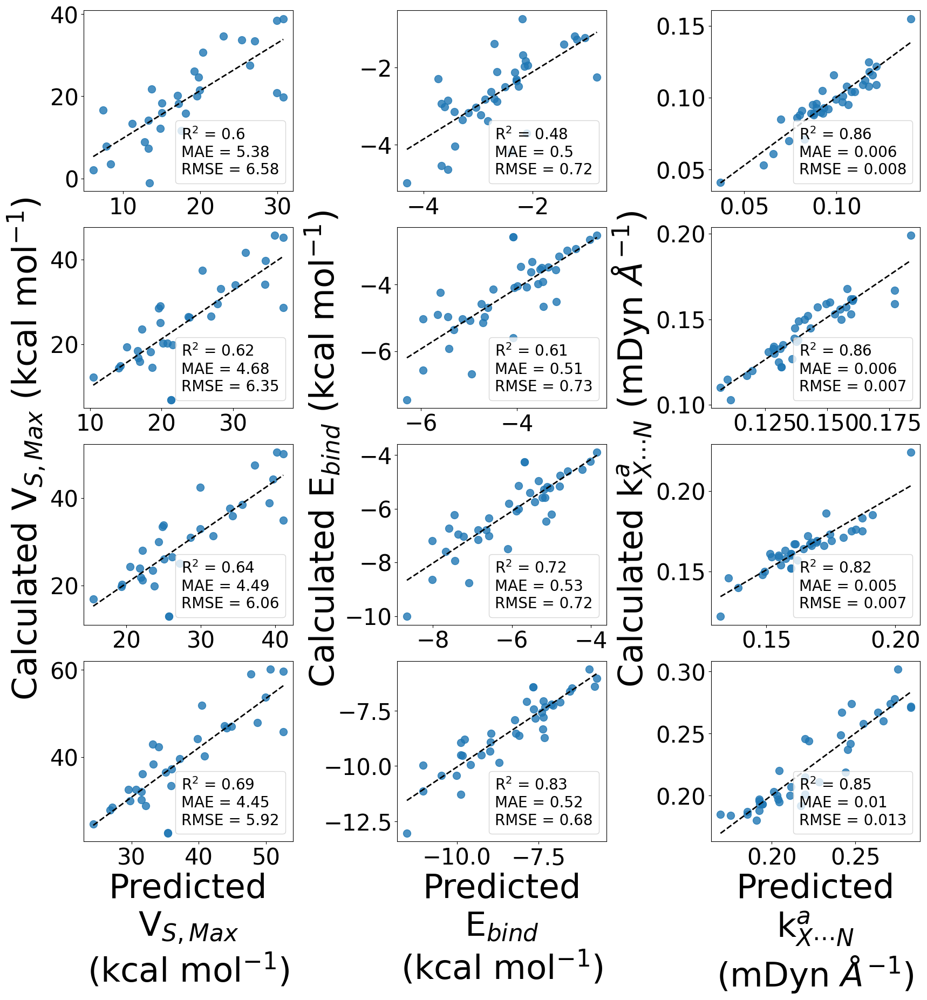

In [216]:
# RegPlot with all BX

fig, ax = plt.subplots(ncols=3,nrows=4)

## BCl == row 0
## BBr == row 1
##  BI == row 2
## BAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BCl_Vmax_rgplt = sns.regplot(x = BCl_svm_Vmax_MFP_pred, y = BCl_MFP_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BCl_Ebind_rgplt = sns.regplot(x = BCl_svm_Ebind_MFP_pred, y = BCl_MFP_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BCl_kXN_rgplt = sns.regplot(x = BCl_svm_kXN_MFP_pred, y = BCl_MFP_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BCl_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BCl_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BCl_svm_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BCl_svm_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BBr_Vmax_rgplt = sns.regplot(x = BBr_svm_Vmax_MFP_pred, y = BBr_MFP_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BBr_Ebind_rgplt = sns.regplot(x = BBr_svm_Ebind_MFP_pred, y = BBr_MFP_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BBr_kXN_rgplt = sns.regplot(x = BBr_svm_kXN_MFP_pred, y = BBr_MFP_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BBr_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BBr_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BBr_svm_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BBr_svm_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BI_Vmax_rgplt = sns.regplot(x = BI_svm_Vmax_MFP_pred, y = BI_MFP_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BI_Ebind_rgplt = sns.regplot(x = BI_svm_Ebind_MFP_pred, y = BI_MFP_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BI_kXN_rgplt = sns.regplot(x = BI_svm_kXN_MFP_pred, y = BI_MFP_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BI_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BI_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BI_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BI_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BI_svm_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BI_svm_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAt_Vmax_rgplt = sns.regplot(x = BAt_svm_Vmax_MFP_pred, y = BAt_MFP_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAt_Ebind_rgplt = sns.regplot(x = BAt_svm_Ebind_MFP_pred, y = BAt_MFP_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAt_kXN_rgplt = sns.regplot(x = BAt_svm_kXN_MFP_pred, y = BAt_MFP_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAt_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAt_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAt_svm_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAt_svm_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BCl_BBr_BI_BAt_svm_MFP_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

###### Data Dased Approach

In [101]:
# Support Vector Machines -- Data Based Approach

# Benzene

## Chlorine

### Vmax
BCl_svm_Vmax = NuSVR(kernel="linear").fit(BCl_Vmax_X_train, BCl_Vmax_Y_train)

### Ebind
BCl_svm_Ebind = NuSVR(kernel="linear").fit(BCl_Ebind_X_train, BCl_Ebind_Y_train)

### kXN
BCl_svm_kXN = NuSVR(kernel="linear").fit(BCl_kXN_X_train, BCl_kXN_Y_train)

## Bromine

### Vmax
BBr_svm_Vmax = NuSVR(kernel="linear").fit(BBr_Vmax_X_train, BBr_Vmax_Y_train)

### Ebind
BBr_svm_Ebind = NuSVR(kernel="linear").fit(BBr_Ebind_X_train, BBr_Ebind_Y_train)

### kXN
BBr_svm_kXN = NuSVR(kernel="linear").fit(BBr_kXN_X_train, BBr_kXN_Y_train)

## Iodine

### Vmax
BI_svm_Vmax = NuSVR(kernel="linear").fit(BI_Vmax_X_train, BI_Vmax_Y_train)

### Ebind
BI_svm_Ebind = NuSVR(kernel="linear").fit(BI_Ebind_X_train, BI_Ebind_Y_train)

### kXN
BI_svm_kXN = NuSVR(kernel="linear").fit(BI_kXN_X_train, BI_kXN_Y_train)

## Astatine

### Vmax
BAt_svm_Vmax = NuSVR(kernel="linear").fit(BAt_Vmax_X_train, BAt_Vmax_Y_train)

### Ebind
BAt_svm_Ebind = NuSVR(kernel="linear").fit(BAt_Ebind_X_train, BAt_Ebind_Y_train)

### kXN
BAt_svm_kXN = NuSVR(kernel="linear").fit(BAt_kXN_X_train, BAt_kXN_Y_train)

## All Halogen

### Vmax
BX_svm_Vmax = NuSVR(kernel="linear").fit(BX_Vmax_X_train, BX_Vmax_Y_train)

### Ebind
BX_svm_Ebind = NuSVR(kernel="linear").fit(BX_Ebind_X_train, BX_Ebind_Y_train)

### kXN
BX_svm_kXN = NuSVR(kernel="linear").fit(BX_kXN_X_train, BX_kXN_Y_train)

In [102]:
# SVM Predictions

# Benzene

## Chlorine

### Vmax

BCl_svm_Vmax_pred = BCl_svm_Vmax.predict(BCl_Vmax_X_test)

### Ebind

BCl_svm_Ebind_pred = BCl_svm_Ebind.predict(BCl_Ebind_X_test)

### kXN

BCl_svm_kXN_pred = BCl_svm_kXN.predict(BCl_kXN_X_test)

## Bromine

### Vmax

BBr_svm_Vmax_pred = BBr_svm_Vmax.predict(BBr_Vmax_X_test)

### Ebind

BBr_svm_Ebind_pred = BBr_svm_Ebind.predict(BBr_Ebind_X_test)

### kXN

BBr_svm_kXN_pred = BBr_svm_kXN.predict(BBr_kXN_X_test)

## Iodine

### Vmax

BI_svm_Vmax_pred = BI_svm_Vmax.predict(BI_Vmax_X_test)

### Ebind

BI_svm_Ebind_pred = BI_svm_Ebind.predict(BI_Ebind_X_test)

### kXN

BI_svm_kXN_pred = BI_svm_kXN.predict(BI_kXN_X_test)

## Astatine

### Vmax

BAt_svm_Vmax_pred = BAt_svm_Vmax.predict(BAt_Vmax_X_test)

### Ebind

BAt_svm_Ebind_pred = BAt_svm_Ebind.predict(BAt_Ebind_X_test)

### kXN

BAt_svm_kXN_pred = BAt_svm_kXN.predict(BAt_kXN_X_test)

## All Halogen

### Vmax

BX_svm_Vmax_pred = BX_svm_Vmax.predict(BX_Vmax_X_test)

### Ebind

BX_svm_Ebind_pred = BX_svm_Ebind.predict(BX_Ebind_X_test)

### kXN

BX_svm_kXN_pred = BX_svm_kXN.predict(BX_kXN_X_test)

In [103]:
# Accuracy Measurements -- R^2, MAE, RMSE

# Benzene

## Chlorine

### Vmax

BCl_svm_Vmax_r2 = r2_score(BCl_Vmax_Y_test, BCl_svm_Vmax_pred)
BCl_svm_Vmax_mae = mean_absolute_error(BCl_Vmax_Y_test, BCl_svm_Vmax_pred)
BCl_svm_Vmax_rmse = mean_squared_error(BCl_Vmax_Y_test, BCl_svm_Vmax_pred, squared=False)

### Ebind

BCl_svm_Ebind_r2 = r2_score(BCl_Ebind_Y_test, BCl_svm_Ebind_pred)
BCl_svm_Ebind_mae = mean_absolute_error(BCl_Ebind_Y_test, BCl_svm_Ebind_pred)
BCl_svm_Ebind_rmse = mean_squared_error(BCl_Ebind_Y_test, BCl_svm_Ebind_pred, squared=False)

### kXN

BCl_svm_kXN_r2 = r2_score(BCl_kXN_Y_test, BCl_svm_kXN_pred)
BCl_svm_kXN_mae = mean_absolute_error(BCl_kXN_Y_test, BCl_svm_kXN_pred)
BCl_svm_kXN_rmse = mean_squared_error(BCl_kXN_Y_test, BCl_svm_kXN_pred, squared=False)

## Bromine

### Vmax

BBr_svm_Vmax_r2 = r2_score(BBr_Vmax_Y_test, BBr_svm_Vmax_pred)
BBr_svm_Vmax_mae = mean_absolute_error(BBr_Vmax_Y_test, BBr_svm_Vmax_pred)
BBr_svm_Vmax_rmse = mean_squared_error(BBr_Vmax_Y_test, BBr_svm_Vmax_pred, squared=False)

### Ebind

BBr_svm_Ebind_r2 = r2_score(BBr_Ebind_Y_test, BBr_svm_Ebind_pred)
BBr_svm_Ebind_mae = mean_absolute_error(BBr_Ebind_Y_test, BBr_svm_Ebind_pred)
BBr_svm_Ebind_rmse = mean_squared_error(BBr_Ebind_Y_test, BBr_svm_Ebind_pred, squared=False)

### kXN

BBr_svm_kXN_r2 = r2_score(BBr_kXN_Y_test, BBr_svm_kXN_pred)
BBr_svm_kXN_mae = mean_absolute_error(BBr_kXN_Y_test, BBr_svm_kXN_pred)
BBr_svm_kXN_rmse = mean_squared_error(BBr_kXN_Y_test, BBr_svm_kXN_pred, squared=False)

## Iodine

### Vmax

BI_svm_Vmax_r2 = r2_score(BI_Vmax_Y_test, BI_svm_Vmax_pred)
BI_svm_Vmax_mae = mean_absolute_error(BI_Vmax_Y_test, BI_svm_Vmax_pred)
BI_svm_Vmax_rmse = mean_squared_error(BI_Vmax_Y_test, BI_svm_Vmax_pred, squared=False)

### Ebind

BI_svm_Ebind_r2 = r2_score(BI_Ebind_Y_test, BI_svm_Ebind_pred)
BI_svm_Ebind_mae = mean_absolute_error(BI_Ebind_Y_test, BI_svm_Ebind_pred)
BI_svm_Ebind_rmse = mean_squared_error(BI_Ebind_Y_test, BI_svm_Ebind_pred, squared=False)

### kXN

BI_svm_kXN_r2 = r2_score(BI_kXN_Y_test, BI_svm_kXN_pred)
BI_svm_kXN_mae = mean_absolute_error(BI_kXN_Y_test, BI_svm_kXN_pred)
BI_svm_kXN_rmse = mean_squared_error(BI_kXN_Y_test, BI_svm_kXN_pred, squared=False)

## Astatine

### Vmax

BAt_svm_Vmax_r2 = r2_score(BAt_Vmax_Y_test, BAt_svm_Vmax_pred)
BAt_svm_Vmax_mae = mean_absolute_error(BAt_Vmax_Y_test, BAt_svm_Vmax_pred)
BAt_svm_Vmax_rmse = mean_squared_error(BAt_Vmax_Y_test, BAt_svm_Vmax_pred, squared=False)

### Ebind

BAt_svm_Ebind_r2 = r2_score(BAt_Ebind_Y_test, BAt_svm_Ebind_pred)
BAt_svm_Ebind_mae = mean_absolute_error(BAt_Ebind_Y_test, BAt_svm_Ebind_pred)
BAt_svm_Ebind_rmse = mean_squared_error(BAt_Ebind_Y_test, BAt_svm_Ebind_pred, squared=False)

### kXN

BAt_svm_kXN_r2 = r2_score(BAt_kXN_Y_test, BAt_svm_kXN_pred)
BAt_svm_kXN_mae = mean_absolute_error(BAt_kXN_Y_test, BAt_svm_kXN_pred)
BAt_svm_kXN_rmse = mean_squared_error(BAt_kXN_Y_test, BAt_svm_kXN_pred, squared=False)

## All Halogen

### Vmax

BX_svm_Vmax_r2 = r2_score(BX_Vmax_Y_test, BX_svm_Vmax_pred)
BX_svm_Vmax_mae = mean_absolute_error(BX_Vmax_Y_test, BX_svm_Vmax_pred)
BX_svm_Vmax_rmse = mean_squared_error(BX_Vmax_Y_test, BX_svm_Vmax_pred, squared=False)

### Ebind

BX_svm_Ebind_r2 = r2_score(BX_Ebind_Y_test, BX_svm_Ebind_pred)
BX_svm_Ebind_mae = mean_absolute_error(BX_Ebind_Y_test, BX_svm_Ebind_pred)
BX_svm_Ebind_rmse = mean_squared_error(BX_Ebind_Y_test, BX_svm_Ebind_pred, squared=False)

### kXN

BX_svm_kXN_r2 = r2_score(BX_kXN_Y_test, BX_svm_kXN_pred)
BX_svm_kXN_mae = mean_absolute_error(BX_kXN_Y_test, BX_svm_kXN_pred)
BX_svm_kXN_rmse = mean_squared_error(BX_kXN_Y_test, BX_svm_kXN_pred, squared=False)

Cross Validation

In [104]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# RF method

# Benzene

## Chlorine

### Vmax

BCl_Vmax_cv_svm = NuSVR(kernel="linear")

### Ebind

BCl_Ebind_cv_svm = NuSVR(kernel="linear")

### kXN

BCl_kXN_cv_svm = NuSVR(kernel="linear")

## Bromine

### Vmax

BBr_Vmax_cv_svm = NuSVR(kernel="linear")

### Ebind

BBr_Ebind_cv_svm = NuSVR(kernel="linear")

### kXN

BBr_kXN_cv_svm = NuSVR(kernel="linear")

## Iodine

### Vmax

BI_Vmax_cv_svm = NuSVR(kernel="linear")

### Ebind

BI_Ebind_cv_svm = NuSVR(kernel="linear")

### kXN

BI_kXN_cv_svm = NuSVR(kernel="linear")

## Astatine

### Vmax

BAt_Vmax_cv_svm = NuSVR(kernel="linear")

### Ebind

BAt_Ebind_cv_svm = NuSVR(kernel="linear")

### kXN

BAt_kXN_cv_svm = NuSVR(kernel="linear")

## All Halogen

### Vmax

BX_Vmax_cv_svm = NuSVR(kernel="linear")

### Ebind

BX_Ebind_cv_svm = NuSVR(kernel="linear")

### kXN

BX_kXN_cv_svm = NuSVR(kernel="linear")

In [105]:
# CV -- 5 fold cross validation

# Benzene

## Chlorine

### Vmax

BCl_Vmax_svm_cv = cross_validate(BCl_Vmax_cv_svm, BCl_Vmax_selfeat, BCl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BCl_Ebind_svm_cv = cross_validate(BCl_Ebind_cv_svm, BCl_Ebind_selfeat, BCl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BCl_kXN_svm_cv = cross_validate(BCl_kXN_cv_svm, BCl_kXN_selfeat, BCl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BBr_Vmax_svm_cv = cross_validate(BBr_Vmax_cv_svm, BBr_Vmax_selfeat, BBr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BBr_Ebind_svm_cv = cross_validate(BBr_Ebind_cv_svm, BBr_Ebind_selfeat, BBr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BBr_kXN_svm_cv = cross_validate(BBr_kXN_cv_svm, BBr_kXN_selfeat, BBr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BI_Vmax_svm_cv = cross_validate(BI_Vmax_cv_svm, BI_Vmax_selfeat, BI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BI_Ebind_svm_cv = cross_validate(BI_Ebind_cv_svm, BI_Ebind_selfeat, BI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BI_kXN_svm_cv = cross_validate(BI_kXN_cv_svm, BI_kXN_selfeat, BI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAt_Vmax_svm_cv = cross_validate(BAt_Vmax_cv_svm, BAt_Vmax_selfeat, BAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAt_Ebind_svm_cv = cross_validate(BAt_Ebind_cv_svm, BAt_Ebind_selfeat, BAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAt_kXN_svm_cv = cross_validate(BAt_kXN_cv_svm, BAt_kXN_selfeat, BAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BX_Vmax_svm_cv = cross_validate(BX_Vmax_cv_svm, BX_Vmax_selfeat, BX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BX_Ebind_svm_cv = cross_validate(BX_Ebind_cv_svm, BX_Ebind_selfeat, BX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BX_kXN_svm_cv = cross_validate(BX_kXN_cv_svm, BX_kXN_selfeat, BX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [106]:
# CV Scores

# Benzene

## Chlorine

### Vmax

BCl_Vmax_svm_cv_res_lst = [
    round(np.mean(BCl_Vmax_svm_cv['test_r2']), 2), 
    round(np.mean(-BCl_Vmax_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Vmax_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BCl_Ebind_svm_cv_res_lst = [
    round(np.mean(BCl_Ebind_svm_cv['test_r2']), 2), 
    round(np.mean(-BCl_Ebind_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BCl_Ebind_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BCl_kXN_svm_cv_res_lst = [
    round(np.mean(BCl_kXN_svm_cv['test_r2']), 2), 
    round(np.mean(-BCl_kXN_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BCl_kXN_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BBr_Vmax_svm_cv_res_lst = [
    round(np.mean(BBr_Vmax_svm_cv['test_r2']), 2), 
    round(np.mean(-BBr_Vmax_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Vmax_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BBr_Ebind_svm_cv_res_lst = [
    round(np.mean(BBr_Ebind_svm_cv['test_r2']), 2), 
    round(np.mean(-BBr_Ebind_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BBr_Ebind_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BBr_kXN_svm_cv_res_lst = [
    round(np.mean(BBr_kXN_svm_cv['test_r2']), 2), 
    round(np.mean(-BBr_kXN_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BBr_kXN_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BI_Vmax_svm_cv_res_lst = [
    round(np.mean(BI_Vmax_svm_cv['test_r2']), 2), 
    round(np.mean(-BI_Vmax_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Vmax_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BI_Ebind_svm_cv_res_lst = [
    round(np.mean(BI_Ebind_svm_cv['test_r2']), 2), 
    round(np.mean(-BI_Ebind_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BI_Ebind_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BI_kXN_svm_cv_res_lst = [
    round(np.mean(BI_kXN_svm_cv['test_r2']), 2), 
    round(np.mean(-BI_kXN_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BI_kXN_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAt_Vmax_svm_cv_res_lst = [
    round(np.mean(BAt_Vmax_svm_cv['test_r2']), 2), 
    round(np.mean(-BAt_Vmax_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Vmax_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAt_Ebind_svm_cv_res_lst = [
    round(np.mean(BAt_Ebind_svm_cv['test_r2']), 2), 
    round(np.mean(-BAt_Ebind_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAt_Ebind_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAt_kXN_svm_cv_res_lst = [
    round(np.mean(BAt_kXN_svm_cv['test_r2']), 2), 
    round(np.mean(-BAt_kXN_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAt_kXN_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BX_Vmax_svm_cv_res_lst = [
    round(np.mean(BX_Vmax_svm_cv['test_r2']), 2), 
    round(np.mean(-BX_Vmax_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Vmax_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BX_Ebind_svm_cv_res_lst = [
    round(np.mean(BX_Ebind_svm_cv['test_r2']), 2), 
    round(np.mean(-BX_Ebind_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BX_Ebind_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BX_kXN_svm_cv_res_lst = [
    round(np.mean(BX_kXN_svm_cv['test_r2']), 2), 
    round(np.mean(-BX_kXN_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BX_kXN_svm_cv['test_neg_root_mean_squared_error']), 3)
]

In [107]:
# Create CV metrics Dataframe

# SVM

# Benzene

# constructing dictionary for data

## Vmax

BX_CV_svm_Vmax_dict = {'BCl': BCl_Vmax_svm_cv_res_lst, 'BBr': BBr_Vmax_svm_cv_res_lst, 
                     'BI': BI_Vmax_svm_cv_res_lst, 'BAt': BAt_Vmax_svm_cv_res_lst, 
                      'BX': BX_Vmax_svm_cv_res_lst}

BX_CV_svm_Vmax_df = pd.DataFrame(data = BX_CV_svm_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BX_CV_svm_Ebind_dict = {'BCl': BCl_Ebind_svm_cv_res_lst, 'BBr': BBr_Ebind_svm_cv_res_lst, 
                     'BI': BI_Ebind_svm_cv_res_lst, 'BAt': BAt_Ebind_svm_cv_res_lst, 
                      'BX': BX_Ebind_svm_cv_res_lst}

BX_CV_svm_Ebind_df = pd.DataFrame(data = BX_CV_svm_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BX_CV_svm_kXN_dict = {'BCl': BCl_kXN_svm_cv_res_lst, 'BBr': BBr_kXN_svm_cv_res_lst, 
                     'BI': BI_kXN_svm_cv_res_lst, 'BAt': BAt_kXN_svm_cv_res_lst, 
                      'BX': BX_kXN_svm_cv_res_lst}

BX_CV_svm_kXN_df = pd.DataFrame(data = BX_CV_svm_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BX_CV_svm_Vmax_df.to_csv('CV_results/BX_svm_cv_Vmax_metric_results.csv')
BX_CV_svm_Ebind_df.to_csv('CV_results/BX_svm_cv_Ebind_metric_results.csv')
BX_CV_svm_kXN_df.to_csv('CV_results/BX_svm_cv_kXN_metric_results.csv')

Regplot

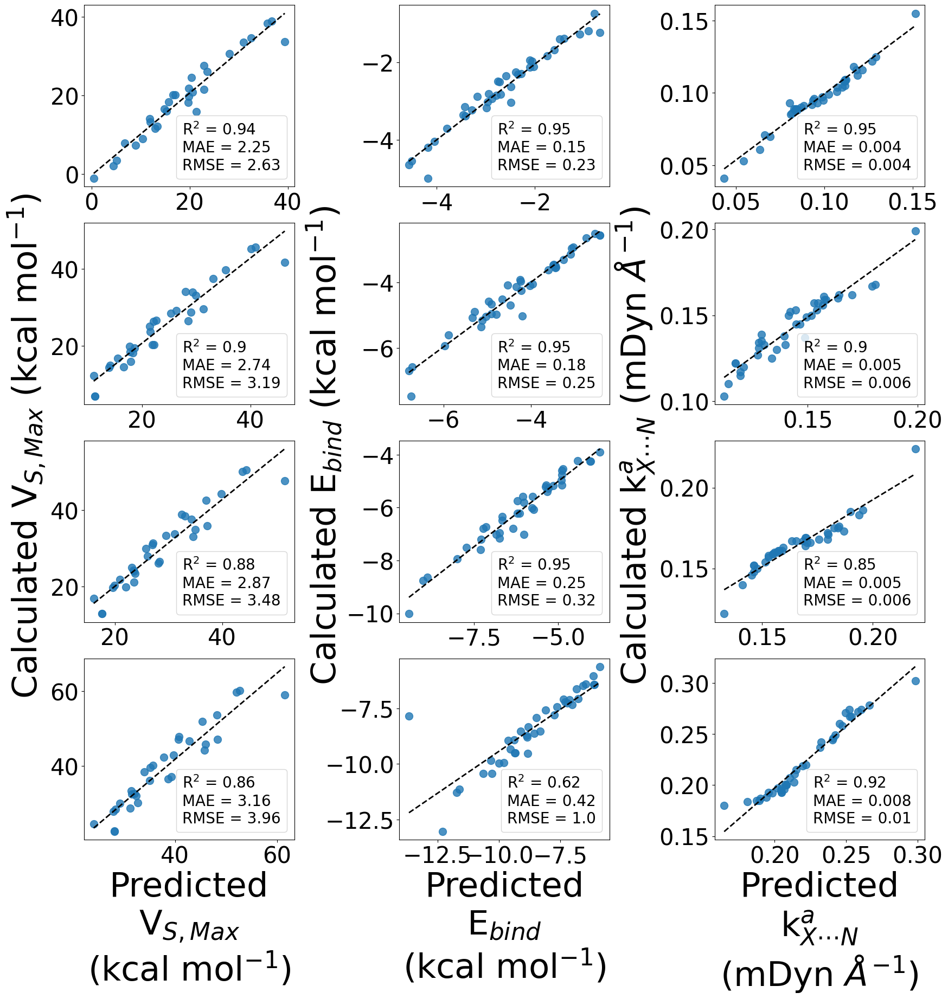

In [224]:
# RegPlot with all BX

fig, ax = plt.subplots(ncols=3,nrows=4)

## BCl == row 0
## BBr == row 1
##  BI == row 2
## BAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BCl_Vmax_rgplt = sns.regplot(x = BCl_svm_Vmax_pred, y = BCl_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BCl_Ebind_rgplt = sns.regplot(x = BCl_svm_Ebind_pred, y = BCl_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BCl_kXN_rgplt = sns.regplot(x = BCl_svm_kXN_pred, y = BCl_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_svm_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BCl_svm_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_svm_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_svm_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BCl_svm_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BCl_svm_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BCl_svm_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BCl_svm_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BCl_svm_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BBr_Vmax_rgplt = sns.regplot(x = BBr_svm_Vmax_pred, y = BBr_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BBr_Ebind_rgplt = sns.regplot(x = BBr_svm_Ebind_pred, y = BBr_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BBr_kXN_rgplt = sns.regplot(x = BBr_svm_kXN_pred, y = BBr_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_svm_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BBr_svm_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_svm_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_svm_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BBr_svm_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BBr_svm_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BBr_svm_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BBr_svm_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BBr_svm_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BI_Vmax_rgplt = sns.regplot(x = BI_svm_Vmax_pred, y = BI_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BI_Ebind_rgplt = sns.regplot(x = BI_svm_Ebind_pred, y = BI_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BI_kXN_rgplt = sns.regplot(x = BI_svm_kXN_pred, y = BI_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_svm_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BI_svm_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BI_svm_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_svm_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BI_svm_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BI_svm_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BI_svm_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BI_svm_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BI_svm_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAt_Vmax_rgplt = sns.regplot(x = BAt_svm_Vmax_pred, y = BAt_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAt_Ebind_rgplt = sns.regplot(x = BAt_svm_Ebind_pred, y = BAt_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAt_kXN_rgplt = sns.regplot(x = BAt_svm_kXN_pred, y = BAt_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_svm_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAt_svm_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_svm_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_svm_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAt_svm_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAt_svm_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAt_svm_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAt_svm_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAt_svm_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BCl_BBr_BI_BAt_svm_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

##### Ethynyl Benzene

###### Morgan Fingerprints

In [108]:
# Support Vector Machine Regression -- Morgan Finger Prints

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_svm_Vmax_MFP = NuSVR(kernel="linear").fit(BACl_MFP_Vmax_X_train, BACl_MFP_Vmax_Y_train)

### Ebind
BACl_svm_Ebind_MFP = NuSVR(kernel="linear").fit(BACl_MFP_Ebind_X_train, BACl_MFP_Ebind_Y_train)

### kXN
BACl_svm_kXN_MFP = NuSVR(kernel="linear").fit(BACl_MFP_kXN_X_train, BACl_MFP_kXN_Y_train)

## Bromine

### Vmax
BABr_svm_Vmax_MFP = NuSVR(kernel="linear").fit(BABr_MFP_Vmax_X_train, BABr_MFP_Vmax_Y_train)

### Ebind
BABr_svm_Ebind_MFP = NuSVR(kernel="linear").fit(BABr_MFP_Ebind_X_train, BABr_MFP_Ebind_Y_train)

### kXN
BABr_svm_kXN_MFP = NuSVR(kernel="linear").fit(BABr_MFP_kXN_X_train, BABr_MFP_kXN_Y_train)

## Iodine

### Vmax
BAI_svm_Vmax_MFP = NuSVR(kernel="linear").fit(BAI_MFP_Vmax_X_train, BAI_MFP_Vmax_Y_train)

### Ebind
BAI_svm_Ebind_MFP = NuSVR(kernel="linear").fit(BAI_MFP_Ebind_X_train, BAI_MFP_Ebind_Y_train)

### kXN
BAI_svm_kXN_MFP = NuSVR(kernel="linear").fit(BAI_MFP_kXN_X_train, BAI_MFP_kXN_Y_train)

## Astatine

### Vmax
BAAt_svm_Vmax_MFP = NuSVR(kernel="linear").fit(BAAt_MFP_Vmax_X_train, BAAt_MFP_Vmax_Y_train)

### Ebind
BAAt_svm_Ebind_MFP = NuSVR(kernel="linear").fit(BAAt_MFP_Ebind_X_train, BAAt_MFP_Ebind_Y_train)

### kXN
BAAt_svm_kXN_MFP = NuSVR(kernel="linear").fit(BAAt_MFP_kXN_X_train, BAAt_MFP_kXN_Y_train)

## All Halogen

### Vmax
BAX_svm_Vmax_MFP = NuSVR(kernel="linear").fit(BAX_MFP_Vmax_X_train, BAX_MFP_Vmax_Y_train)

### Ebind
BAX_svm_Ebind_MFP = NuSVR(kernel="linear").fit(BAX_MFP_Ebind_X_train, BAX_MFP_Ebind_Y_train)

### kXN
BAX_svm_kXN_MFP = NuSVR(kernel="linear").fit(BAX_MFP_kXN_X_train, BAX_MFP_kXN_Y_train)

In [109]:
# Predictions

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_svm_Vmax_MFP_pred = BACl_svm_Vmax_MFP.predict(BACl_MFP_Vmax_X_test)

### Ebind
BACl_svm_Ebind_MFP_pred = BACl_svm_Ebind_MFP.predict(BACl_MFP_Ebind_X_test)

### kXN
BACl_svm_kXN_MFP_pred = BACl_svm_kXN_MFP.predict(BACl_MFP_kXN_X_test)

## Bromine

### Vmax
BABr_svm_Vmax_MFP_pred = BABr_svm_Vmax_MFP.predict(BABr_MFP_Vmax_X_test)

### Ebind
BABr_svm_Ebind_MFP_pred = BABr_svm_Ebind_MFP.predict(BABr_MFP_Ebind_X_test)

### kXN
BABr_svm_kXN_MFP_pred = BABr_svm_kXN_MFP.predict(BABr_MFP_kXN_X_test)

## Iodine

### Vmax
BAI_svm_Vmax_MFP_pred = BAI_svm_Vmax_MFP.predict(BAI_MFP_Vmax_X_test)

### Ebind
BAI_svm_Ebind_MFP_pred = BAI_svm_Ebind_MFP.predict(BAI_MFP_Ebind_X_test)

### kXN
BAI_svm_kXN_MFP_pred = BAI_svm_kXN_MFP.predict(BAI_MFP_kXN_X_test)

## Astatine

### Vmax
BAAt_svm_Vmax_MFP_pred = BAAt_svm_Vmax_MFP.predict(BAAt_MFP_Vmax_X_test)

### Ebind
BAAt_svm_Ebind_MFP_pred = BAAt_svm_Ebind_MFP.predict(BAAt_MFP_Ebind_X_test)

### kXN
BAAt_svm_kXN_MFP_pred = BAAt_svm_kXN_MFP.predict(BAAt_MFP_kXN_X_test)

## All Halogen

### Vmax
BAX_svm_Vmax_MFP_pred = BAX_svm_Vmax_MFP.predict(BAX_MFP_Vmax_X_test)

### Ebind
BAX_svm_Ebind_MFP_pred = BAX_svm_Ebind_MFP.predict(BAX_MFP_Ebind_X_test)

### kXN
BAX_svm_kXN_MFP_pred = BAX_svm_kXN_MFP.predict(BAX_MFP_kXN_X_test)

In [110]:
# Accuracy measurements

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_svm_MFP_Vmax_r2 = r2_score(BACl_MFP_Vmax_Y_test, BACl_svm_Vmax_MFP_pred)
BACl_svm_MFP_Vmax_mae = mean_absolute_error(BACl_MFP_Vmax_Y_test, BACl_svm_Vmax_MFP_pred)
BACl_svm_MFP_Vmax_rmse = mean_squared_error(BACl_MFP_Vmax_Y_test, BACl_svm_Vmax_MFP_pred, squared=False)

### Ebind
BACl_svm_MFP_Ebind_r2 = r2_score(BACl_MFP_Ebind_Y_test, BACl_svm_Ebind_MFP_pred)
BACl_svm_MFP_Ebind_mae = mean_absolute_error(BACl_MFP_Ebind_Y_test, BACl_svm_Ebind_MFP_pred)
BACl_svm_MFP_Ebind_rmse = mean_squared_error(BACl_MFP_Ebind_Y_test, BACl_svm_Ebind_MFP_pred, squared=False)

### kXN
BACl_svm_MFP_kXN_r2 = r2_score(BACl_MFP_kXN_Y_test, BACl_svm_kXN_MFP_pred)
BACl_svm_MFP_kXN_mae = mean_absolute_error(BACl_MFP_kXN_Y_test, BACl_svm_kXN_MFP_pred)
BACl_svm_MFP_kXN_rmse = mean_squared_error(BACl_MFP_kXN_Y_test, BACl_svm_kXN_MFP_pred, squared=False)

## Bromine

### Vmax
BABr_svm_MFP_Vmax_r2 = r2_score(BABr_MFP_Vmax_Y_test, BABr_svm_Vmax_MFP_pred)
BABr_svm_MFP_Vmax_mae = mean_absolute_error(BABr_MFP_Vmax_Y_test, BABr_svm_Vmax_MFP_pred)
BABr_svm_MFP_Vmax_rmse = mean_squared_error(BABr_MFP_Vmax_Y_test, BABr_svm_Vmax_MFP_pred, squared=False)

### Ebind
BABr_svm_MFP_Ebind_r2 = r2_score(BABr_MFP_Ebind_Y_test, BABr_svm_Ebind_MFP_pred)
BABr_svm_MFP_Ebind_mae = mean_absolute_error(BABr_MFP_Ebind_Y_test, BABr_svm_Ebind_MFP_pred)
BABr_svm_MFP_Ebind_rmse = mean_squared_error(BABr_MFP_Ebind_Y_test, BABr_svm_Ebind_MFP_pred, squared=False)

### kXN
BABr_svm_MFP_kXN_r2 = r2_score(BABr_MFP_kXN_Y_test, BABr_svm_kXN_MFP_pred)
BABr_svm_MFP_kXN_mae = mean_absolute_error(BABr_MFP_kXN_Y_test, BABr_svm_kXN_MFP_pred)
BABr_svm_MFP_kXN_rmse = mean_squared_error(BABr_MFP_kXN_Y_test, BABr_svm_kXN_MFP_pred, squared=False)

## Iodine

### Vmax
BAI_svm_MFP_Vmax_r2 = r2_score(BAI_MFP_Vmax_Y_test, BAI_svm_Vmax_MFP_pred)
BAI_svm_MFP_Vmax_mae = mean_absolute_error(BAI_MFP_Vmax_Y_test, BAI_svm_Vmax_MFP_pred)
BAI_svm_MFP_Vmax_rmse = mean_squared_error(BAI_MFP_Vmax_Y_test, BAI_svm_Vmax_MFP_pred, squared=False)

### Ebind
BAI_svm_MFP_Ebind_r2 = r2_score(BAI_MFP_Ebind_Y_test, BAI_svm_Ebind_MFP_pred)
BAI_svm_MFP_Ebind_mae = mean_absolute_error(BAI_MFP_Ebind_Y_test, BAI_svm_Ebind_MFP_pred)
BAI_svm_MFP_Ebind_rmse = mean_squared_error(BAI_MFP_Ebind_Y_test, BAI_svm_Ebind_MFP_pred, squared=False)

### kXN
BAI_svm_MFP_kXN_r2 = r2_score(BAI_MFP_kXN_Y_test, BAI_svm_kXN_MFP_pred)
BAI_svm_MFP_kXN_mae = mean_absolute_error(BAI_MFP_kXN_Y_test, BAI_svm_kXN_MFP_pred)
BAI_svm_MFP_kXN_rmse = mean_squared_error(BAI_MFP_kXN_Y_test, BAI_svm_kXN_MFP_pred, squared=False)

## Astatine

### Vmax
BAAt_svm_MFP_Vmax_r2 = r2_score(BAAt_MFP_Vmax_Y_test, BAAt_svm_Vmax_MFP_pred)
BAAt_svm_MFP_Vmax_mae = mean_absolute_error(BAAt_MFP_Vmax_Y_test, BAAt_svm_Vmax_MFP_pred)
BAAt_svm_MFP_Vmax_rmse = mean_squared_error(BAAt_MFP_Vmax_Y_test, BAAt_svm_Vmax_MFP_pred, squared=False)

### Ebind
BAAt_svm_MFP_Ebind_r2 = r2_score(BAAt_MFP_Ebind_Y_test, BAAt_svm_Ebind_MFP_pred)
BAAt_svm_MFP_Ebind_mae = mean_absolute_error(BAAt_MFP_Ebind_Y_test, BAAt_svm_Ebind_MFP_pred)
BAAt_svm_MFP_Ebind_rmse = mean_squared_error(BAAt_MFP_Ebind_Y_test, BAAt_svm_Ebind_MFP_pred, squared=False)

### kXN
BAAt_svm_MFP_kXN_r2 = r2_score(BAAt_MFP_kXN_Y_test, BAAt_svm_kXN_MFP_pred)
BAAt_svm_MFP_kXN_mae = mean_absolute_error(BAAt_MFP_kXN_Y_test, BAAt_svm_kXN_MFP_pred)
BAAt_svm_MFP_kXN_rmse = mean_squared_error(BAAt_MFP_kXN_Y_test, BAAt_svm_kXN_MFP_pred, squared=False)

## All Halogen

### Vmax
BAX_svm_MFP_Vmax_r2 = r2_score(BAX_MFP_Vmax_Y_test, BAX_svm_Vmax_MFP_pred)
BAX_svm_MFP_Vmax_mae = mean_absolute_error(BAX_MFP_Vmax_Y_test, BAX_svm_Vmax_MFP_pred)
BAX_svm_MFP_Vmax_rmse = mean_squared_error(BAX_MFP_Vmax_Y_test, BAX_svm_Vmax_MFP_pred, squared=False)

### Ebind
BAX_svm_MFP_Ebind_r2 = r2_score(BAX_MFP_Ebind_Y_test, BAX_svm_Ebind_MFP_pred)
BAX_svm_MFP_Ebind_mae = mean_absolute_error(BAX_MFP_Ebind_Y_test, BAX_svm_Ebind_MFP_pred)
BAX_svm_MFP_Ebind_rmse = mean_squared_error(BAX_MFP_Ebind_Y_test, BAX_svm_Ebind_MFP_pred, squared=False)

### kXN
BAX_svm_MFP_kXN_r2 = r2_score(BAX_MFP_kXN_Y_test, BAX_svm_kXN_MFP_pred)
BAX_svm_MFP_kXN_mae = mean_absolute_error(BAX_MFP_kXN_Y_test, BAX_svm_kXN_MFP_pred)
BAX_svm_MFP_kXN_rmse = mean_squared_error(BAX_MFP_kXN_Y_test, BAX_svm_kXN_MFP_pred, squared=False)

Cross Validation

In [111]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# SVM method

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_MFP_svm = NuSVR(kernel="linear")

### Ebind

BACl_Ebind_MFP_svm = NuSVR(kernel="linear")

### kXN

BACl_kXN_MFP_svm = NuSVR(kernel="linear")

## Bromine

### Vmax

BABr_Vmax_MFP_svm = NuSVR(kernel="linear")

### Ebind

BABr_Ebind_MFP_svm = NuSVR(kernel="linear")

### kXN

BABr_kXN_MFP_svm = NuSVR(kernel="linear")

## Iodine

### Vmax

BAI_Vmax_MFP_svm = NuSVR(kernel="linear")

### Ebind

BAI_Ebind_MFP_svm = NuSVR(kernel="linear")

### kXN

BAI_kXN_MFP_svm = NuSVR(kernel="linear")

## Astatine

### Vmax

BAAt_Vmax_MFP_svm = NuSVR(kernel="linear")

### Ebind

BAAt_Ebind_MFP_svm = NuSVR(kernel="linear")

### kXN

BAAt_kXN_MFP_svm = NuSVR(kernel="linear")

## All Halogen

### Vmax

BAX_Vmax_MFP_svm = NuSVR(kernel="linear")

### Ebind

BAX_Ebind_MFP_svm = NuSVR(kernel="linear")

### kXN

BAX_kXN_MFP_svm = NuSVR(kernel="linear")

In [112]:
# Cross validation

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_MFP_svm_cv = cross_validate(BACl_Vmax_MFP_svm, BACl_MRG_df, BACl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BACl_Ebind_MFP_svm_cv = cross_validate(BACl_Ebind_MFP_svm, BACl_MRG_df, BACl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BACl_kXN_MFP_svm_cv = cross_validate(BACl_kXN_MFP_svm, BACl_MRG_df, BACl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BABr_Vmax_MFP_svm_cv = cross_validate(BABr_Vmax_MFP_svm, BABr_MRG_df, BABr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BABr_Ebind_MFP_svm_cv = cross_validate(BABr_Ebind_MFP_svm, BABr_MRG_df, BABr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BABr_kXN_MFP_svm_cv = cross_validate(BABr_kXN_MFP_svm, BABr_MRG_df, BABr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BAI_Vmax_MFP_svm_cv = cross_validate(BAI_Vmax_MFP_svm, BAI_MRG_df, BAI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAI_Ebind_MFP_svm_cv = cross_validate(BAI_Ebind_MFP_svm, BAI_MRG_df, BAI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAI_kXN_MFP_svm_cv = cross_validate(BAI_kXN_MFP_svm, BAI_MRG_df, BAI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAAt_Vmax_MFP_svm_cv = cross_validate(BAAt_Vmax_MFP_svm, BAAt_MRG_df, BAAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAAt_Ebind_MFP_svm_cv = cross_validate(BAAt_Ebind_MFP_svm, BAAt_MRG_df, BAAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAAt_kXN_MFP_svm_cv = cross_validate(BAAt_kXN_MFP_svm, BAAt_MRG_df, BAAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BAX_Vmax_MFP_svm_cv = cross_validate(BAX_Vmax_MFP_svm, BAX_MRG_df, BAX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAX_Ebind_MFP_svm_cv = cross_validate(BAX_Ebind_MFP_svm, BAX_MRG_df, BAX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAX_kXN_MFP_svm_cv = cross_validate(BAX_kXN_MFP_svm, BAX_MRG_df, BAX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [113]:
# CV Scores

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_MFP_svm_cv_res_lst = [
    round(np.mean(BACl_Vmax_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BACl_Vmax_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Vmax_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BACl_Ebind_MFP_svm_cv_res_lst = [
    round(np.mean(BACl_Ebind_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BACl_Ebind_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Ebind_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BACl_kXN_MFP_svm_cv_res_lst = [
    round(np.mean(BACl_kXN_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BACl_kXN_MFP_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BACl_kXN_MFP_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BABr_Vmax_MFP_svm_cv_res_lst = [
    round(np.mean(BABr_Vmax_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BABr_Vmax_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Vmax_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BABr_Ebind_MFP_svm_cv_res_lst = [
    round(np.mean(BABr_Ebind_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BABr_Ebind_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Ebind_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BABr_kXN_MFP_svm_cv_res_lst = [
    round(np.mean(BABr_kXN_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BABr_kXN_MFP_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BABr_kXN_MFP_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BAI_Vmax_MFP_svm_cv_res_lst = [
    round(np.mean(BAI_Vmax_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAI_Vmax_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Vmax_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAI_Ebind_MFP_svm_cv_res_lst = [
    round(np.mean(BAI_Ebind_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAI_Ebind_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Ebind_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAI_kXN_MFP_svm_cv_res_lst = [
    round(np.mean(BAI_kXN_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAI_kXN_MFP_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAI_kXN_MFP_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAAt_Vmax_MFP_svm_cv_res_lst = [
    round(np.mean(BAAt_Vmax_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Vmax_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Vmax_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAAt_Ebind_MFP_svm_cv_res_lst = [
    round(np.mean(BAAt_Ebind_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Ebind_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Ebind_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAAt_kXN_MFP_svm_cv_res_lst = [
    round(np.mean(BAAt_kXN_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAAt_kXN_MFP_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAAt_kXN_MFP_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BAX_Vmax_MFP_svm_cv_res_lst = [
    round(np.mean(BAX_Vmax_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAX_Vmax_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Vmax_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAX_Ebind_MFP_svm_cv_res_lst = [
    round(np.mean(BAX_Ebind_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAX_Ebind_MFP_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Ebind_MFP_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAX_kXN_MFP_svm_cv_res_lst = [
    round(np.mean(BAX_kXN_MFP_svm_cv['test_r2']), 2), 
    round(np.mean(-BAX_kXN_MFP_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAX_kXN_MFP_svm_cv['test_neg_root_mean_squared_error']), 3)
]

In [114]:
# Create CV metrics Dataframe

# SVM

# Ethynyl Benzene

# constructing dictionary for data

## Vmax

BAX_CV_svm_MFP_Vmax_dict = {'BACl': BACl_Vmax_MFP_svm_cv_res_lst, 'BABr': BABr_Vmax_MFP_svm_cv_res_lst, 
                     'BAI': BAI_Vmax_MFP_svm_cv_res_lst, 'BAAt': BAAt_Vmax_MFP_svm_cv_res_lst, 
                      'BAX': BAX_Vmax_MFP_svm_cv_res_lst}

BAX_CV_svm_MFP_Vmax_df = pd.DataFrame(data = BAX_CV_svm_MFP_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BAX_CV_svm_MFP_Ebind_dict = {'BACl': BACl_Ebind_MFP_svm_cv_res_lst, 'BABr': BABr_Ebind_MFP_svm_cv_res_lst, 
                     'BAI': BAI_Ebind_MFP_svm_cv_res_lst, 'BAAt': BAAt_Ebind_MFP_svm_cv_res_lst, 
                      'BAX': BAX_Ebind_MFP_svm_cv_res_lst}

BAX_CV_svm_MFP_Ebind_df = pd.DataFrame(data = BAX_CV_svm_MFP_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BAX_CV_svm_MFP_kXN_dict = {'BACl': BACl_kXN_MFP_svm_cv_res_lst, 'BABr': BABr_kXN_MFP_svm_cv_res_lst, 
                     'BAI': BAI_kXN_MFP_svm_cv_res_lst, 'BAAt': BAAt_kXN_MFP_svm_cv_res_lst, 
                      'BAX': BAX_kXN_MFP_svm_cv_res_lst}

BAX_CV_svm_MFP_kXN_df = pd.DataFrame(data = BAX_CV_svm_MFP_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BAX_CV_svm_MFP_Vmax_df.to_csv('CV_results/BAX_svm_cv_Vmax_MFP_metric_results.csv')
BAX_CV_svm_MFP_Ebind_df.to_csv('CV_results/BAX_svm_cv_Ebind_MFP_metric_results.csv')
BAX_CV_svm_MFP_kXN_df.to_csv('CV_results/BAX_svm_cv_kXN_MFP_metric_results.csv')

Regplot

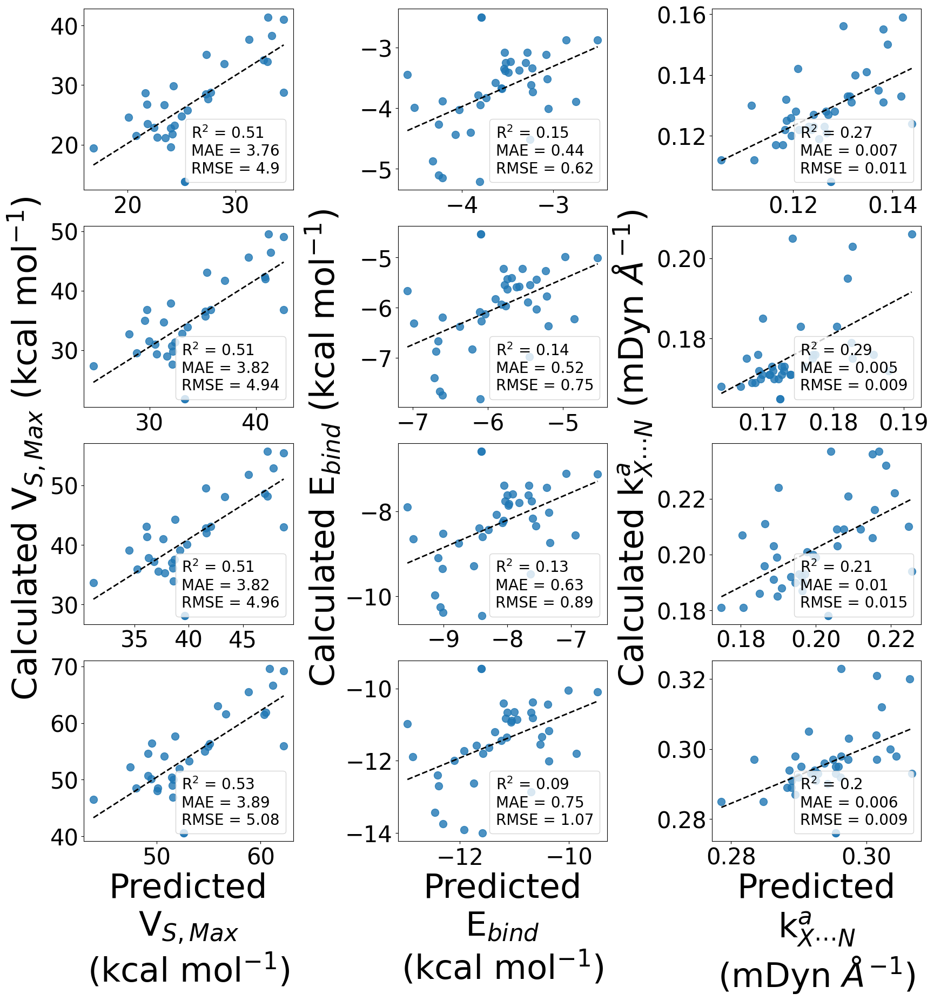

In [232]:
# RegPlot with all BX

fig, ax = plt.subplots(ncols=3,nrows=4)

## BACl == row 0
## BABr == row 1
##  BAI == row 2
## BAAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Benzene

## Chlorine

### Vmax plot

BACl_Vmax_rgplt = sns.regplot(x = BACl_svm_Vmax_MFP_pred, y = BACl_MFP_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BACl_Ebind_rgplt = sns.regplot(x = BACl_svm_Ebind_MFP_pred, y = BACl_MFP_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BACl_kXN_rgplt = sns.regplot(x = BACl_svm_kXN_MFP_pred, y = BACl_MFP_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BACl_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BACl_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BACl_svm_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BACl_svm_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BABr_Vmax_rgplt = sns.regplot(x = BABr_svm_Vmax_MFP_pred, y = BABr_MFP_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BABr_Ebind_rgplt = sns.regplot(x = BABr_svm_Ebind_MFP_pred, y = BABr_MFP_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BABr_kXN_rgplt = sns.regplot(x = BABr_svm_kXN_MFP_pred, y = BABr_MFP_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BABr_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BABr_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BABr_svm_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BABr_svm_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BAI_Vmax_rgplt = sns.regplot(x = BAI_svm_Vmax_MFP_pred, y = BAI_MFP_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAI_Ebind_rgplt = sns.regplot(x = BAI_svm_Ebind_MFP_pred, y = BAI_MFP_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAI_kXN_rgplt = sns.regplot(x = BAI_svm_kXN_MFP_pred, y = BAI_MFP_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAI_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAI_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAI_svm_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAI_svm_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAAt_Vmax_rgplt = sns.regplot(x = BAAt_svm_Vmax_MFP_pred, y = BAAt_MFP_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAAt_Ebind_rgplt = sns.regplot(x = BAAt_svm_Ebind_MFP_pred, y = BAAt_MFP_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAAt_kXN_rgplt = sns.regplot(x = BAAt_svm_kXN_MFP_pred, y = BAAt_MFP_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_svm_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAAt_svm_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BACl_BABr_BAI_BAAt_svm_MFP_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

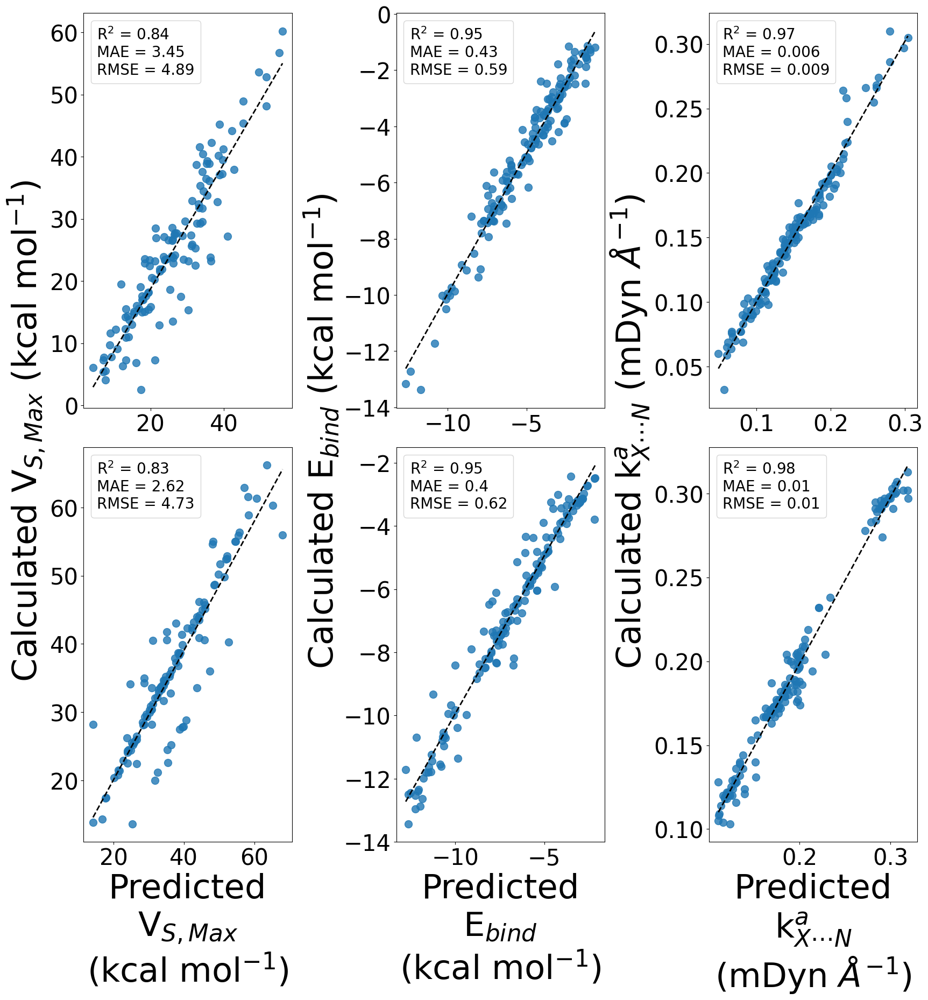

In [233]:
# RegPlot

# Benzene and Ethynyl Benzene

# All Halogen

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=2)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})


## Benzene

### Vmax plot

BX_Vmax_rgplt = sns.regplot(x = BX_svm_Vmax_MFP_pred, y = BX_MFP_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BX_Ebind_rgplt = sns.regplot(x = BX_svm_Ebind_MFP_pred, y = BX_MFP_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BX_kXN_rgplt = sns.regplot(x = BX_svm_kXN_MFP_pred, y = BX_MFP_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_xlabel('')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BX_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BX_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BX_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BX_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BX_svm_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BX_svm_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)


## Ethynyl Benzene

## Vmax plot

BAX_Vmax_rgplt = sns.regplot(x = BAX_svm_Vmax_MFP_pred, y = BAX_MFP_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BAX_Ebind_rgplt = sns.regplot(x = BAX_svm_Ebind_MFP_pred, y = BAX_MFP_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BAX_kXN_rgplt = sns.regplot(x = BAX_svm_kXN_MFP_pred, y = BAX_MFP_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('\t\t\t\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('\t\t\t\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('\t\t\t\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAX_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAX_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAX_svm_MFP_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_svm_MFP_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### provide spacing

#### width space

fig.subplots_adjust(wspace=0.5)

#### height space

fig.subplots_adjust(hspace=0.1)

### save figure

plt.savefig("Figures/BX_BAX_svm_MFP_regplot.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

###### Data Based Approach

In [115]:
# Support Vector Machines -- Data Based Approach

# Ethynyl Benzene

## Chlorine

### Vmax
BACl_svm_Vmax = NuSVR(kernel="linear").fit(BACl_Vmax_X_train, BACl_Vmax_Y_train)

### Ebind
BACl_svm_Ebind = NuSVR(kernel="linear").fit(BACl_Ebind_X_train, BACl_Ebind_Y_train)

### kXN
BACl_svm_kXN = NuSVR(kernel="linear").fit(BACl_kXN_X_train, BACl_kXN_Y_train)

## Bromine

### Vmax
BABr_svm_Vmax = NuSVR(kernel="linear").fit(BABr_Vmax_X_train, BABr_Vmax_Y_train)

### Ebind
BABr_svm_Ebind = NuSVR(kernel="linear").fit(BABr_Ebind_X_train, BABr_Ebind_Y_train)

### kXN
BABr_svm_kXN = NuSVR(kernel="linear").fit(BABr_kXN_X_train, BABr_kXN_Y_train)

## Iodine

### Vmax
BAI_svm_Vmax = NuSVR(kernel="linear").fit(BAI_Vmax_X_train, BAI_Vmax_Y_train)

### Ebind
BAI_svm_Ebind = NuSVR(kernel="linear").fit(BAI_Ebind_X_train, BAI_Ebind_Y_train)

### kXN
BAI_svm_kXN = NuSVR(kernel="linear").fit(BAI_kXN_X_train, BAI_kXN_Y_train)

## Astatine

### Vmax
BAAt_svm_Vmax = NuSVR(kernel="linear").fit(BAAt_Vmax_X_train, BAAt_Vmax_Y_train)

### Ebind
BAAt_svm_Ebind = NuSVR(kernel="linear").fit(BAAt_Ebind_X_train, BAAt_Ebind_Y_train)

### kXN
BAAt_svm_kXN = NuSVR(kernel="linear").fit(BAAt_kXN_X_train, BAAt_kXN_Y_train)

## All Halogen

### Vmax
BAX_svm_Vmax = NuSVR(kernel="linear").fit(BAX_Vmax_X_train, BAX_Vmax_Y_train)

### Ebind
BAX_svm_Ebind = NuSVR(kernel="linear").fit(BAX_Ebind_X_train, BAX_Ebind_Y_train)

### kXN
BAX_svm_kXN = NuSVR(kernel="linear").fit(BAX_kXN_X_train, BAX_kXN_Y_train)

In [116]:
# SVM Predictions

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_svm_Vmax_pred = BACl_svm_Vmax.predict(BACl_Vmax_X_test)

### Ebind

BACl_svm_Ebind_pred = BACl_svm_Ebind.predict(BACl_Ebind_X_test)

### kXN

BACl_svm_kXN_pred = BACl_svm_kXN.predict(BACl_kXN_X_test)

## Bromine

### Vmax

BABr_svm_Vmax_pred = BABr_svm_Vmax.predict(BABr_Vmax_X_test)

### Ebind

BABr_svm_Ebind_pred = BABr_svm_Ebind.predict(BABr_Ebind_X_test)

### kXN

BABr_svm_kXN_pred = BABr_svm_kXN.predict(BABr_kXN_X_test)

## Iodine

### Vmax

BAI_svm_Vmax_pred = BAI_svm_Vmax.predict(BAI_Vmax_X_test)

### Ebind

BAI_svm_Ebind_pred = BAI_svm_Ebind.predict(BAI_Ebind_X_test)

### kXN

BAI_svm_kXN_pred = BAI_svm_kXN.predict(BAI_kXN_X_test)

## Astatine

### Vmax

BAAt_svm_Vmax_pred = BAAt_svm_Vmax.predict(BAAt_Vmax_X_test)

### Ebind

BAAt_svm_Ebind_pred = BAAt_svm_Ebind.predict(BAAt_Ebind_X_test)

### kXN

BAAt_svm_kXN_pred = BAAt_svm_kXN.predict(BAAt_kXN_X_test)

## All Halogen

### Vmax

BAX_svm_Vmax_pred = BAX_svm_Vmax.predict(BAX_Vmax_X_test)

### Ebind

BAX_svm_Ebind_pred = BAX_svm_Ebind.predict(BAX_Ebind_X_test)

### kXN

BAX_svm_kXN_pred = BAX_svm_kXN.predict(BAX_kXN_X_test)

In [117]:
# Accuracy Measurements -- R^2, MAE, RMSE

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_svm_Vmax_r2 = r2_score(BACl_Vmax_Y_test, BACl_svm_Vmax_pred)
BACl_svm_Vmax_mae = mean_absolute_error(BACl_Vmax_Y_test, BACl_svm_Vmax_pred)
BACl_svm_Vmax_rmse = mean_squared_error(BACl_Vmax_Y_test, BACl_svm_Vmax_pred, squared=False)

### Ebind

BACl_svm_Ebind_r2 = r2_score(BACl_Ebind_Y_test, BACl_svm_Ebind_pred)
BACl_svm_Ebind_mae = mean_absolute_error(BACl_Ebind_Y_test, BACl_svm_Ebind_pred)
BACl_svm_Ebind_rmse = mean_squared_error(BACl_Ebind_Y_test, BACl_svm_Ebind_pred, squared=False)

### kXN

BACl_svm_kXN_r2 = r2_score(BACl_kXN_Y_test, BACl_svm_kXN_pred)
BACl_svm_kXN_mae = mean_absolute_error(BACl_kXN_Y_test, BACl_svm_kXN_pred)
BACl_svm_kXN_rmse = mean_squared_error(BACl_kXN_Y_test, BACl_svm_kXN_pred, squared=False)

## Bromine

### Vmax

BABr_svm_Vmax_r2 = r2_score(BABr_Vmax_Y_test, BABr_svm_Vmax_pred)
BABr_svm_Vmax_mae = mean_absolute_error(BABr_Vmax_Y_test, BABr_svm_Vmax_pred)
BABr_svm_Vmax_rmse = mean_squared_error(BABr_Vmax_Y_test, BABr_svm_Vmax_pred, squared=False)

### Ebind

BABr_svm_Ebind_r2 = r2_score(BABr_Ebind_Y_test, BABr_svm_Ebind_pred)
BABr_svm_Ebind_mae = mean_absolute_error(BABr_Ebind_Y_test, BABr_svm_Ebind_pred)
BABr_svm_Ebind_rmse = mean_squared_error(BABr_Ebind_Y_test, BABr_svm_Ebind_pred, squared=False)

### kXN

BABr_svm_kXN_r2 = r2_score(BABr_kXN_Y_test, BABr_svm_kXN_pred)
BABr_svm_kXN_mae = mean_absolute_error(BABr_kXN_Y_test, BABr_svm_kXN_pred)
BABr_svm_kXN_rmse = mean_squared_error(BABr_kXN_Y_test, BABr_svm_kXN_pred, squared=False)

## Iodine

### Vmax

BAI_svm_Vmax_r2 = r2_score(BAI_Vmax_Y_test, BAI_svm_Vmax_pred)
BAI_svm_Vmax_mae = mean_absolute_error(BAI_Vmax_Y_test, BAI_svm_Vmax_pred)
BAI_svm_Vmax_rmse = mean_squared_error(BAI_Vmax_Y_test, BAI_svm_Vmax_pred, squared=False)

### Ebind

BAI_svm_Ebind_r2 = r2_score(BAI_Ebind_Y_test, BAI_svm_Ebind_pred)
BAI_svm_Ebind_mae = mean_absolute_error(BAI_Ebind_Y_test, BAI_svm_Ebind_pred)
BAI_svm_Ebind_rmse = mean_squared_error(BAI_Ebind_Y_test, BAI_svm_Ebind_pred, squared=False)

### kXN

BAI_svm_kXN_r2 = r2_score(BAI_kXN_Y_test, BAI_svm_kXN_pred)
BAI_svm_kXN_mae = mean_absolute_error(BAI_kXN_Y_test, BAI_svm_kXN_pred)
BAI_svm_kXN_rmse = mean_squared_error(BAI_kXN_Y_test, BAI_svm_kXN_pred, squared=False)

## Astatine

### Vmax

BAAt_svm_Vmax_r2 = r2_score(BAAt_Vmax_Y_test, BAAt_svm_Vmax_pred)
BAAt_svm_Vmax_mae = mean_absolute_error(BAAt_Vmax_Y_test, BAAt_svm_Vmax_pred)
BAAt_svm_Vmax_rmse = mean_squared_error(BAAt_Vmax_Y_test, BAAt_svm_Vmax_pred, squared=False)

### Ebind

BAAt_svm_Ebind_r2 = r2_score(BAAt_Ebind_Y_test, BAAt_svm_Ebind_pred)
BAAt_svm_Ebind_mae = mean_absolute_error(BAAt_Ebind_Y_test, BAAt_svm_Ebind_pred)
BAAt_svm_Ebind_rmse = mean_squared_error(BAAt_Ebind_Y_test, BAAt_svm_Ebind_pred, squared=False)

### kXN

BAAt_svm_kXN_r2 = r2_score(BAAt_kXN_Y_test, BAAt_svm_kXN_pred)
BAAt_svm_kXN_mae = mean_absolute_error(BAAt_kXN_Y_test, BAAt_svm_kXN_pred)
BAAt_svm_kXN_rmse = mean_squared_error(BAAt_kXN_Y_test, BAAt_svm_kXN_pred, squared=False)

## All Halogen

### Vmax

BAX_svm_Vmax_r2 = r2_score(BAX_Vmax_Y_test, BAX_svm_Vmax_pred)
BAX_svm_Vmax_mae = mean_absolute_error(BAX_Vmax_Y_test, BAX_svm_Vmax_pred)
BAX_svm_Vmax_rmse = mean_squared_error(BAX_Vmax_Y_test, BAX_svm_Vmax_pred, squared=False)

### Ebind

BAX_svm_Ebind_r2 = r2_score(BAX_Ebind_Y_test, BAX_svm_Ebind_pred)
BAX_svm_Ebind_mae = mean_absolute_error(BAX_Ebind_Y_test, BAX_svm_Ebind_pred)
BAX_svm_Ebind_rmse = mean_squared_error(BAX_Ebind_Y_test, BAX_svm_Ebind_pred, squared=False)

### kXN

BAX_svm_kXN_r2 = r2_score(BAX_kXN_Y_test, BAX_svm_kXN_pred)
BAX_svm_kXN_mae = mean_absolute_error(BAX_kXN_Y_test, BAX_svm_kXN_pred)
BAX_svm_kXN_rmse = mean_squared_error(BAX_kXN_Y_test, BAX_svm_kXN_pred, squared=False)

Cross Validation

In [118]:
# Cross validation Shuffle generator

cv5 = ShuffleSplit(n_splits=5, test_size=0.2, random_state=22)

# Scoring methods
scor_lst = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']

# SVM method

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_cv_svm = NuSVR(kernel="linear")

### Ebind

BACl_Ebind_cv_svm = NuSVR(kernel="linear")

### kXN

BACl_kXN_cv_svm = NuSVR(kernel="linear")

## Bromine

### Vmax

BABr_Vmax_cv_svm = NuSVR(kernel="linear")

### Ebind

BABr_Ebind_cv_svm = NuSVR(kernel="linear")

### kXN

BABr_kXN_cv_svm = NuSVR(kernel="linear")

## Iodine

### Vmax

BAI_Vmax_cv_svm = NuSVR(kernel="linear")

### Ebind

BAI_Ebind_cv_svm = NuSVR(kernel="linear")

### kXN

BAI_kXN_cv_svm = NuSVR(kernel="linear")

## Astatine

### Vmax

BAAt_Vmax_cv_svm = NuSVR(kernel="linear")

### Ebind

BAAt_Ebind_cv_svm = NuSVR(kernel="linear")

### kXN

BAAt_kXN_cv_svm = NuSVR(kernel="linear")

## All Halogen

### Vmax

BAX_Vmax_cv_svm = NuSVR(kernel="linear")

### Ebind

BAX_Ebind_cv_svm = NuSVR(kernel="linear")

### kXN

BAX_kXN_cv_svm = NuSVR(kernel="linear")

In [119]:
# CV -- 5 fold cross validation

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_svm_cv = cross_validate(BACl_Vmax_cv_svm, BACl_Vmax_selfeat, BACl_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BACl_Ebind_svm_cv = cross_validate(BACl_Ebind_cv_svm, BACl_Ebind_selfeat, BACl_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BACl_kXN_svm_cv = cross_validate(BACl_kXN_cv_svm, BACl_kXN_selfeat, BACl_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Bromine

### Vmax

BABr_Vmax_svm_cv = cross_validate(BABr_Vmax_cv_svm, BABr_Vmax_selfeat, BABr_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BABr_Ebind_svm_cv = cross_validate(BABr_Ebind_cv_svm, BABr_Ebind_selfeat, BABr_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BABr_kXN_svm_cv = cross_validate(BABr_kXN_cv_svm, BABr_kXN_selfeat, BABr_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Iodine

### Vmax

BAI_Vmax_svm_cv = cross_validate(BAI_Vmax_cv_svm, BAI_Vmax_selfeat, BAI_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAI_Ebind_svm_cv = cross_validate(BAI_Ebind_cv_svm, BAI_Ebind_selfeat, BAI_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAI_kXN_svm_cv = cross_validate(BAI_kXN_cv_svm, BAI_kXN_selfeat, BAI_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## Astatine

### Vmax

BAAt_Vmax_svm_cv = cross_validate(BAAt_Vmax_cv_svm, BAAt_Vmax_selfeat, BAAt_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAAt_Ebind_svm_cv = cross_validate(BAAt_Ebind_cv_svm, BAAt_Ebind_selfeat, BAAt_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAAt_kXN_svm_cv = cross_validate(BAAt_kXN_cv_svm, BAAt_kXN_selfeat, BAAt_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

## All Halogen

### Vmax

BAX_Vmax_svm_cv = cross_validate(BAX_Vmax_cv_svm, BAX_Vmax_selfeat, BAX_Vmax_targ['V$_{S}$$_{max}$'], 
                                   scoring = scor_lst, cv = cv5)

### Ebind

BAX_Ebind_svm_cv = cross_validate(BAX_Ebind_cv_svm, BAX_Ebind_selfeat, BAX_Ebind_targ['E$_{bind}$'], 
                                   scoring = scor_lst, cv = cv5)

### kXN

BAX_kXN_svm_cv = cross_validate(BAX_kXN_cv_svm, BAX_kXN_selfeat, BAX_kXN_targ['k$^{a}_{X\\cdots N}$'], 
                                   scoring = scor_lst, cv = cv5)

In [120]:
# CV Scores

# Ethynyl Benzene

## Chlorine

### Vmax

BACl_Vmax_svm_cv_res_lst = [
    round(np.mean(BACl_Vmax_svm_cv['test_r2']), 2), 
    round(np.mean(-BACl_Vmax_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Vmax_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BACl_Ebind_svm_cv_res_lst = [
    round(np.mean(BACl_Ebind_svm_cv['test_r2']), 2), 
    round(np.mean(-BACl_Ebind_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BACl_Ebind_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BACl_kXN_svm_cv_res_lst = [
    round(np.mean(BACl_kXN_svm_cv['test_r2']), 2), 
    round(np.mean(-BACl_kXN_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BACl_kXN_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Bromine

### Vmax

BABr_Vmax_svm_cv_res_lst = [
    round(np.mean(BABr_Vmax_svm_cv['test_r2']), 2), 
    round(np.mean(-BABr_Vmax_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Vmax_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BABr_Ebind_svm_cv_res_lst = [
    round(np.mean(BABr_Ebind_svm_cv['test_r2']), 2), 
    round(np.mean(-BABr_Ebind_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BABr_Ebind_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BABr_kXN_svm_cv_res_lst = [
    round(np.mean(BABr_kXN_svm_cv['test_r2']), 2), 
    round(np.mean(-BABr_kXN_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BABr_kXN_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Iodine

### Vmax

BAI_Vmax_svm_cv_res_lst = [
    round(np.mean(BAI_Vmax_svm_cv['test_r2']), 2), 
    round(np.mean(-BAI_Vmax_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Vmax_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAI_Ebind_svm_cv_res_lst = [
    round(np.mean(BAI_Ebind_svm_cv['test_r2']), 2), 
    round(np.mean(-BAI_Ebind_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAI_Ebind_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAI_kXN_svm_cv_res_lst = [
    round(np.mean(BAI_kXN_svm_cv['test_r2']), 2), 
    round(np.mean(-BAI_kXN_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAI_kXN_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## Astatine

### Vmax

BAAt_Vmax_svm_cv_res_lst = [
    round(np.mean(BAAt_Vmax_svm_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Vmax_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Vmax_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAAt_Ebind_svm_cv_res_lst = [
    round(np.mean(BAAt_Ebind_svm_cv['test_r2']), 2), 
    round(np.mean(-BAAt_Ebind_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAAt_Ebind_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAAt_kXN_svm_cv_res_lst = [
    round(np.mean(BAAt_kXN_svm_cv['test_r2']), 2), 
    round(np.mean(-BAAt_kXN_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAAt_kXN_svm_cv['test_neg_root_mean_squared_error']), 3)
]

## All Halogen

### Vmax

BAX_Vmax_svm_cv_res_lst = [
    round(np.mean(BAX_Vmax_svm_cv['test_r2']), 2), 
    round(np.mean(-BAX_Vmax_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Vmax_svm_cv['test_neg_root_mean_squared_error']), 2)
]

## Ebind

BAX_Ebind_svm_cv_res_lst = [
    round(np.mean(BAX_Ebind_svm_cv['test_r2']), 2), 
    round(np.mean(-BAX_Ebind_svm_cv['test_neg_mean_absolute_error']), 2),
    round(np.mean(-BAX_Ebind_svm_cv['test_neg_root_mean_squared_error']), 2)
]

### kXN

BAX_kXN_svm_cv_res_lst = [
    round(np.mean(BAX_kXN_svm_cv['test_r2']), 2), 
    round(np.mean(-BAX_kXN_svm_cv['test_neg_mean_absolute_error']), 3),
    round(np.mean(-BAX_kXN_svm_cv['test_neg_root_mean_squared_error']), 3)
]

In [121]:
# Create CV metrics Dataframe

# SVM

# Ethynyl Benzene

# constructing dictionary for data

## Vmax

BAX_CV_svm_Vmax_dict = {'BACl': BACl_Vmax_svm_cv_res_lst, 'BABr': BABr_Vmax_svm_cv_res_lst, 
                     'BAI': BAI_Vmax_svm_cv_res_lst, 'BAAt': BAAt_Vmax_svm_cv_res_lst, 
                      'BAX': BAX_Vmax_svm_cv_res_lst}

BAX_CV_svm_Vmax_df = pd.DataFrame(data = BAX_CV_svm_Vmax_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## Ebind

BAX_CV_svm_Ebind_dict = {'BACl': BACl_Ebind_svm_cv_res_lst, 'BABr': BABr_Ebind_svm_cv_res_lst, 
                     'BAI': BAI_Ebind_svm_cv_res_lst, 'BAAt': BAAt_Ebind_svm_cv_res_lst, 
                      'BAX': BAX_Ebind_svm_cv_res_lst}

BAX_CV_svm_Ebind_df = pd.DataFrame(data = BAX_CV_svm_Ebind_dict, index = ['R$^2$', 'MAE', 'RMSE'])

## kXN

BAX_CV_svm_kXN_dict = {'BACl': BACl_kXN_svm_cv_res_lst, 'BABr': BABr_kXN_svm_cv_res_lst, 
                     'BAI': BAI_kXN_svm_cv_res_lst, 'BAAt': BAAt_kXN_svm_cv_res_lst, 
                      'BAX': BAX_kXN_svm_cv_res_lst}

BAX_CV_svm_kXN_df = pd.DataFrame(data = BAX_CV_svm_kXN_dict, index = ['R$^2$', 'MAE', 'RMSE'])

# Save dataframes to csv file

BAX_CV_svm_Vmax_df.to_csv('CV_results/BAX_svm_cv_Vmax_metric_results.csv')
BAX_CV_svm_Ebind_df.to_csv('CV_results/BAX_svm_cv_Ebind_metric_results.csv')
BAX_CV_svm_kXN_df.to_csv('CV_results/BAX_svm_cv_kXN_metric_results.csv')

Regplot

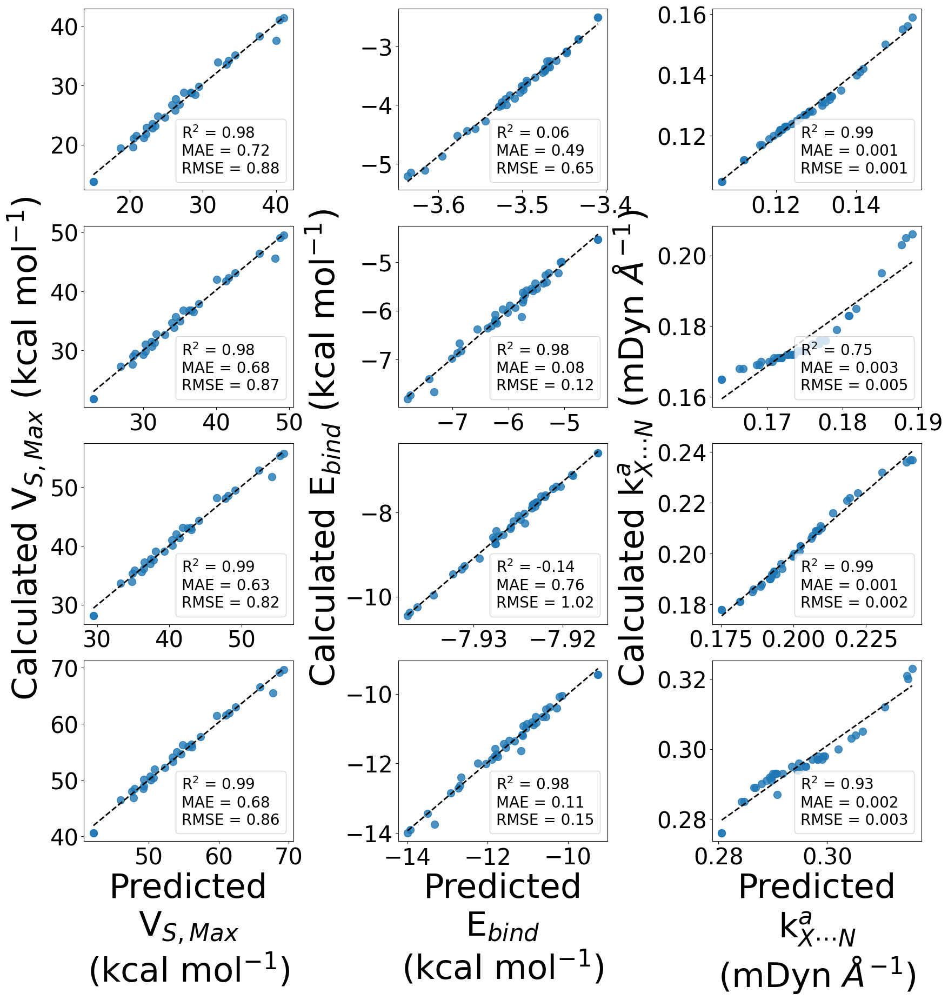

In [241]:
# RegPlot with all BX

fig, ax = plt.subplots(ncols=3,nrows=4)

## BACl == row 0
## BABr == row 1
##  BAI == row 2
## BAAt == row 3

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# Ethynyl Benzene

## Chlorine

### Vmax plot

BACl_Vmax_rgplt = sns.regplot(x = BACl_svm_Vmax_pred, y = BACl_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BACl_Ebind_rgplt = sns.regplot(x = BACl_svm_Ebind_pred, y = BACl_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BACl_kXN_rgplt = sns.regplot(x = BACl_svm_kXN_pred, y = BACl_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_svm_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BACl_svm_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_svm_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_svm_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BACl_svm_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BACl_svm_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BACl_svm_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BACl_svm_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BACl_svm_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Bromine

### Vmax plot

BABr_Vmax_rgplt = sns.regplot(x = BABr_svm_Vmax_pred, y = BABr_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BABr_Ebind_rgplt = sns.regplot(x = BABr_svm_Ebind_pred, y = BABr_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BABr_kXN_rgplt = sns.regplot(x = BABr_svm_kXN_pred, y = BABr_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('')

### Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('')

### kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_svm_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BABr_svm_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_svm_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_svm_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BABr_svm_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BABr_svm_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BABr_svm_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BABr_svm_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BABr_svm_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Iodine

BAI_Vmax_rgplt = sns.regplot(x = BAI_svm_Vmax_pred, y = BAI_Vmax_Y_test, ax = ax[2,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAI_Ebind_rgplt = sns.regplot(x = BAI_svm_Ebind_pred, y = BAI_Ebind_Y_test, ax = ax[2,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAI_kXN_rgplt = sns.regplot(x = BAI_svm_kXN_pred, y = BAI_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('')
ax[2,0].set_ylabel('\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

### Ebind

# ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('')
ax[2,1].set_ylabel('\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

### kXN

# ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('')
ax[2,2].set_ylabel('\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_svm_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAI_svm_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_svm_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_svm_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAI_svm_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAI_svm_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAI_svm_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAI_svm_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAI_svm_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Astatine

### Vmax plot

BAAt_Vmax_rgplt = sns.regplot(x = BAAt_svm_Vmax_pred, y = BAAt_Vmax_Y_test, ax = ax[3,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BAAt_Ebind_rgplt = sns.regplot(x = BAAt_svm_Ebind_pred, y = BAAt_Ebind_Y_test, ax = ax[3,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BAAt_kXN_rgplt = sns.regplot(x = BAAt_svm_kXN_pred, y = BAAt_kXN_Y_test, ax = ax[3,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

### Vmax

ax[3,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[3,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[3,0].set_ylabel('')

### Ebind

ax[3,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[3,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[3,1].set_ylabel('')

### kXN

ax[3,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[3,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[3,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[3,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_svm_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_svm_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_svm_Vmax_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[3,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_svm_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_svm_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAAt_svm_Ebind_rmse, 2)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[3,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAAt_svm_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAAt_svm_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BAAt_svm_kXN_rmse, 3)}"], 
               ncol=1, loc='lower right', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

#### provide spacing

###### Width
fig.subplots_adjust(wspace=0.5)
###### Height
fig.subplots_adjust(hspace=0.2)


#### save figure

plt.savefig("Figures/BACl_BABr_BAI_BAAt_svm_regplots.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

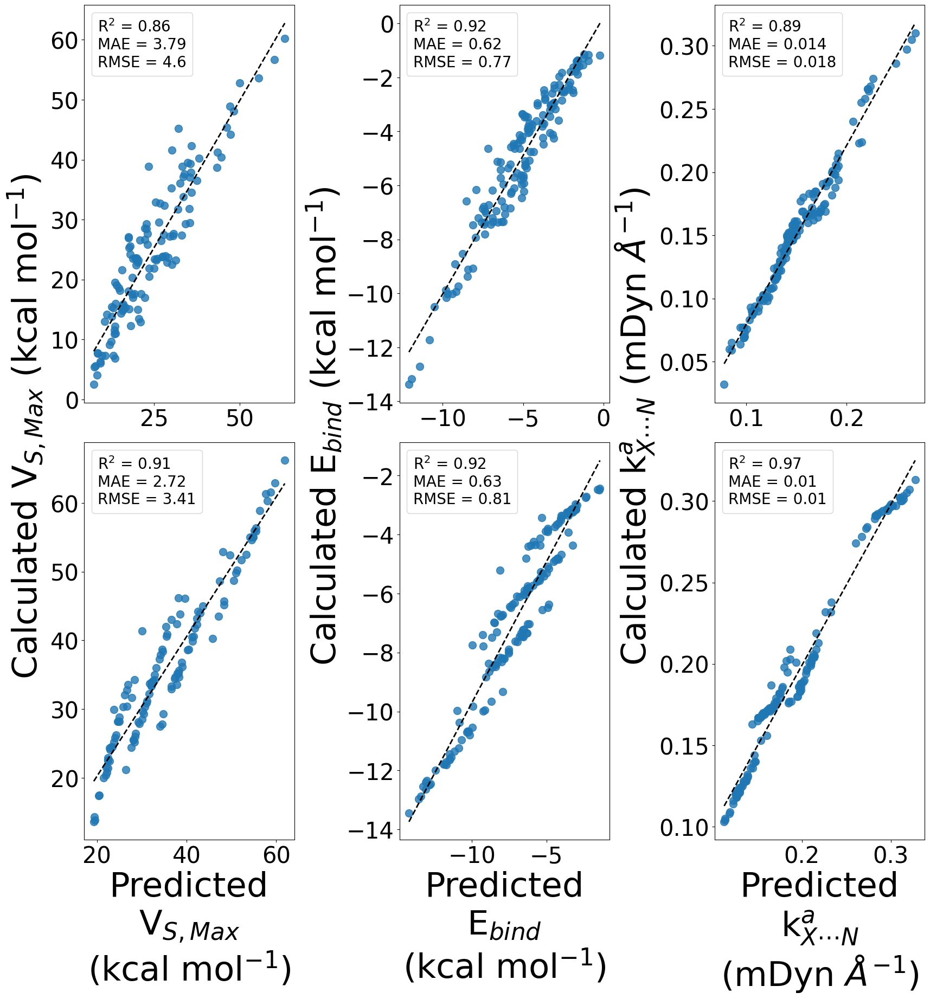

In [242]:
# RegPlot

# Benzene and Ethynyl Benzene

# All Halogen

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=2)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})


## Benzene

### Vmax plot

BX_Vmax_rgplt = sns.regplot(x = BX_svm_Vmax_pred, y = BX_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### Ebind plot

BX_Ebind_rgplt = sns.regplot(x = BX_svm_Ebind_pred, y = BX_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### kXN plot

BX_kXN_rgplt = sns.regplot(x = BX_svm_kXN_pred, y = BX_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

#### set labels for each plot

### Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('')

### Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')

### kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_xlabel('')
ax[0,2].set_ylabel('')

#### set legends for each plot with the R2 MAE and RMSE values

### Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_svm_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BX_svm_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BX_svm_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_svm_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BX_svm_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BX_svm_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BX_svm_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BX_svm_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(BX_svm_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)


## Ethynyl Benzene

## Vmax plot

BAX_Vmax_rgplt = sns.regplot(x = BAX_svm_Vmax_pred, y = BAX_Vmax_Y_test, ax = ax[1,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

BAX_Ebind_rgplt = sns.regplot(x = BAX_svm_Ebind_pred, y = BAX_Ebind_Y_test, ax = ax[1,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

BAX_kXN_rgplt = sns.regplot(x = BAX_svm_kXN_pred, y = BAX_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_ylabel('\t\t\t\t\tCalculated V$_{S,Max}$ (kcal mol$^{-1}$)')

## Ebind

ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_ylabel('\t\t\t\t\tCalculated E$_{bind}$ (kcal mol$^{-1}$)')

## kXN

ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('\t\t\t\t\tCalculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_svm_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(BAX_svm_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_svm_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_svm_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(BAX_svm_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_svm_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(BAX_svm_kXN_r2, 2)}\n" + 
                     f"MAE = {round(BAX_svm_kXN_mae, 2)}\n" + 
                     f"RMSE = {round(BAX_svm_kXN_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

### provide spacing

#### width space

fig.subplots_adjust(wspace=0.5)

#### height space

fig.subplots_adjust(hspace=0.1)

### save figure

plt.savefig("Figures/BX_BAX_svm_regplot.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()

#### All XB Donor Regplot

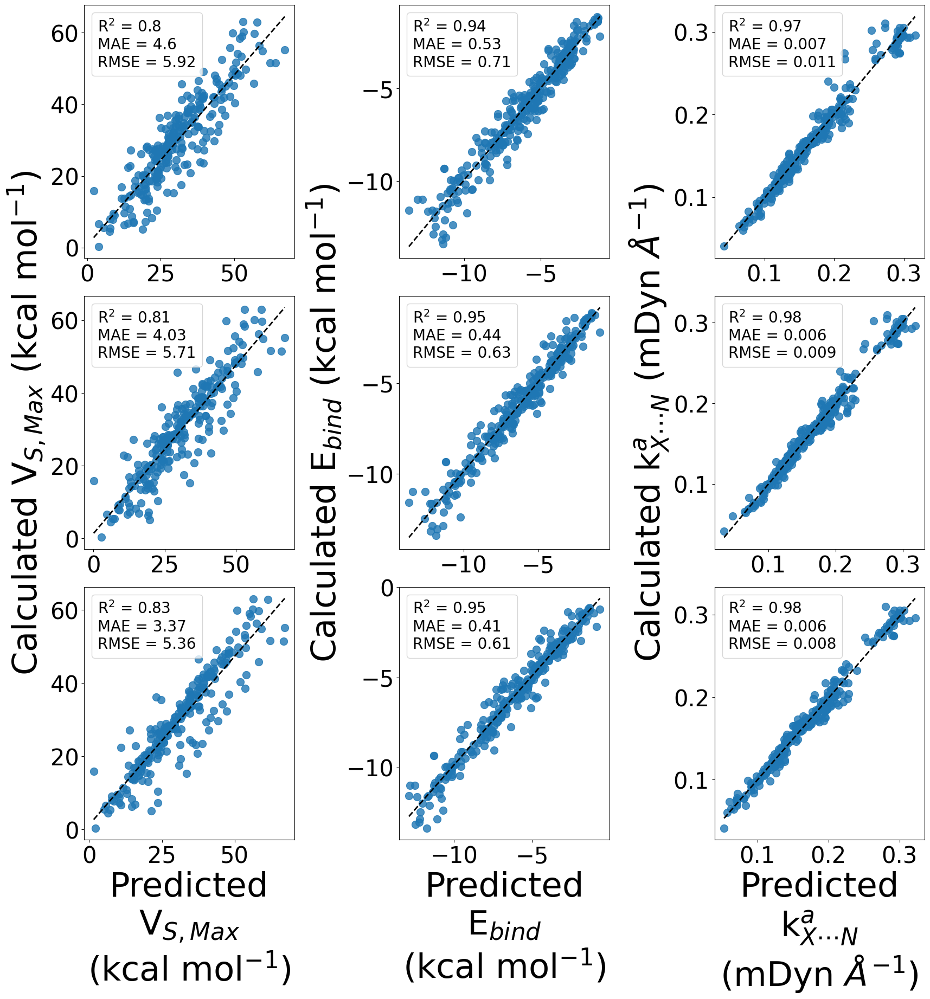

In [243]:
# RegPlot

# Benzene and Ethynyl Benzene

# All Halogen bond donors

##### Define subplot and figure parameters

fig, ax = plt.subplots(ncols=3,nrows=3)

sns.set_context(rc={"axes.labelsize":45,
                    "xtick.labelsize": 30, 
                    "ytick.labelsize": 30})

# RF

## Vmax plot

All_XB_Vmax_rgplt = sns.regplot(x = All_XB_RF_Vmax_MFP_pred, y = All_XB_MFP_Vmax_Y_test, ax = ax[0,0], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## Ebind plot

All_XB_Ebind_rgplt = sns.regplot(x = All_XB_RF_Ebind_MFP_pred, y = All_XB_MFP_Ebind_Y_test, ax = ax[0,1], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

## kXN plot

All_XB_kXN_rgplt = sns.regplot(x = All_XB_RF_kXN_MFP_pred, y = All_XB_MFP_kXN_Y_test, ax = ax[0,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

# ax[0,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[0,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('')

## Ebind

# ax[0,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[0,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')

## kXN

# ax[0,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[0,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[0,2].set_xlabel('')
ax[0,2].set_ylabel('')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[0,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_RF_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_RF_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(All_XB_RF_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Ebind

ax[0,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_RF_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_RF_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(All_XB_RF_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## kXN

ax[0,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_RF_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_RF_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(All_XB_RF_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)


# XGBoost

## Vmax plot

All_XB_Vmax_xgb_rgplt = sns.regplot(x = All_XB_xgb_Vmax_MFP_pred, y = All_XB_MFP_Vmax_Y_test, 
                                    ax = ax[1,0], scatter=True, fit_reg = True, ci = None, 
                                    line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                                    scatter_kws = {"s": 100})

## Ebind plot

All_XB_Ebind_xgb_rgplt = sns.regplot(x = All_XB_xgb_Ebind_MFP_pred, y = All_XB_MFP_Ebind_Y_test, 
                                     ax = ax[1,1], scatter=True, fit_reg = True, ci = None, 
                                     line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                                     scatter_kws = {"s": 100})

## kXN plot

All_XB_kXN_xgb_rgplt = sns.regplot(x = All_XB_xgb_kXN_MFP_pred, y = All_XB_MFP_kXN_Y_test, ax = ax[1,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

# ax[1,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
ax[1,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[1,0].set_xlabel('')

## Ebind

# ax[1,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
ax[1,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[1,1].set_xlabel('')

## kXN

# ax[1,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
ax[1,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[1,2].set_xlabel('')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[1,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_xgb_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_xgb_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(All_XB_xgb_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Ebind

ax[1,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_xgb_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_xgb_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(All_XB_xgb_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## kXN

ax[1,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_xgb_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_xgb_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(All_XB_xgb_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)


# SVM


## Vmax plot

All_XB_Vmax_svm_rgplt = sns.regplot(x = All_XB_svm_Vmax_MFP_pred, y = All_XB_MFP_Vmax_Y_test, 
                                    ax = ax[2,0], scatter=True, fit_reg = True, ci = None, 
                                    line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                                    scatter_kws = {"s": 100})

## Ebind plot

All_XB_Ebind_svm_rgplt = sns.regplot(x = All_XB_svm_Ebind_MFP_pred, y = All_XB_MFP_Ebind_Y_test, 
                                     ax = ax[2,1], scatter=True, fit_reg = True, ci = None, 
                                     line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                                     scatter_kws = {"s": 100})

## kXN plot

All_XB_kXN_svm_rgplt = sns.regplot(x = All_XB_svm_kXN_MFP_pred, y = All_XB_MFP_kXN_Y_test, ax = ax[2,2], 
                             scatter=True, fit_reg = True, ci = None, 
                             line_kws = {"lw": 2, "ls": "--", "color": "black"}, 
                             scatter_kws = {"s": 100})

### set labels for each plot

## Vmax

ax[2,0].set_xlabel('Predicted\nV$_{S,Max}$\n(kcal mol$^{-1}$)')
# ax[2,0].set_ylabel('Calculated V$_{S,Max}$ (kcal mol$^{-1}$)')
ax[2,0].set_ylabel('')

## Ebind

ax[2,1].set_xlabel('Predicted\nE$_{bind}$\n(kcal mol$^{-1}$)')
# ax[2,1].set_ylabel('Calculated E$_{bind}$ (kcal mol$^{-1}$)')
ax[2,1].set_ylabel('')

## kXN

ax[2,2].set_xlabel('Predicted\nk$^{a}_{X\cdots N}$\n(mDyn $\AA^{-1}$)')
# ax[2,2].set_ylabel('Calculated k$^{a}_{X\cdots N}$ (mDyn $\AA^{-1}$)')
ax[2,2].set_ylabel('')

### set legends for each plot with the R2 MAE and RMSE values

## Vmax

ax[2,0].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_svm_MFP_Vmax_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_svm_MFP_Vmax_mae, 2)}\n" + 
                     f"RMSE = {round(All_XB_svm_MFP_Vmax_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## Ebind

ax[2,1].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_svm_MFP_Ebind_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_svm_MFP_Ebind_mae, 2)}\n" + 
                     f"RMSE = {round(All_XB_svm_MFP_Ebind_rmse, 2)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)

## kXN

ax[2,2].legend(prop={"size": 20}, 
             labels=[f"R$^2$ = {round(All_XB_svm_MFP_kXN_r2, 2)}\n" + 
                     f"MAE = {round(All_XB_svm_MFP_kXN_mae, 3)}\n" + 
                     f"RMSE = {round(All_XB_svm_MFP_kXN_rmse, 3)}"], 
               ncol=1, loc='upper left', handlelength = 0, 
               handletextpad = 0.0, markerscale = 0)


### provide spacing

#### width spacing

fig.subplots_adjust(wspace=0.5)

#### height spacing

fig.subplots_adjust(hspace=0.15)

### save figure

plt.savefig("Figures/All_XB_RF_xgb_svm_MFP_regplot.pdf",format='pdf',
            bbox_inches='tight',transparent=True,dpi=600)

plt.show()